#Imports

In [ ]:
# see how the value distribution is in relation to the imbalanced and undersampled bases
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.font_manager as fm
import matplotlib as mpl
import matplotlib
from matplotlib import rc, font_manager

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)
path = 'PATH_TO_DATASET_IN_DRIVE'

Mounted at /content/gdrive/


In [ ]:
def verify_unnamed_in_base(base):
  if base.columns[0] == 'Unnamed: 0': # verifying if the first collumn is bugged
    base.drop(labels=['Unnamed: 0'], axis=1, inplace=True)
  return base

In [ ]:
def return_bases_rus_sbc(type_undersampling, base_type, model_type, model_type_class):
  if base_type == 'base_total':
    try:
        best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
    except:
      best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'.csv', sep=',')

    if type_undersampling == 'random_under':
      try:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_NORMALIZADO_MODELO.csv', sep=',')
      except:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_NORMALIZADO_MODELO.csv', sep=',')
    elif type_undersampling == 'sbc':
      try:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_undersampling+'.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_MODELO.csv', sep=',')
      except:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_NORMALIZADO_MODELO.csv', sep=',')

    best_base = verify_unnamed_in_base(best_base)
    best_results = verify_unnamed_in_base(best_results)
    best_grid = verify_unnamed_in_base(best_grid)
  elif base_type == 'base_reduzida':
    try:
      best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO.csv', sep=',')
    except:
      best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_RECORTE_FEITO.csv', sep=',')

    if type_undersampling == 'random_under':
      try:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')
      except:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')
    elif type_undersampling == 'sbc':
      try:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')
      except:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_undersampling+'_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')

    #xgboost_base_moda_sbc_sbc_RECORTE_FEITO_NORMALIZADO_sbc_NORMALIZADO
    best_base = verify_unnamed_in_base(best_base)
    best_results = verify_unnamed_in_base(best_results)
    best_grid = verify_unnamed_in_base(best_grid)

  return best_base, best_results, best_grid

In [ ]:
def get_best_auc_roc_near_miss(type_near_miss, base_type, model_type, type_undersampling):
  neighbors = [3, 5, 7, 9, 11]
  if base_type == 'base_total':
    if (type_near_miss == '1') or (type_near_miss == '2'): 
      try: # first loop to get results and compare with others
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k1_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
      except:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k1_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

      auc_roc_max = best_results['AUC ROC'][0]
      k_of_auc_roc_max = 1
      base_with_bigger_auc_roc = best_results.copy()
      best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k1_NORMALIZADO.csv', sep=',')
      best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k1_NORMALIZADO_MODELO.csv', sep=',')

      for n in neighbors:
        try:
          best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        except:
          best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

        if ((best_results['AUC ROC'][0]) > auc_roc_max):
          auc_roc_max = best_results['AUC ROC'][0]
          k_of_auc_roc_max = n # getting k
          base_with_bigger_auc_roc = best_results.copy() # getting base
          best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_NORMALIZADO.csv', sep=',')
          best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_NORMALIZADO_MODELO.csv', sep=',')

        #print(best_results['AUC ROC'][0])
    elif type_near_miss == '3': 
      try: # first loop to get results and compare with others
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
      except:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

      auc_roc_max = best_results['AUC ROC'][0]
      k_1_of_auc_roc_max = 1
      k_2_of_auc_roc_max = 3
      base_with_bigger_auc_roc = best_results.copy()
      best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_NORMALIZADO.csv', sep=',')
      best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_NORMALIZADO_MODELO.csv', sep=',')

      k_of_auc_roc_max = {
          'k1': k_1_of_auc_roc_max,
          'k2': k_2_of_auc_roc_max
      }

      neighbors_2 = [1, 3, 5, 7, 9, 11]

      for n in neighbors_2:
        for n2 in neighbors_2:
          if n2 > n:
            try:
              best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
            except:
              best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

            if ((best_results['AUC ROC'][0]) > auc_roc_max):
              auc_roc_max = best_results['AUC ROC'][0]
              k_of_auc_roc_max = {
                  'k1': n,
                  'k2': n2
              }
              base_with_bigger_auc_roc = best_results.copy() # pegando a base
              best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_NORMALIZADO.csv', sep=',')
              best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_NORMALIZADO_MODELO.csv', sep=',')
  elif base_type == 'base_reduzida':
    if (type_near_miss == '1') or (type_near_miss == '2'):
      best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k1_RECORTE_FEITO_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

      auc_roc_max = best_results['AUC ROC'][0]
      k_of_auc_roc_max = 1
      base_with_bigger_auc_roc = best_results.copy()
      best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k1_RECORTE_FEITO_NORMALIZADO.csv', sep=',')
      best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k1_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')

      for n in neighbors:
        try:
          best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_RECORTE_FEITO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
        except:
          best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_RECORTE_FEITO_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

        if ((best_results['AUC ROC'][0]) > auc_roc_max):
          auc_roc_max = best_results['AUC ROC'][0]
          k_of_auc_roc_max = n # pegando o k
          base_with_bigger_auc_roc = best_results.copy() # pegando a base
          best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_RECORTE_FEITO_NORMALIZADO.csv', sep=',')
          best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+'_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')

        #print(best_results['AUC ROC'][0])
    elif type_near_miss == '3':
      try: # first loop to get results and compare with others
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_RECORTE_FEITO'+type_undersampling+'_NORMALIZADO.csv', sep=',')
      except:
        best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_RECORTE_FEITO_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

      auc_roc_max = best_results['AUC ROC'][0]
      k_1_of_auc_roc_max = 1
      k_2_of_auc_roc_max = 3
      base_with_bigger_auc_roc = best_results.copy()
      best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_RECORTE_FEITO_NORMALIZADO.csv', sep=',')
      best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k13_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')

      k_of_auc_roc_max = {
          'k1': k_1_of_auc_roc_max,
          'k2': k_2_of_auc_roc_max
      }

      neighbors_2 = [1, 3, 5, 7, 9, 11]

      for n in neighbors_2:
        for n2 in neighbors_2:
          if n2 > n:
            try:
              best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_RECORTE_FEITO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')
            except:
              best_results = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_RECORTE_FEITO_NORMALIZADO_'+type_undersampling+'_NORMALIZADO.csv', sep=',')

            if ((best_results['AUC ROC'][0]) > auc_roc_max):
              auc_roc_max = best_results['AUC ROC'][0]
              k_of_auc_roc_max = {
                  'k1': n,
                  'k2': n2
              }
              base_with_bigger_auc_roc = best_results.copy() # pegando a base
              best_base = pd.read_csv(path+'bases-pre-proc/base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_RECORTE_FEITO_NORMALIZADO.csv', sep=',')
              best_grid = pd.read_csv(path+'resultados/'+base_type+'/'+model_type+'/best_grid/'+model_type+'_base_moda_'+type_undersampling+'_'+type_near_miss+'_k'+str(n)+str(n2)+'_RECORTE_FEITO_NORMALIZADO_MODELO.csv', sep=',')


  #print(best_base.iloc[1])
  best_base = verify_unnamed_in_base(best_base)
  base_with_bigger_auc_roc = verify_unnamed_in_base(base_with_bigger_auc_roc)
  best_grid = verify_unnamed_in_base(best_grid)

  #print(f'AUC ROC maxima: {auc_roc_max}\nK: {k_of_auc_roc_max}\nNearMiss:{type_near_miss}') # resultado final
  return best_base, base_with_bigger_auc_roc, best_grid, k_of_auc_roc_max

In [ ]:
def return_best_results_undersampling(base_t, name_model, classe_modelo):
  best_base_random_under, best_results_random_under, best_grid = return_bases_rus_sbc('random_under', base_t, name_model, classe_modelo)
  best_base_sbc, best_results_sbc, best_grid = return_bases_rus_sbc('sbc', base_t, name_model, classe_modelo)
  best_base_nm1, best_results_nm1, best_grid, k_of_auc_roc_max_nm1 = get_best_auc_roc_near_miss('1', base_t, name_model, 'near_miss')
  best_base_nm2, best_results_nm2, best_grid, k_of_auc_roc_max_nm2 = get_best_auc_roc_near_miss('2', base_t, name_model, 'near_miss')
  best_base_nm3, best_results_nm3, best_grid, k_of_auc_roc_max_nm3 = get_best_auc_roc_near_miss('3', base_t, name_model, 'near_miss')

  return best_base_random_under, best_base_sbc, best_base_nm1, best_base_nm2, best_base_nm3, k_of_auc_roc_max_nm1, k_of_auc_roc_max_nm2, k_of_auc_roc_max_nm3

In [ ]:
def getting_bases_with_best_results_by_model(): # for each model, get the base with best results
  base_t = 'base_total' 
  columns_models = {'decision_tree': DecisionTreeClassifier, 'random_forest': RandomForestClassifier,
                  'adaboost': AdaBoostClassifier, 'gbm': GradientBoostingClassifier, 
                  'knn': KNeighborsClassifier, 'svm': SVC, 'xgboost': XGBClassifier}  # to generalize and get all
  #columns_models = {'xgboost': XGBClassifier, 'knn': KNeighborsClassifier}
  #columns_models = {'xgboost': XGBClassifier}

  for name_model in columns_models.keys():
    print(name_model)
    base_imbalanced = pd.read_csv(path+'base_pre_proc_desb_imp_moda_NORMALIZADO.csv', sep=',')
    best_base_random_under, best_base_sbc, best_base_nm1, best_base_nm2, best_base_nm3, k_of_auc_roc_max_nm1, k_of_auc_roc_max_nm2, k_of_auc_roc_max_nm3 = return_best_results_undersampling(base_t, name_model, columns_models[name_model])

    generate_graphic_comparing_proportion(base_imbalanced, best_base_random_under, best_base_sbc, best_base_nm1,
                                       best_base_nm2, best_base_nm3, k_of_auc_roc_max_nm1, k_of_auc_roc_max_nm2,
                                       k_of_auc_roc_max_nm3, name_model)

In [ ]:
def return_possible_values_by_attribute(col, base_imbalanced_negatives):
  possible_values_by_attribute = []

  for key in base_imbalanced_negatives[col].value_counts(dropna=False).keys():
    possible_values_by_attribute.append(key)

  possible_values_by_attribute.sort() # the values are in crescent order

  return possible_values_by_attribute

In [ ]:
def rename_values(list_possible_values_by_attribute, col):
  if col == 'mc_cri_vdrl':
    for i in range(len(list_possible_values_by_attribute)):
      if list_possible_values_by_attribute[i] == '0.00': # remember that there are two zeros
        list_possible_values_by_attribute[i] = 'Negative'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Positive'
  elif col == 'mc_get_risco_gestacional':
    for i in range(len(list_possible_values_by_attribute)):
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Not Informed'
      elif list_possible_values_by_attribute[i] == '0.50':
        list_possible_values_by_attribute[i] = 'Usual'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'High' # ['0.00', '0.20', '0.40', '0.60', '0.80', '1.00']
  elif col == 'mc_mul_est_civil':
    for i in range(len(list_possible_values_by_attribute)): # ['0.00', '0.20', '0.40', '0.60', '0.80', '1.00']
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Single'
      elif list_possible_values_by_attribute[i] == '0.20':
        list_possible_values_by_attribute[i] = 'Married'
      elif list_possible_values_by_attribute[i] == '0.40':
        list_possible_values_by_attribute[i] = 'Widow'
      elif list_possible_values_by_attribute[i] == '0.60':
        list_possible_values_by_attribute[i] = 'Legally \nseparated'
      elif list_possible_values_by_attribute[i] == '0.80':
        list_possible_values_by_attribute[i] = 'Divorced'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Other'
  elif col == 'mc_mul_nivel_inseguranca':
    for i in range(len(list_possible_values_by_attribute)): # ['0.00', '0.17', '0.33', '0.50', '0.67', '0.83', '1.00']
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Security'
      elif list_possible_values_by_attribute[i] == '0.17':
        list_possible_values_by_attribute[i] = 'Slightly security and\nhas a child(ren)'
      elif list_possible_values_by_attribute[i] == '0.33':
        list_possible_values_by_attribute[i] = 'Moderate security and\nhas a child(ren)'
      elif list_possible_values_by_attribute[i] == '0.50':
        list_possible_values_by_attribute[i] = 'Severe security and\nhas a child(ren)'
      elif list_possible_values_by_attribute[i] == '0.67':
        list_possible_values_by_attribute[i] = 'Slightly insecurity \nwithout child(ren)'
      elif list_possible_values_by_attribute[i] == '0.83':
        list_possible_values_by_attribute[i] = 'Moderate insecurity \nwithout child(ren)'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Severe insecurity \nwithout child(ren)' # ['0.00', '0.50', '1.00']
  elif col == 'mc_mul_qtd_aborto':
    for i in range(len(list_possible_values_by_attribute)):
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Between 0 and 4'
      elif list_possible_values_by_attribute[i] == '0.50':
        list_possible_values_by_attribute[i] = 'Between 5 and 9'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Between 10 and 15'
  elif col == 'mc_mul_qtd_filhos_vivos':
    for i in range(len(list_possible_values_by_attribute)):
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Between 0 and 4'
      elif list_possible_values_by_attribute[i] == '0.50':
        list_possible_values_by_attribute[i] = 'Between 5 and 9'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Between 10 and 15'
  elif col == 'mc_mul_qtd_gest':
    for i in range(len(list_possible_values_by_attribute)):
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Between 0 and 4'
      elif list_possible_values_by_attribute[i] == '0.50':
        list_possible_values_by_attribute[i] = 'Between 5 and 9'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Between 10 and 15'
  elif col == 'mc_mul_rec_inf_plan_fam':
    for i in range(len(list_possible_values_by_attribute)):
      if list_possible_values_by_attribute[i] == '0.00': # lembrar que são dois zeros
        list_possible_values_by_attribute[i] = 'No'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Yes'
  elif col == 'mc_mul_tipo_const_casa':
    for i in range(len(list_possible_values_by_attribute)): # ['0.00', '0.20', '0.40', '0.60', '0.80', '1.00']
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Palm leaves'
      elif list_possible_values_by_attribute[i] == '0.20':
        list_possible_values_by_attribute[i] = 'Wood'
      elif list_possible_values_by_attribute[i] == '0.40':
        list_possible_values_by_attribute[i] = 'Mud and wood'
      elif list_possible_values_by_attribute[i] == '0.60':
        list_possible_values_by_attribute[i] = 'Plaster'
      elif list_possible_values_by_attribute[i] == '0.80':
        list_possible_values_by_attribute[i] = 'Brick'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Other'
  elif col == 'mc_dae_escolaridade':
    for i in range(len(list_possible_values_by_attribute)): # ['0.00', '0.12', '0.25', '0.38', '0.50', '0.62', '0.75', '0.88', '1.00']
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Illiterate'
      elif list_possible_values_by_attribute[i] == '0.12':
        list_possible_values_by_attribute[i] = 'Elementary school \n1 complete'
        #list_possible_values_by_attribute[i] = 'Elementary \nschool 1 complete'
      elif list_possible_values_by_attribute[i] == '0.25':
        list_possible_values_by_attribute[i] = 'Elementary school \n1 incomplete'
      elif list_possible_values_by_attribute[i] == '0.38':
        list_possible_values_by_attribute[i] = 'Elementary school \n2 complete'
      elif list_possible_values_by_attribute[i] == '0.50':
        list_possible_values_by_attribute[i] = 'Elementary school \n2 incomplete'
      elif list_possible_values_by_attribute[i] == '0.62':
        list_possible_values_by_attribute[i] = 'High school \ncomplete'
      elif list_possible_values_by_attribute[i] == '0.75':
        list_possible_values_by_attribute[i] = 'High school \nincomplete'
      elif list_possible_values_by_attribute[i] == '0.88':
        list_possible_values_by_attribute[i] = 'Higher education \ncomplete'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Higher education \nincomplete'
  elif col == 'mc_dae_rfa':
    for i in range(len(list_possible_values_by_attribute)): # ['0.00', '0.25', '0.50', '0.75', '1.00']
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Between 0 and less \nthan 1/4 minimum wage'
      elif list_possible_values_by_attribute[i] == '0.25':
        list_possible_values_by_attribute[i] = 'Between 1/4 and less \nthan 1/2 minimum wage'
      elif list_possible_values_by_attribute[i] == '0.50':
        list_possible_values_by_attribute[i] = 'Between 1/2 and less \nthan 1 minimum wage'
      elif list_possible_values_by_attribute[i] == '0.75':
        list_possible_values_by_attribute[i] = 'Between 1 and less \nthan 2 minimum wages'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Over 2 \nminimum wages'
  elif col == 'idade':
    for i in range(len(list_possible_values_by_attribute)):
      if list_possible_values_by_attribute[i] == '0.00':
        list_possible_values_by_attribute[i] = 'Teenage \nmother'
      elif list_possible_values_by_attribute[i] == '1.00':
        list_possible_values_by_attribute[i] = 'Adult \nmother'

  return list_possible_values_by_attribute

"def renomear_valores(lista_valores_possiveis_por_atributo, col):\n  if col == 'mc_cri_vdrl':\n    for i in range(len(lista_valores_possiveis_por_atributo)):\n      if lista_valores_possiveis_por_atributo[i] == '0.00': # lembrar que são dois zeros\n        lista_valores_possiveis_por_atributo[i] = 'Negative'\n      elif lista_valores_possiveis_por_atributo[i] == '1.00':\n        lista_valores_possiveis_por_atributo[i] = 'Positive'\n  elif col == 'mc_get_risco_gestacional':\n    for i in range(len(lista_valores_possiveis_por_atributo)):\n      if lista_valores_possiveis_por_atributo[i] == '0.00':\n        lista_valores_possiveis_por_atributo[i] = 'Not Informed'\n      elif lista_valores_possiveis_por_atributo[i] == '0.50':\n        lista_valores_possiveis_por_atributo[i] = 'Usual'\n      elif lista_valores_possiveis_por_atributo[i] == '1.00':\n        lista_valores_possiveis_por_atributo[i] = 'High' # ['0.00', '0.20', '0.40', '0.60', '0.80', '1.00']\n  elif col == 'mc_mul_est_civil':\n 

In [ ]:
def transforme_atributtes_percentage(possible_values_by_attribute, desb_vals, rus_vals, sbc_vals, nm1_vals, nm2_vals, nm3_vals):
    sum_desb_vals = 0
    sum_rus_vals = 0
    sum_sbc_vals = 0
    sum_nm1_vals = 0
    sum_nm2_vals = 0
    sum_nm3_vals = 0

    for possible_values in possible_values_by_attribute:
      sum_desb_vals = sum_desb_vals + desb_vals[possible_values] # putting the total sum of values in each attribute
      sum_rus_vals = sum_rus_vals + rus_vals[possible_values]
      sum_sbc_vals = sum_sbc_vals + sbc_vals[possible_values]
      sum_nm1_vals = sum_nm1_vals + nm1_vals[possible_values]
      sum_nm2_vals = sum_nm2_vals + nm2_vals[possible_values]
      sum_nm3_vals = sum_nm3_vals + nm3_vals[possible_values]

    #print(f'sum_desb_vals {sum_desb_vals} sum_rus_vals {sum_rus_vals} sum_sbc_vals {sum_sbc_vals} sum_nm1_vals {sum_nm1_vals}',
          #f'sum_nm2_vals {sum_nm2_vals} sum_nm3_vals {sum_nm3_vals}')

    for possible_values in possible_values_by_attribute:
      desb_vals[possible_values] = (desb_vals[possible_values])/sum_desb_vals
      rus_vals[possible_values] = (rus_vals[possible_values])/sum_rus_vals
      sbc_vals[possible_values] = (sbc_vals[possible_values])/sum_sbc_vals
      nm1_vals[possible_values] = (nm1_vals[possible_values])/sum_nm1_vals
      nm2_vals[possible_values] = (nm2_vals[possible_values])/sum_nm2_vals
      nm3_vals[possible_values] = (nm3_vals[possible_values])/sum_nm3_vals

    #print(f'desb_vals {desb_vals} rus_vals {rus_vals} sbc_vals {sbc_vals} nm1_vals {nm1_vals}',
    #      f'nm2_vals {nm2_vals} nm3_vals {nm3_vals}')

    return desb_vals, rus_vals, sbc_vals, nm1_vals, nm2_vals, nm3_vals

In [ ]:
def generate_dict_possible_values(possible_values_by_attribute, col, base_imbalanced, best_base_random_under, best_base_sbc,
                                 best_base_nm1, best_base_nm2, best_base_nm3):
  desb_vals = dict.fromkeys(possible_values_by_attribute, 0.0) # creating dicts for each base with the possible values
  rus_vals = dict.fromkeys(possible_values_by_attribute, 0.0) 
  sbc_vals = dict.fromkeys(possible_values_by_attribute, 0.0)
  nm1_vals = dict.fromkeys(possible_values_by_attribute, 0.0)
  nm2_vals = dict.fromkeys(possible_values_by_attribute, 0.0)
  nm3_vals = dict.fromkeys(possible_values_by_attribute, 0.0)

  for possible_values in possible_values_by_attribute: # for each possible value in each attribute
    if (possible_values in base_imbalanced[col].value_counts(dropna=False)) == True: # imbalanced
        desb_vals[possible_values] = base_imbalanced[col].value_counts(dropna=False)[possible_values]
    if (possible_values in best_base_random_under[col].value_counts(dropna=False)) == True: # if this base has this value, in this attribute
      rus_vals[possible_values] = best_base_random_under[col].value_counts(dropna=False)[possible_values] # if exists, fill the value
    if (possible_values in best_base_sbc[col].value_counts(dropna=False)) == True: # sbc
      sbc_vals[possible_values] = best_base_sbc[col].value_counts(dropna=False)[possible_values]
    if (possible_values in best_base_nm1[col].value_counts(dropna=False)) == True: # nm1
      nm1_vals[possible_values] = best_base_nm1[col].value_counts(dropna=False)[possible_values]
    if (possible_values in best_base_nm2[col].value_counts(dropna=False)) == True: # nm2
      nm2_vals[possible_values] = best_base_nm2[col].value_counts(dropna=False)[possible_values]
    if (possible_values in best_base_nm3[col].value_counts(dropna=False)) == True: # nm3
      nm3_vals[possible_values] = best_base_nm3[col].value_counts(dropna=False)[possible_values]
    if (possible_values in base_imbalanced[col].value_counts(dropna=False)) == True: # desbalanceada
      desb_vals[possible_values] = base_imbalanced[col].value_counts(dropna=False)[possible_values]

  #print(desb_vals)

  return desb_vals, rus_vals, sbc_vals, nm1_vals, nm2_vals, nm3_vals

In [ ]:
def return_base_by_class(classe, base_imbalanced, best_base_random_under, best_base_sbc, best_base_nm1, best_base_nm2, best_base_nm3):
  base_imbalanced_negatives = base_imbalanced[base_imbalanced['mc_cri_vdrl'] == classe] # getting only the negative class
  best_base_random_under_negatives = best_base_random_under[best_base_random_under['mc_cri_vdrl'] == classe]
  best_base_sbc_negatives = best_base_sbc[best_base_sbc['mc_cri_vdrl'] == classe]
  best_base_nm1_negatives = best_base_nm1[best_base_nm1['mc_cri_vdrl'] == classe]
  best_base_nm2_negatives = best_base_nm2[best_base_nm2['mc_cri_vdrl'] == classe]
  best_base_nm3_negatives = best_base_nm3[best_base_nm3['mc_cri_vdrl'] == classe]

  return base_imbalanced_negatives, best_base_random_under_negatives, best_base_sbc_negatives, best_base_nm1_negatives, best_base_nm2_negatives, best_base_nm3_negatives

In [ ]:
def filter_name_model(name_model):
  if name_model == 'decision_tree':
    return 'Decision Tree'
  elif name_model == 'random_forest':
    return 'Random Forest'
  elif name_model == 'adaboost':
    return 'AdaBoost'
  elif name_model == 'gbm':
    return 'GBM'
  elif name_model == 'xgboost':
    return 'XGBoost'
  elif name_model == 'svm':
    return 'SVM'
  elif name_model == 'knn':
    return 'KNN'

In [ ]:
def rename_cols(col): # translate
  if col == 'mc_get_risco_gestacional':
    return 'Is there a gestational risk?'
  elif col == 'mc_mul_est_civil':
    return 'Civil status'
  elif col == 'mc_mul_nivel_inseguranca':
    return 'Food insecurity level'
  elif col == 'mc_mul_qtd_aborto':
    return 'Number of miscarriages'
  elif col == 'mc_mul_qtd_filhos_vivos':
    return 'Number of live offspring'
  elif col == 'mc_mul_qtd_gest':
    return 'Number of gestations'
  elif col == 'mc_mul_rec_inf_plan_fam':
    return 'Received family planning information?'
  elif col == 'mc_mul_tipo_const_casa':
    return 'Type of house construction'
  elif col == 'mc_dae_escolaridade':
    return 'Education level'
  elif col == 'mc_dae_rfa':
    return 'Family income'
  elif col == 'idade':
    return 'Age'

"def rename_cols(col):\n  if col == 'mc_get_risco_gestacional':\n    return 'Is there a gestational risk?'\n  elif col == 'mc_mul_est_civil':\n    return 'Civil status'\n  elif col == 'mc_mul_nivel_inseguranca':\n    return 'Food insecurity level'\n  elif col == 'mc_mul_qtd_aborto':\n    return 'Number of miscarriages'\n  elif col == 'mc_mul_qtd_filhos_vivos':\n    return 'Number of live offspring'\n  elif col == 'mc_mul_qtd_gest':\n    return 'Number of gestations'\n  elif col == 'mc_mul_rec_inf_plan_fam':\n    return 'Received family planning information?'\n  elif col == 'mc_mul_tipo_const_casa':\n    return 'Type of house construction'\n  elif col == 'mc_dae_escolaridade':\n    return 'Education level'\n  elif col == 'mc_dae_rfa':\n    return 'Family income'\n  elif col == 'idade':\n    return 'Age' "

In [ ]:
def really_generate_graph(ind, width, col, possible_values_by_attribute, desb_vals, bal_vals, name_model, type_undersampling, color_bar):
  path_font = '/usr/share/fonts/truetype/helvetica.ttf'
  fontprop = fm.FontProperties(fname=path_font, size=12)

  bar_desb = plt.bar(ind, desb_vals.values(), width) # creating the graph bar for each attribute
  bar_bal = plt.bar(ind+width, bal_vals.values(), width, color=color_bar) 

  plt.xlabel('Possible values for the attribute', fontproperties=fontprop)
  plt.ylabel('Relative frequency by undersampling', fontproperties=fontprop)
  plt.ylim(0.0, 1.15)

  # (FORMULA) number_of_groups/2 - 0.5 = 2/2 - 0.5 = 1-0.5 = 0.5 -> fórmula do width_xticks
  width_xticks = 0.5
  list_possible_values_by_attribute = ['{:0.2f}'.format(x) for x in possible_values_by_attribute]
  list_possible_values_by_attribute = rename_values(list_possible_values_by_attribute, col)
  print(list_possible_values_by_attribute)
  #plt.xticks(ind+width_xticks*width, ['{:0.2f}'.format(x) for x in possible_values_by_attribute], rotation=45) # formatting numbers
  plt.xticks(ind+width_xticks*width, list_possible_values_by_attribute, rotation=45) # formatting numbers
  plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0)) # formatting to percentage

  for label in plt.gca().get_xticklabels():
        label.set_fontproperties(fontprop)

  for label in plt.gca().get_yticklabels():
        label.set_fontproperties(fontprop)

  plt.legend( (bar_desb, bar_bal),
  ['Original', f"{type_undersampling}"], prop=fontprop)
  titulo = f'Negative cases proportion {type_undersampling} {rename_cols(col)} ({filter_name_model(name_model)}) '

  if col == 'mc_dae_escolaridade':
    plt.gca().margins(x=0)
    plt.gcf().canvas.draw()
    tl = plt.gca().get_xticklabels()
    maxsize = max([t.get_window_extent().width for t in tl])
    m = 0.05 # inch margin
    s = maxsize/plt.gcf().dpi*len(plt.gca().get_xticklabels())+1*m
    margin = m/plt.gcf().get_size_inches()[0]

    plt.gcf().subplots_adjust(left=margin, right=1.-margin)
    plt.gcf().set_size_inches(s, plt.gcf().get_size_inches()[1])

  #plt.title(titulo)
  plt.tight_layout()
  #plt.savefig(path+f'teste-restantes/images/proporcao_casos_negatives_undersampling_v4/{titulo}.png', bbox_inches='tight') # SAVE FIGURA
  plt.savefig(path+f'teste-restantes/images/proporcao_casos_negatives_undersampling_v4_BR/{titulo}.png', bbox_inches='tight') # SAVE FIGURA
  plt.show()

In [ ]:
def generate_graphic_comparing_proportion(base_imbalanced, best_base_random_under, best_base_sbc, best_base_nm1,
                                       best_base_nm2, best_base_nm3, k_of_auc_roc_max_nm1, k_of_auc_roc_max_nm2,
                                       k_of_auc_roc_max_nm3, name_model):
  for col in base_imbalanced.columns:
    #####################
    base_imbalanced_negatives, best_base_random_under_negatives, best_base_sbc_negatives, best_base_nm1_negatives, best_base_nm2_negatives, best_base_nm3_negatives = return_base_by_class(0.0, base_imbalanced, best_base_random_under, best_base_sbc, best_base_nm1, best_base_nm2, best_base_nm3)
    # pegando a base só com os dados negatives
    possible_values_by_attribute_negatives = return_possible_values_by_attribute(col, base_imbalanced_negatives)

    N_negatives = len(possible_values_by_attribute_negatives) # get the graph index
    ind_negatives = np.arange(N_negatives)

    desb_vals_neg, rus_vals_neg, sbc_vals_neg, nm1_vals_neg, nm2_vals_neg, nm3_vals_neg = generate_dict_possible_values(possible_values_by_attribute_negatives,
                                                                                                       col, base_imbalanced_negatives,
                                                                                               best_base_random_under_negatives, best_base_sbc_negatives,
                                                                                               best_base_nm1_negatives,
                                                                                               best_base_nm2_negatives, best_base_nm3_negatives) # generating dict of values
    # making a dict only with the negative cases
    desb_vals_neg, rus_vals_neg, sbc_vals_neg, nm1_vals_neg, nm2_vals_neg, nm3_vals_neg = transforme_atributtes_percentage(possible_values_by_attribute_negatives,
                                                                                                    desb_vals_neg, rus_vals_neg,
                                                                                                    sbc_vals_neg, nm1_vals_neg, nm2_vals_neg, nm3_vals_neg)

    #####################
    possible_values_by_attribute = return_possible_values_by_attribute(col, base_imbalanced)
    #print(col, possible_values_by_attribute) # getting possible values for each value
    N = len(possible_values_by_attribute) # get the graph index
    ind = np.arange(N)
    width = 0.3

    desb_vals, rus_vals, sbc_vals, nm1_vals, nm2_vals, nm3_vals = generate_dict_possible_values(possible_values_by_attribute, col, base_imbalanced,
                                                                                               best_base_random_under, best_base_sbc, best_base_nm1,
                                                                                               best_base_nm2, best_base_nm3) # gerando dict de valores

    desb_vals, rus_vals, sbc_vals, nm1_vals, nm2_vals, nm3_vals = transforme_atributtes_percentage(possible_values_by_attribute, desb_vals,
                                      rus_vals, sbc_vals, nm1_vals, nm2_vals, nm3_vals) # transformando em percentual

    really_generate_graph(ind_negatives, width, col, possible_values_by_attribute_negatives, desb_vals_neg, rus_vals_neg, name_model,
    'Random Undersampling', 'orange')
    really_generate_graph(ind_negatives, width, col, possible_values_by_attribute_negatives, desb_vals_neg, sbc_vals_neg, name_model, 'SBC', 'green')
    really_generate_graph(ind_negatives, width, col, possible_values_by_attribute_negatives, desb_vals_neg, nm1_vals_neg, name_model, 'NearMiss-1',
    'darkred')
    really_generate_graph(ind_negatives, width, col, possible_values_by_attribute_negatives, desb_vals_neg, nm2_vals_neg, name_model, 'NearMiss-2',
                            'violet')
    really_generate_graph(ind_negatives, width, col, possible_values_by_attribute_negatives, desb_vals_neg, nm3_vals_neg, name_model, 'NearMiss-3',
                            'saddlebrown')

decision_tree
['Negativo']


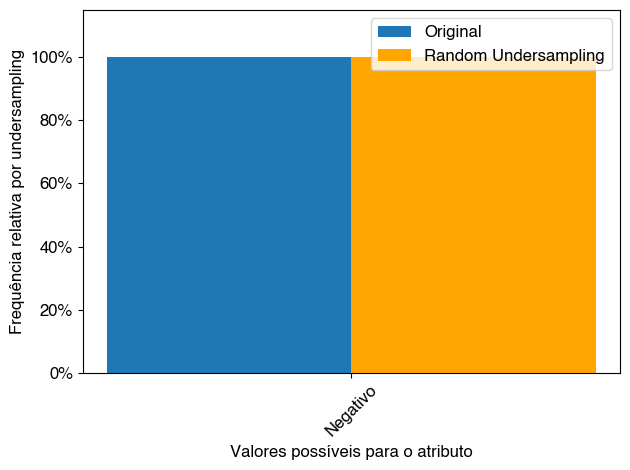

['Negativo']


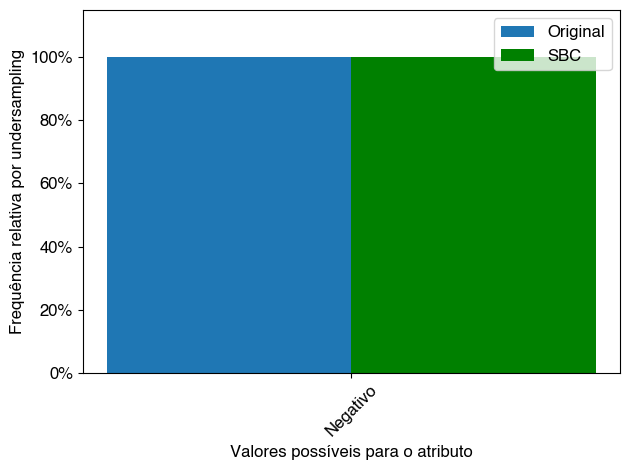

['Negativo']


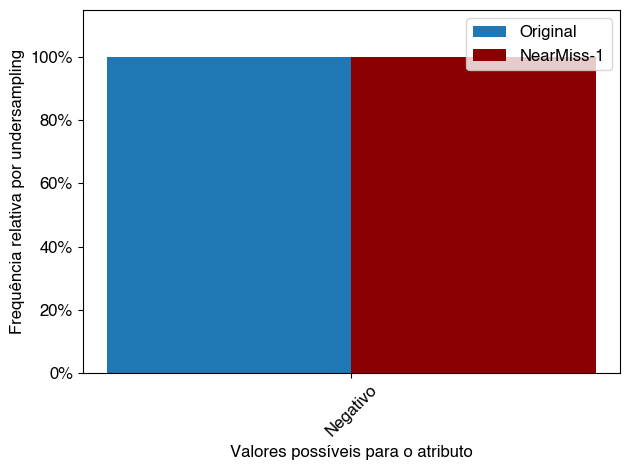

['Negativo']


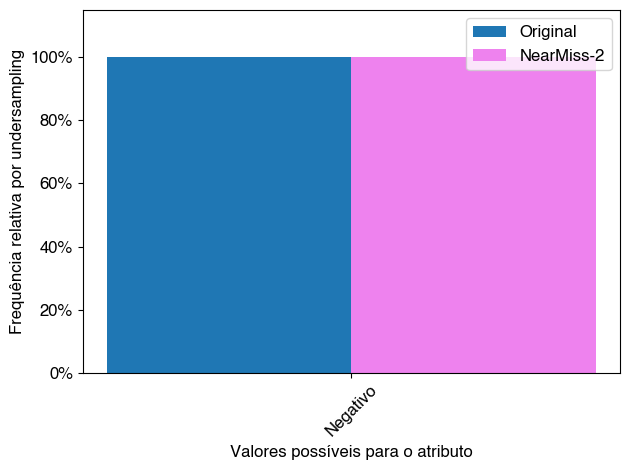

['Negativo']


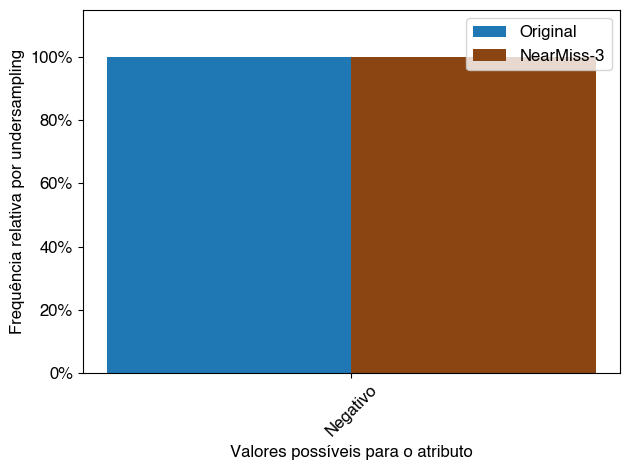

['Não Informado', 'Habitual', 'Alto']


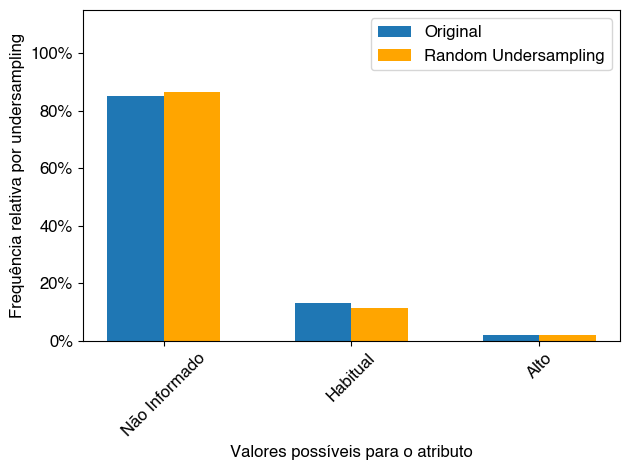

['Não Informado', 'Habitual', 'Alto']


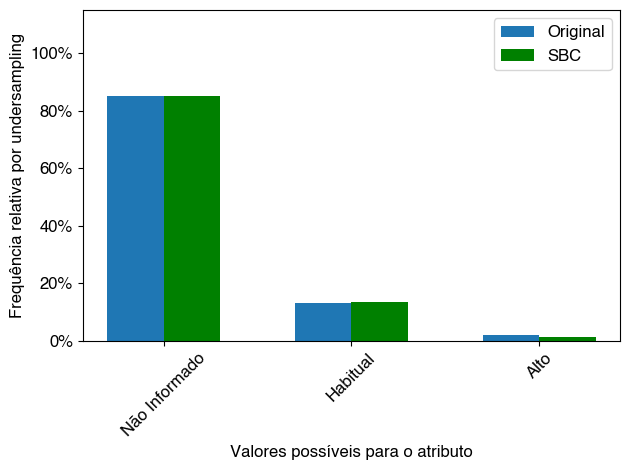

['Não Informado', 'Habitual', 'Alto']


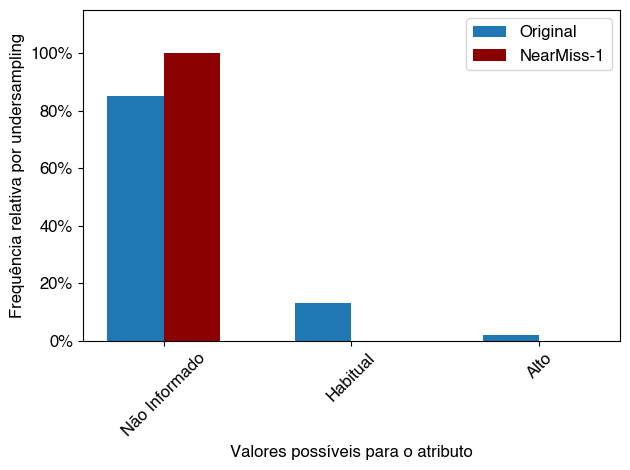

['Não Informado', 'Habitual', 'Alto']


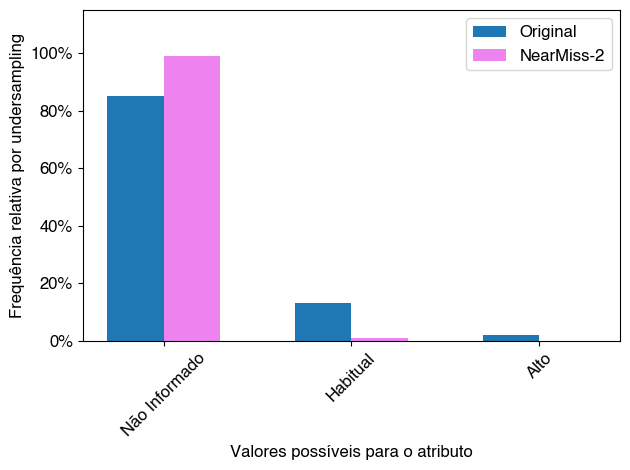

['Não Informado', 'Habitual', 'Alto']


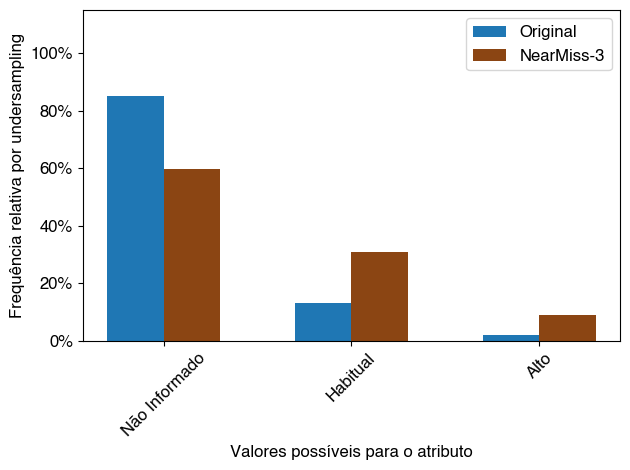

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


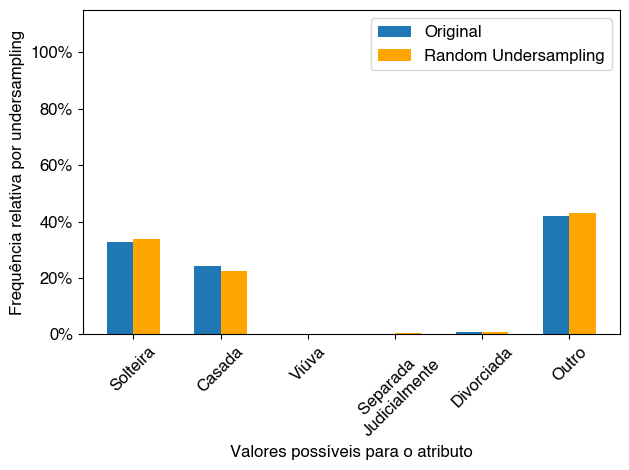

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


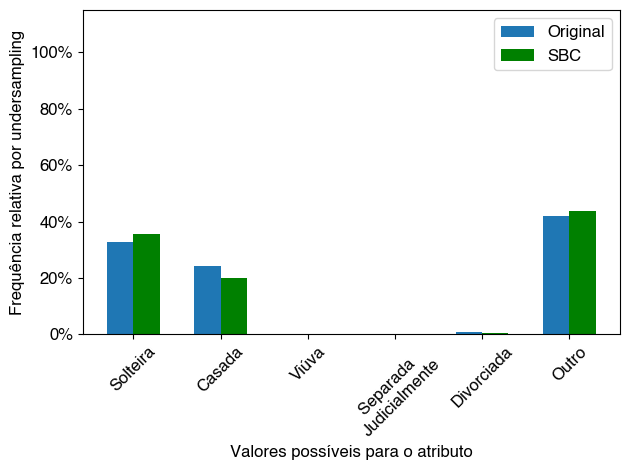

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


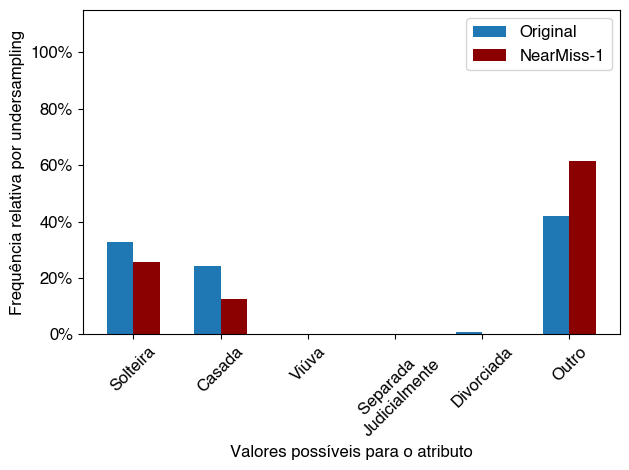

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


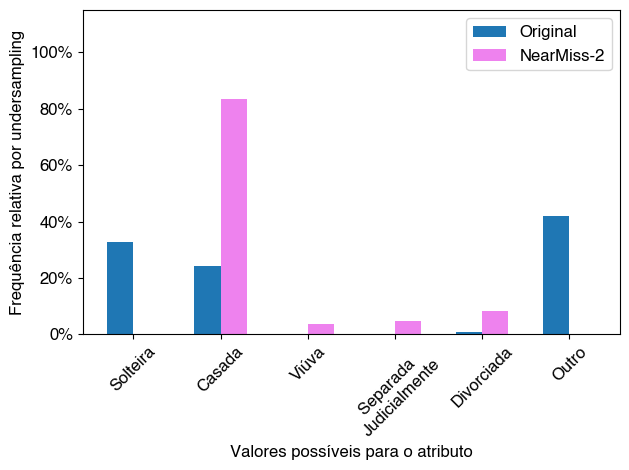

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


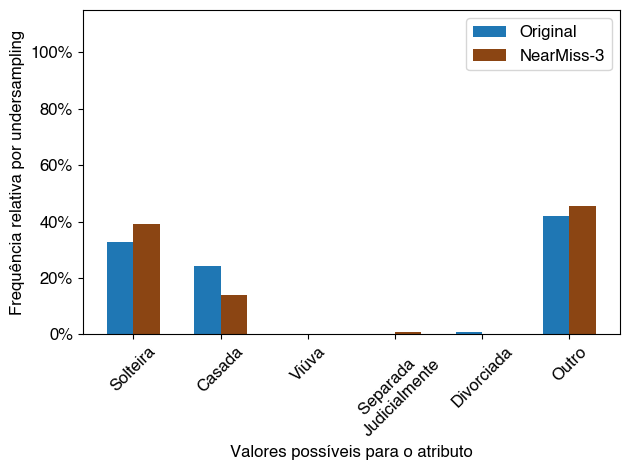

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


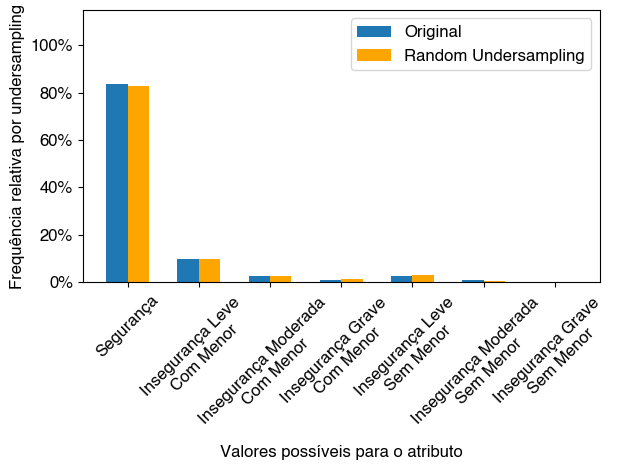

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


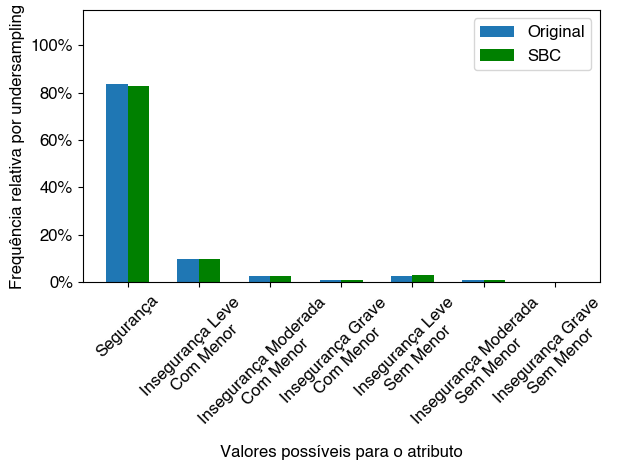

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


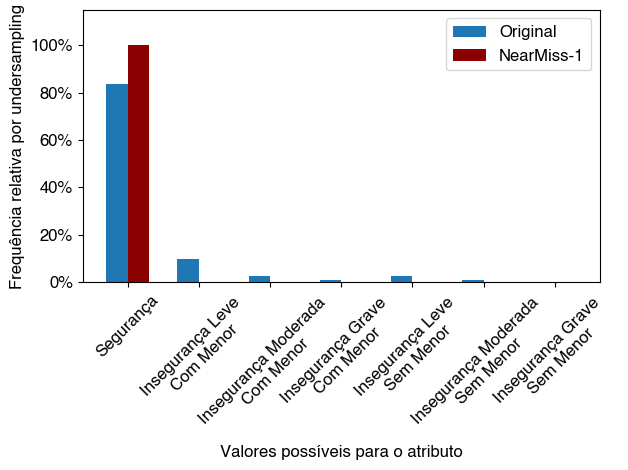

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


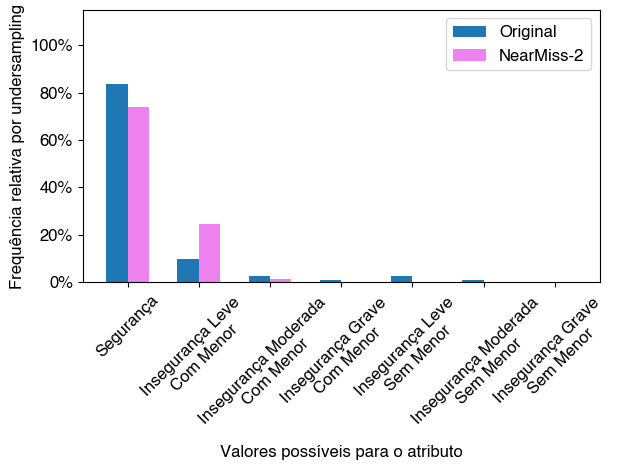

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


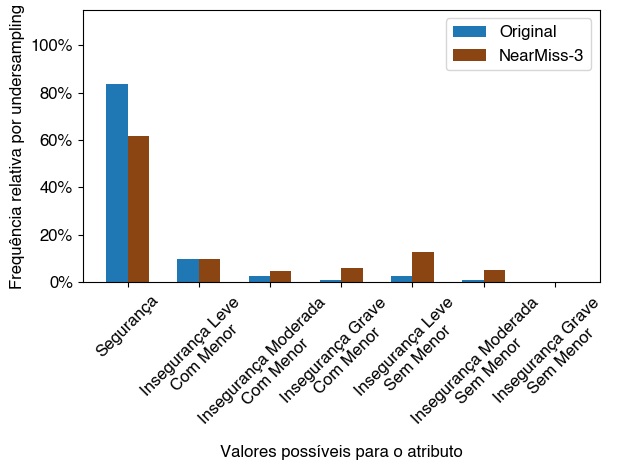

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


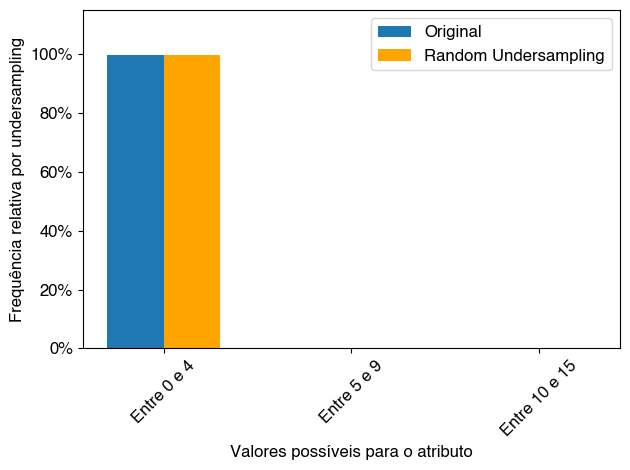

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


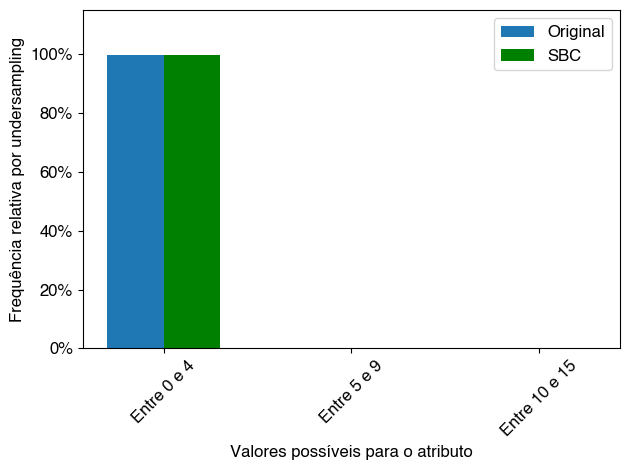

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


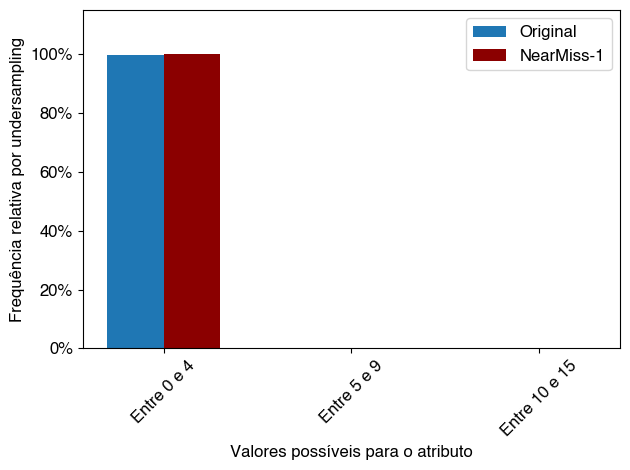

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


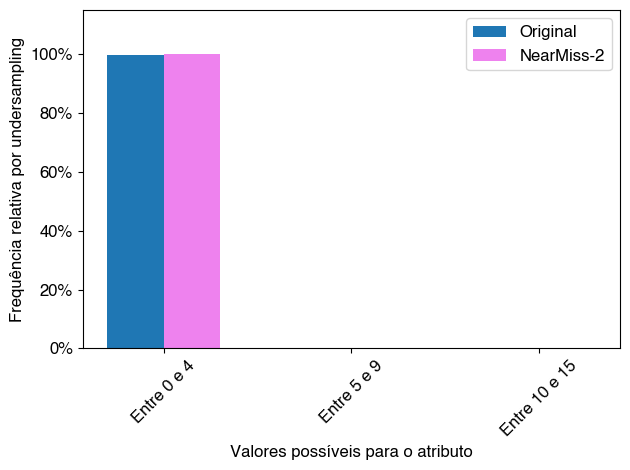

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


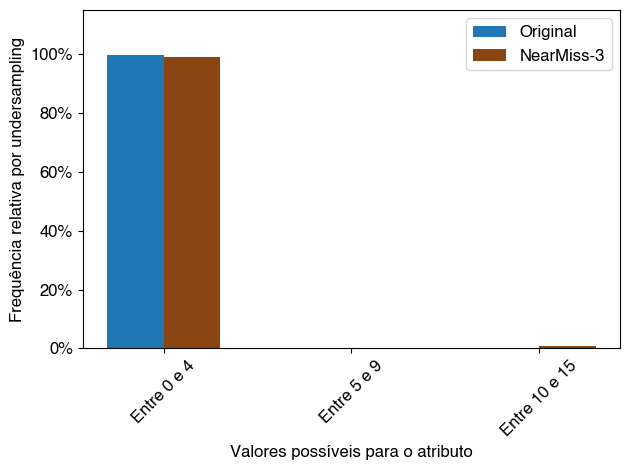

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


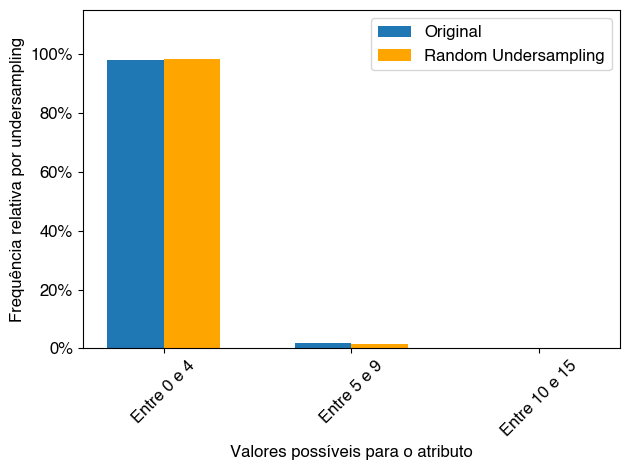

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


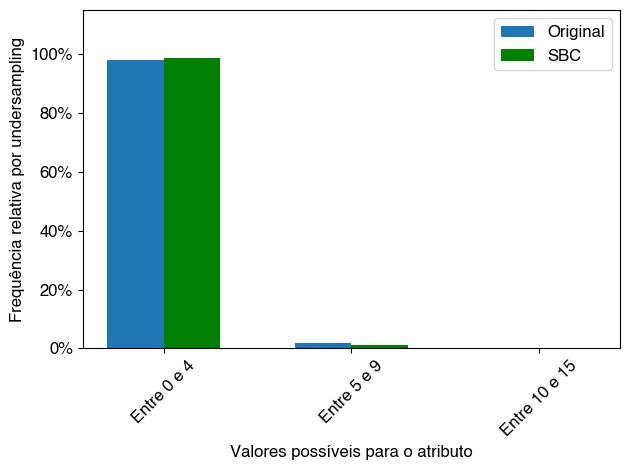

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


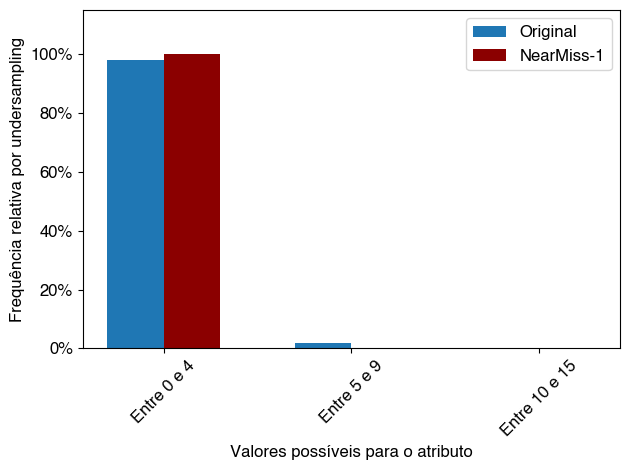

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


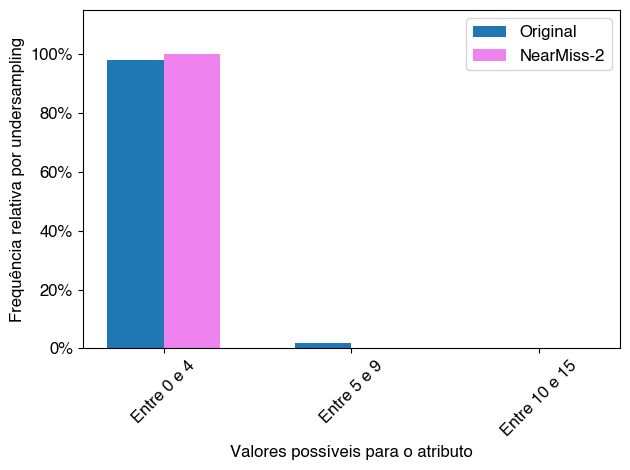

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


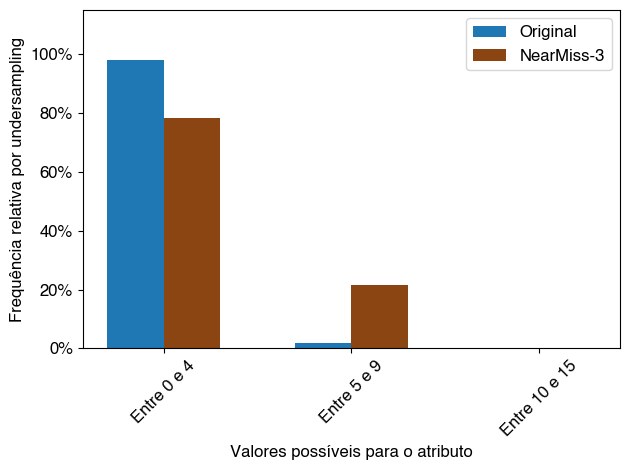

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


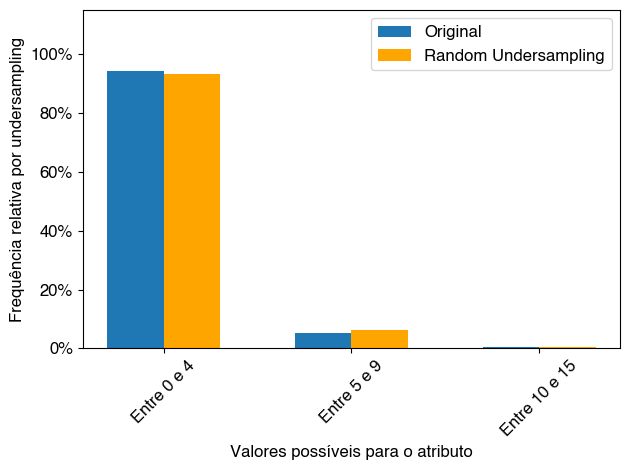

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


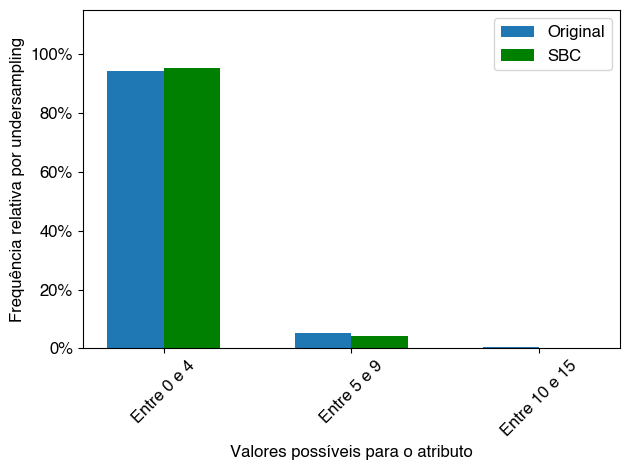

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


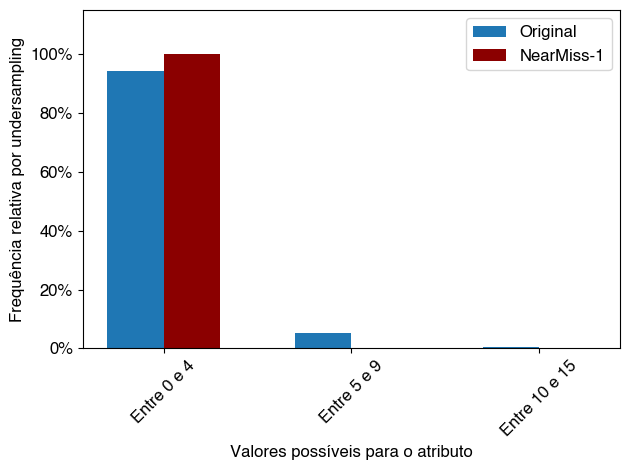

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


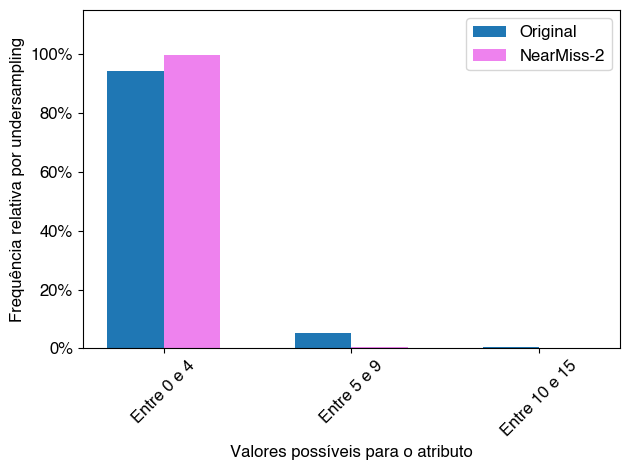

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


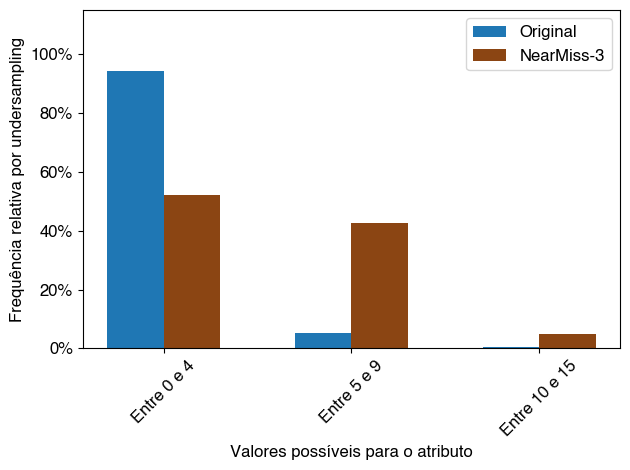

['Não', 'Sim']


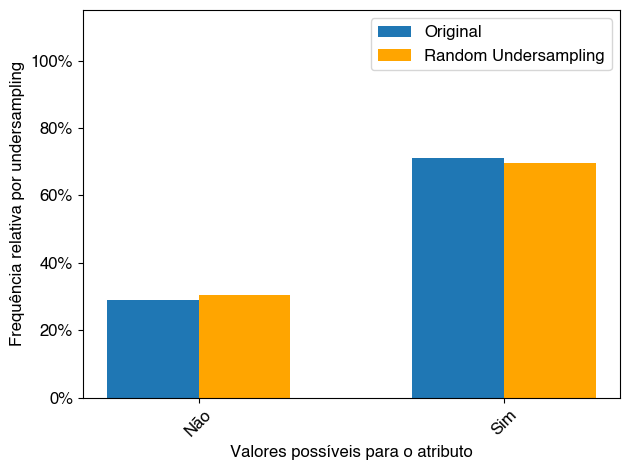

['Não', 'Sim']


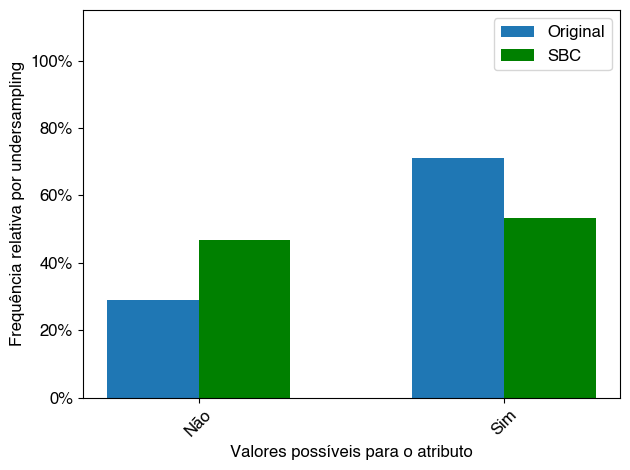

['Não', 'Sim']


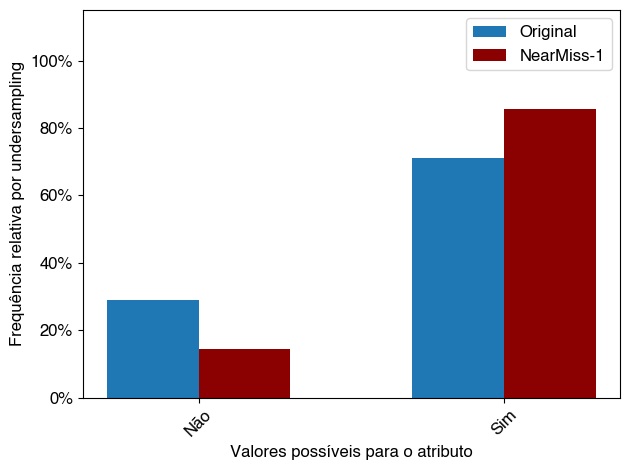

['Não', 'Sim']


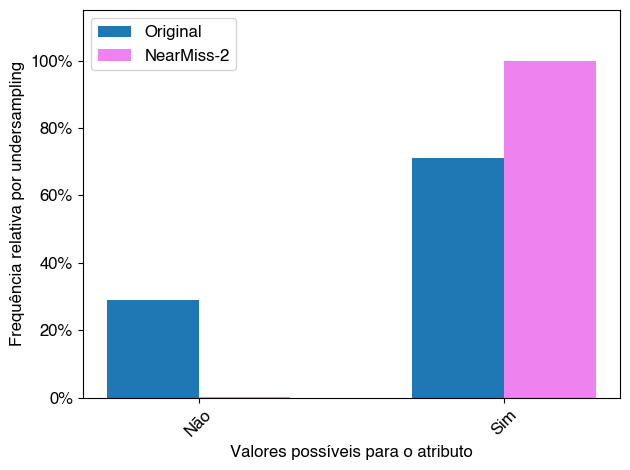

['Não', 'Sim']


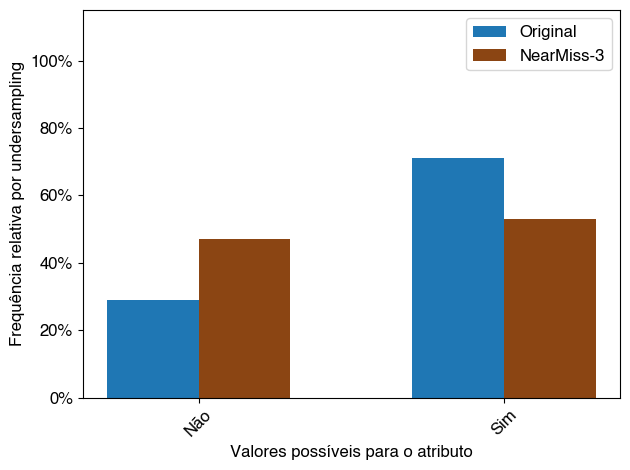

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


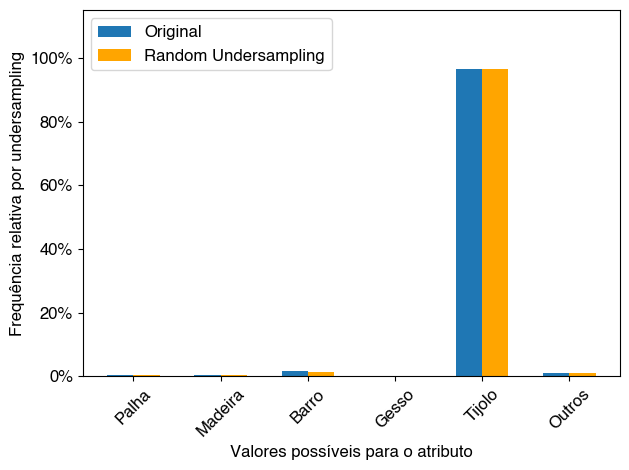

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


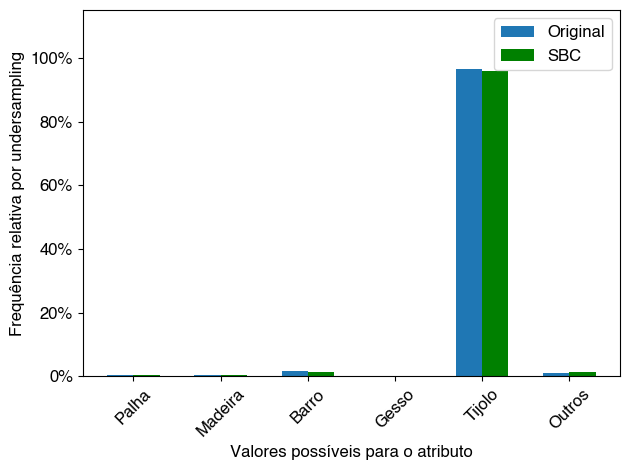

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


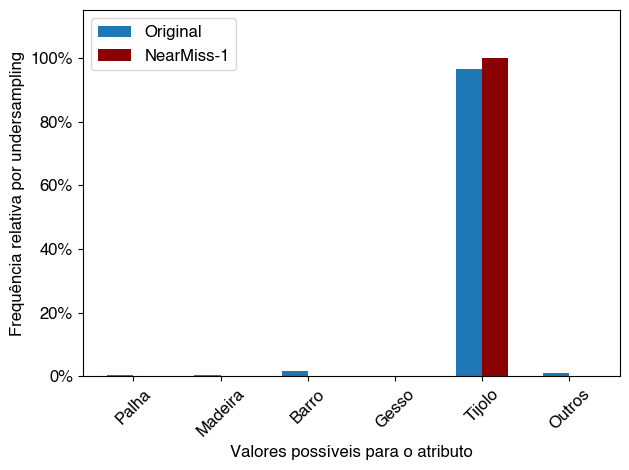

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


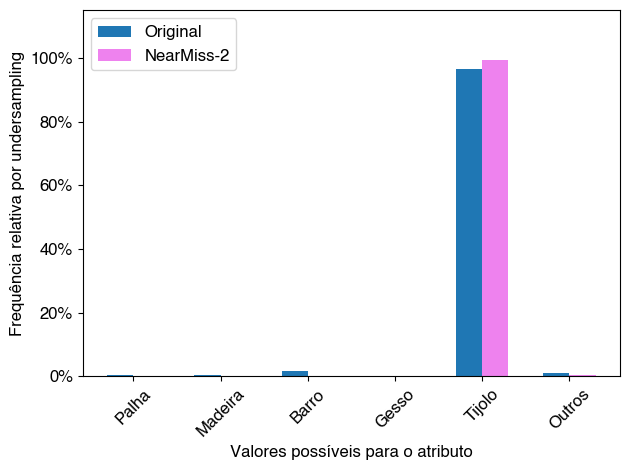

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


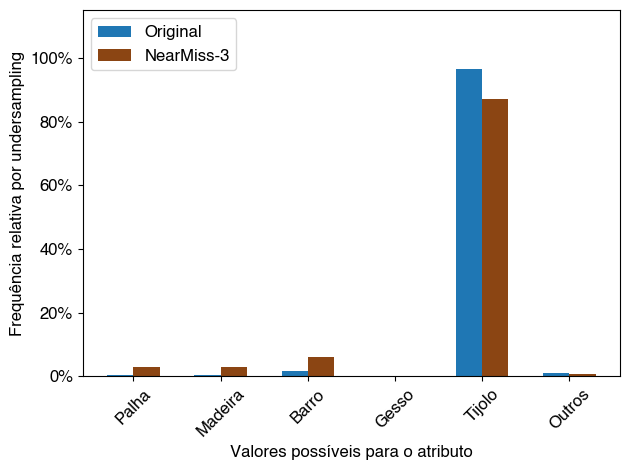

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


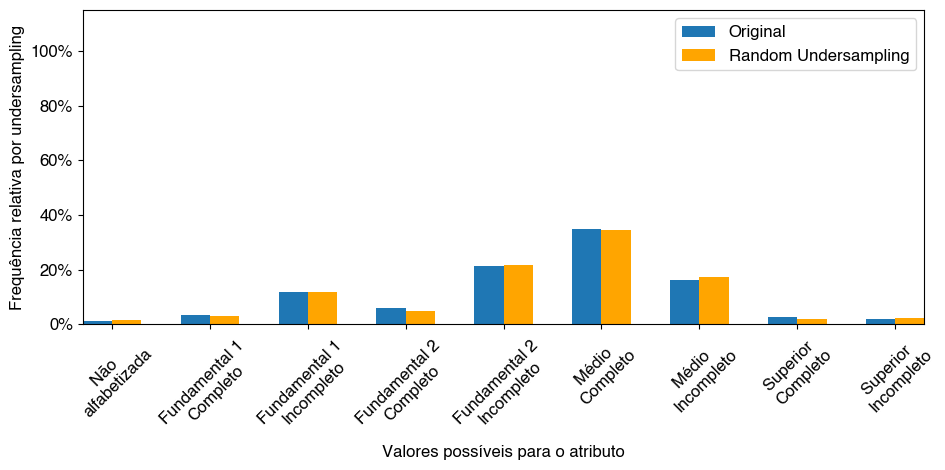

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


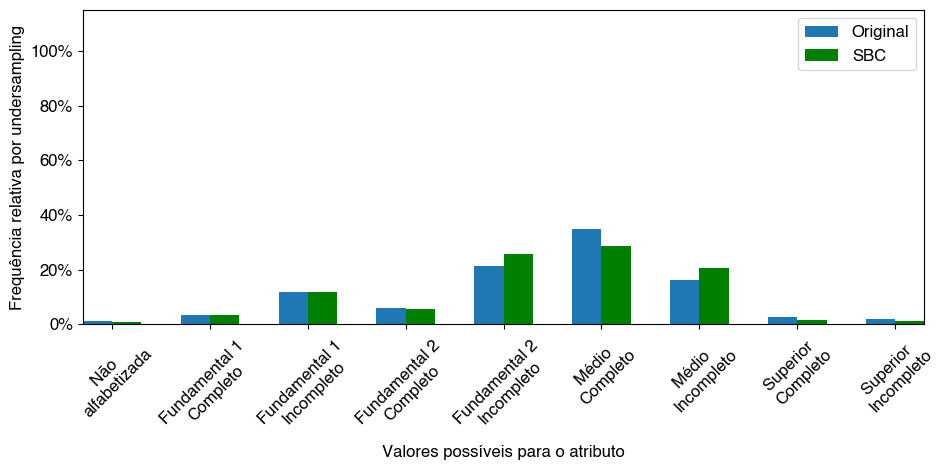

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


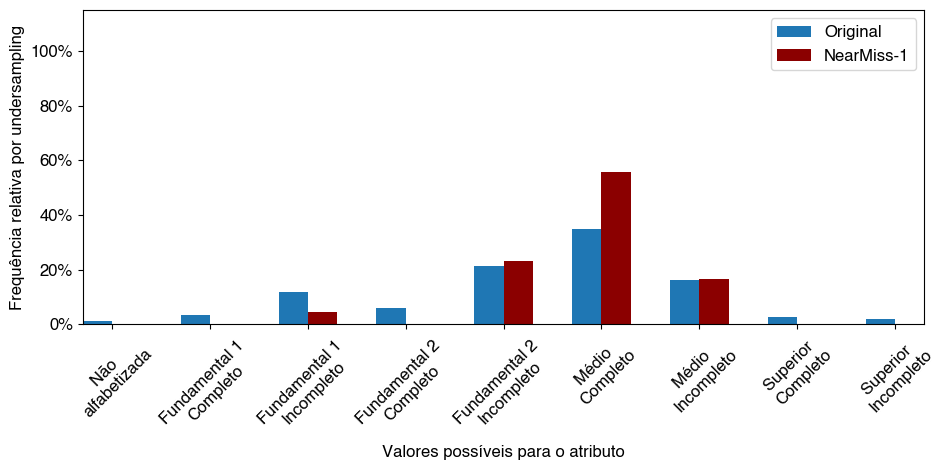

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


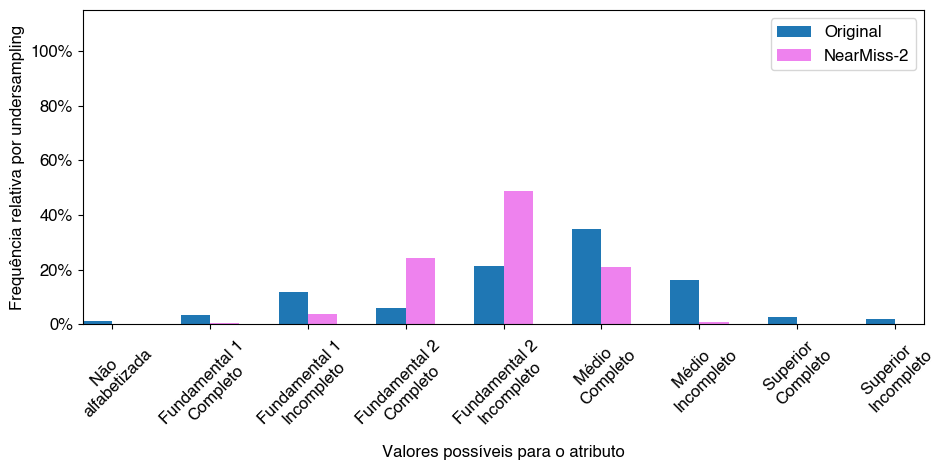

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


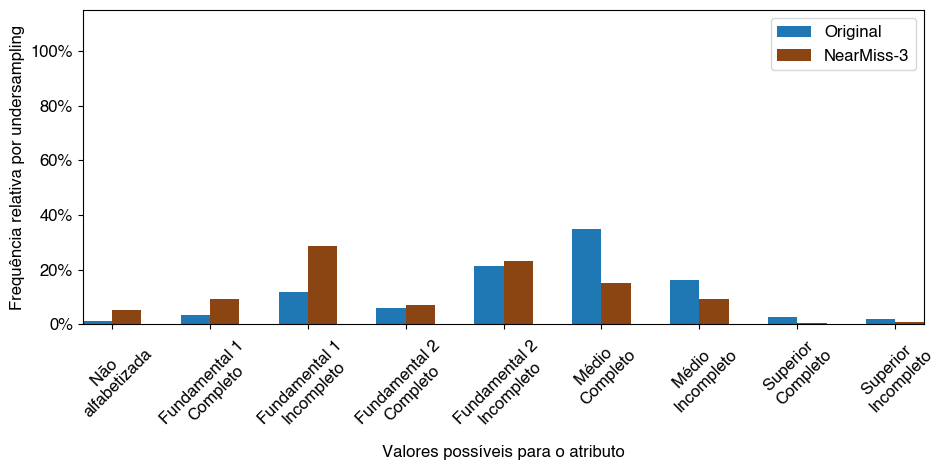

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


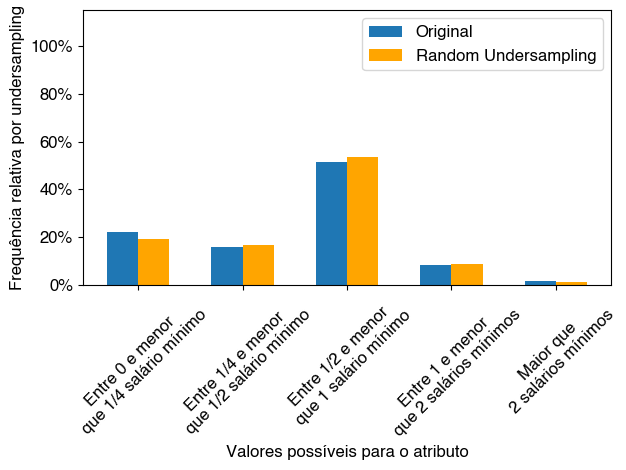

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


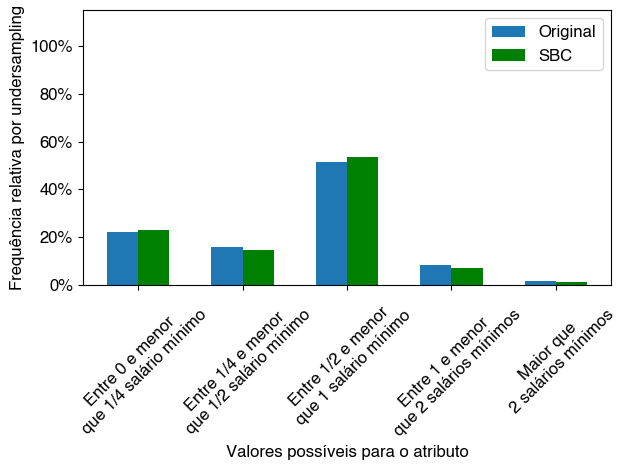

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


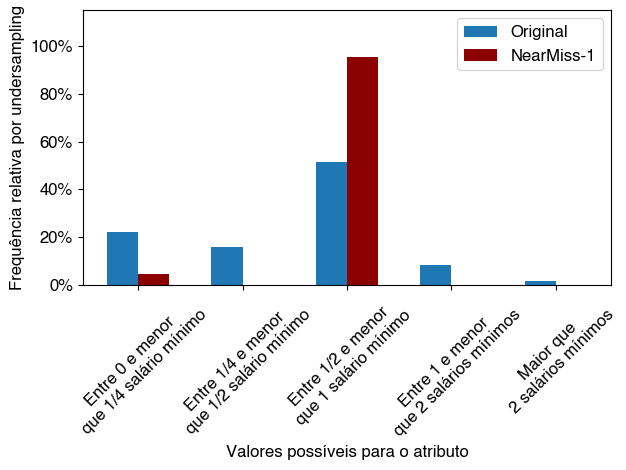

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


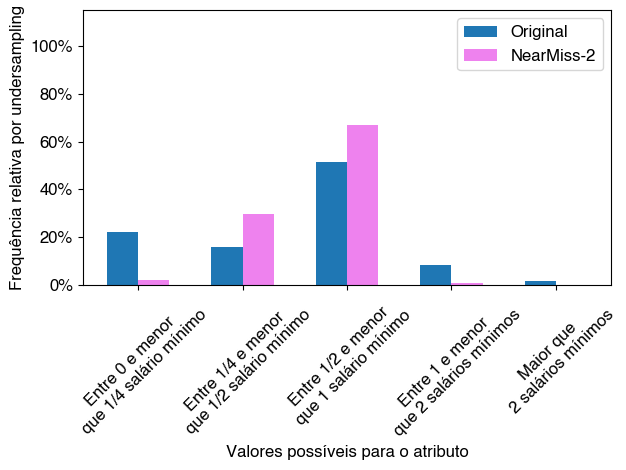

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


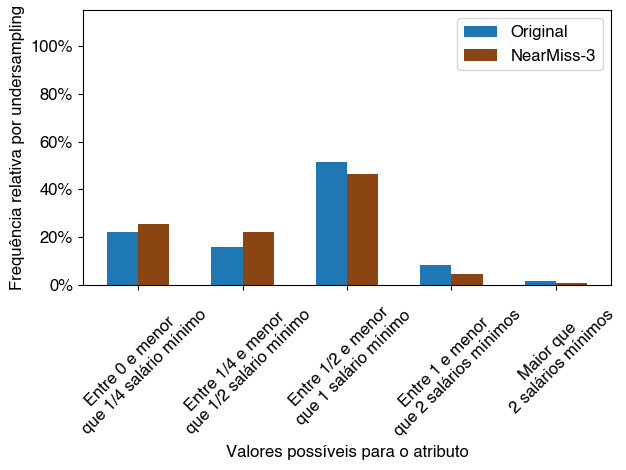

['Mãe \nAdolescente', 'Mãe \nAdulta']


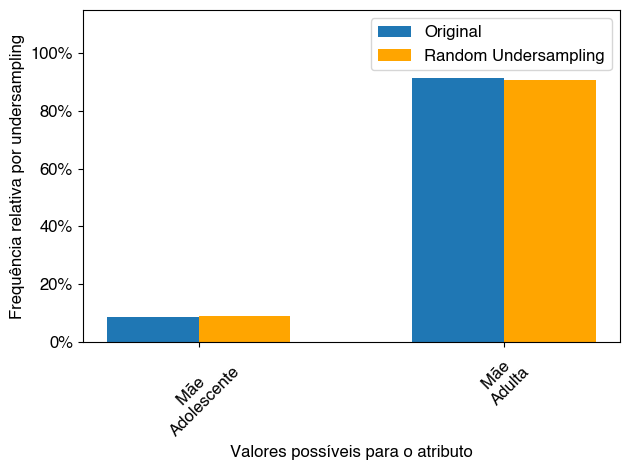

['Mãe \nAdolescente', 'Mãe \nAdulta']


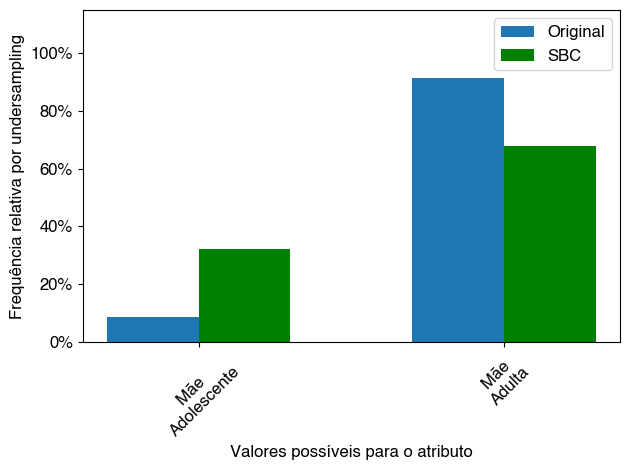

['Mãe \nAdolescente', 'Mãe \nAdulta']


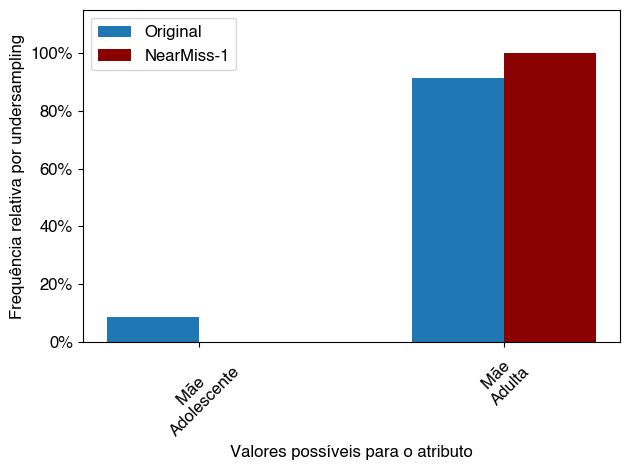

['Mãe \nAdolescente', 'Mãe \nAdulta']


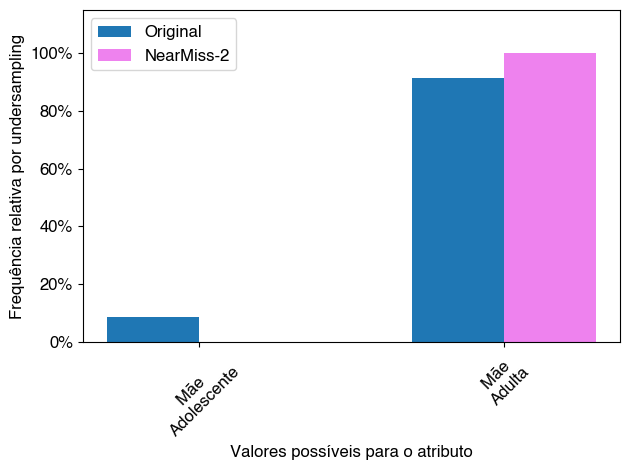

['Mãe \nAdolescente', 'Mãe \nAdulta']


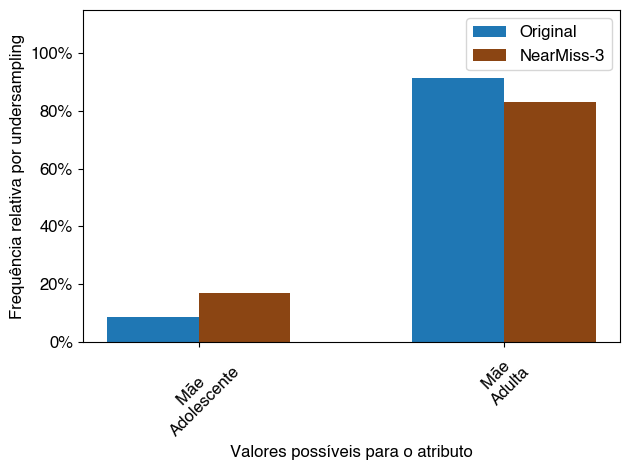

random_forest
['Negativo']


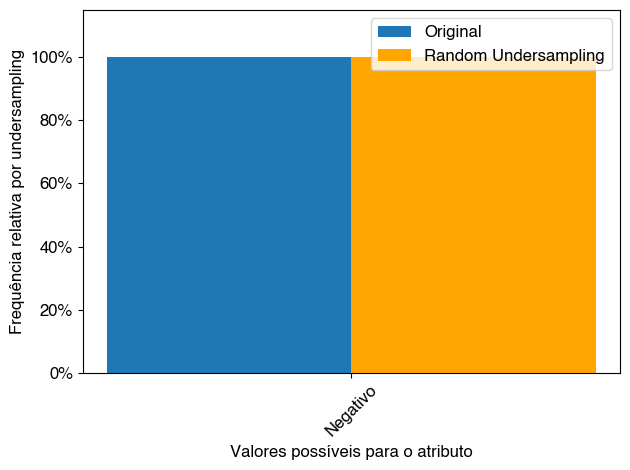

['Negativo']


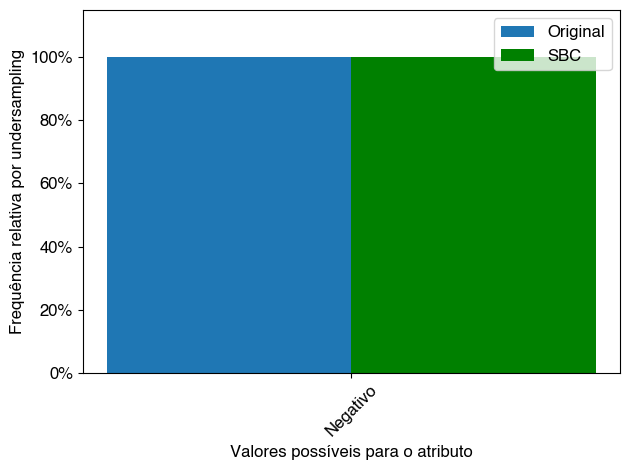

['Negativo']


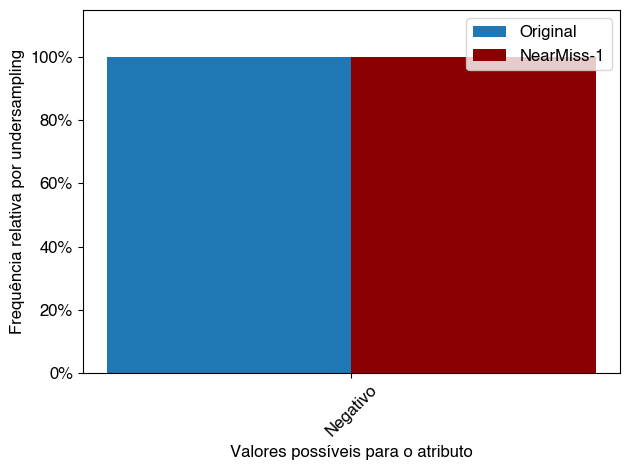

['Negativo']


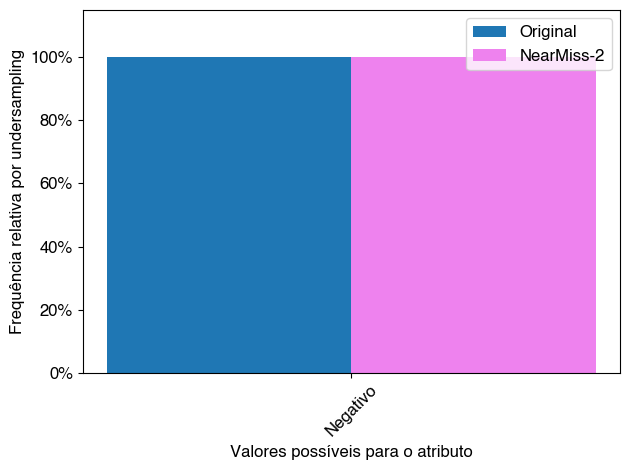

['Negativo']


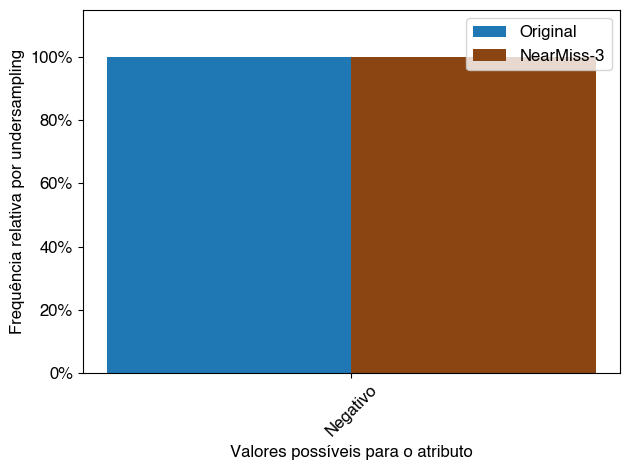

['Não Informado', 'Habitual', 'Alto']


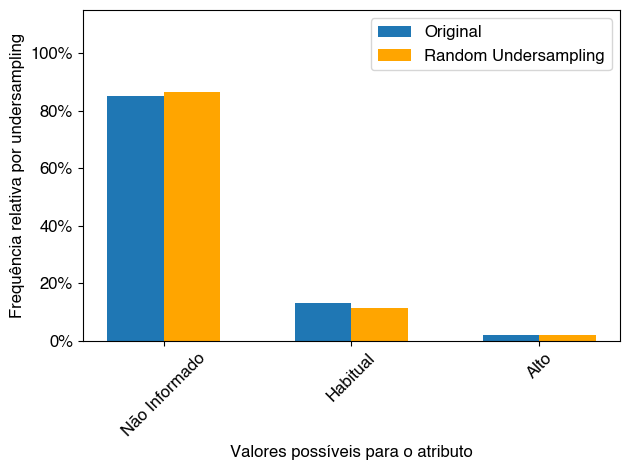

['Não Informado', 'Habitual', 'Alto']


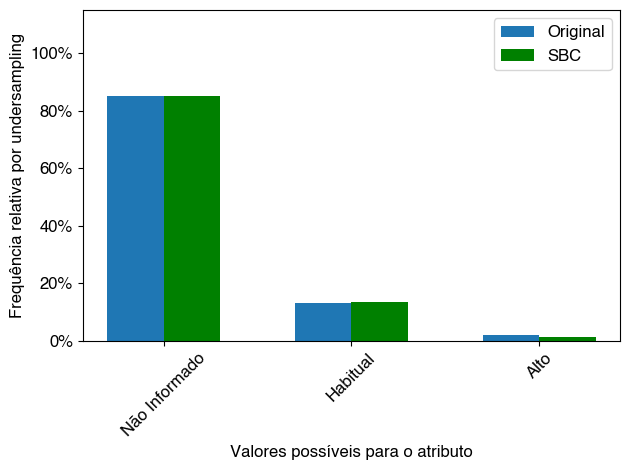

['Não Informado', 'Habitual', 'Alto']


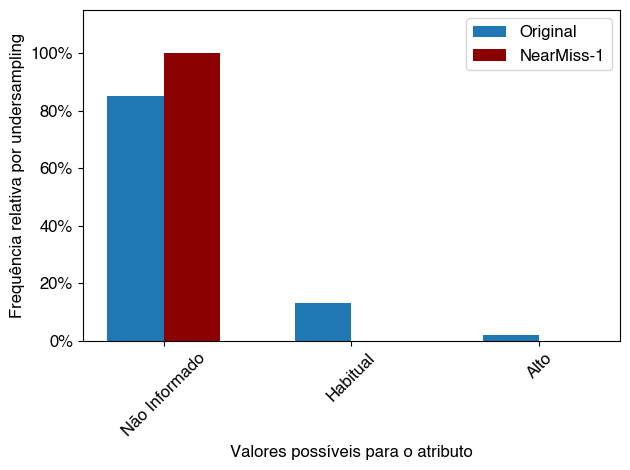

['Não Informado', 'Habitual', 'Alto']


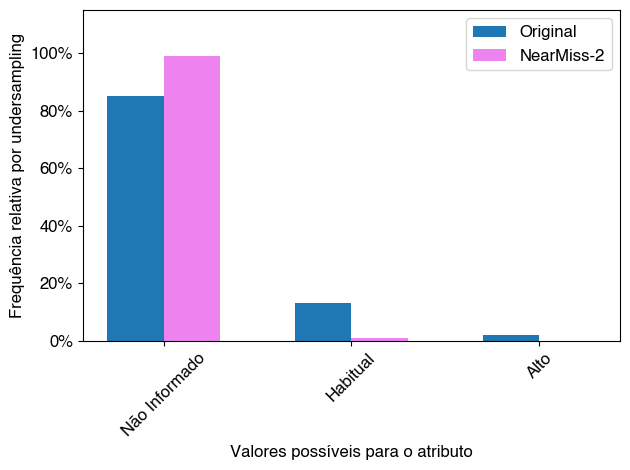

['Não Informado', 'Habitual', 'Alto']


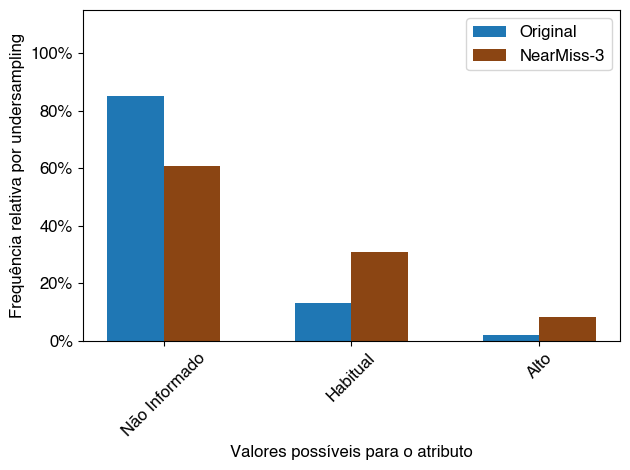

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


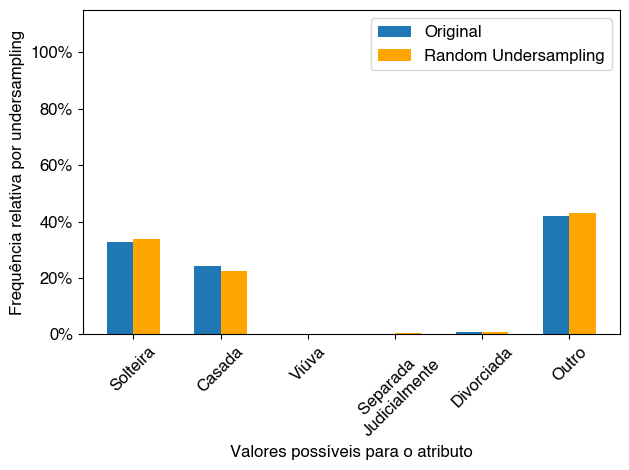

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


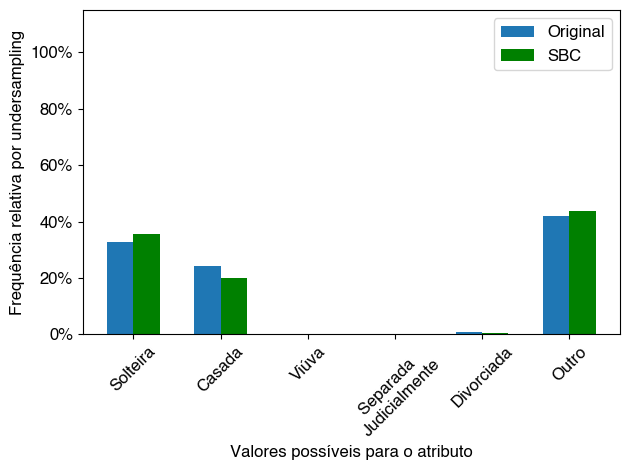

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


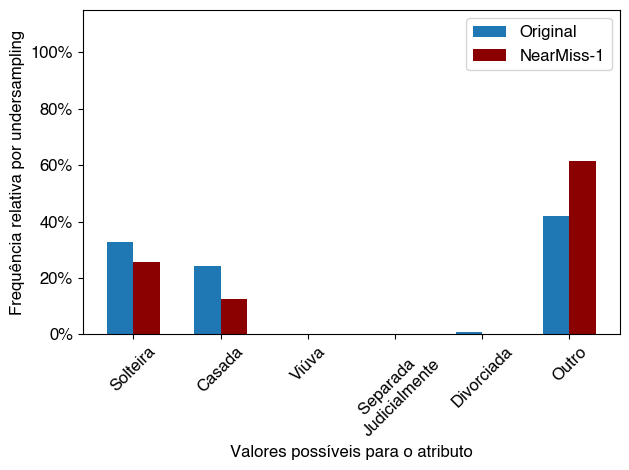

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


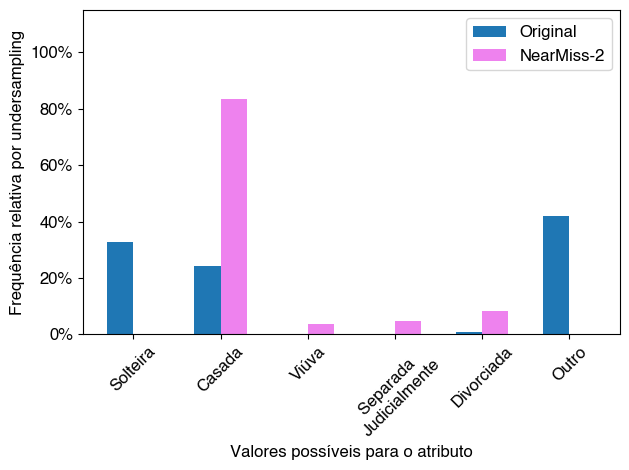

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


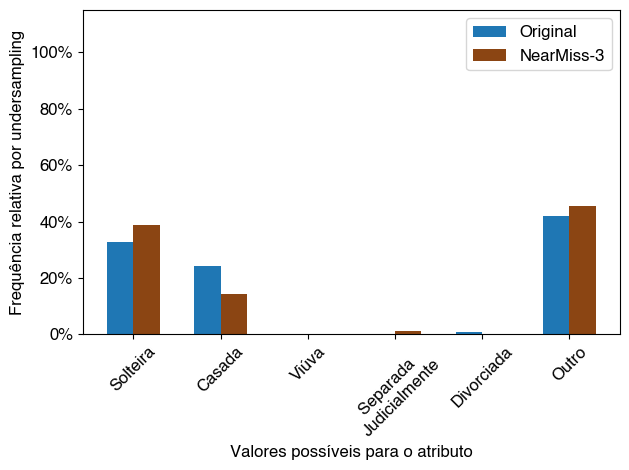

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


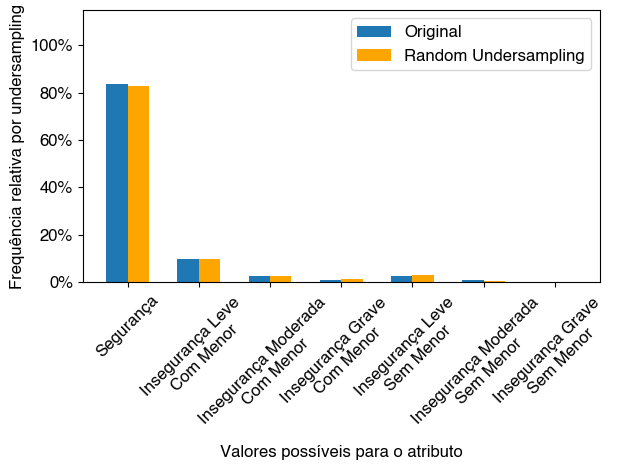

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


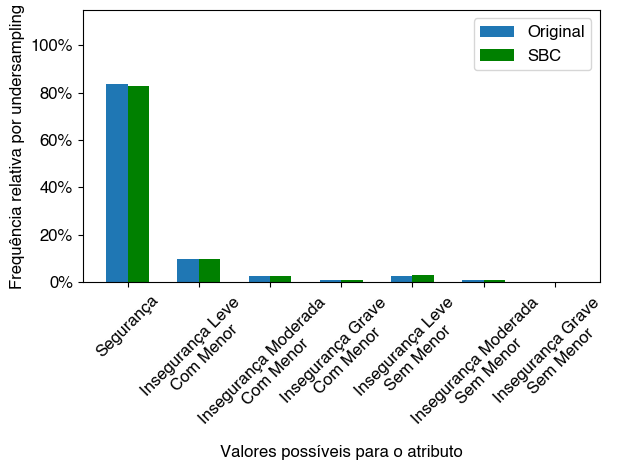

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


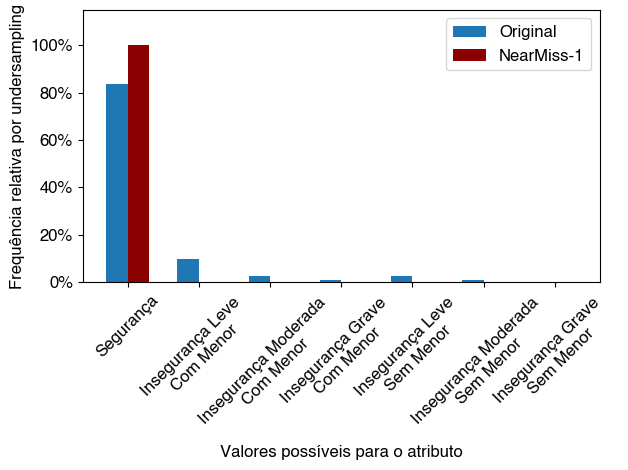

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


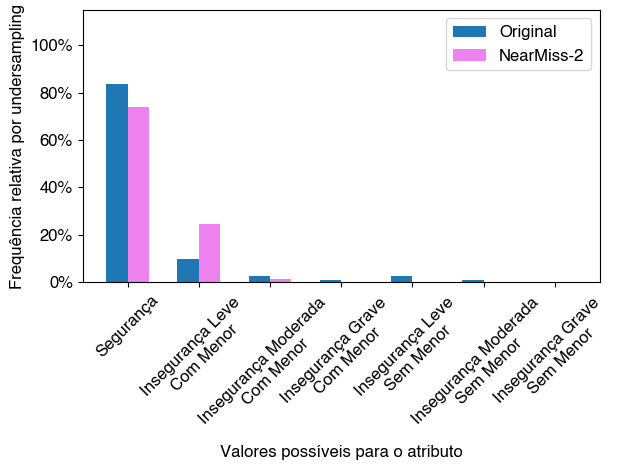

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


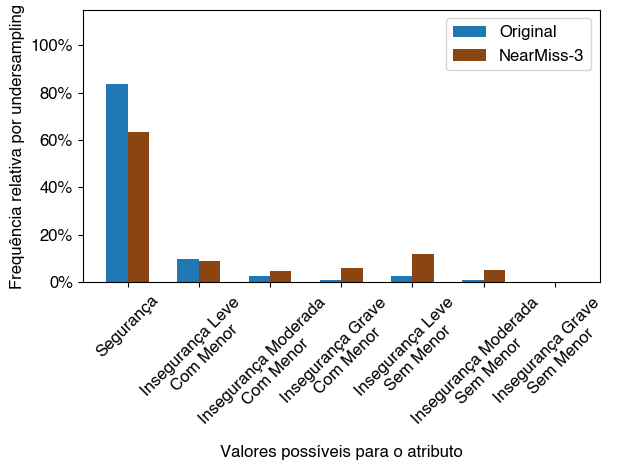

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


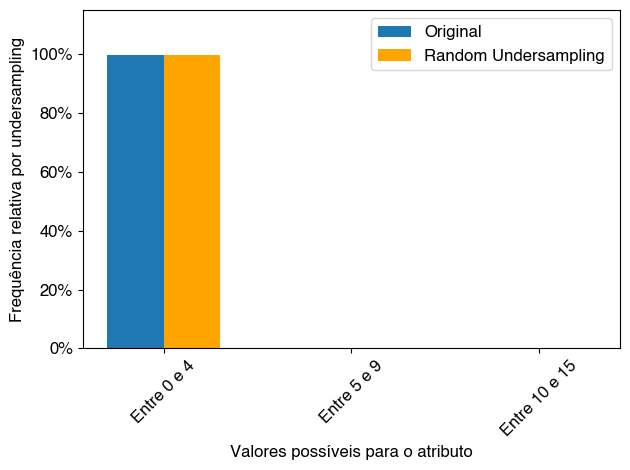

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


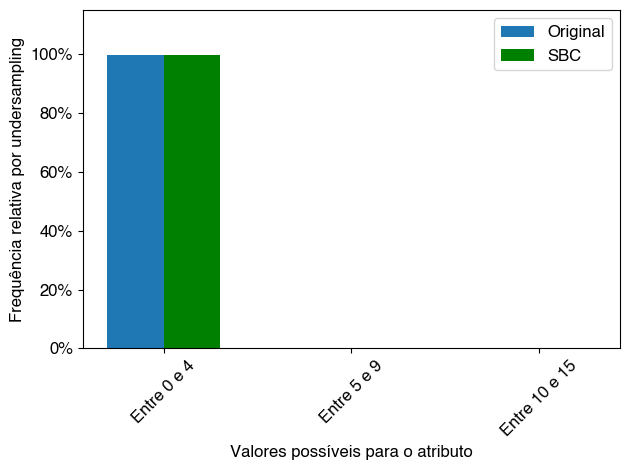

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


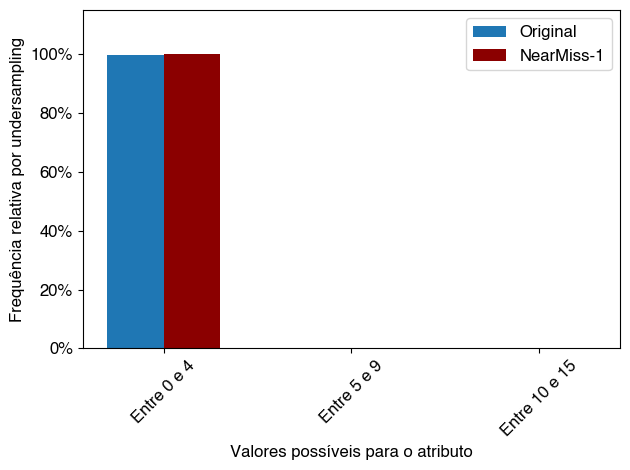

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


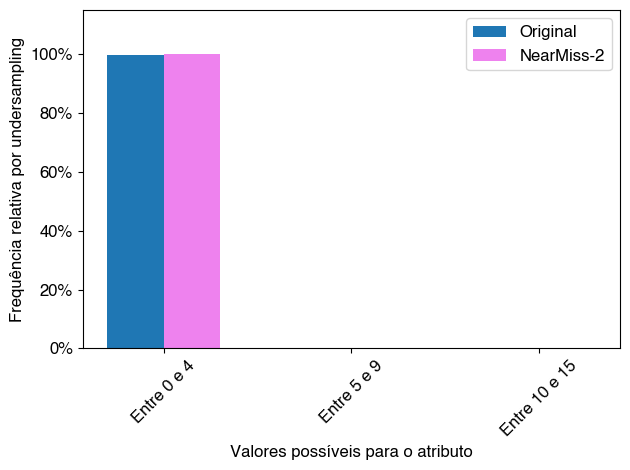

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


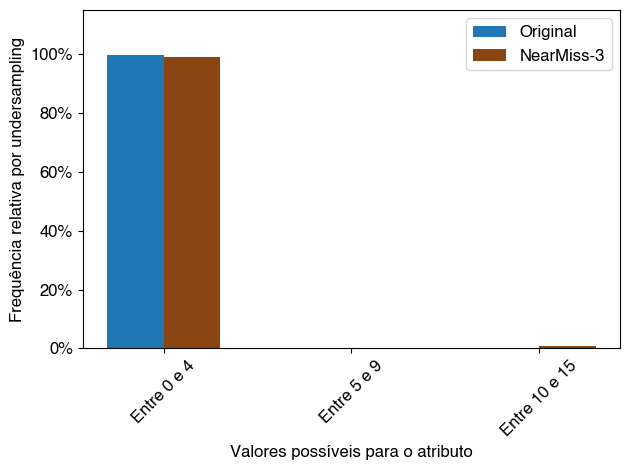

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


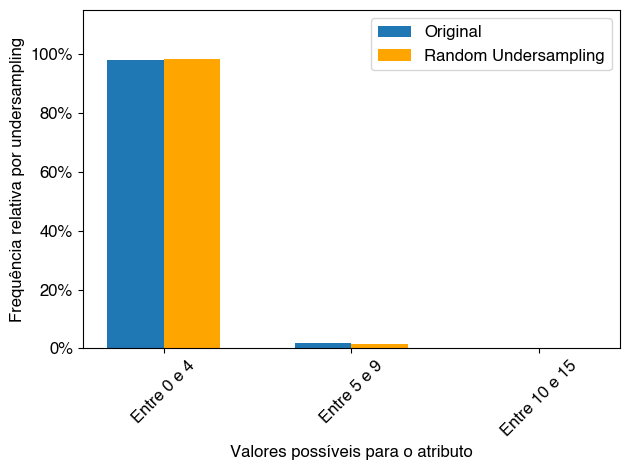

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


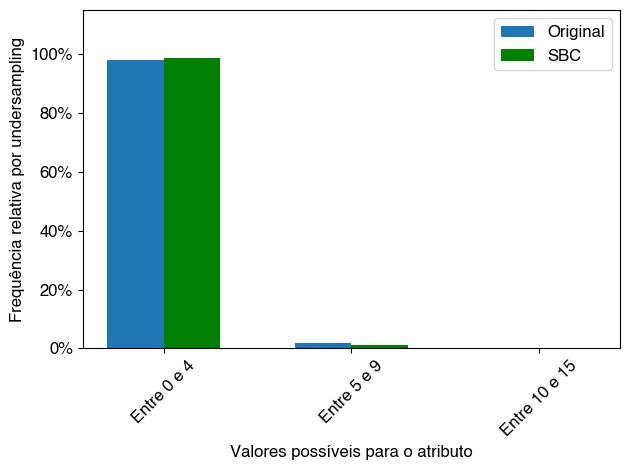

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


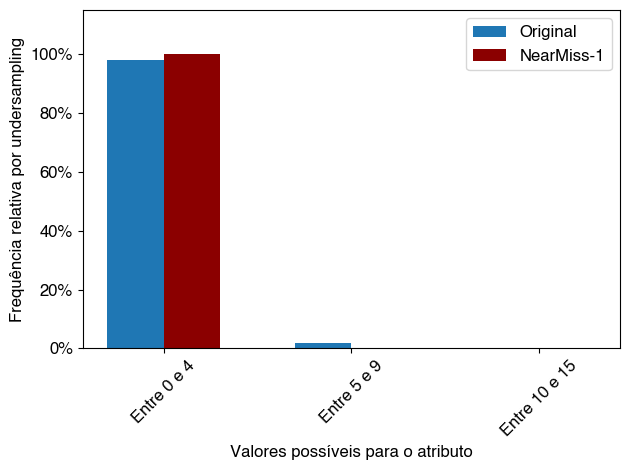

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


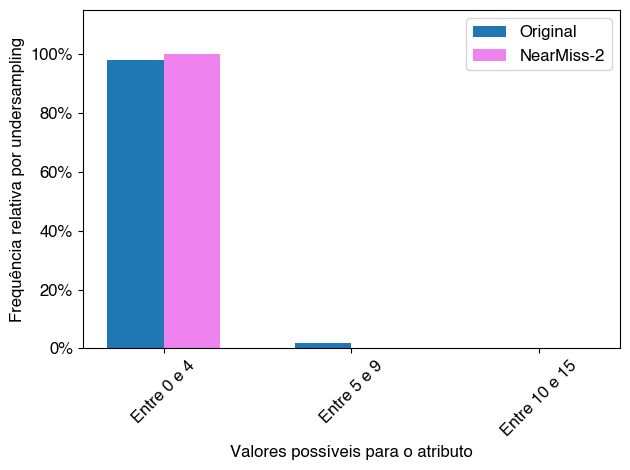

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


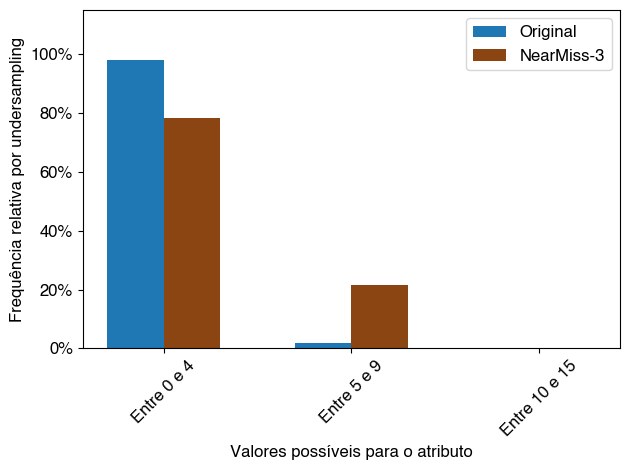

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


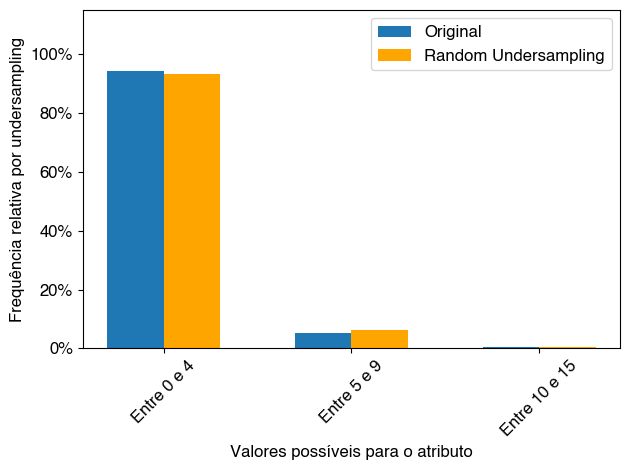

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


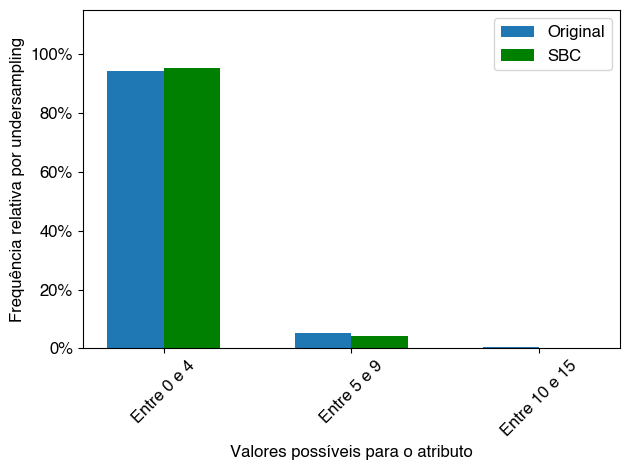

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


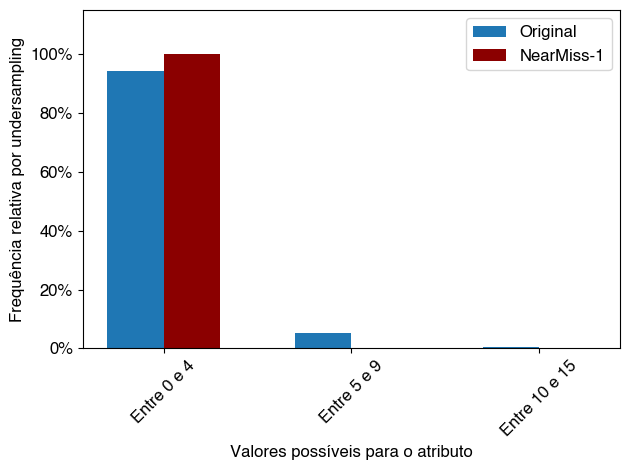

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


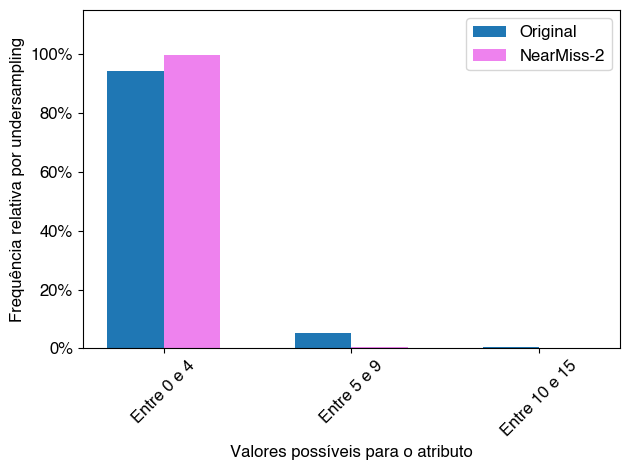

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


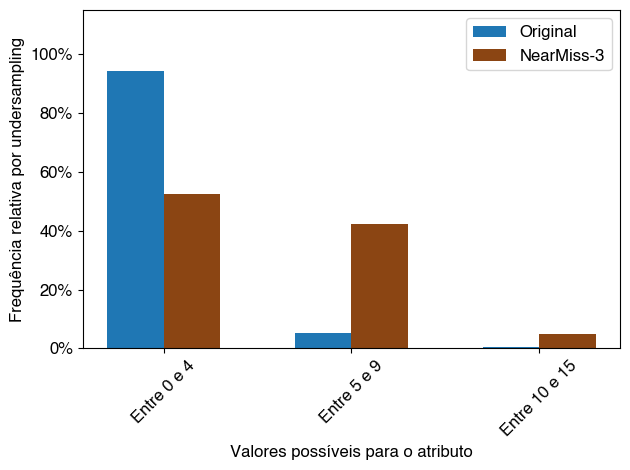

['Não', 'Sim']


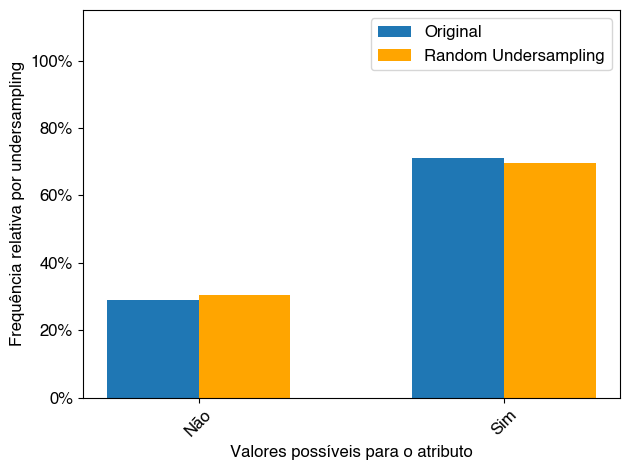

['Não', 'Sim']


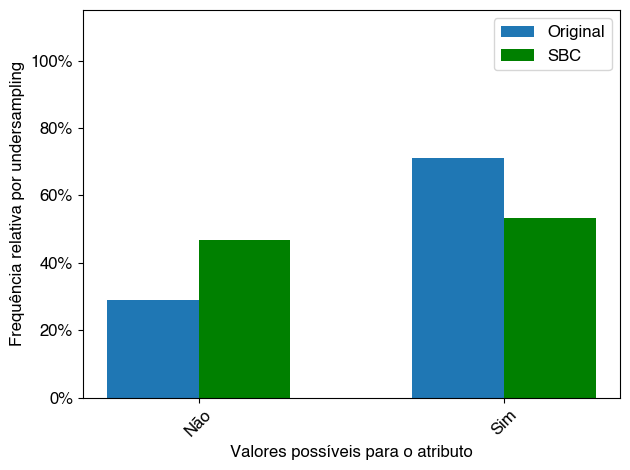

['Não', 'Sim']


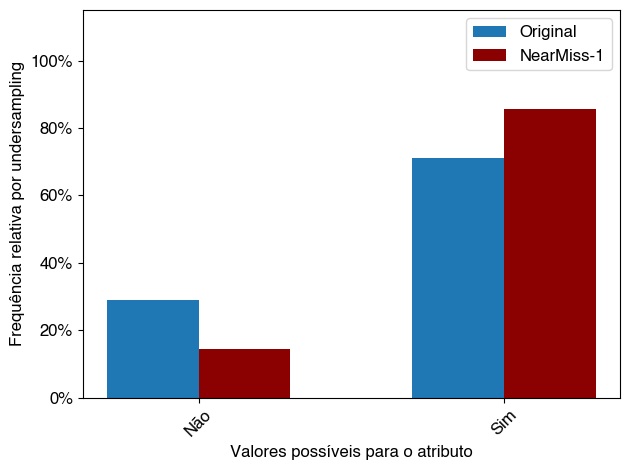

['Não', 'Sim']


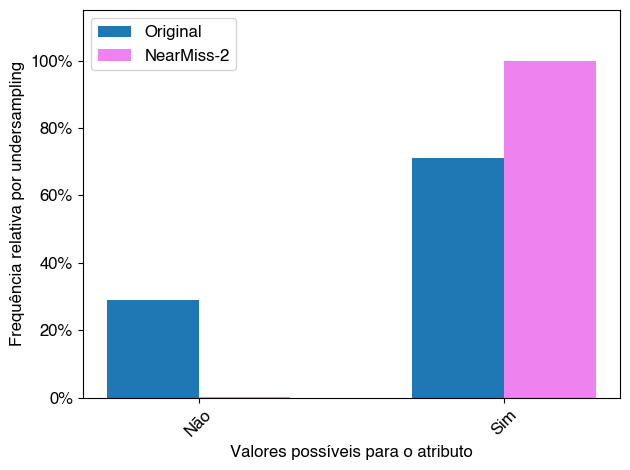

['Não', 'Sim']


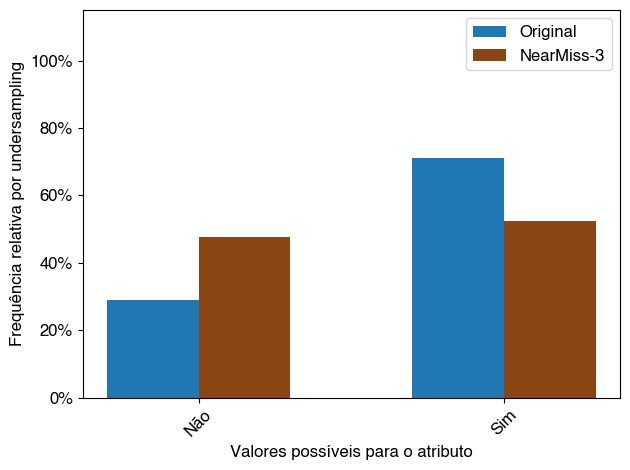

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


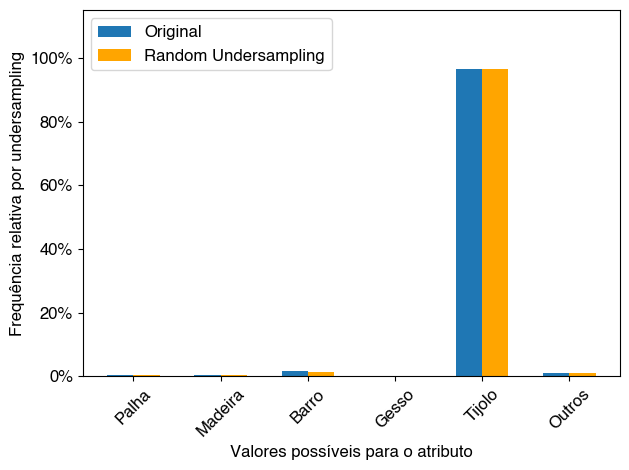

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


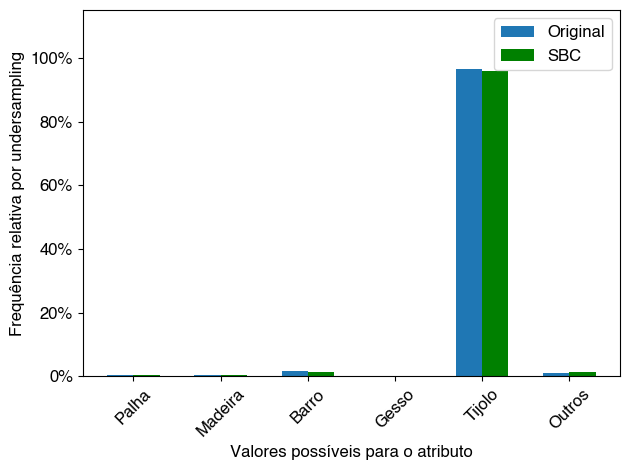

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


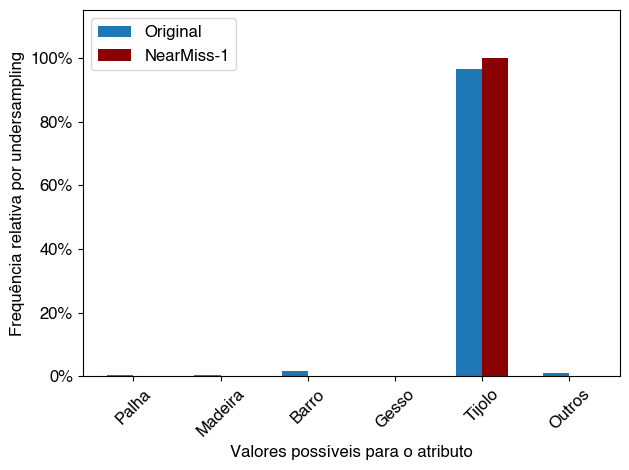

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


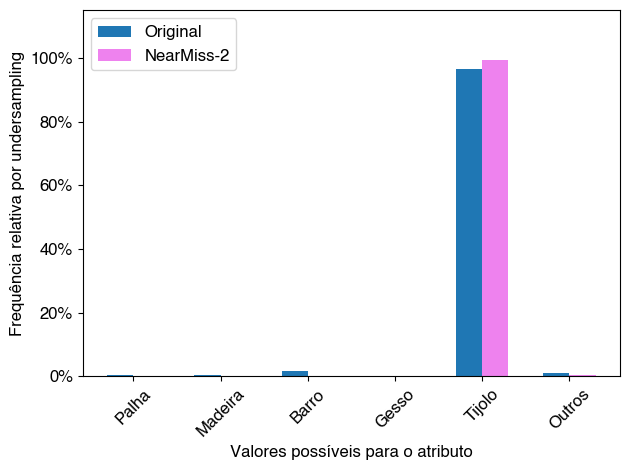

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


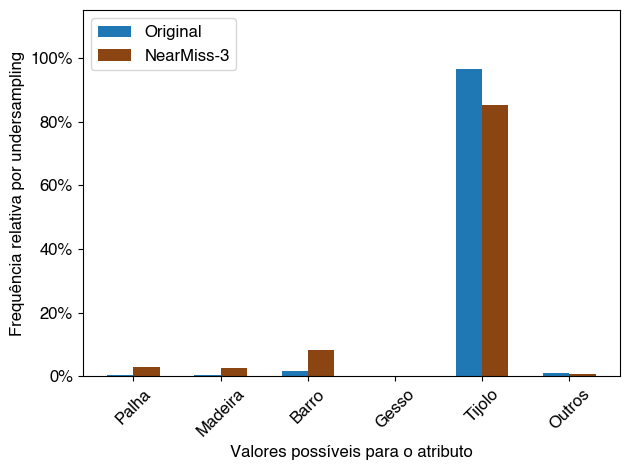

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


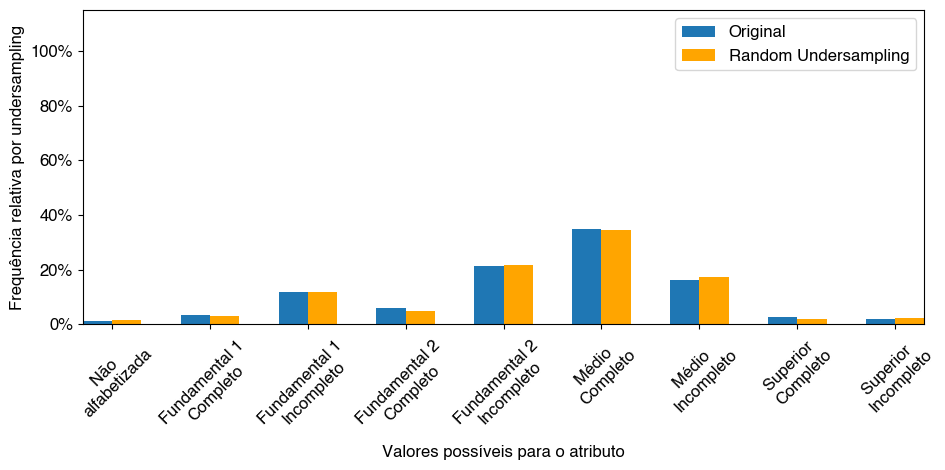

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


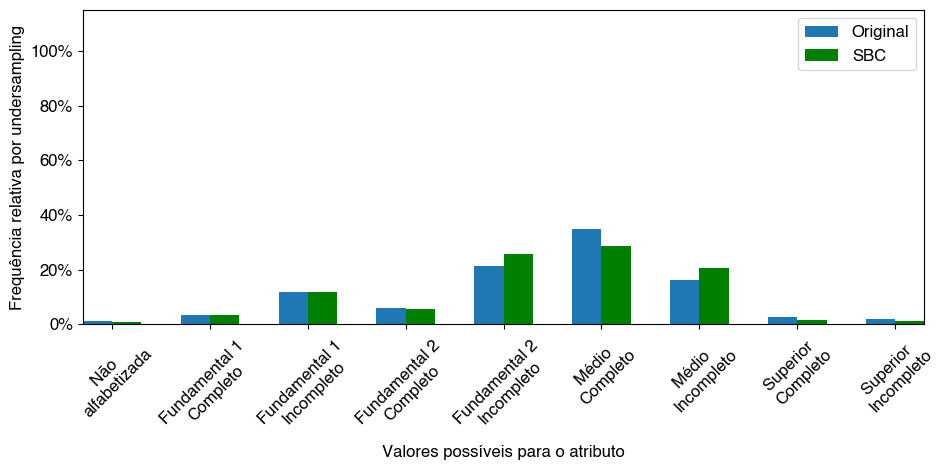

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


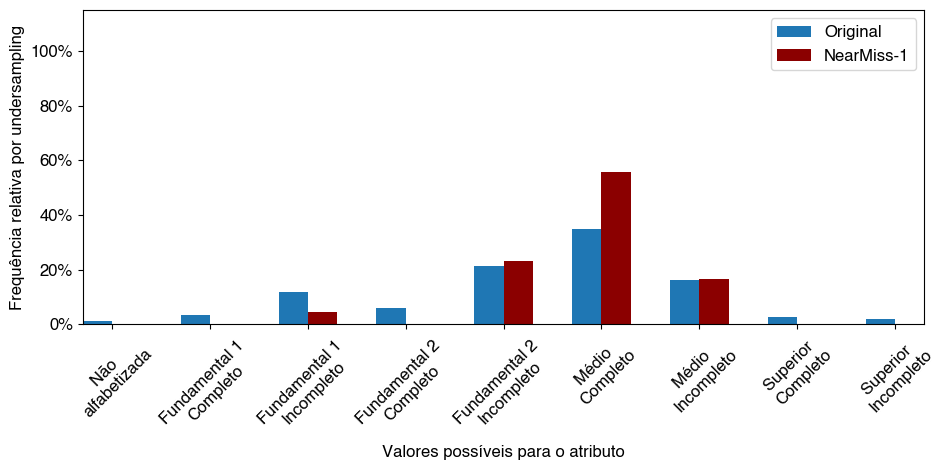

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


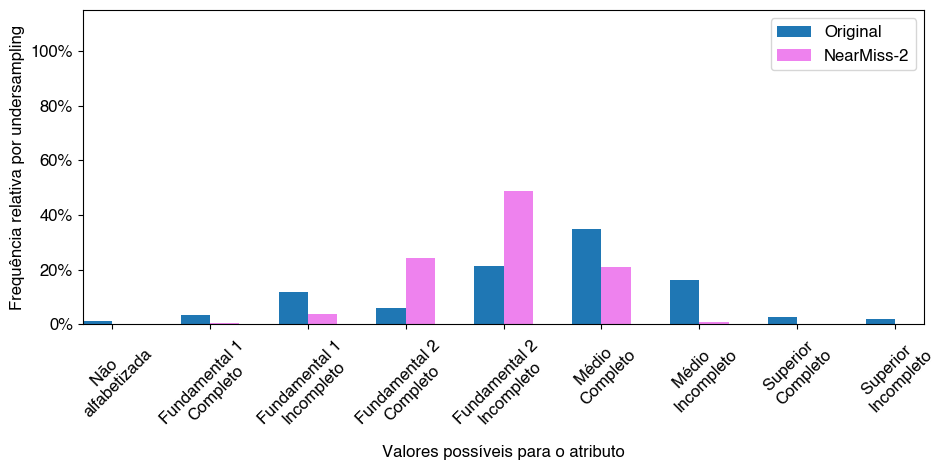

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


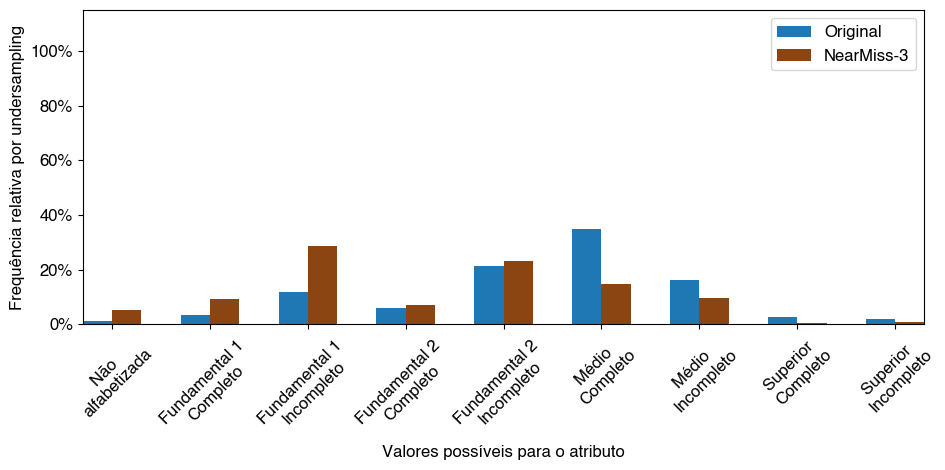

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


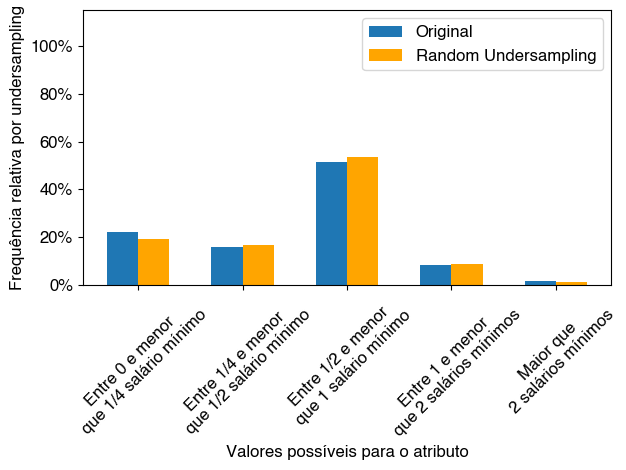

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


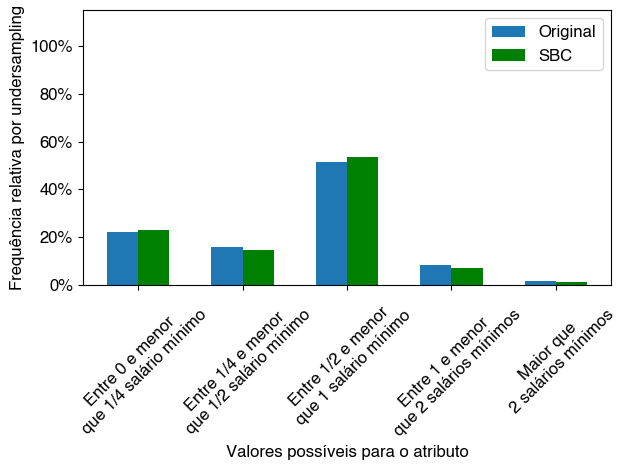

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


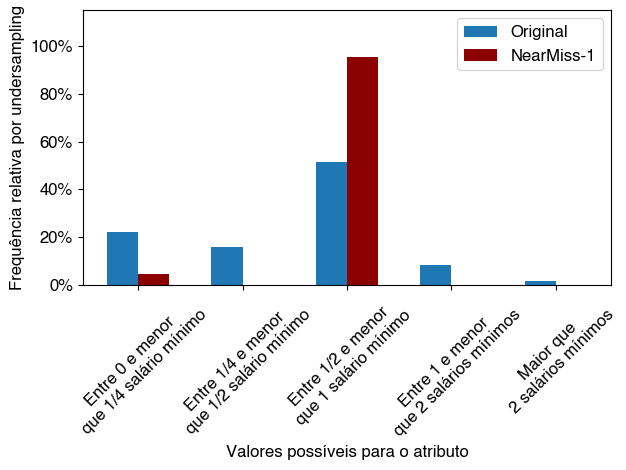

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


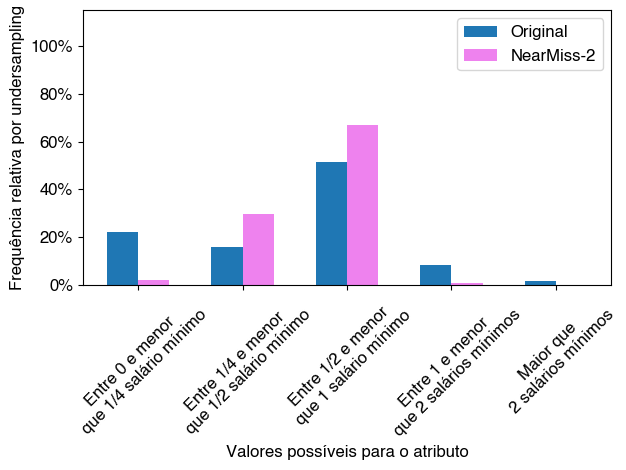

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


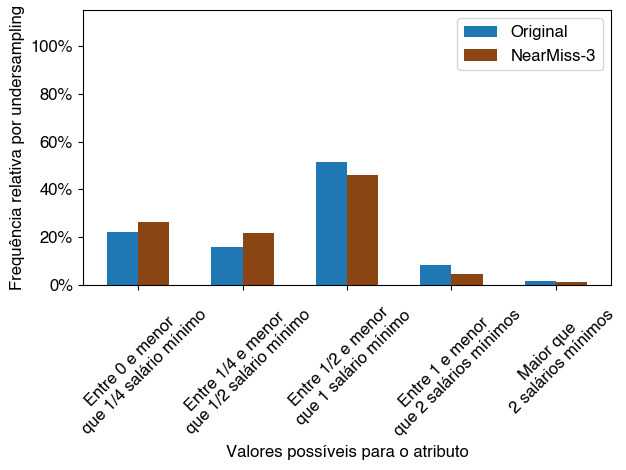

['Mãe \nAdolescente', 'Mãe \nAdulta']


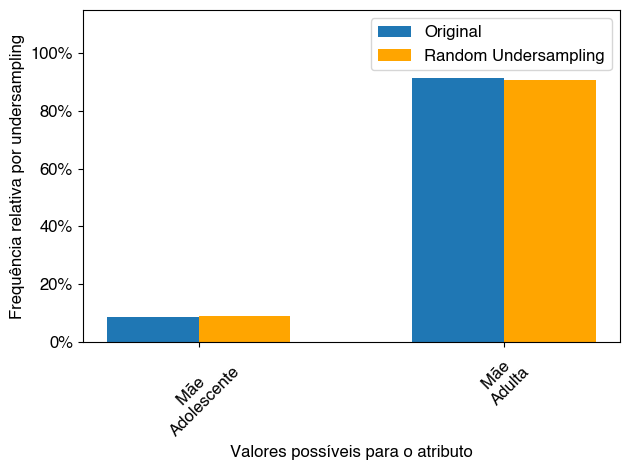

['Mãe \nAdolescente', 'Mãe \nAdulta']


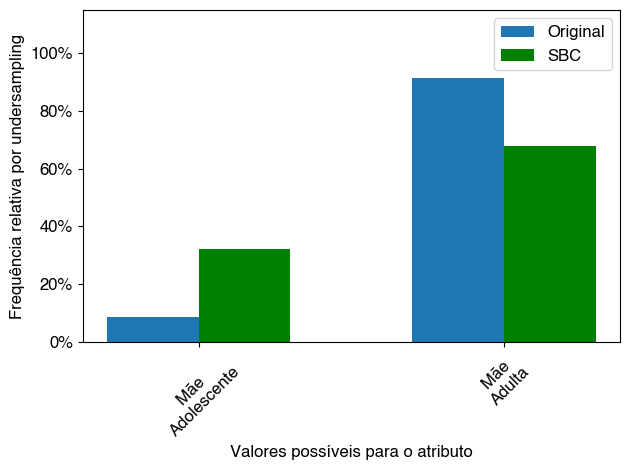

['Mãe \nAdolescente', 'Mãe \nAdulta']


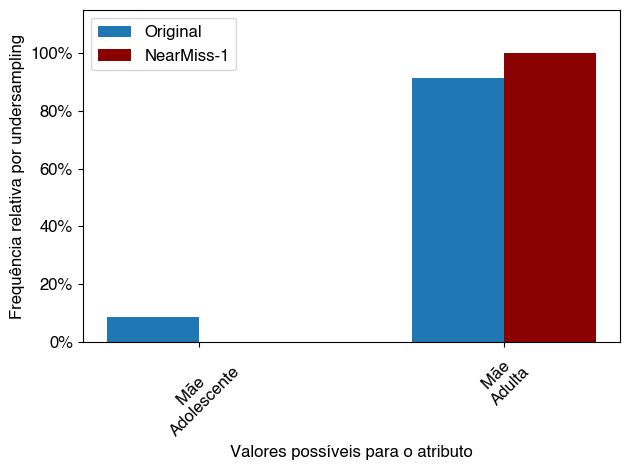

['Mãe \nAdolescente', 'Mãe \nAdulta']


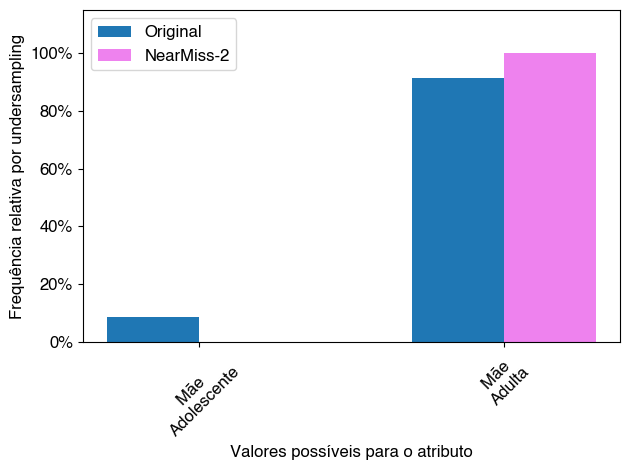

['Mãe \nAdolescente', 'Mãe \nAdulta']


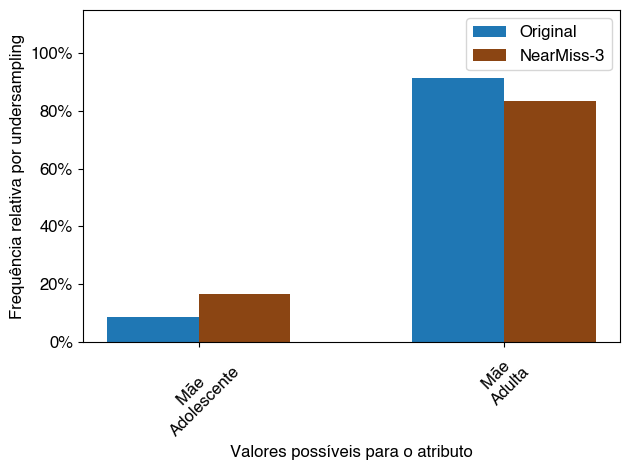

adaboost
['Negativo']


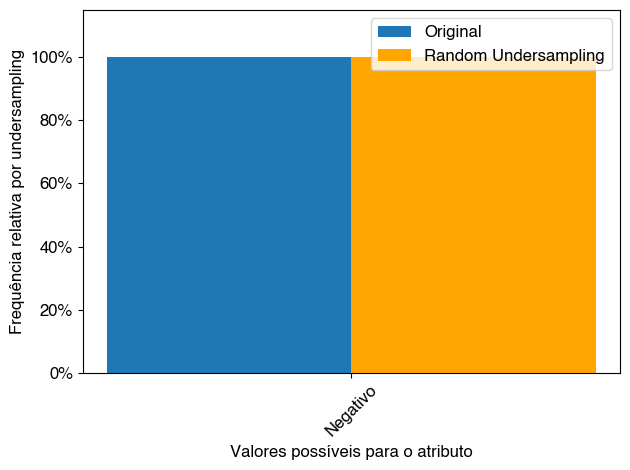

['Negativo']


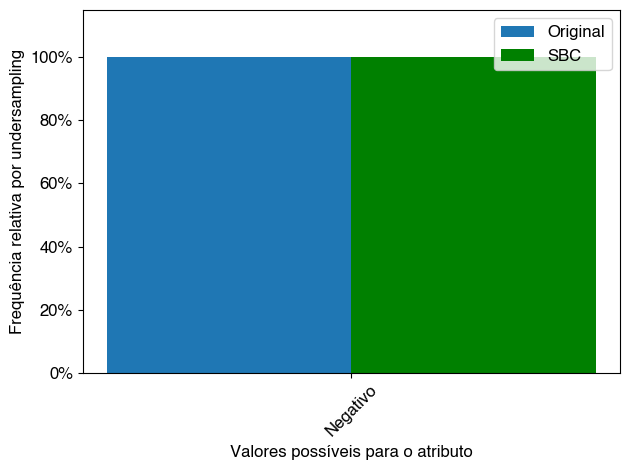

['Negativo']


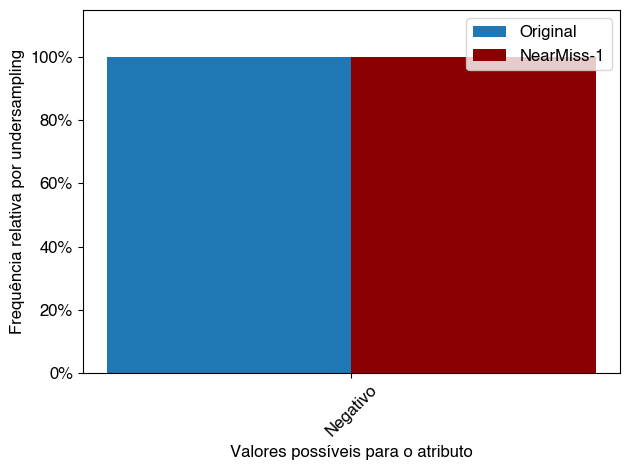

['Negativo']


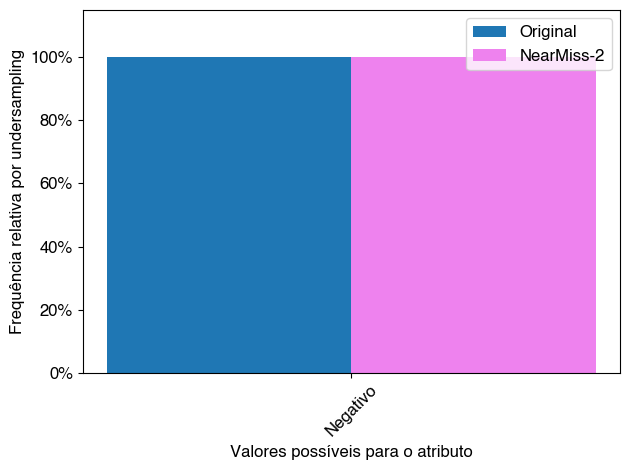

['Negativo']


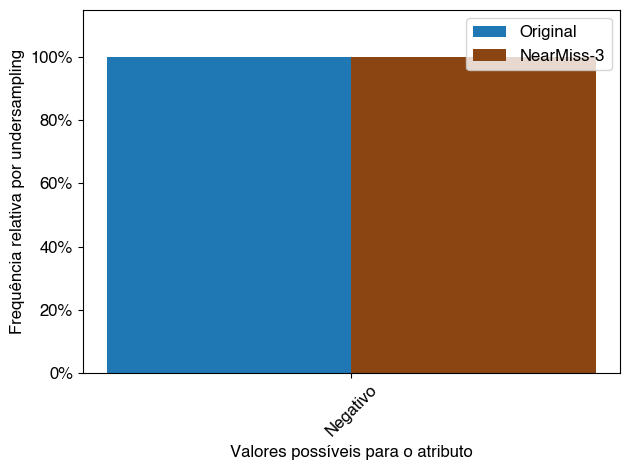

['Não Informado', 'Habitual', 'Alto']


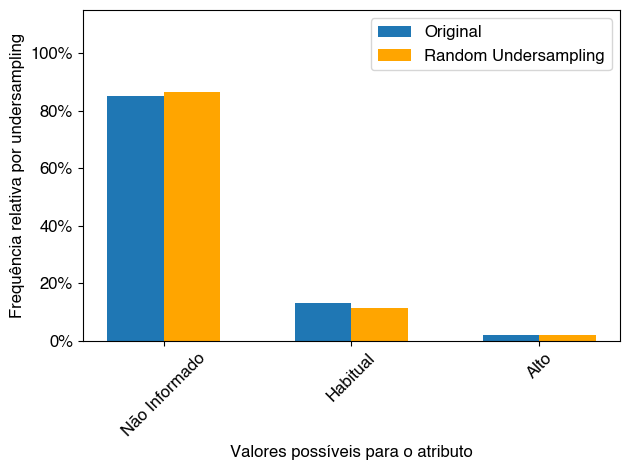

['Não Informado', 'Habitual', 'Alto']


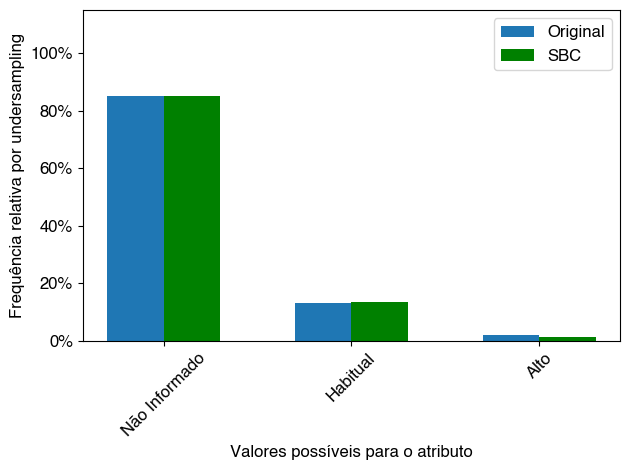

['Não Informado', 'Habitual', 'Alto']


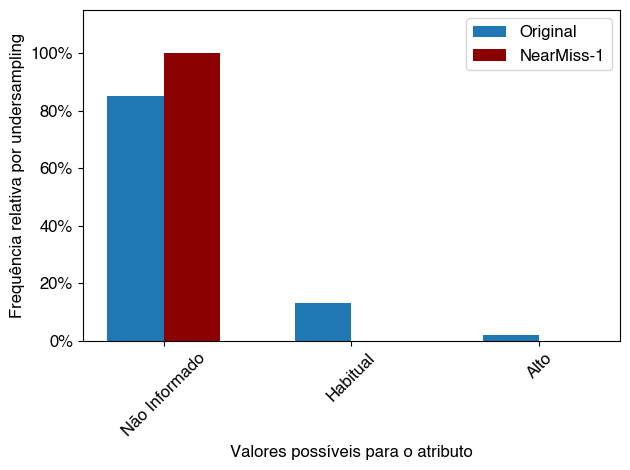

['Não Informado', 'Habitual', 'Alto']


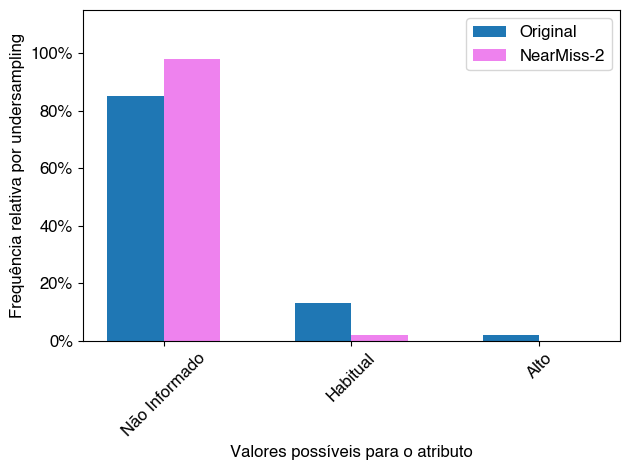

['Não Informado', 'Habitual', 'Alto']


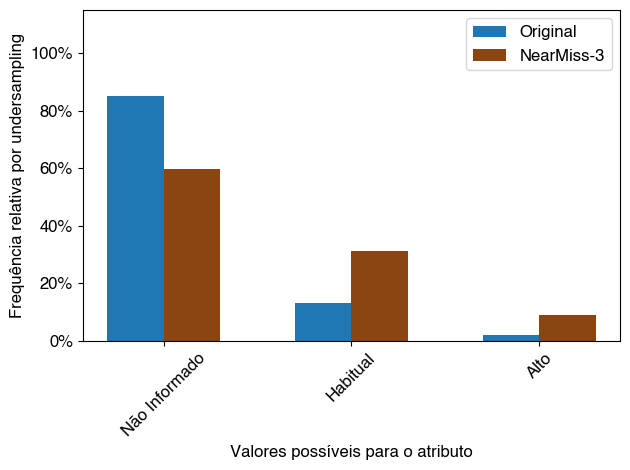

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


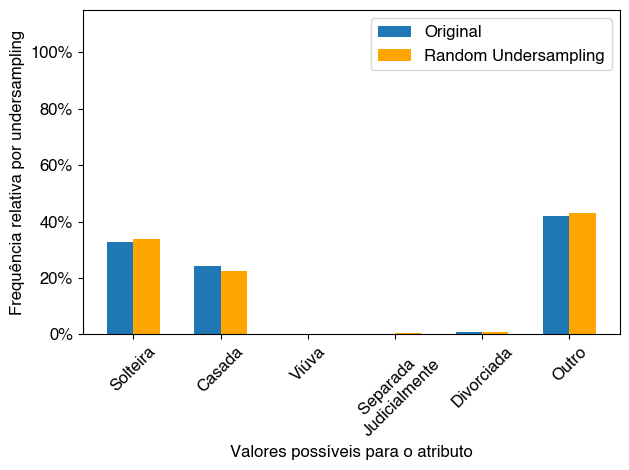

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


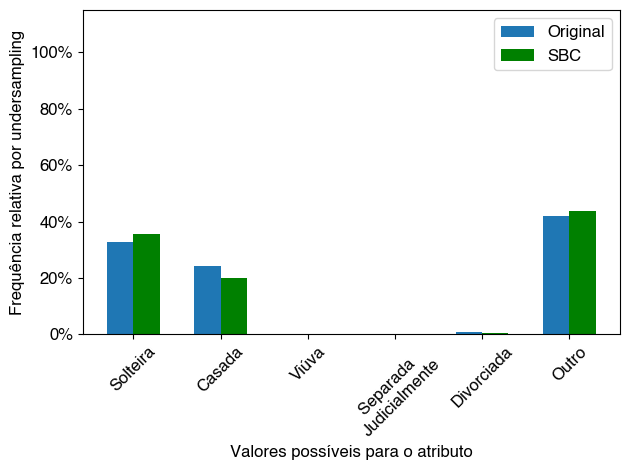

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


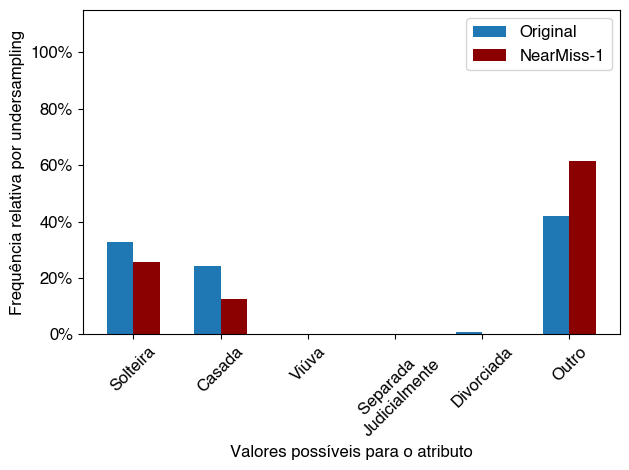

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


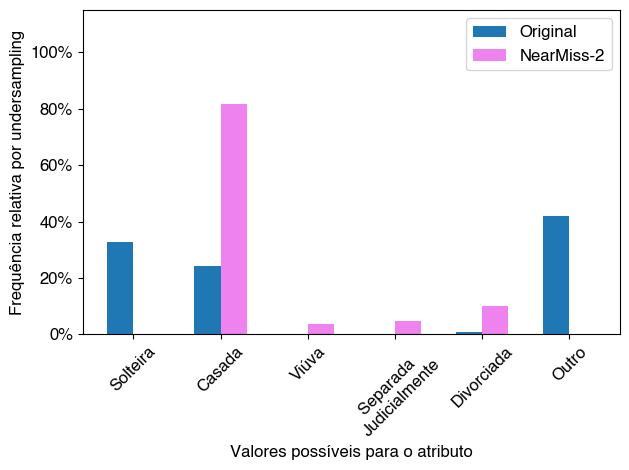

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


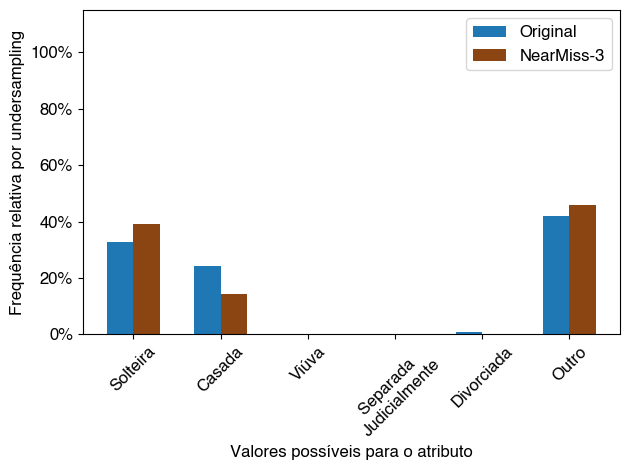

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


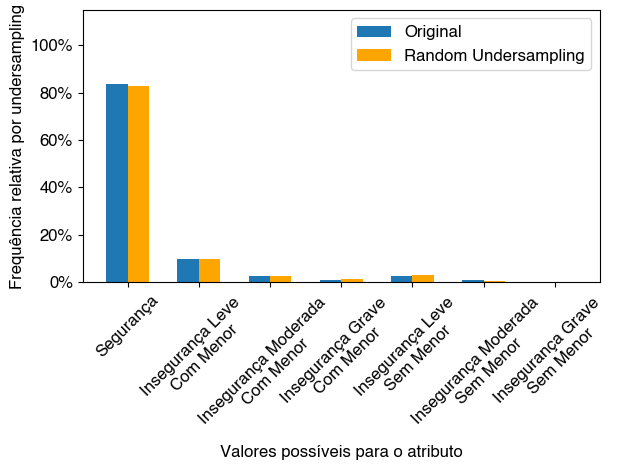

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


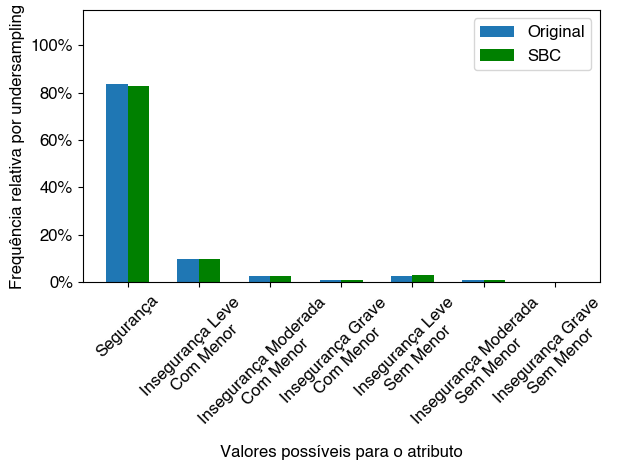

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


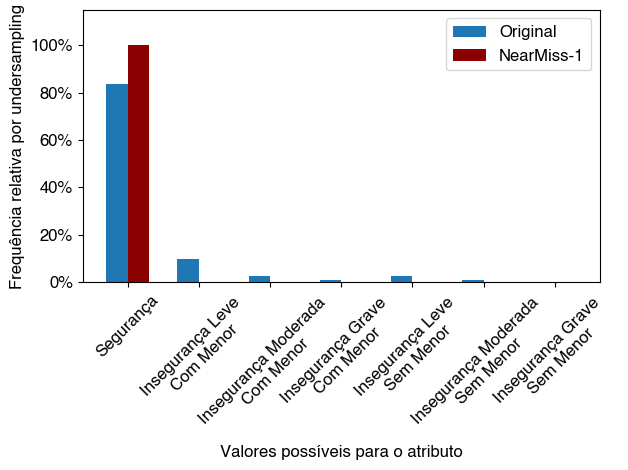

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


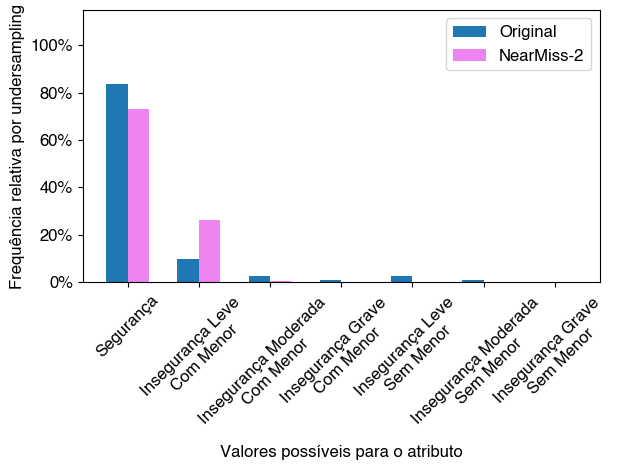

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


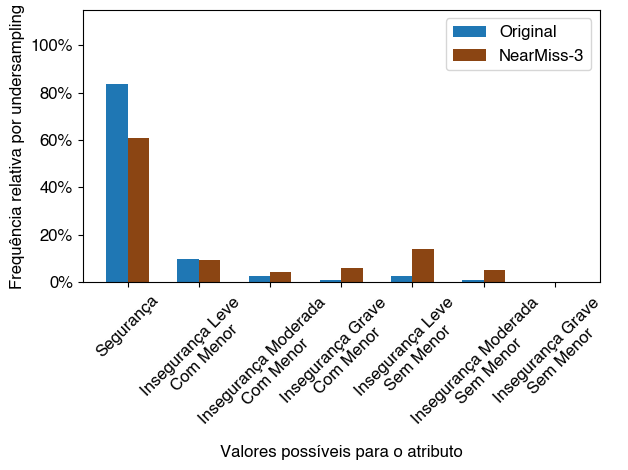

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


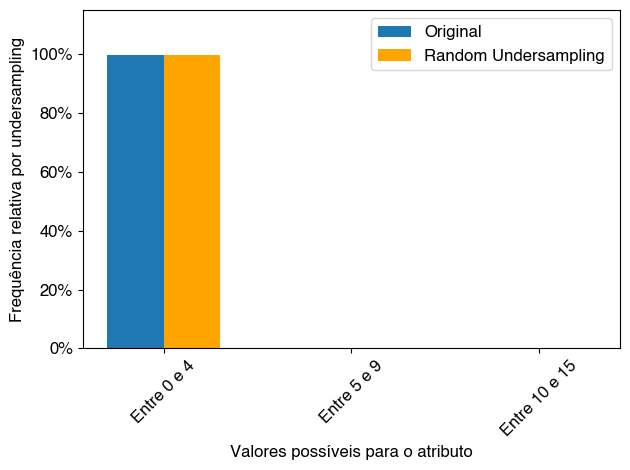

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


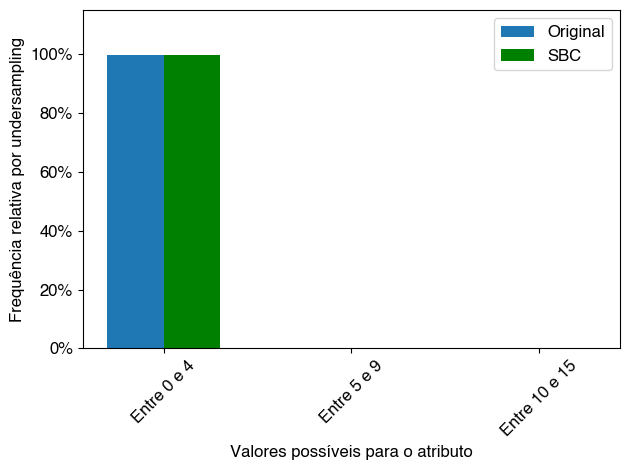

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


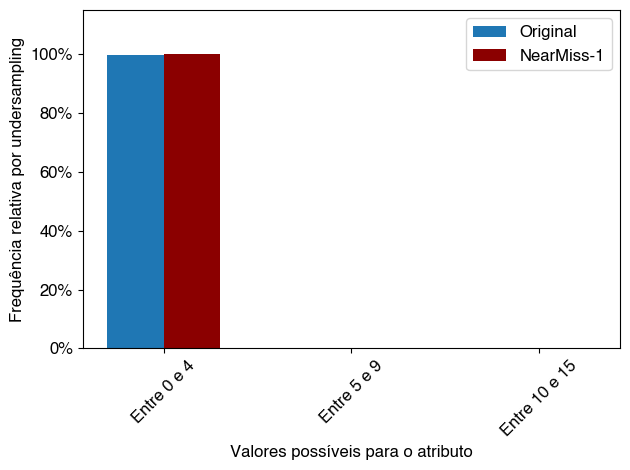

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


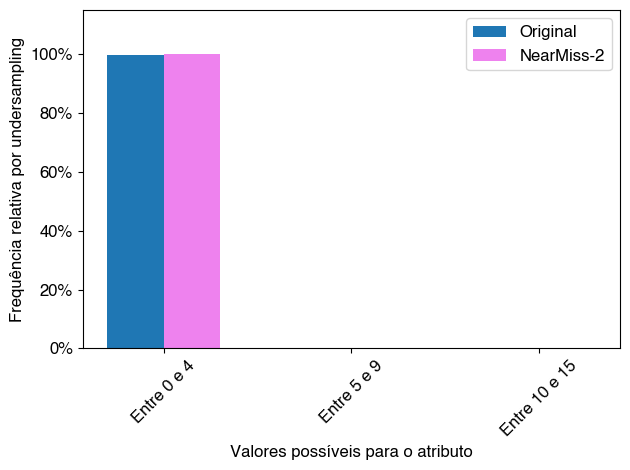

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


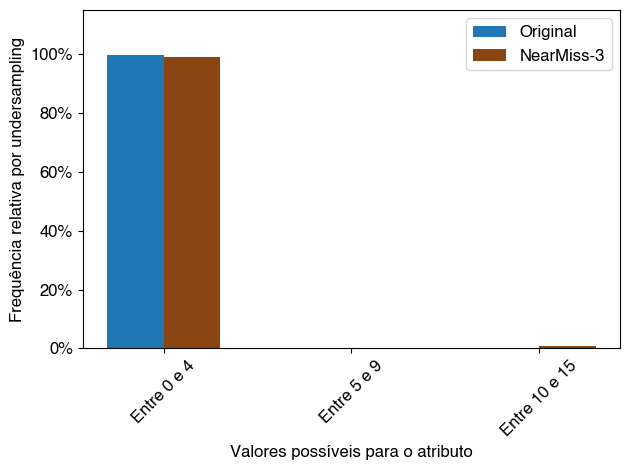

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


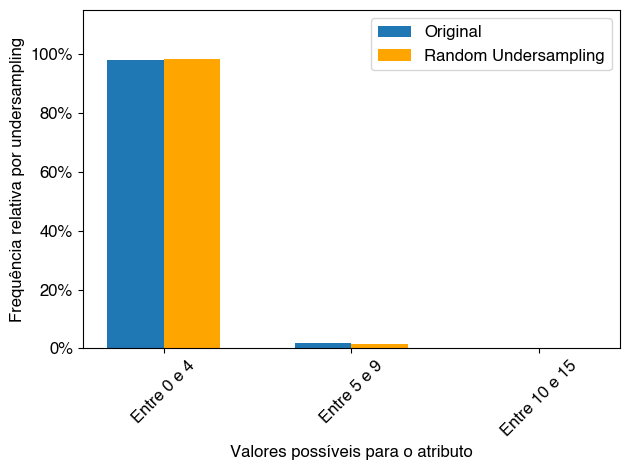

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


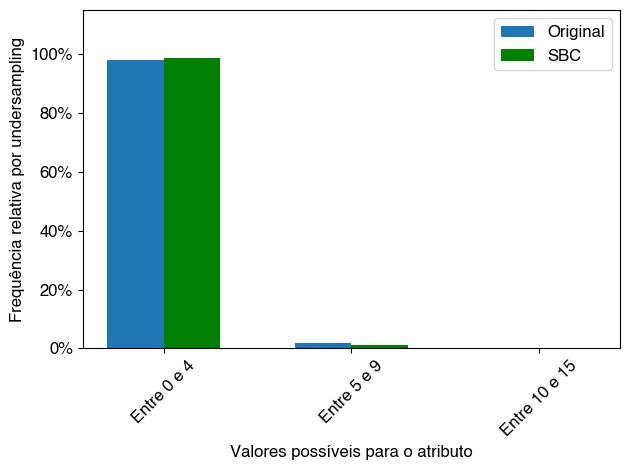

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


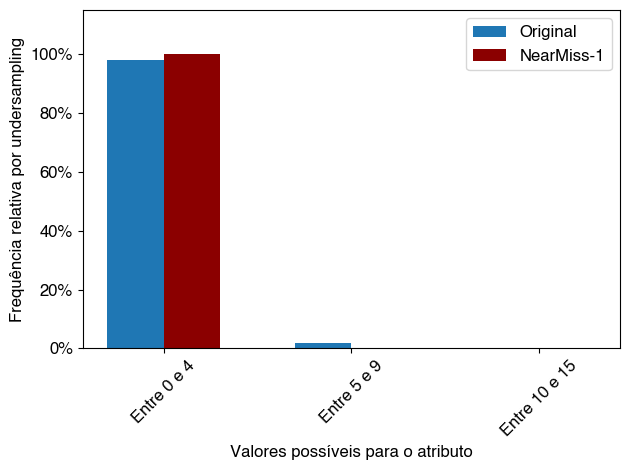

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


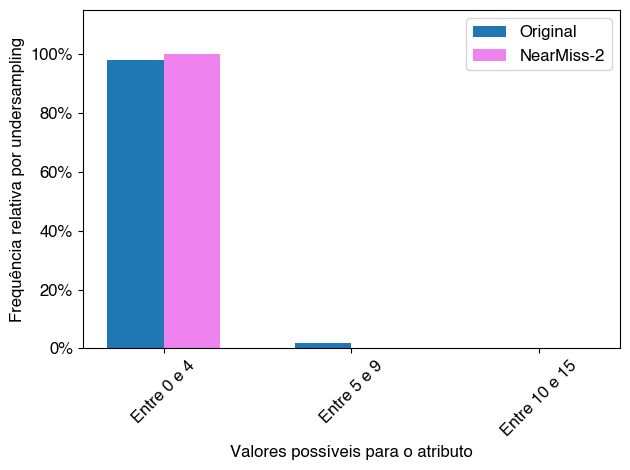

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


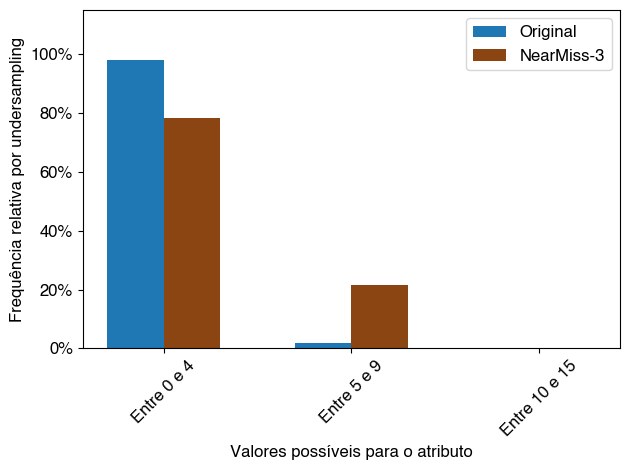

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


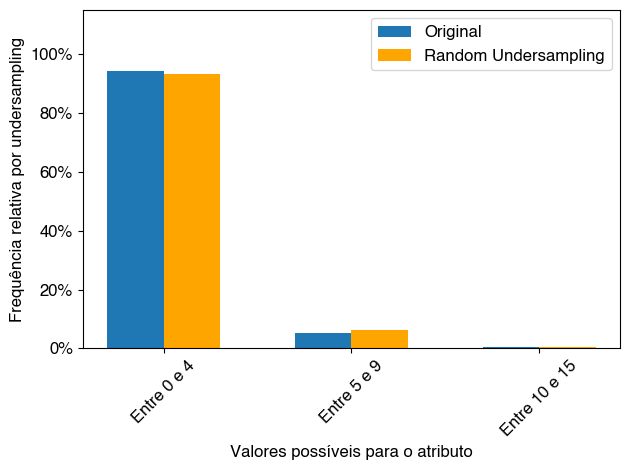

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


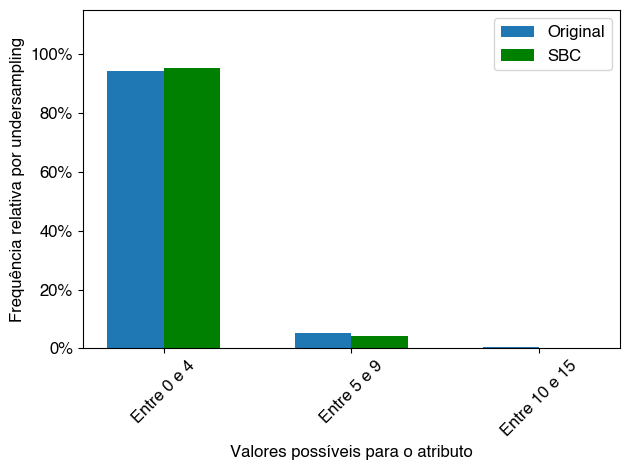

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


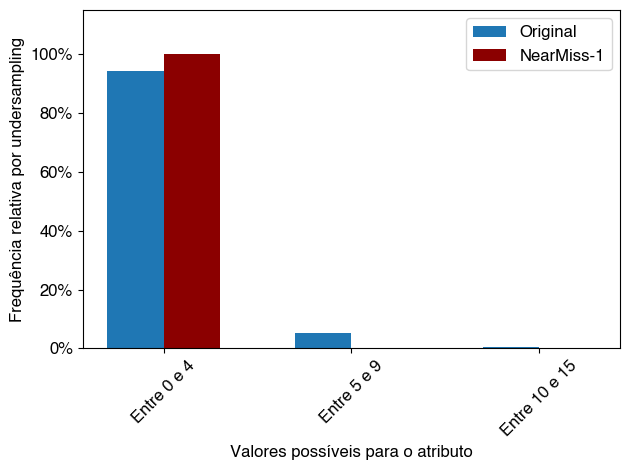

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


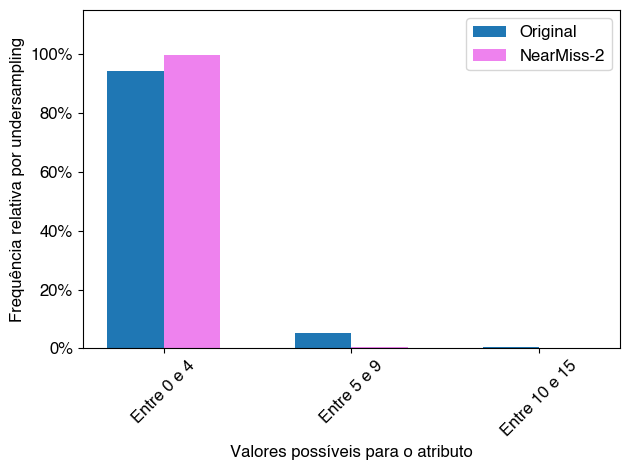

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


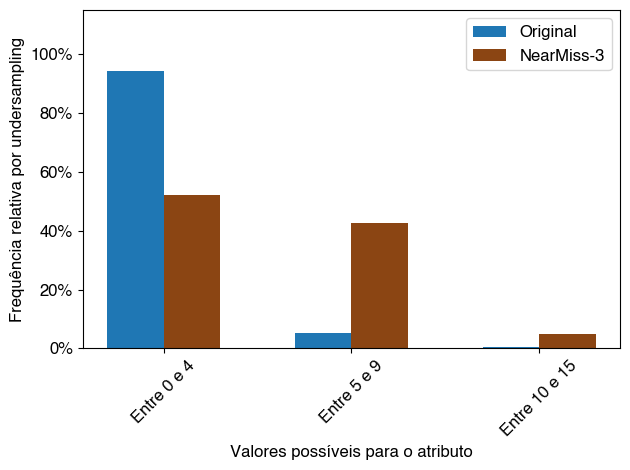

['Não', 'Sim']


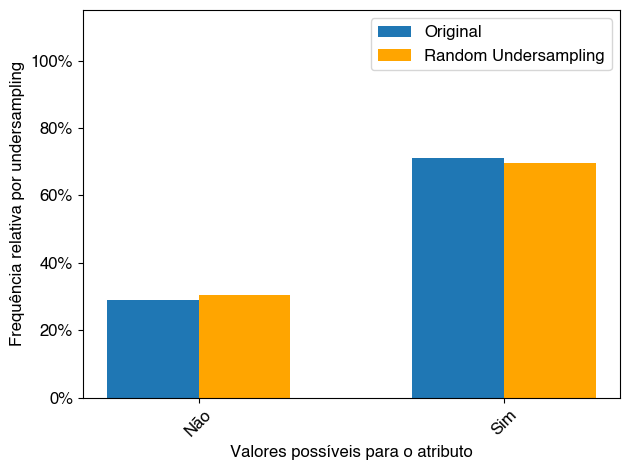

['Não', 'Sim']


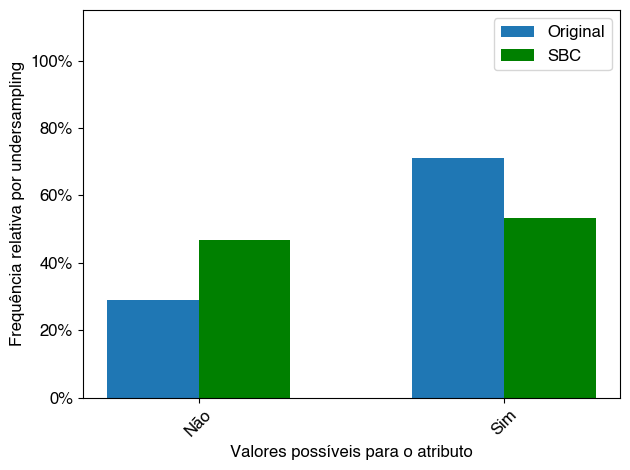

['Não', 'Sim']


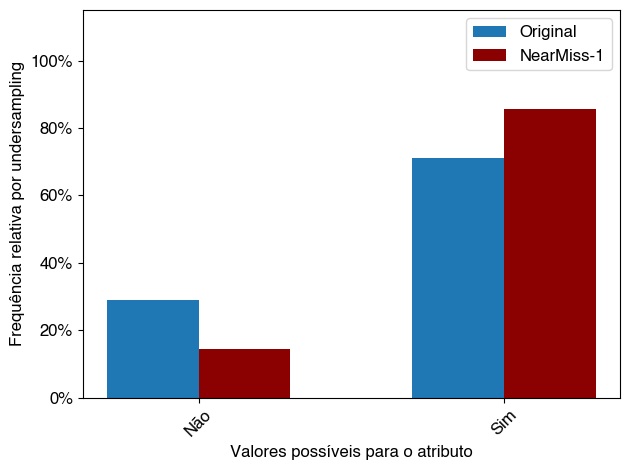

['Não', 'Sim']


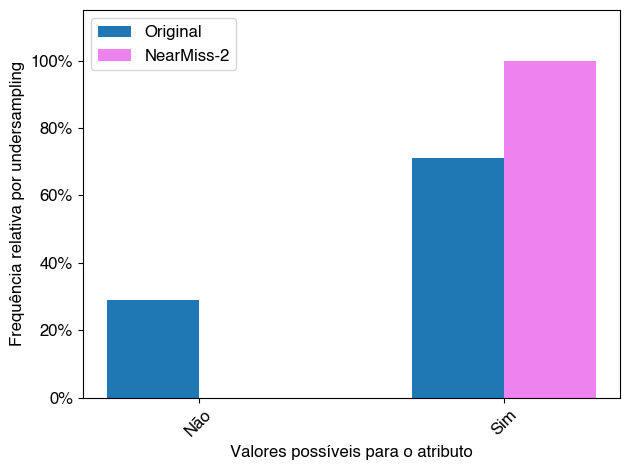

['Não', 'Sim']


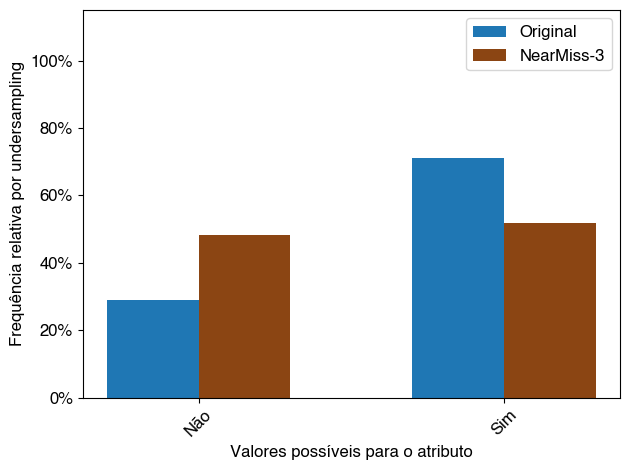

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


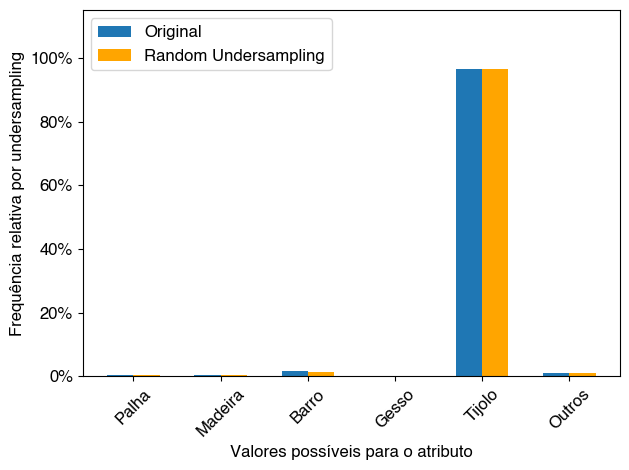

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


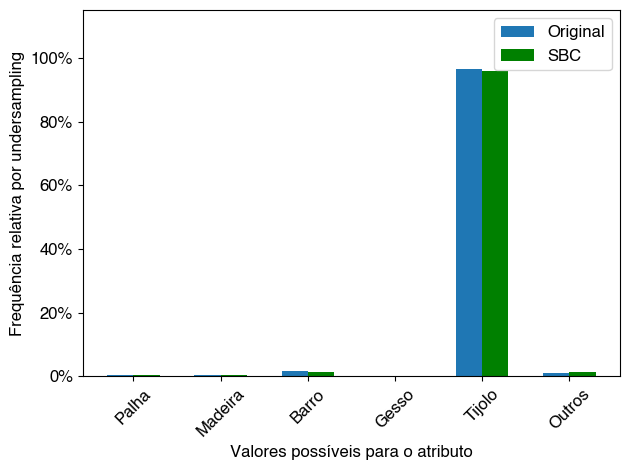

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


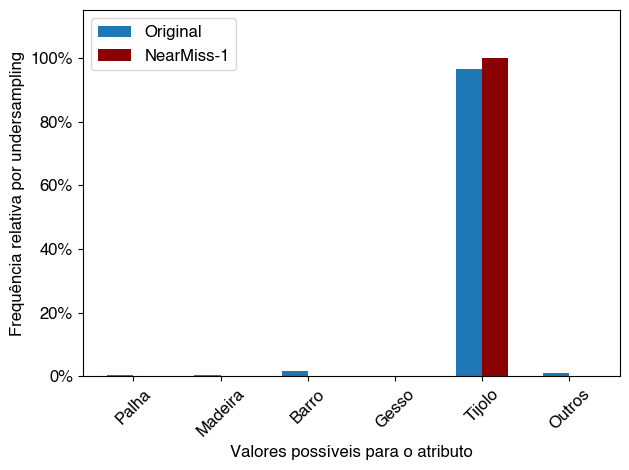

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


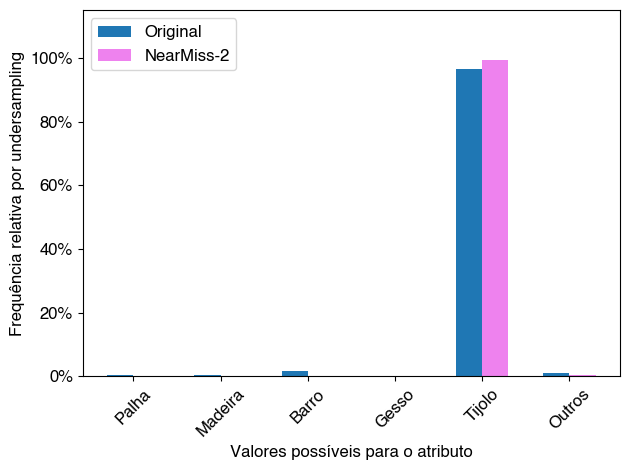

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


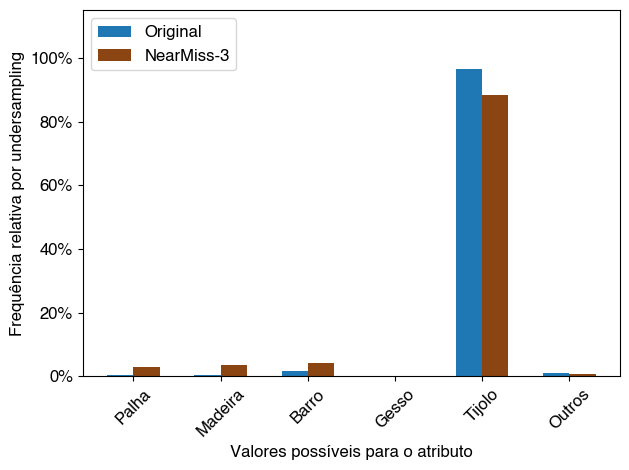

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


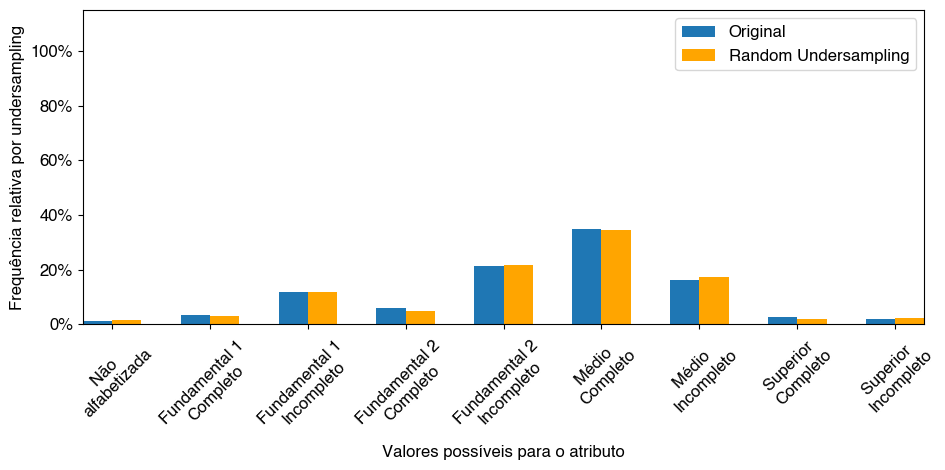

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


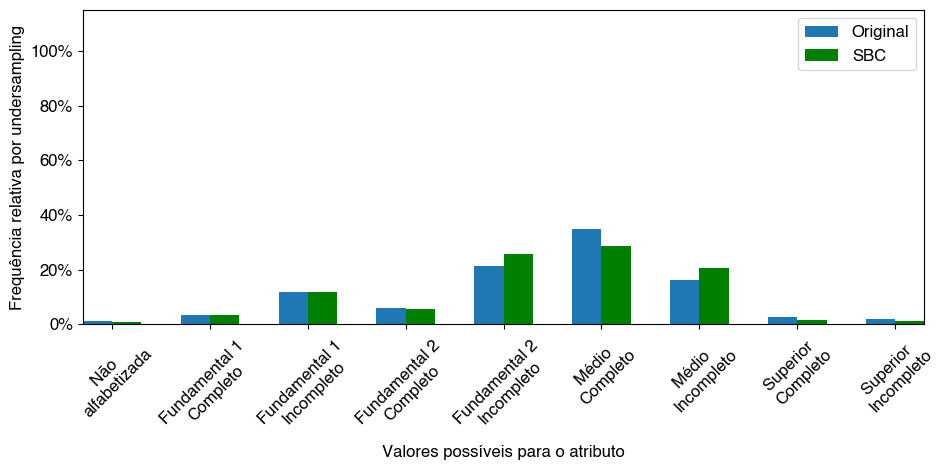

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


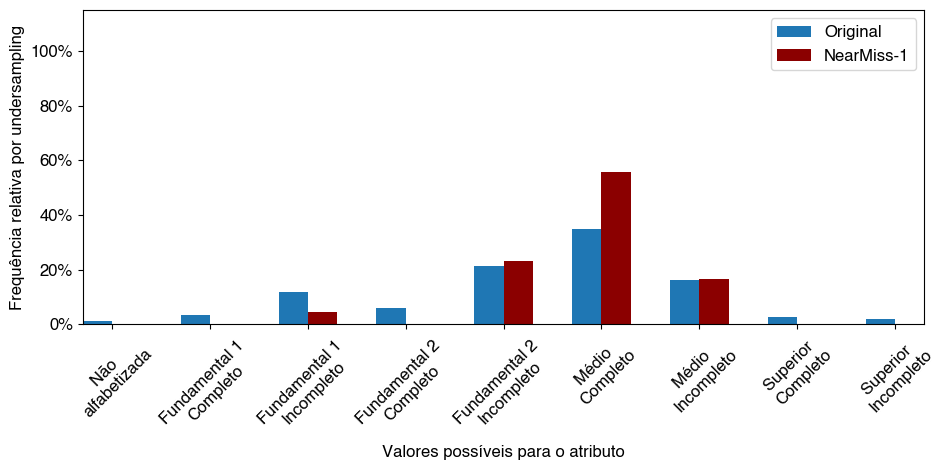

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


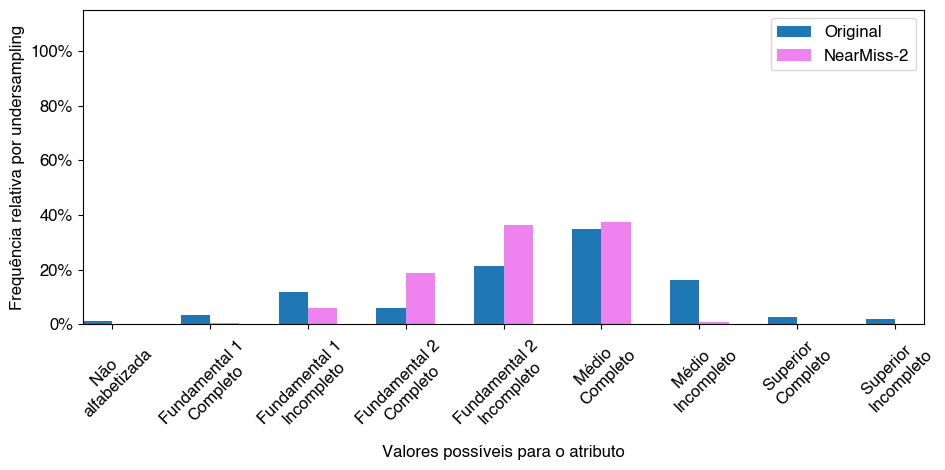

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


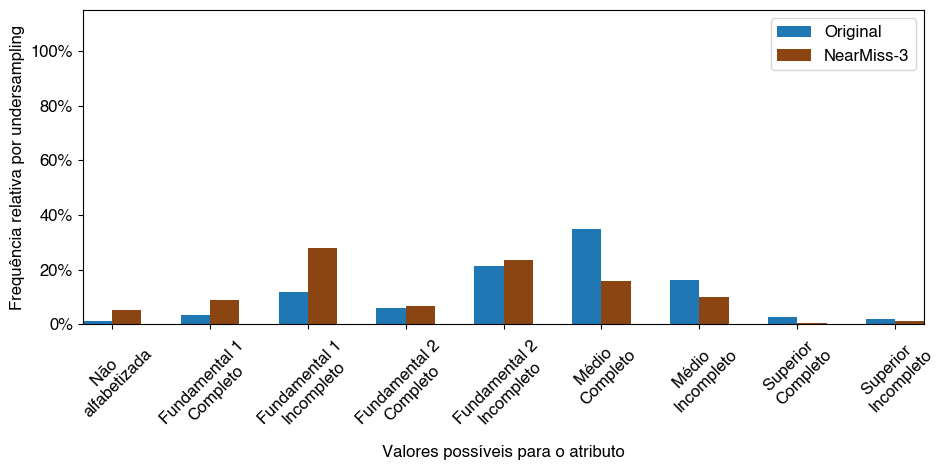

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


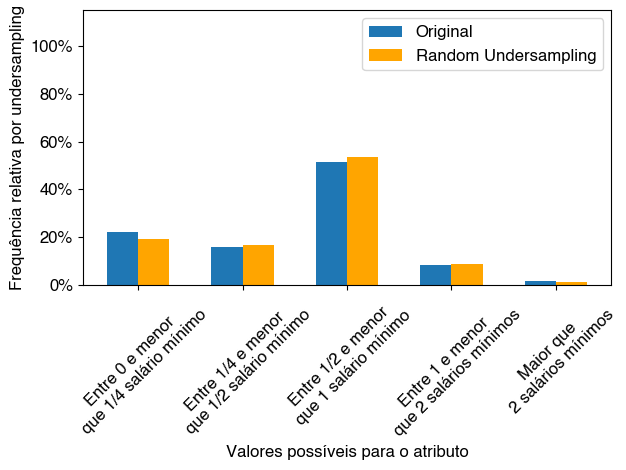

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


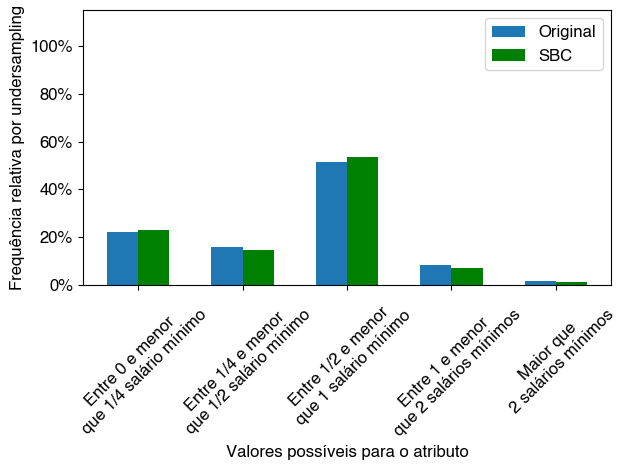

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


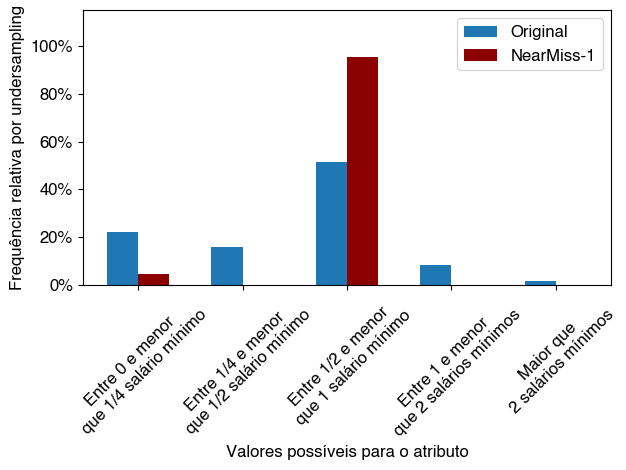

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


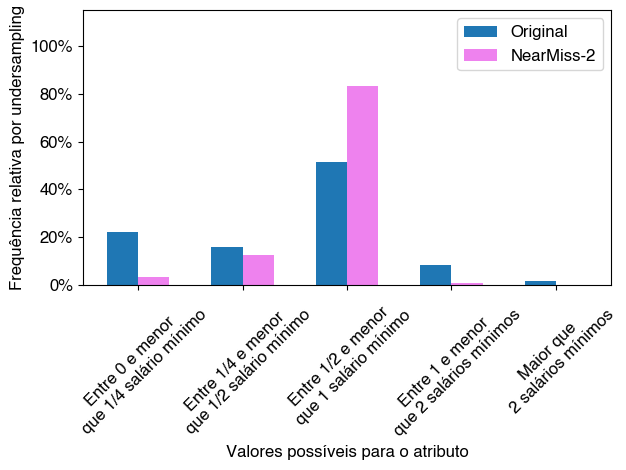

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


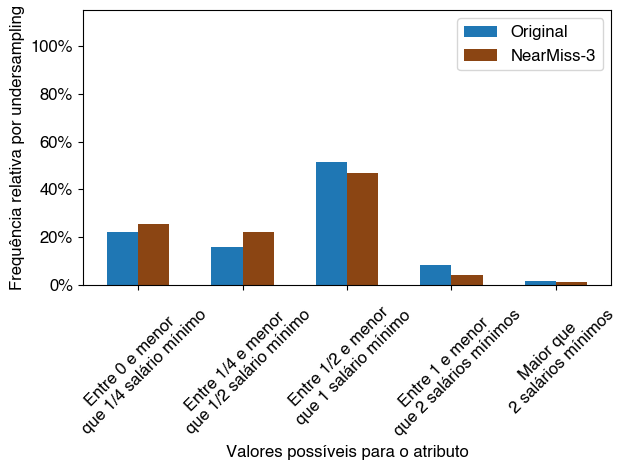

['Mãe \nAdolescente', 'Mãe \nAdulta']


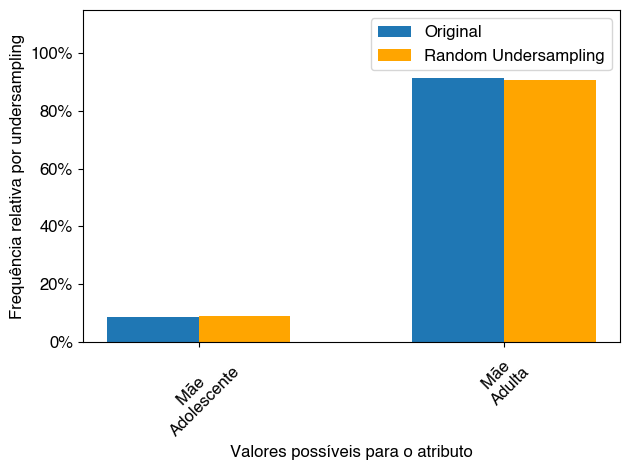

['Mãe \nAdolescente', 'Mãe \nAdulta']


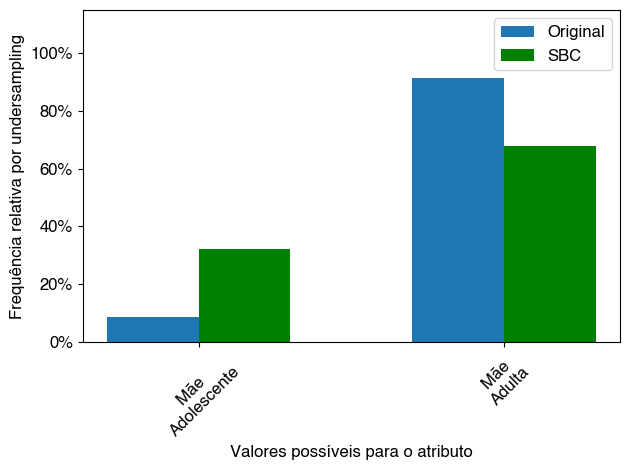

['Mãe \nAdolescente', 'Mãe \nAdulta']


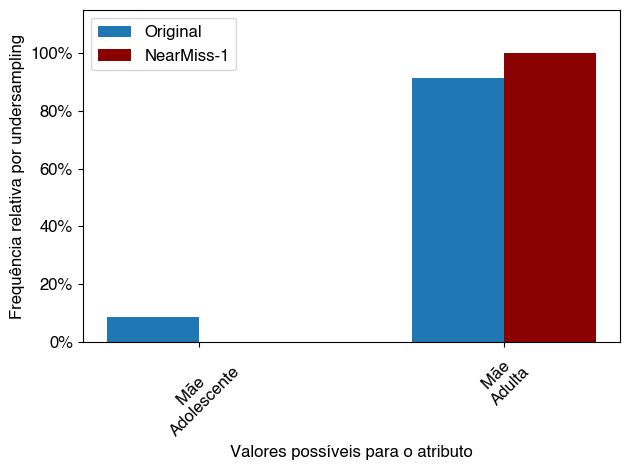

['Mãe \nAdolescente', 'Mãe \nAdulta']


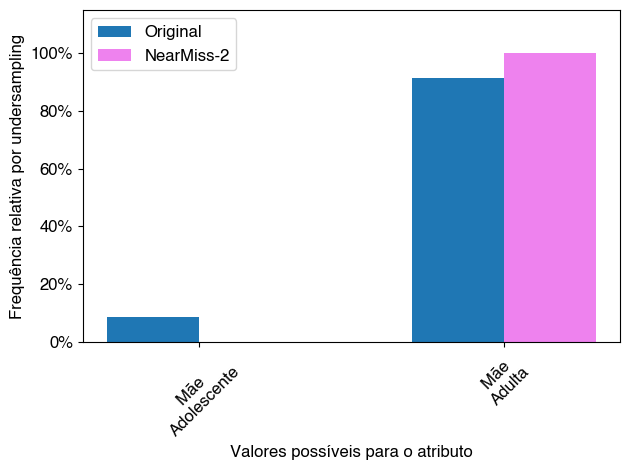

['Mãe \nAdolescente', 'Mãe \nAdulta']


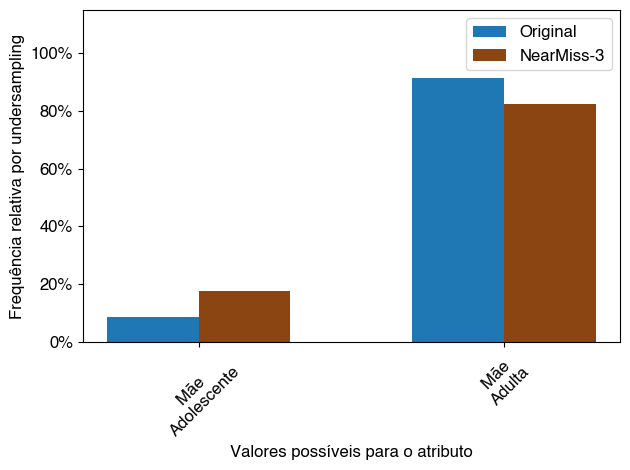

gbm
['Negativo']


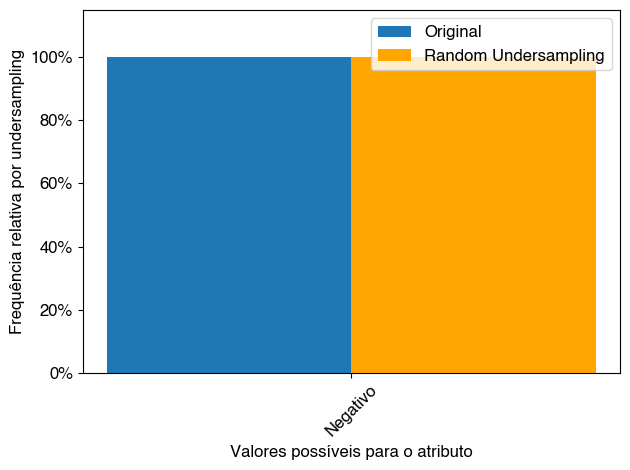

['Negativo']


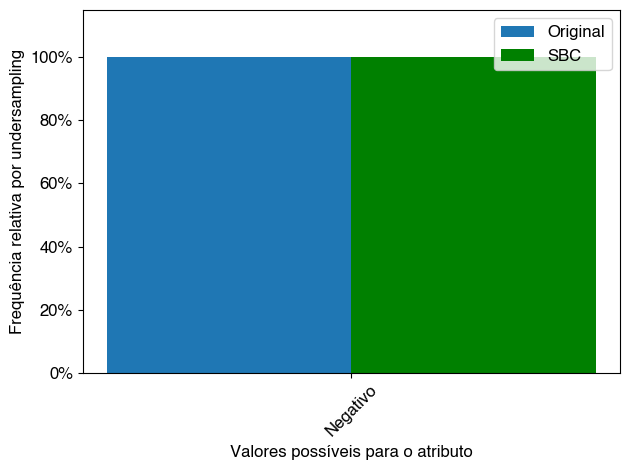

['Negativo']


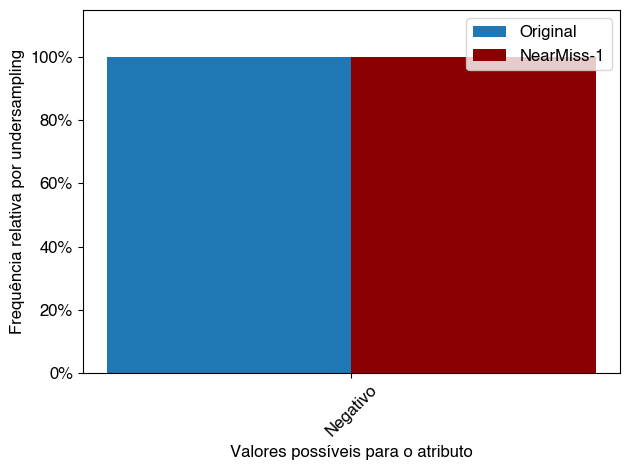

['Negativo']


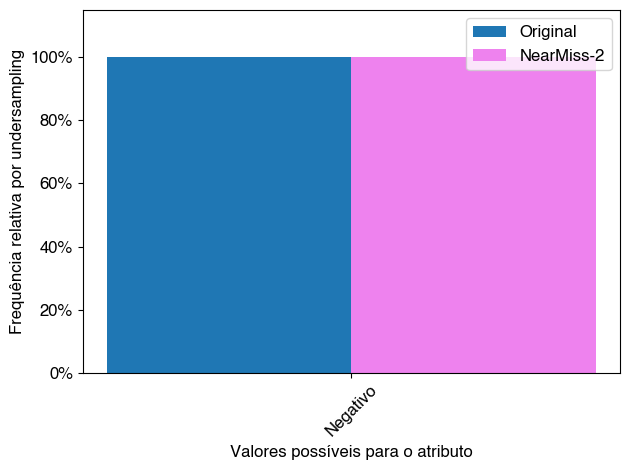

['Negativo']


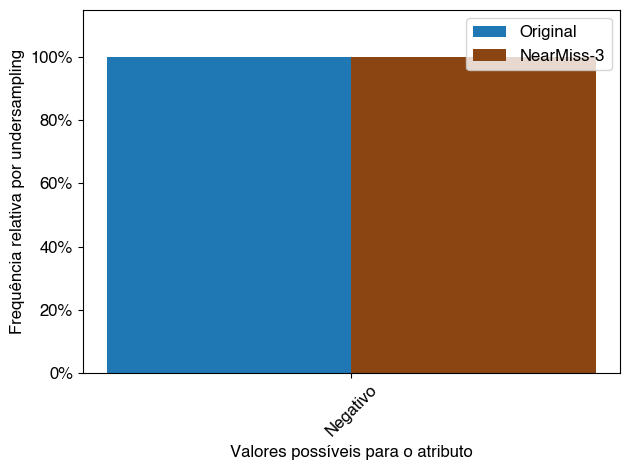

['Não Informado', 'Habitual', 'Alto']


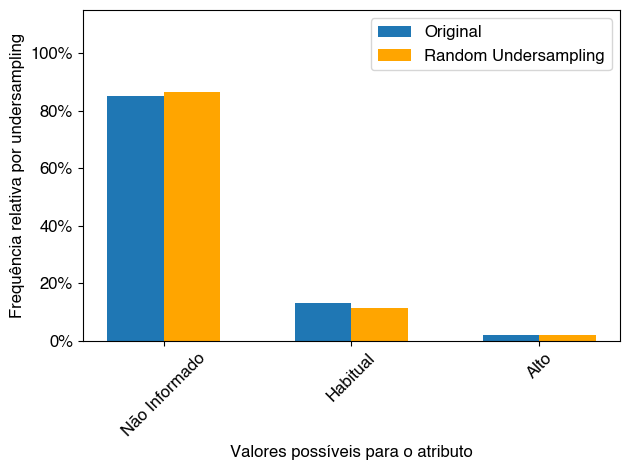

['Não Informado', 'Habitual', 'Alto']


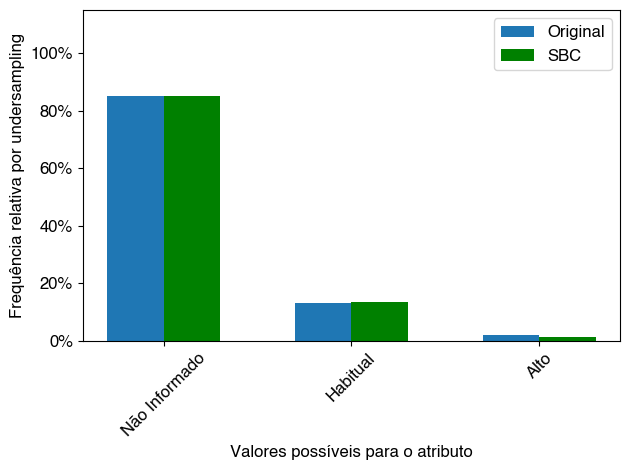

['Não Informado', 'Habitual', 'Alto']


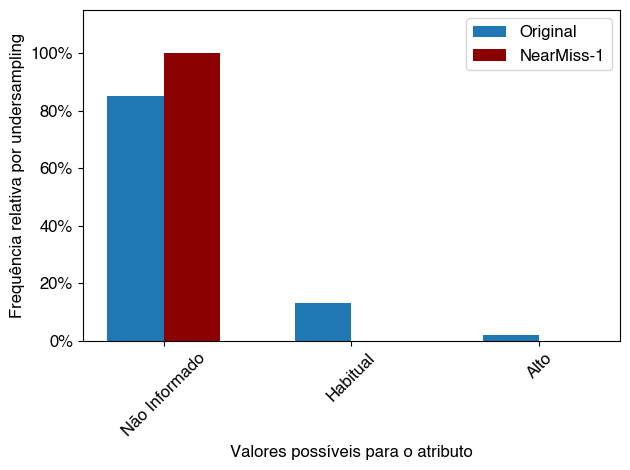

['Não Informado', 'Habitual', 'Alto']


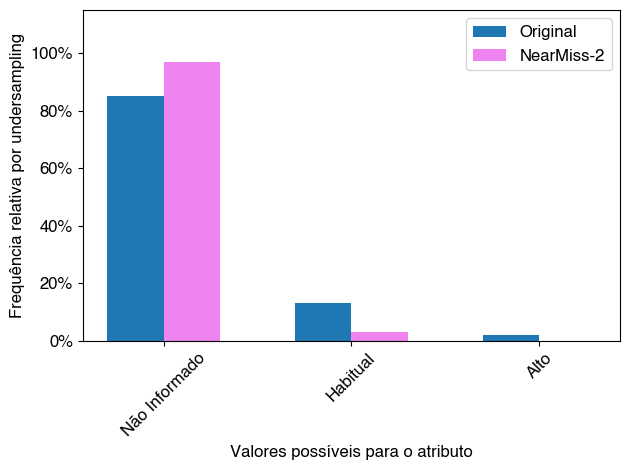

['Não Informado', 'Habitual', 'Alto']


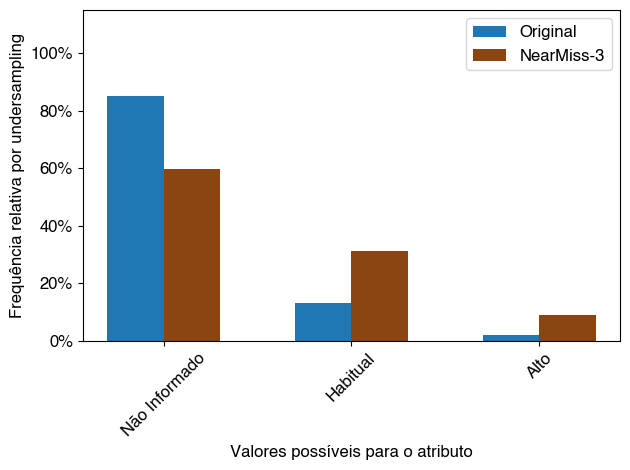

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


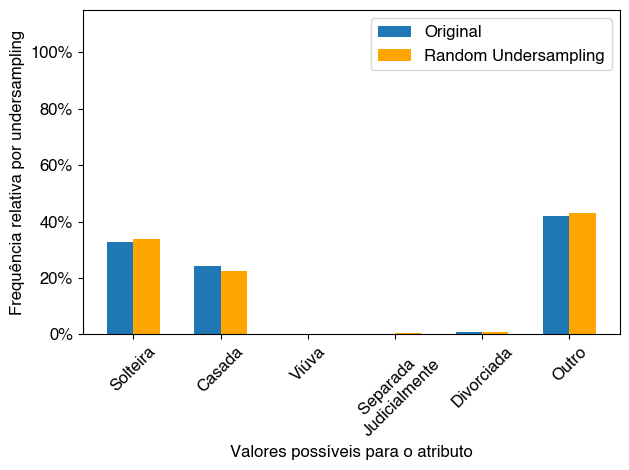

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


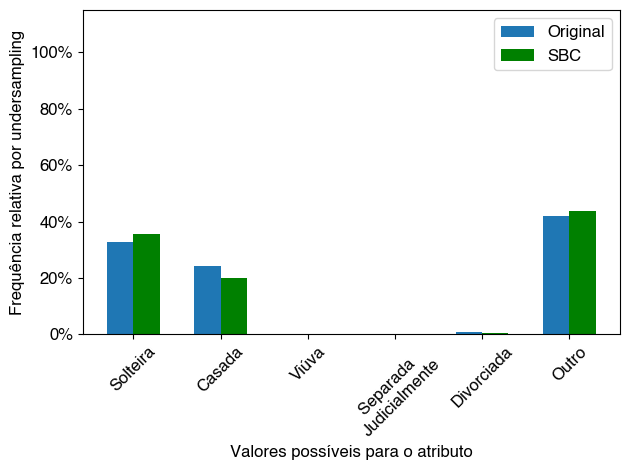

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


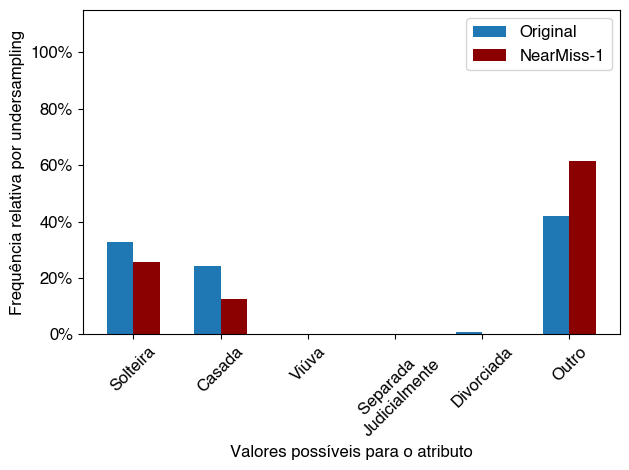

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


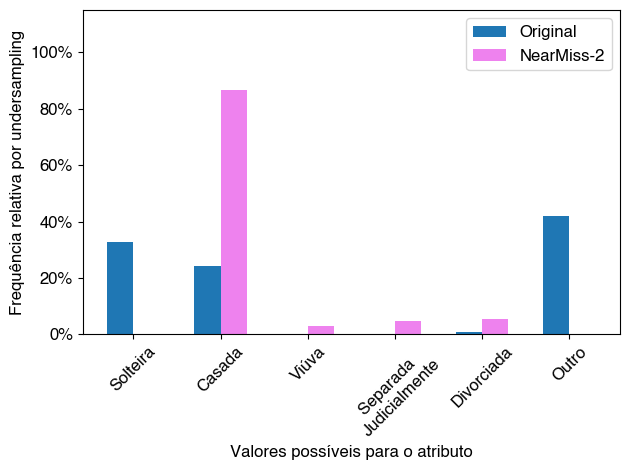

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


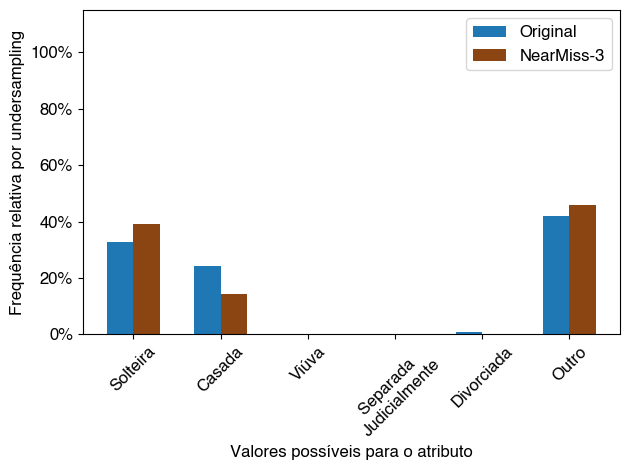

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


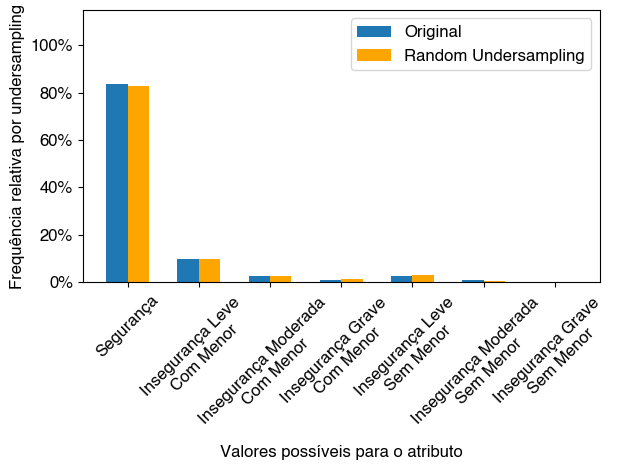

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


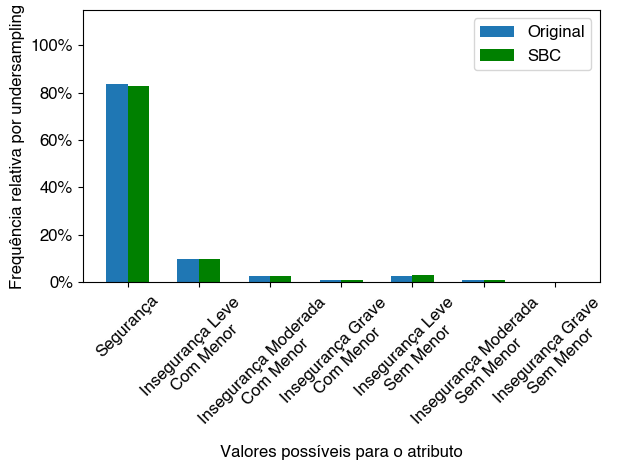

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


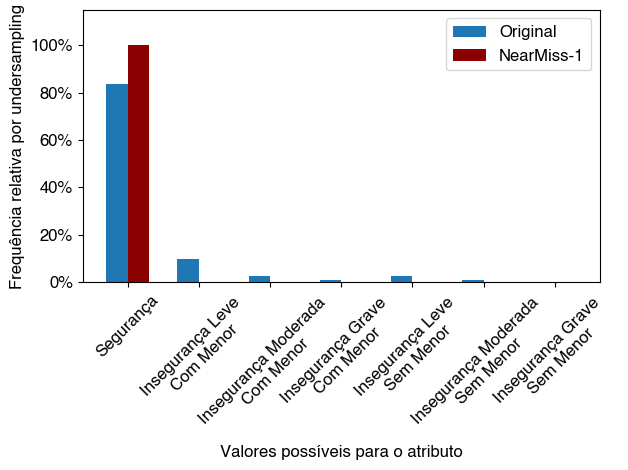

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


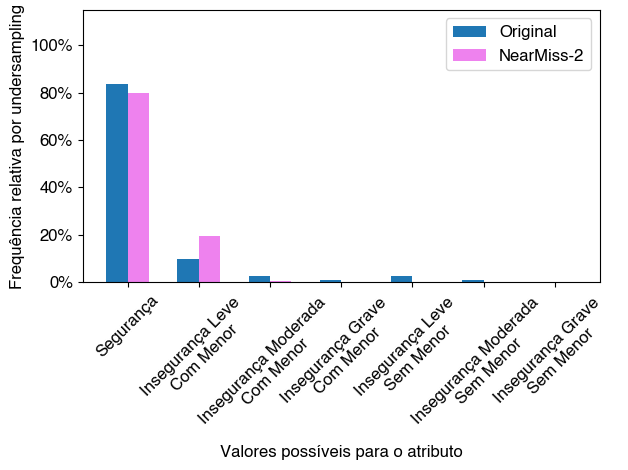

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


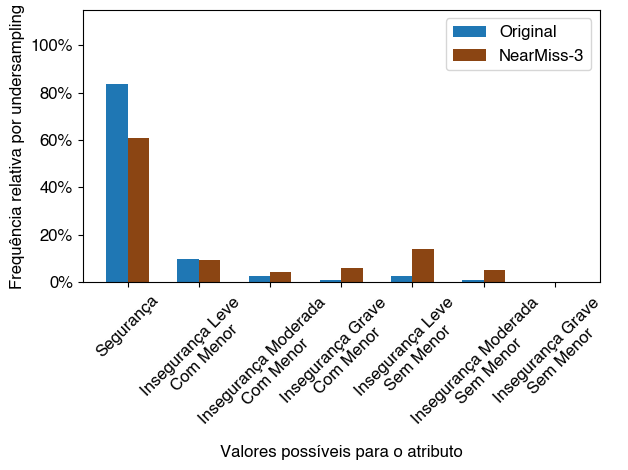

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


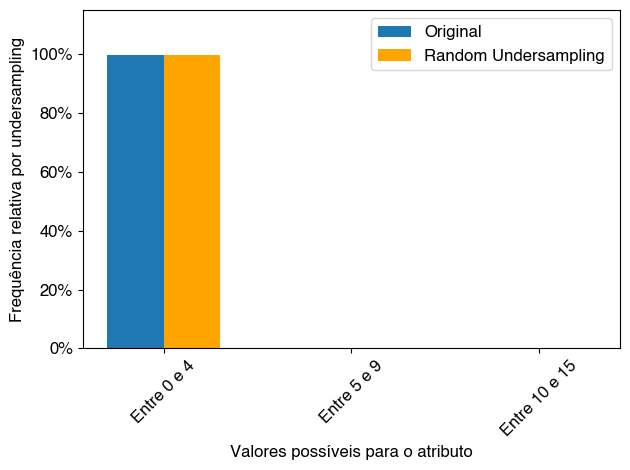

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


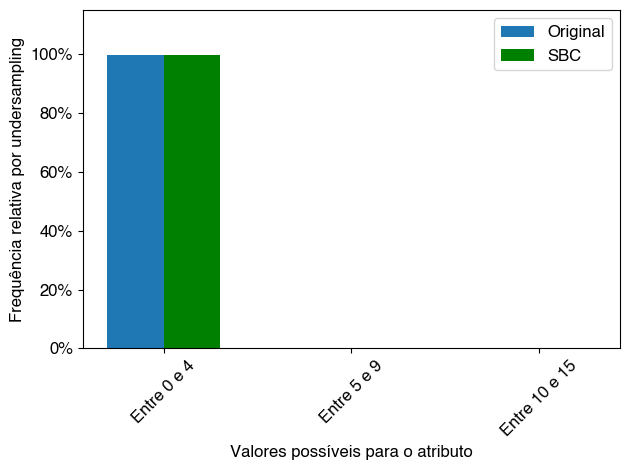

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


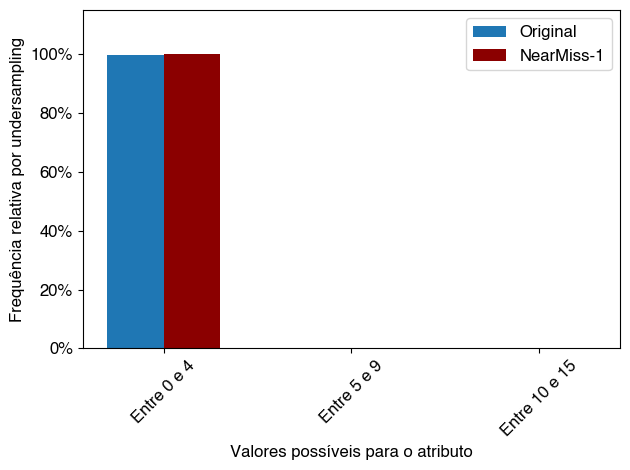

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


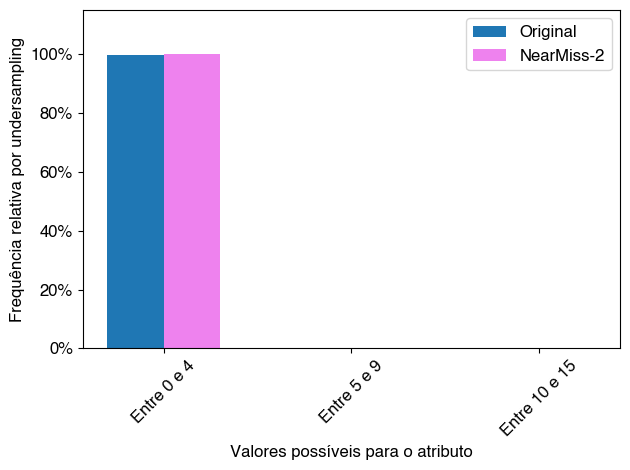

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


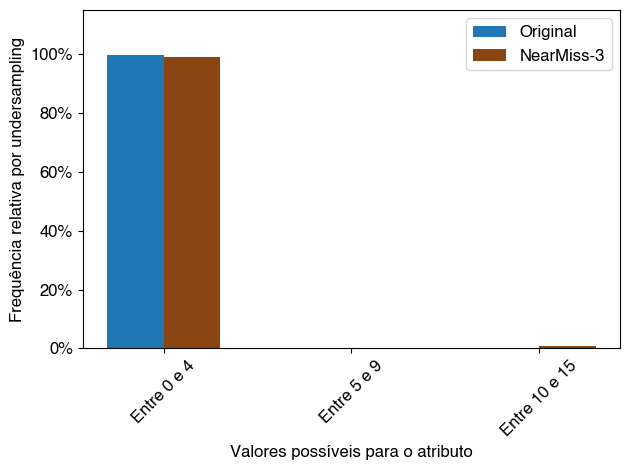

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


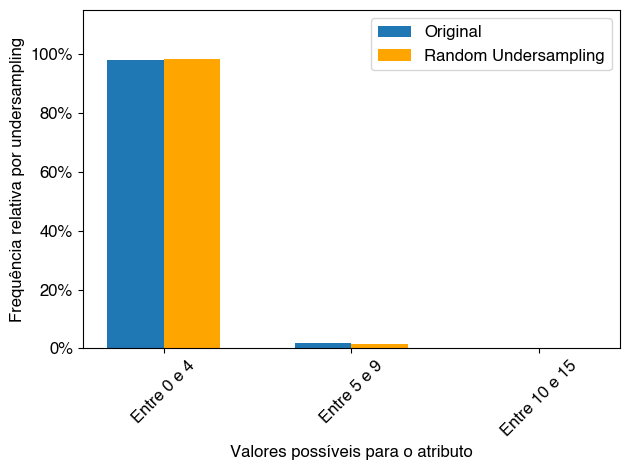

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


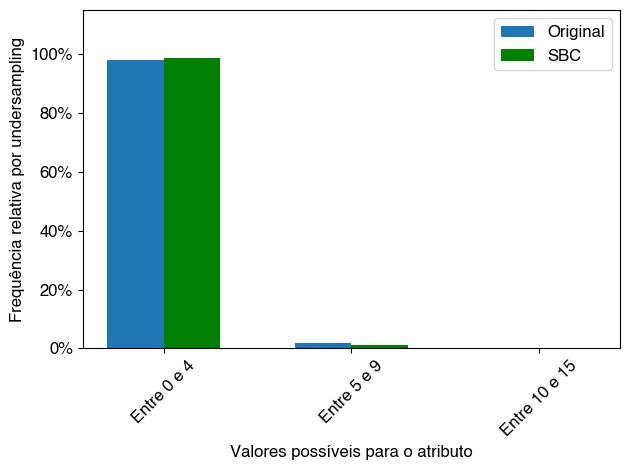

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


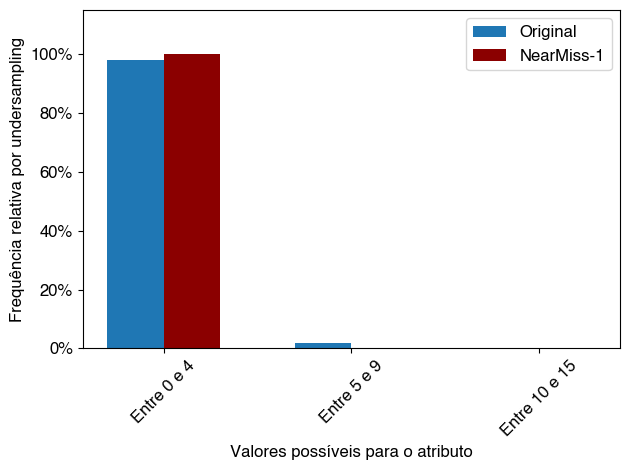

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


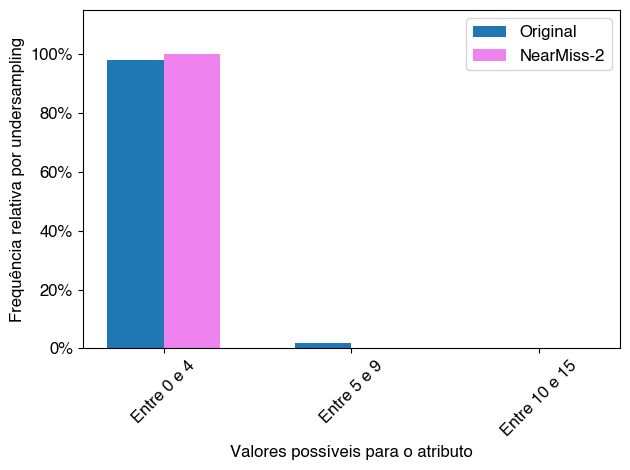

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


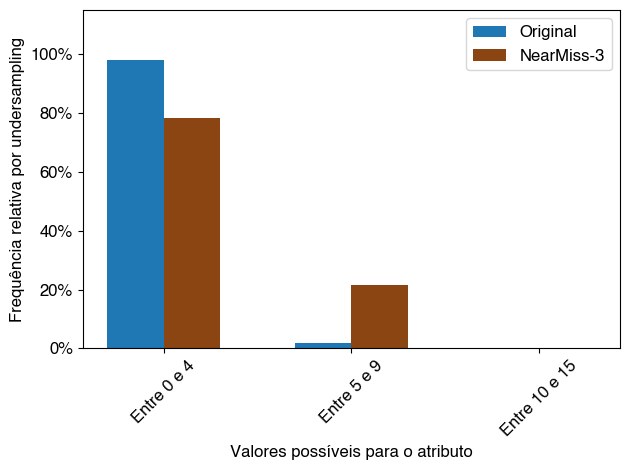

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


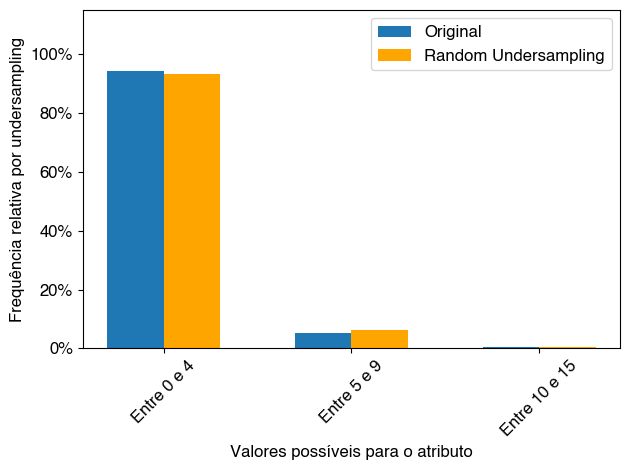

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


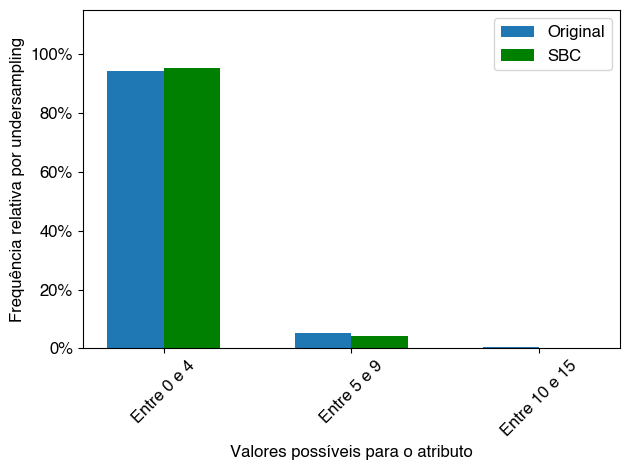

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


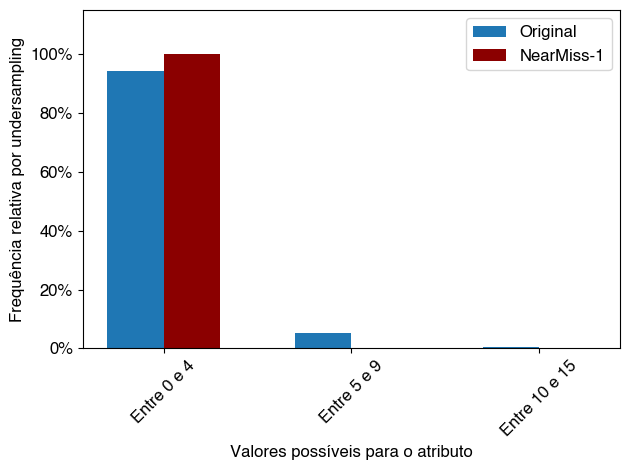

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


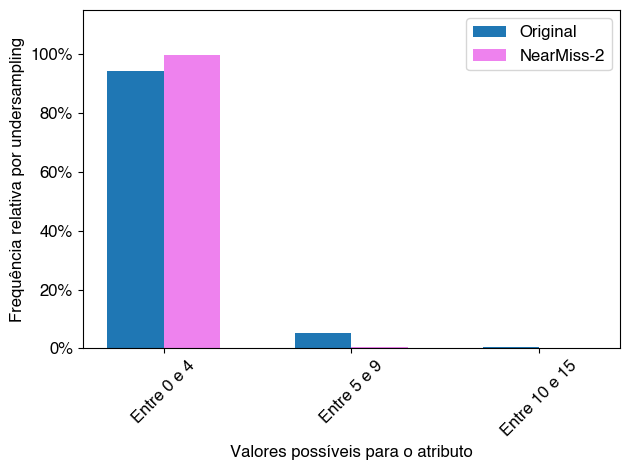

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


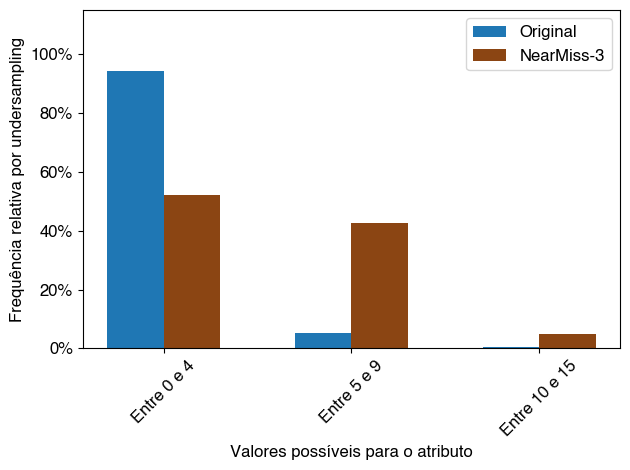

['Não', 'Sim']


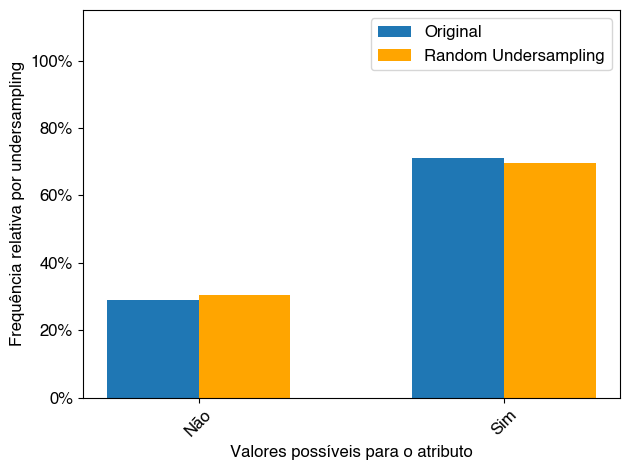

['Não', 'Sim']


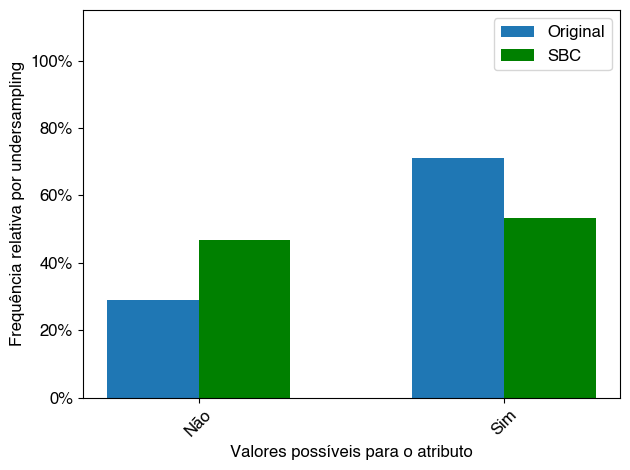

['Não', 'Sim']


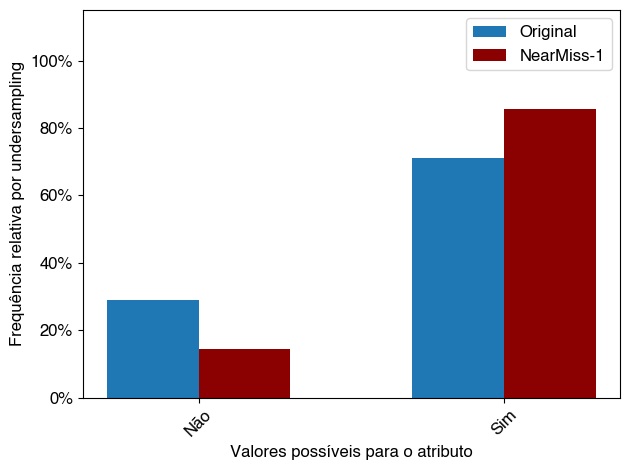

['Não', 'Sim']


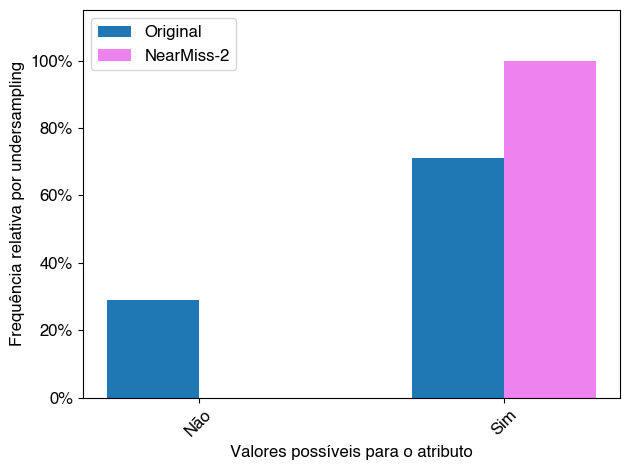

['Não', 'Sim']


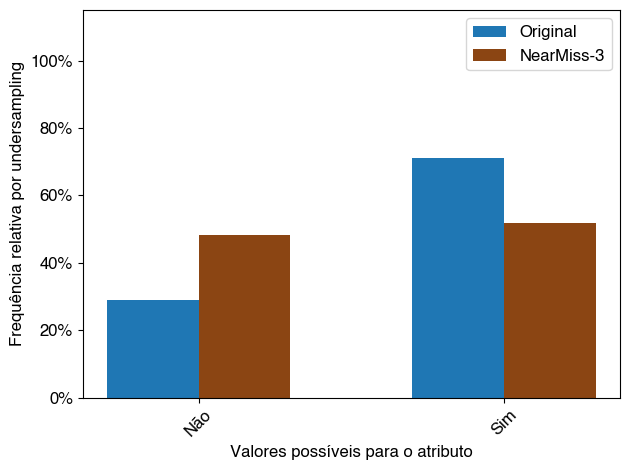

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


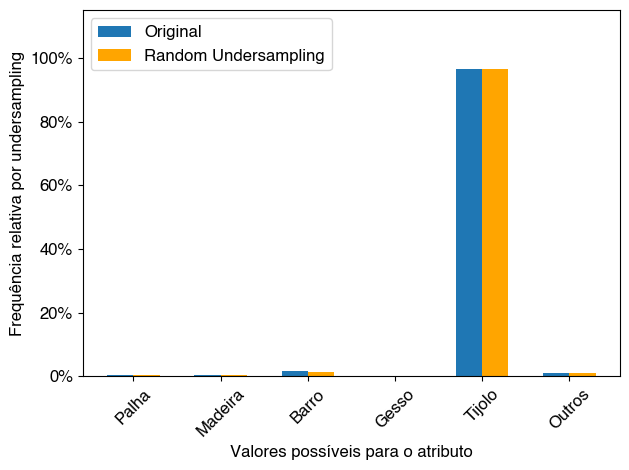

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


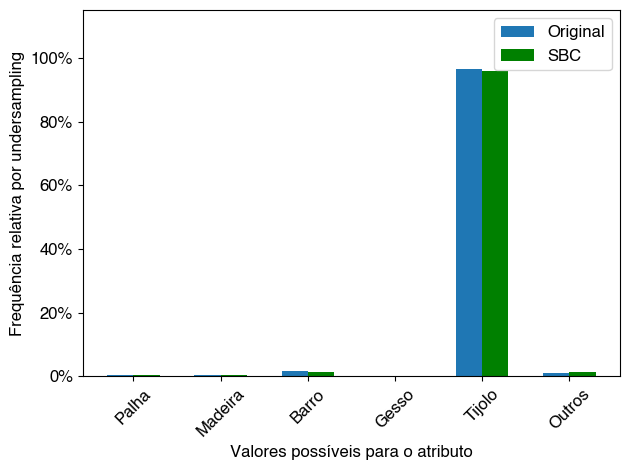

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


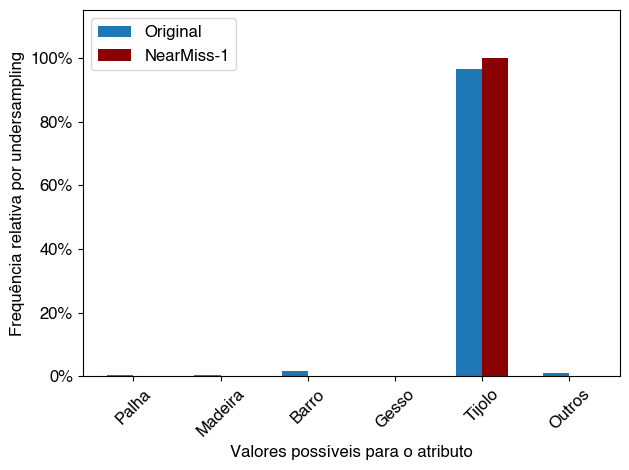

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


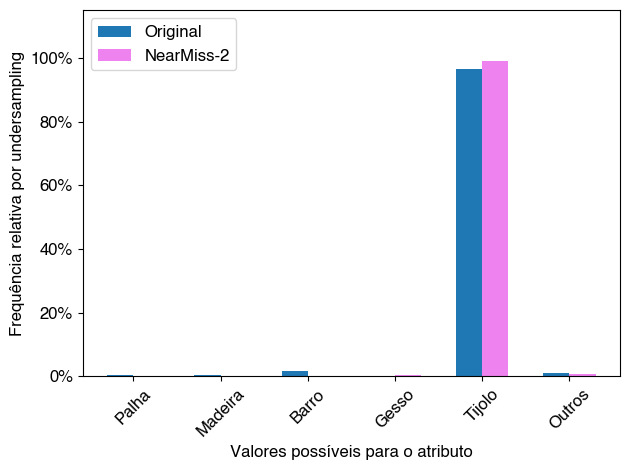

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


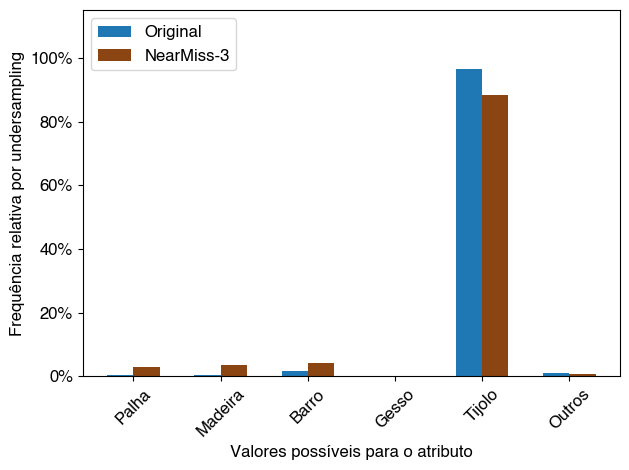

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


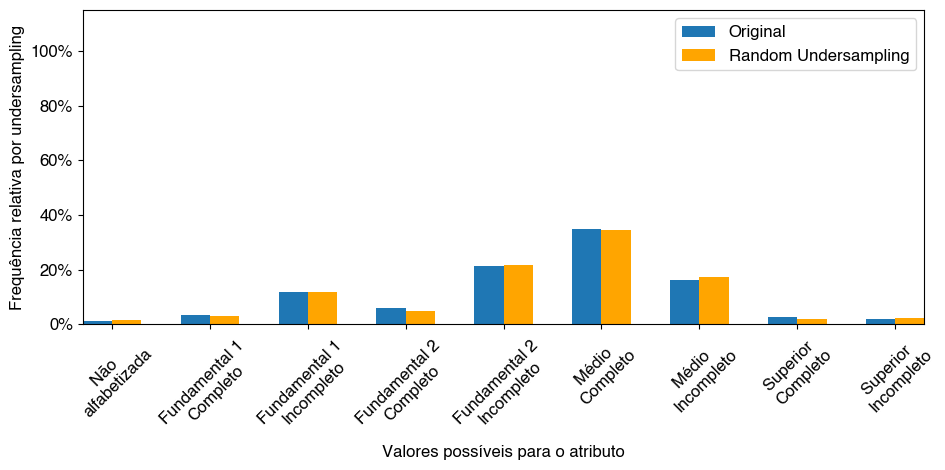

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


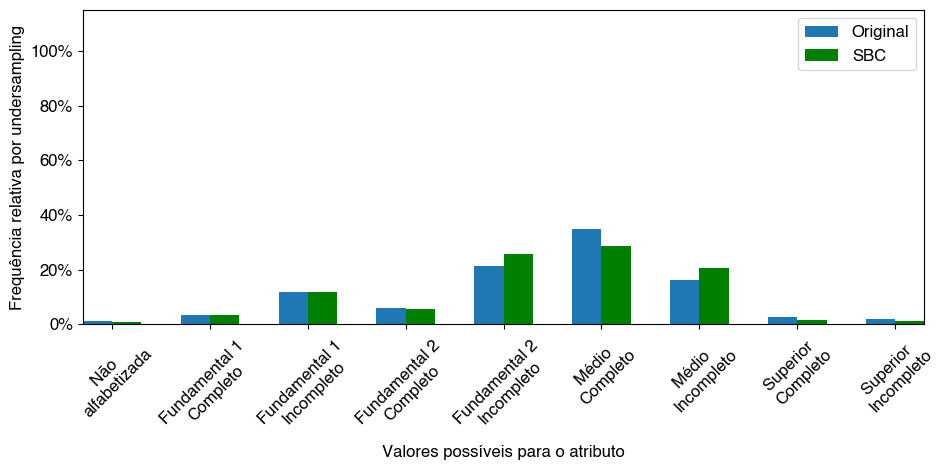

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


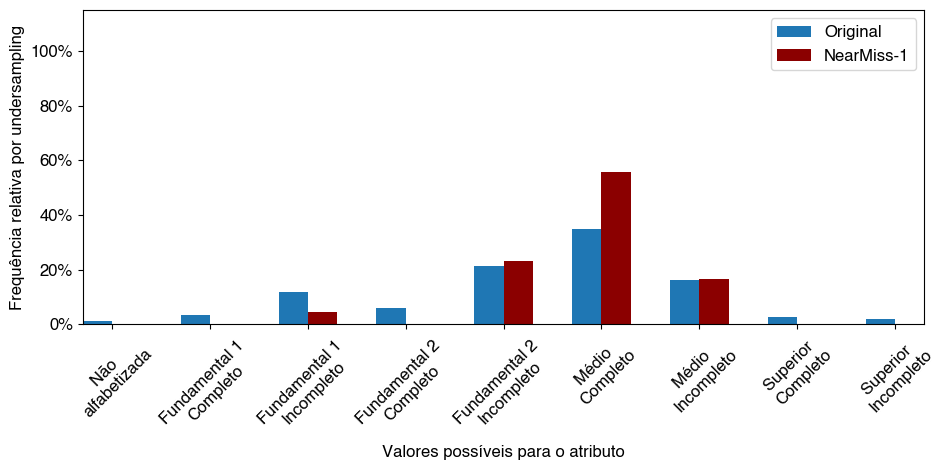

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


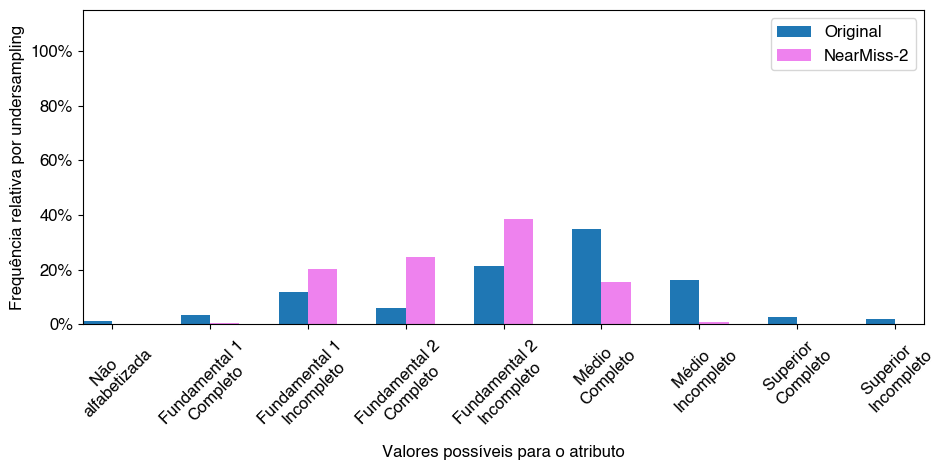

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


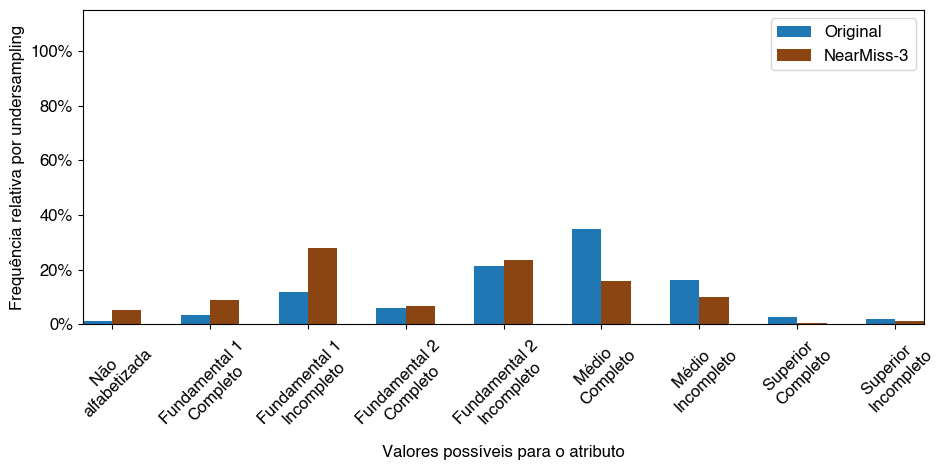

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


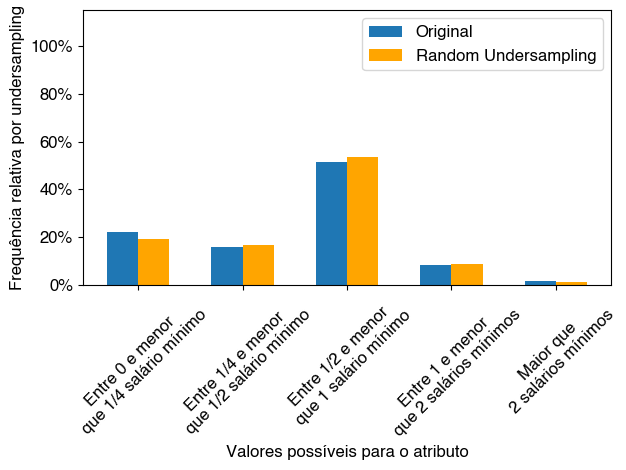

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


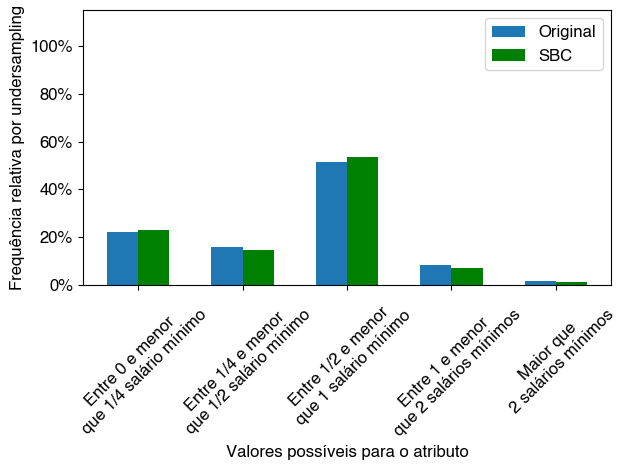

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


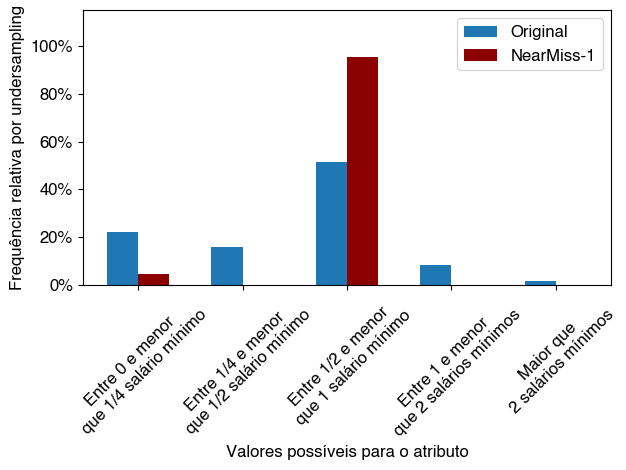

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


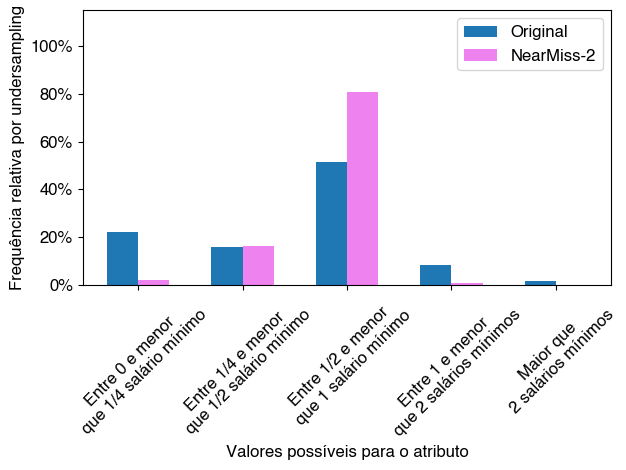

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


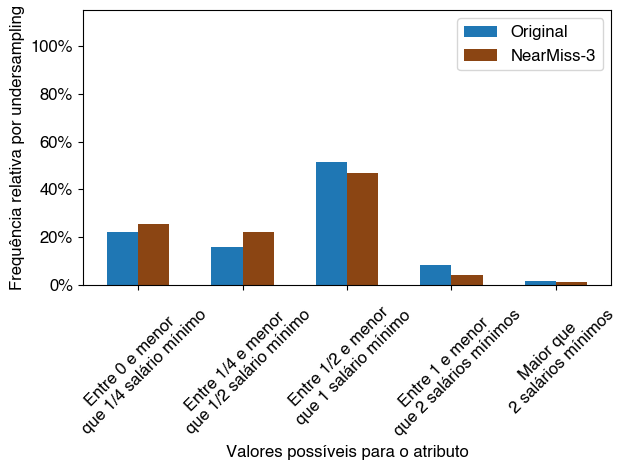

['Mãe \nAdolescente', 'Mãe \nAdulta']


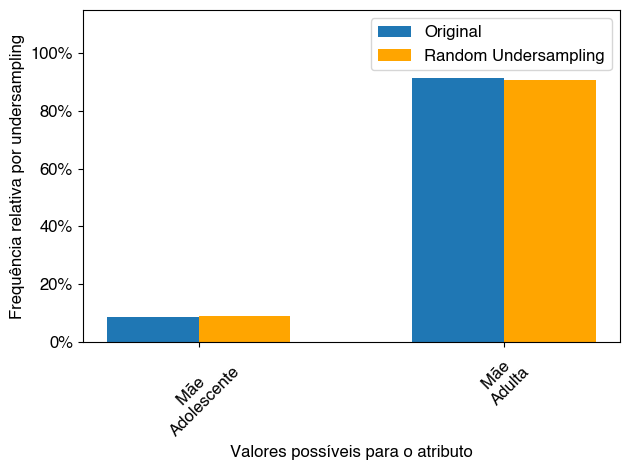

['Mãe \nAdolescente', 'Mãe \nAdulta']


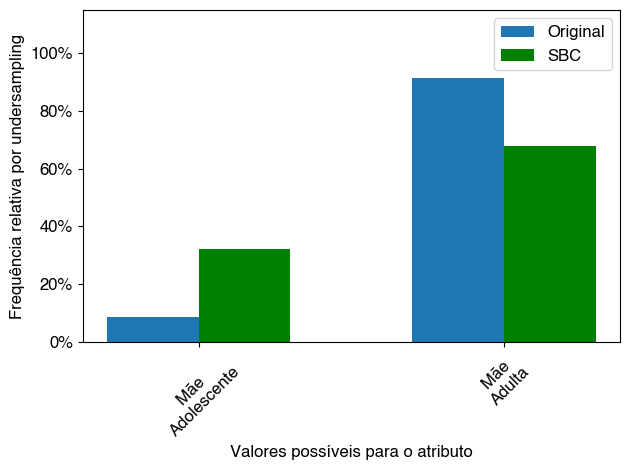

['Mãe \nAdolescente', 'Mãe \nAdulta']


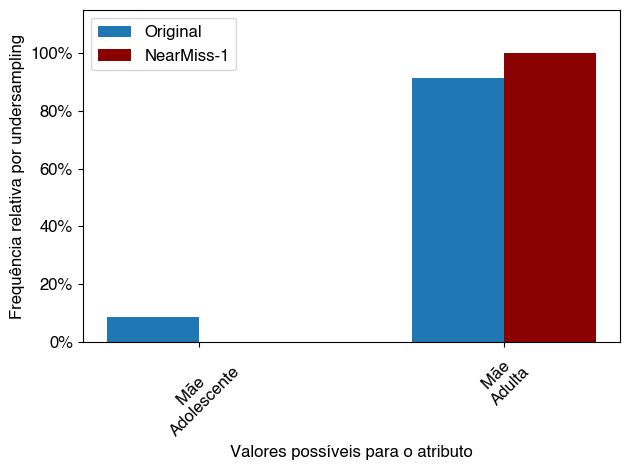

['Mãe \nAdolescente', 'Mãe \nAdulta']


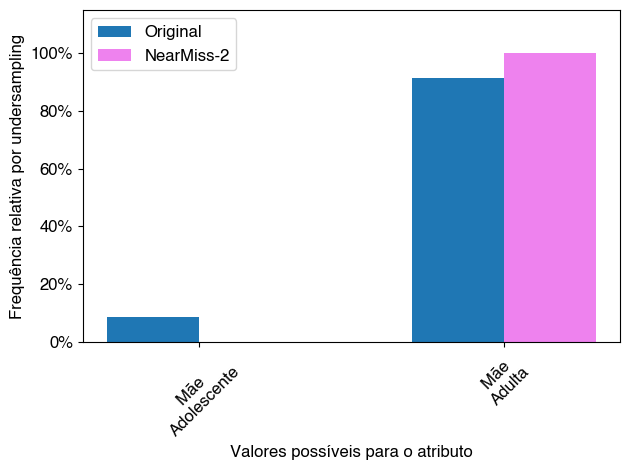

['Mãe \nAdolescente', 'Mãe \nAdulta']


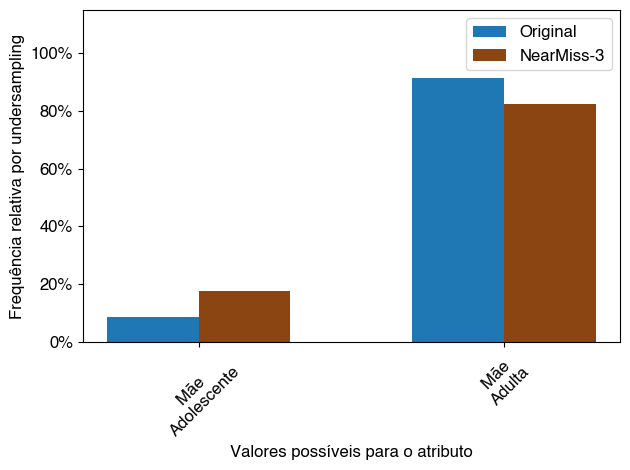

knn
['Negativo']


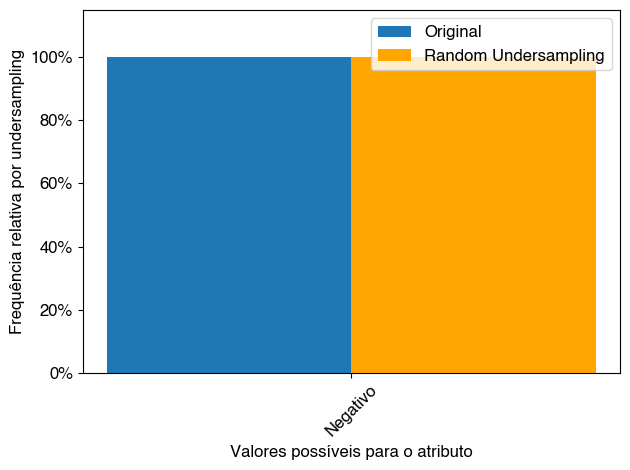

['Negativo']


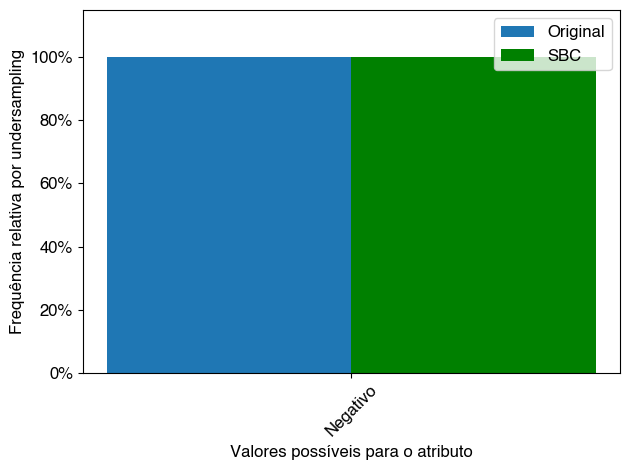

['Negativo']


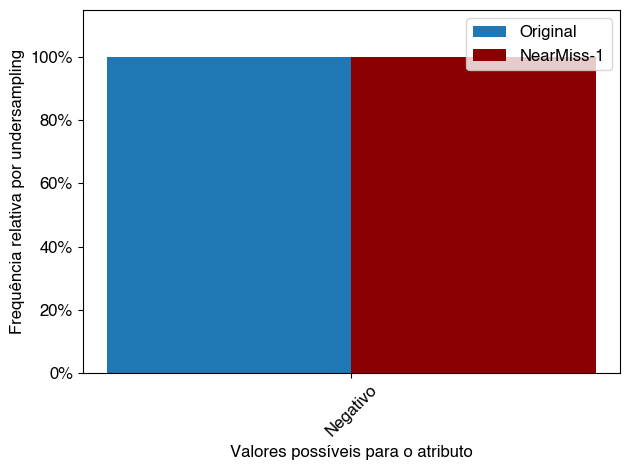

['Negativo']


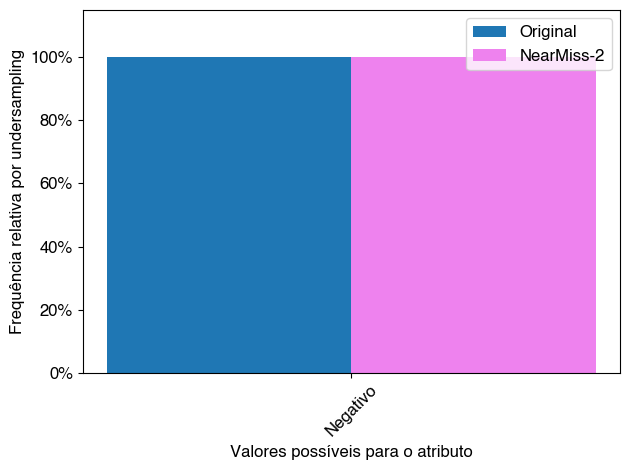

['Negativo']


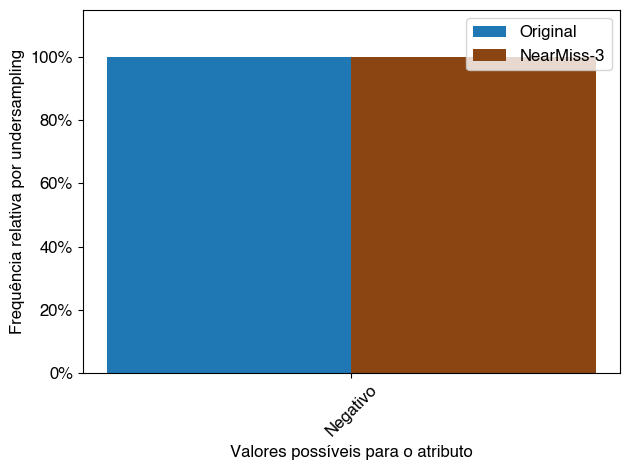

['Não Informado', 'Habitual', 'Alto']


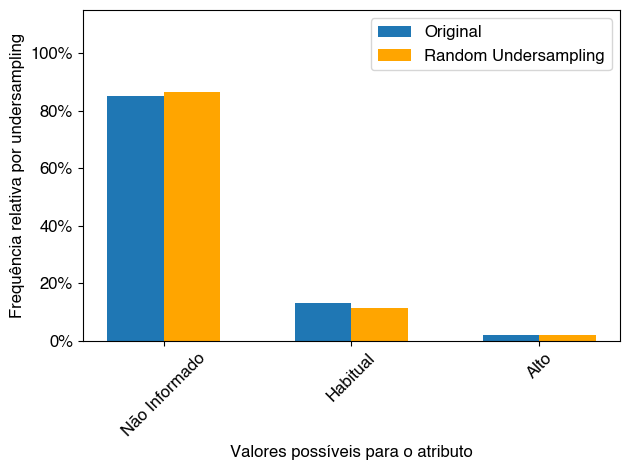

['Não Informado', 'Habitual', 'Alto']


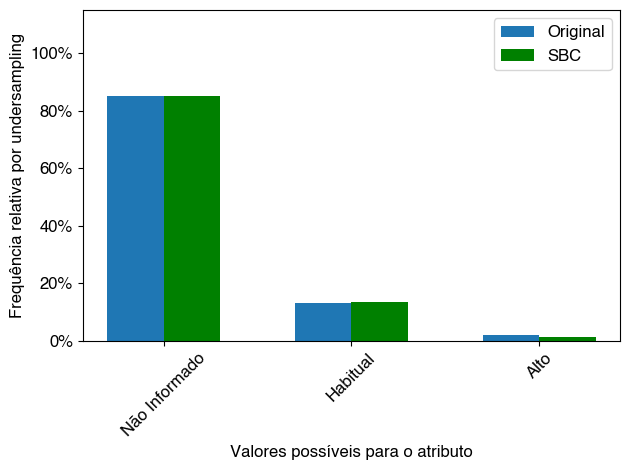

['Não Informado', 'Habitual', 'Alto']


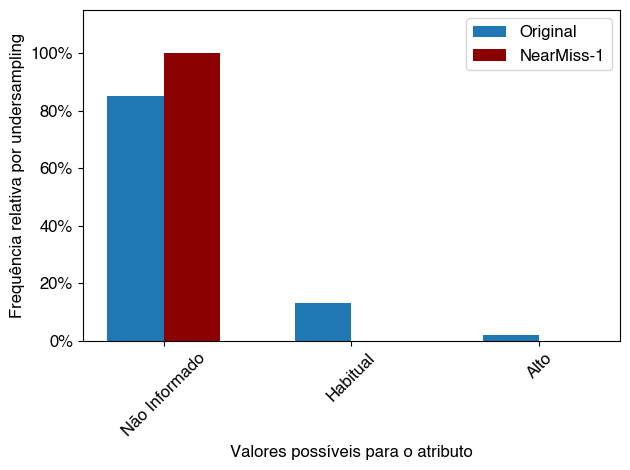

['Não Informado', 'Habitual', 'Alto']


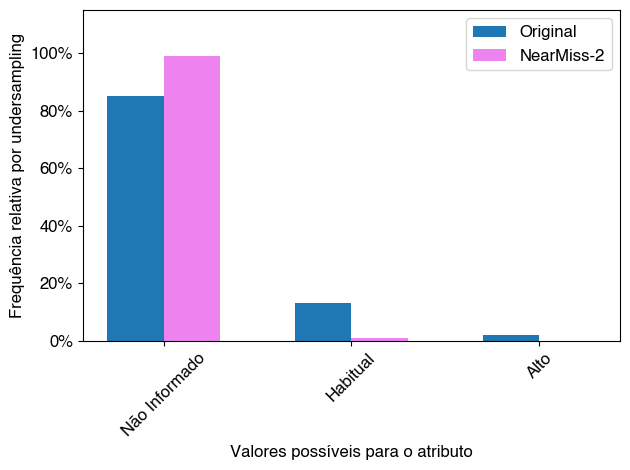

['Não Informado', 'Habitual', 'Alto']


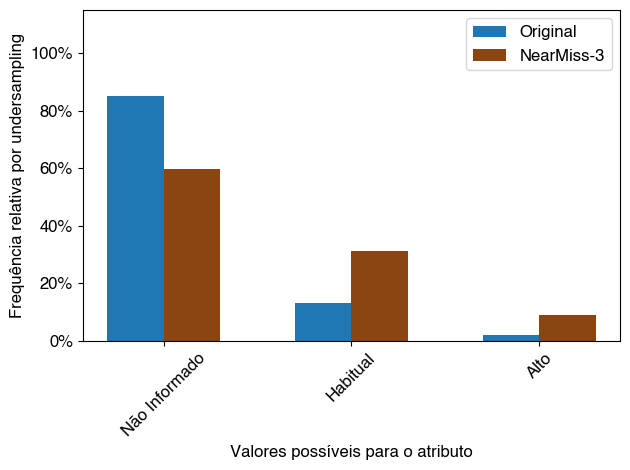

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


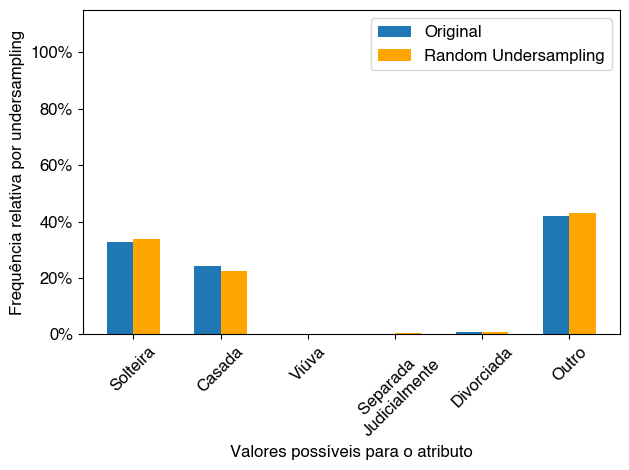

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


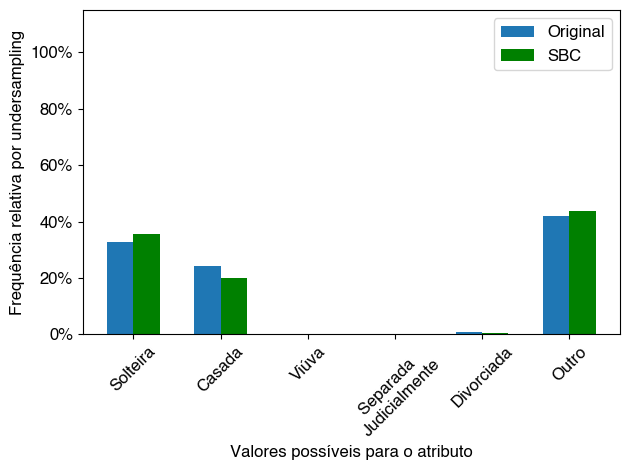

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


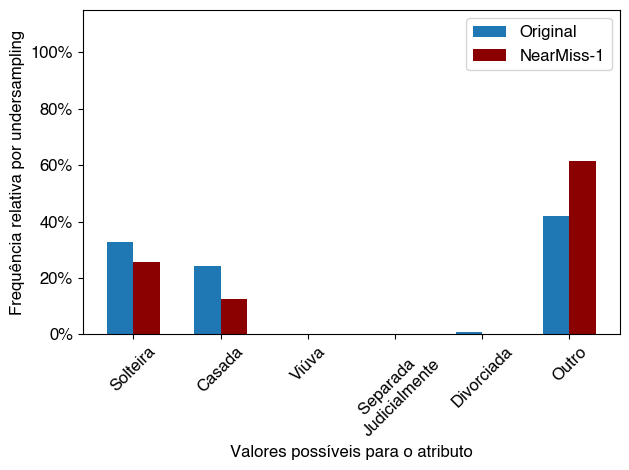

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


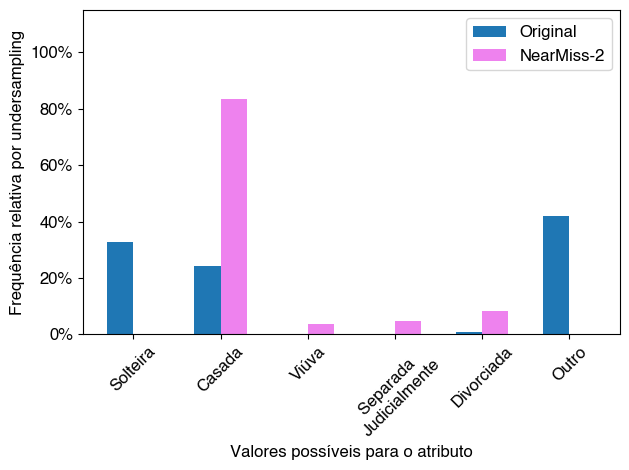

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


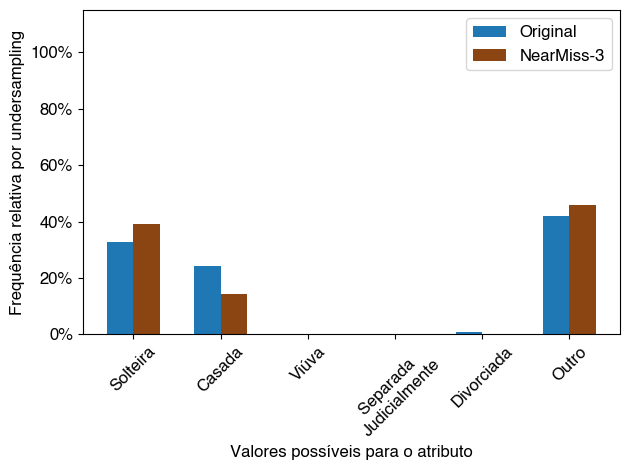

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


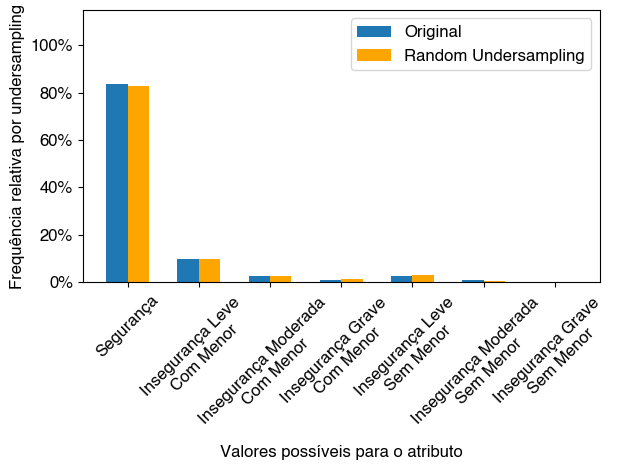

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


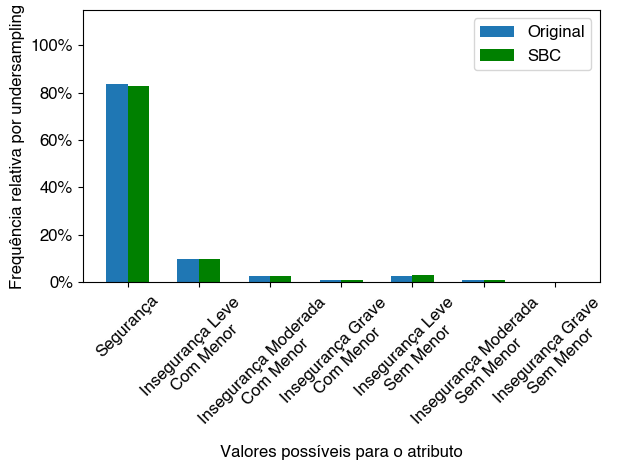

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


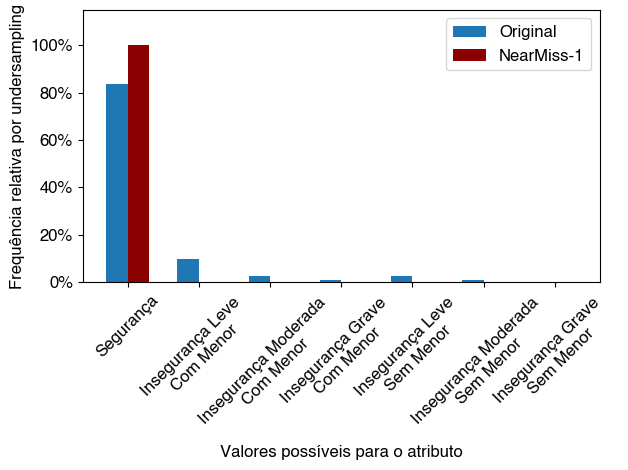

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


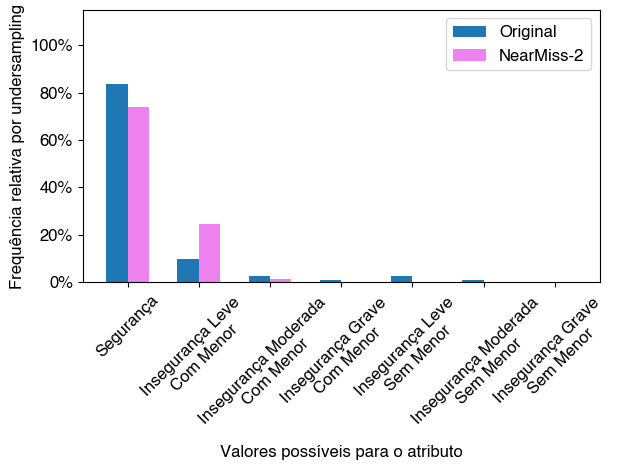

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


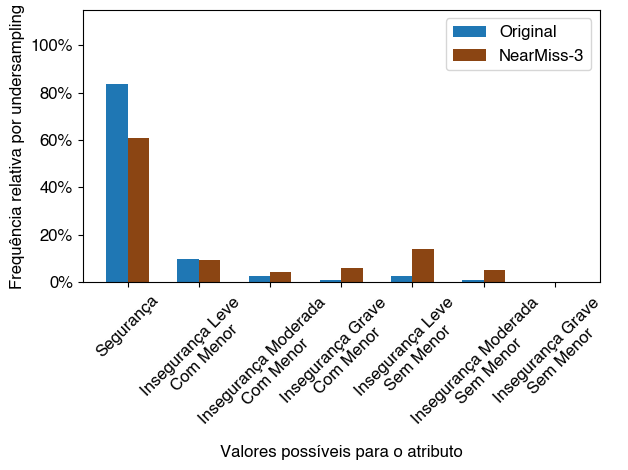

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


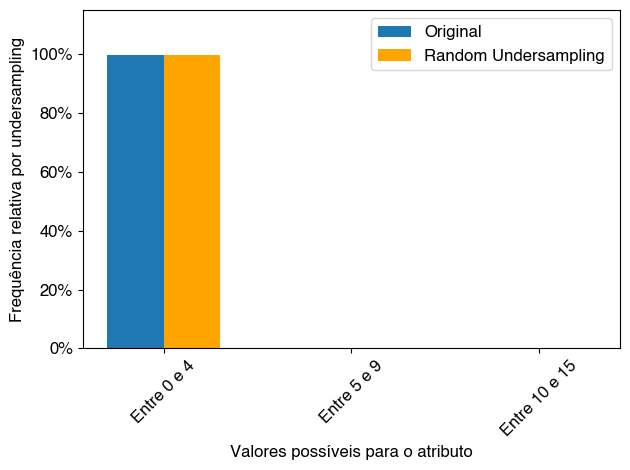

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


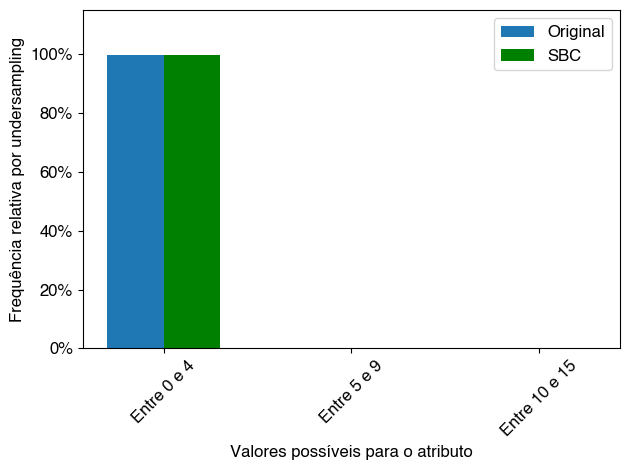

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


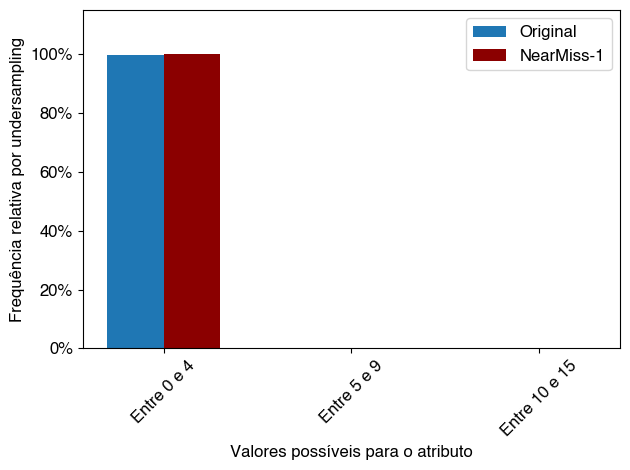

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


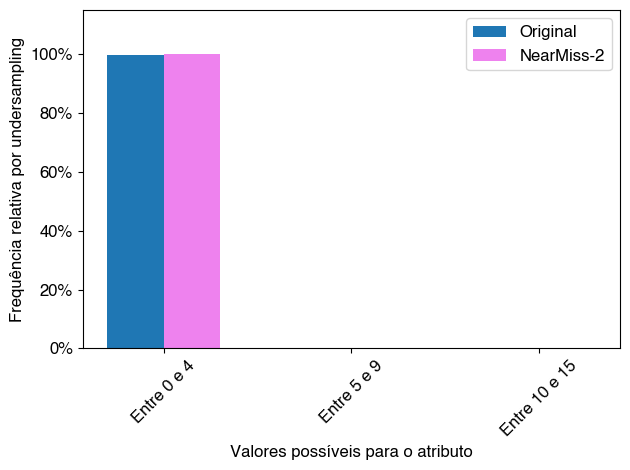

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


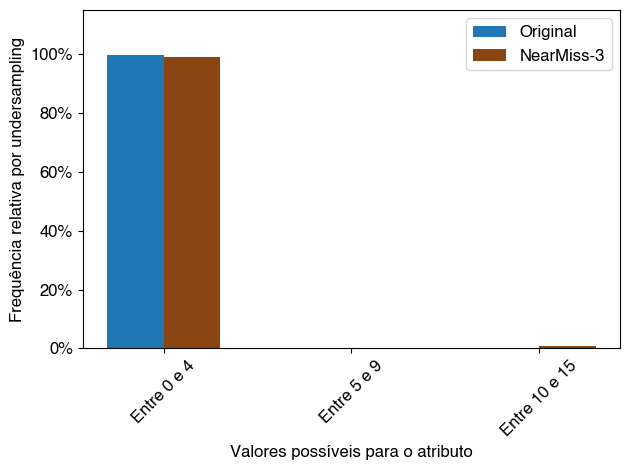

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


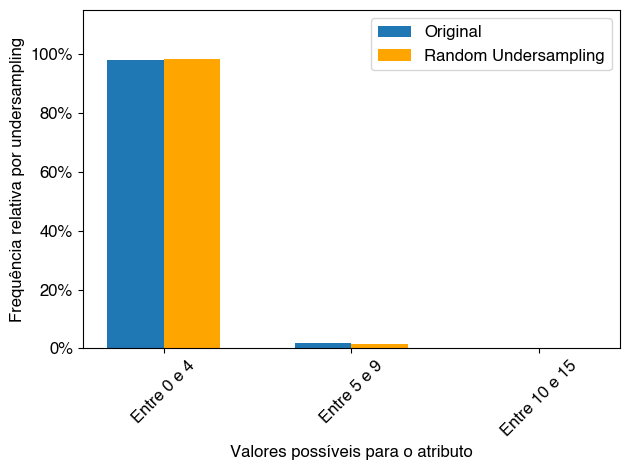

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


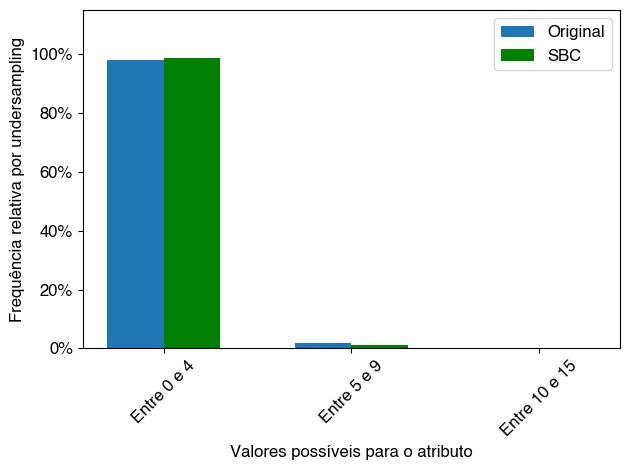

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


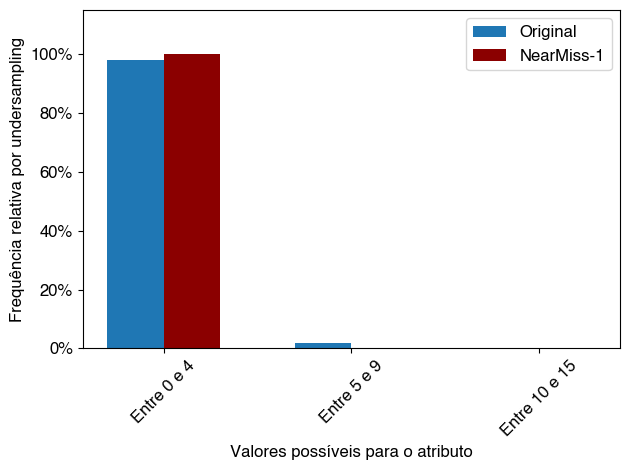

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


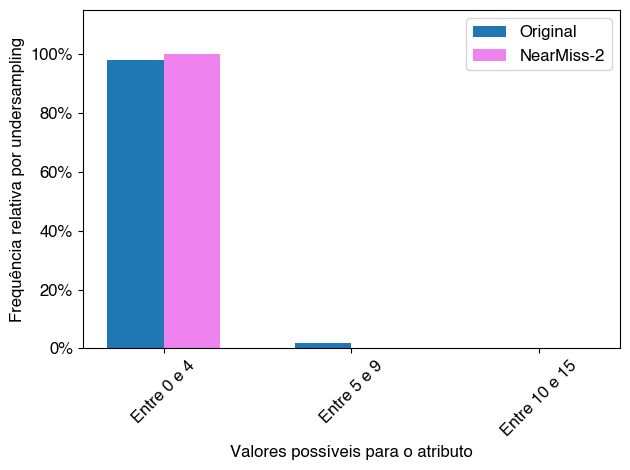

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


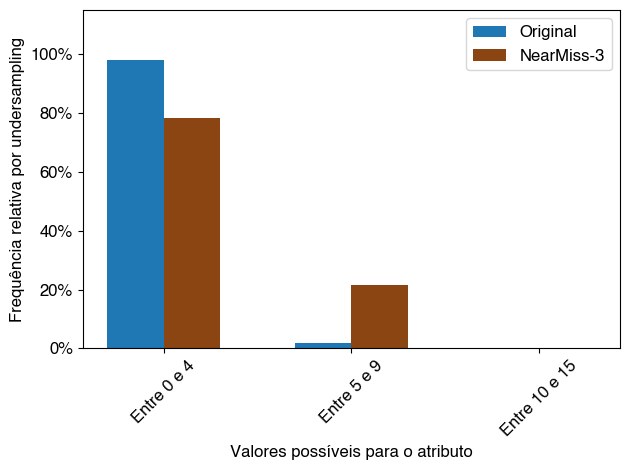

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


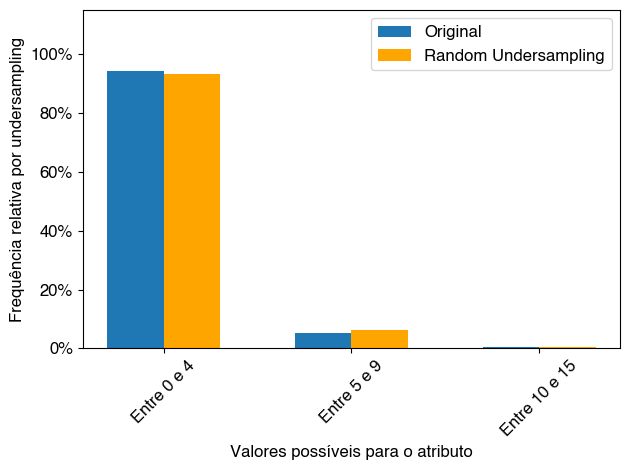

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


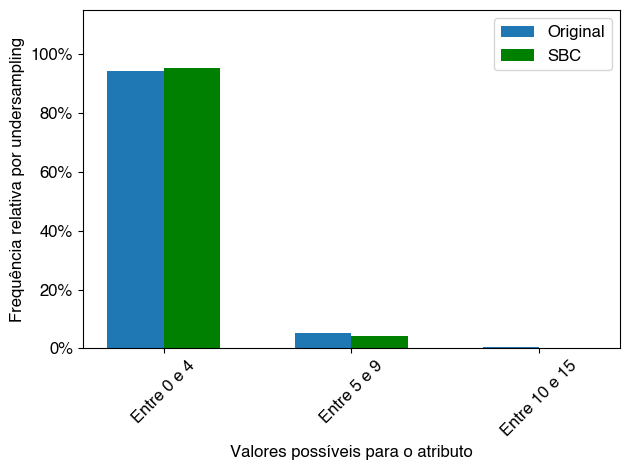

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


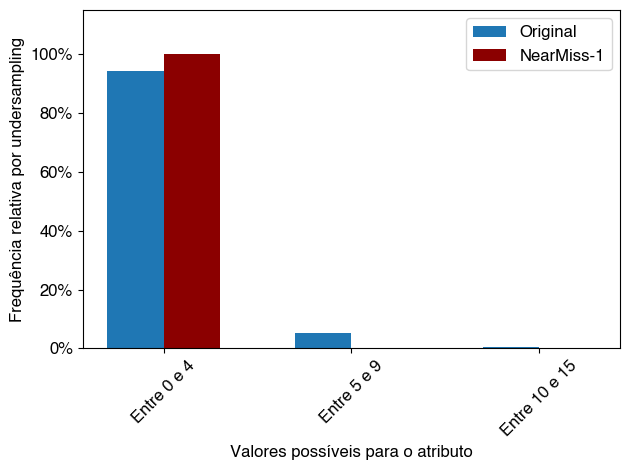

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


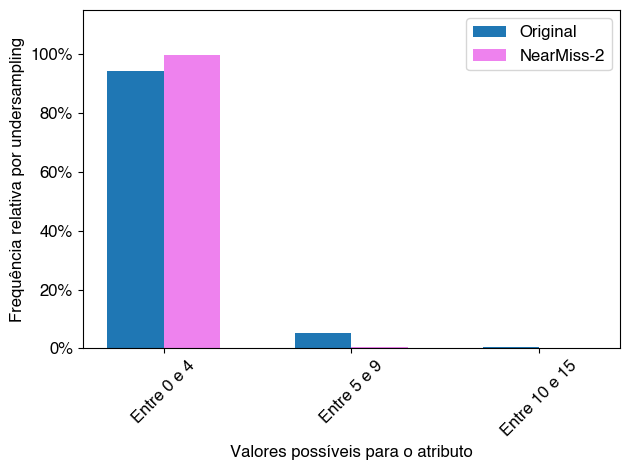

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


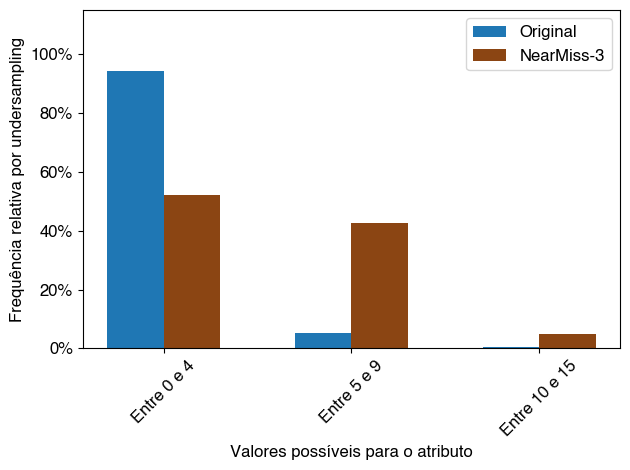

['Não', 'Sim']


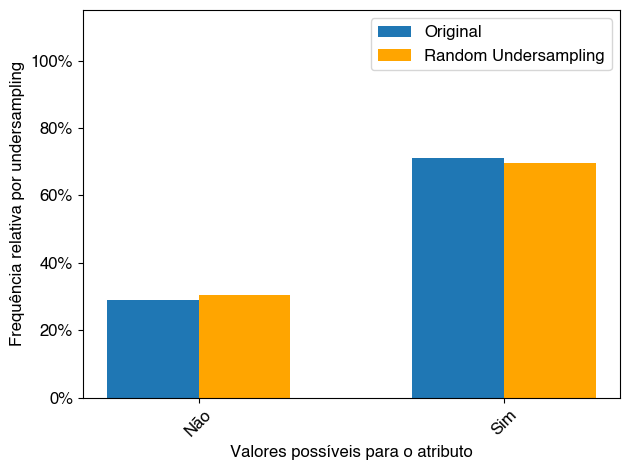

['Não', 'Sim']


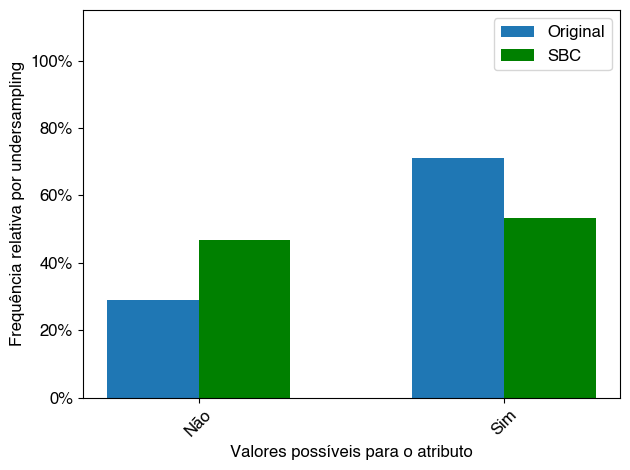

['Não', 'Sim']


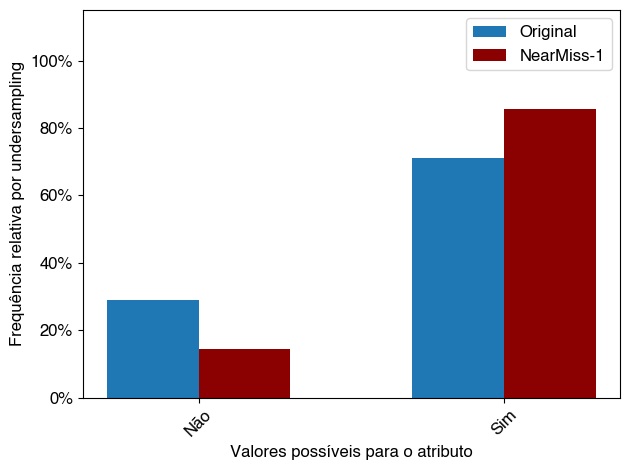

['Não', 'Sim']


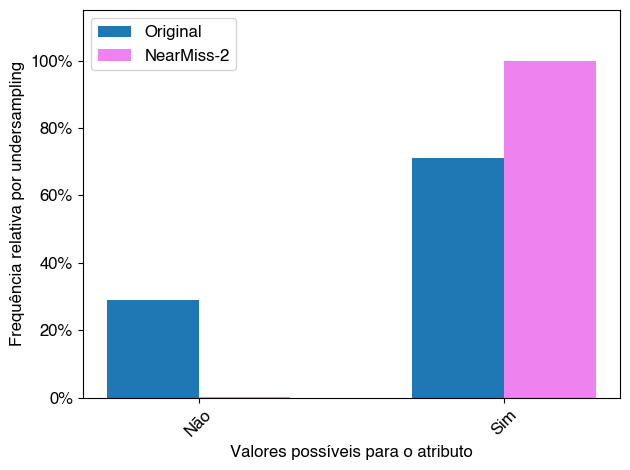

['Não', 'Sim']


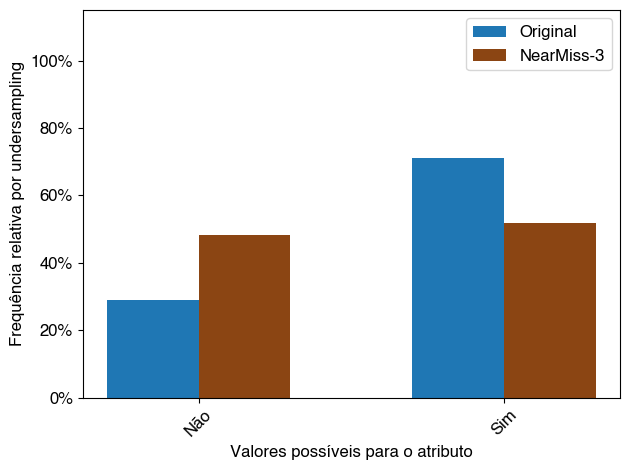

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


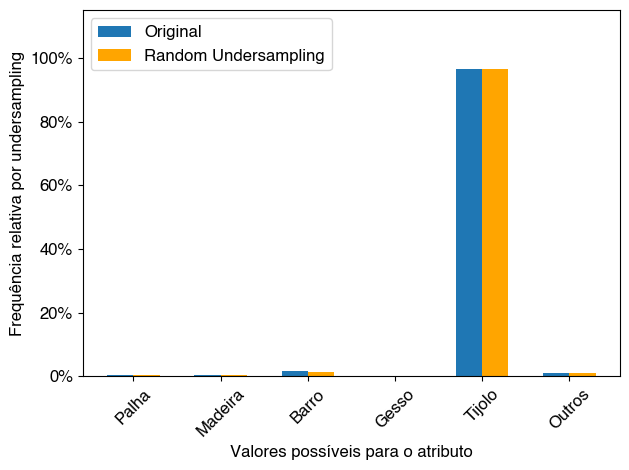

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


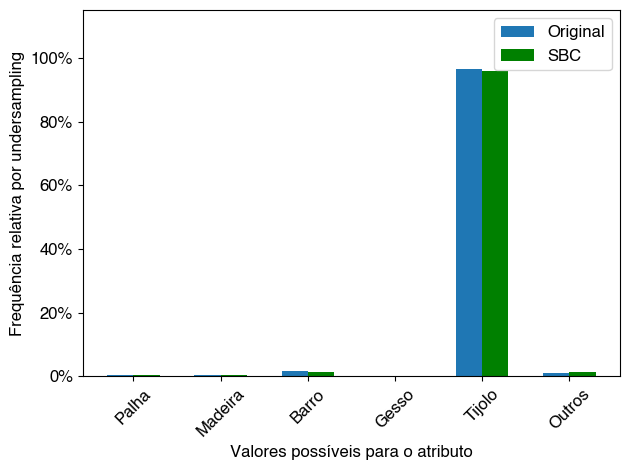

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


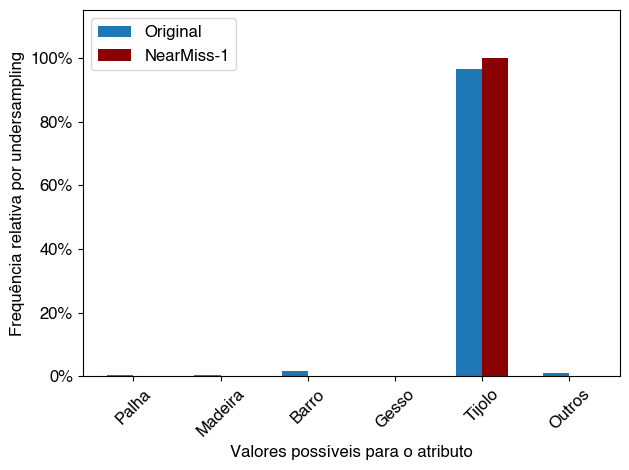

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


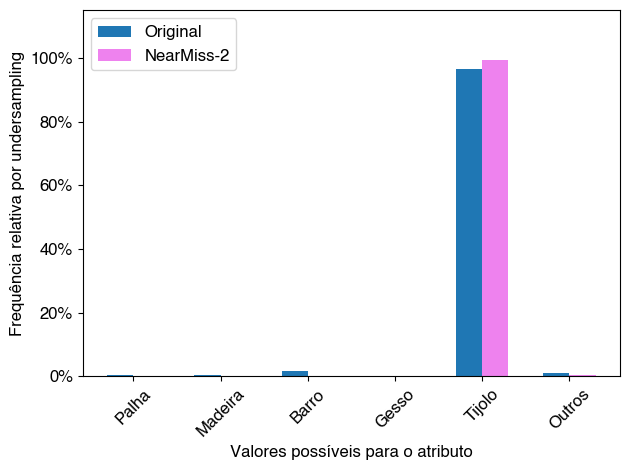

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


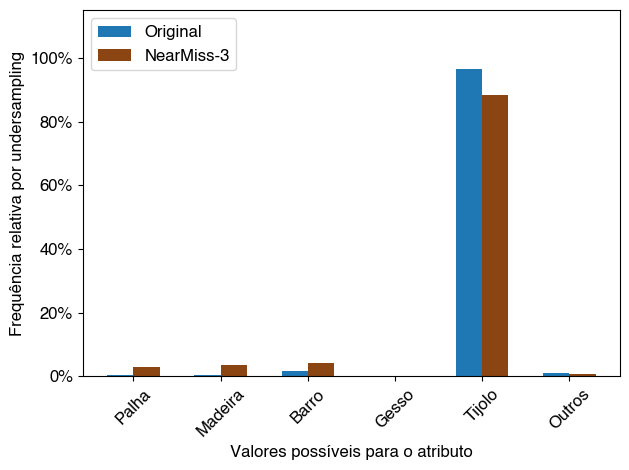

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


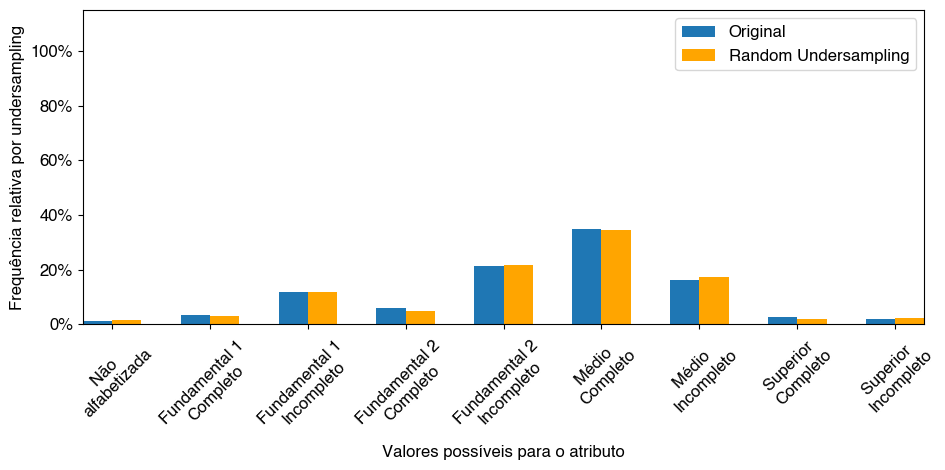

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


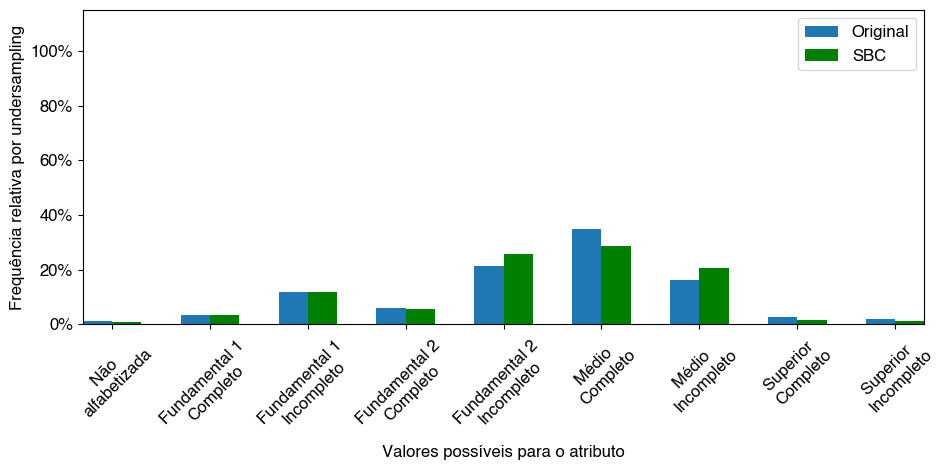

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


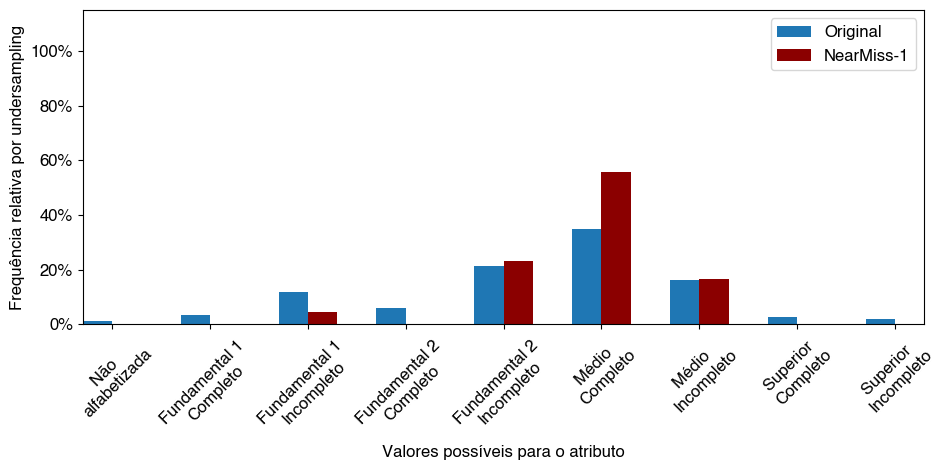

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


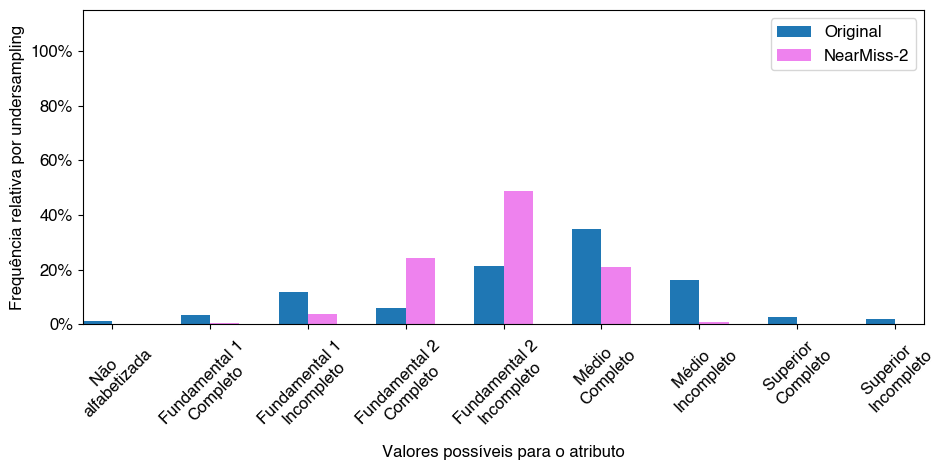

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


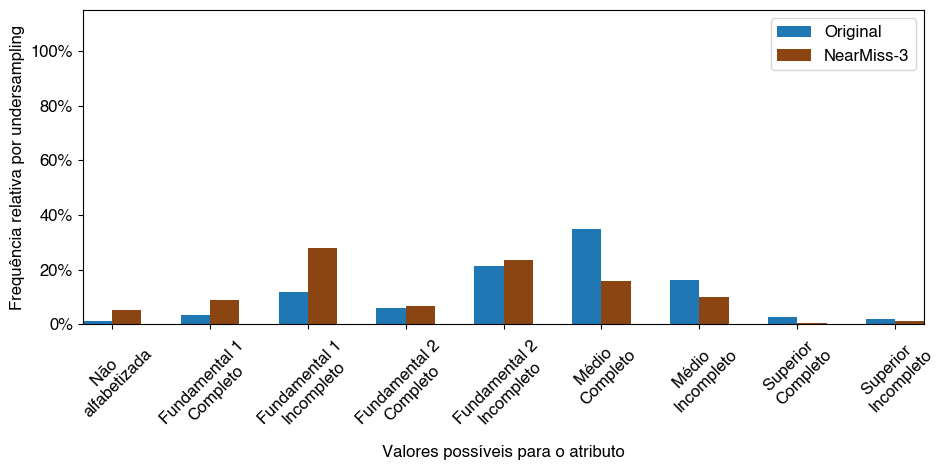

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


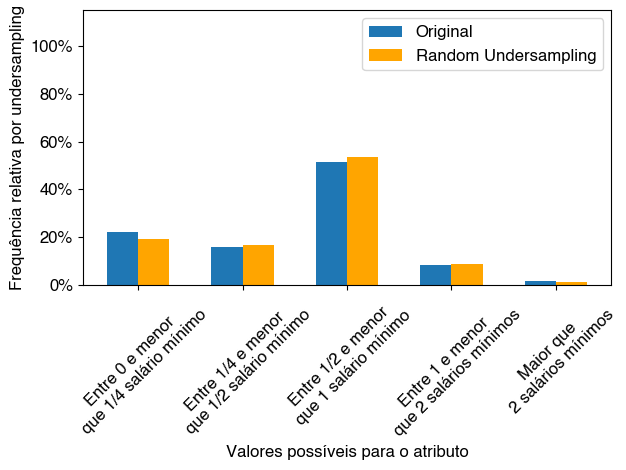

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


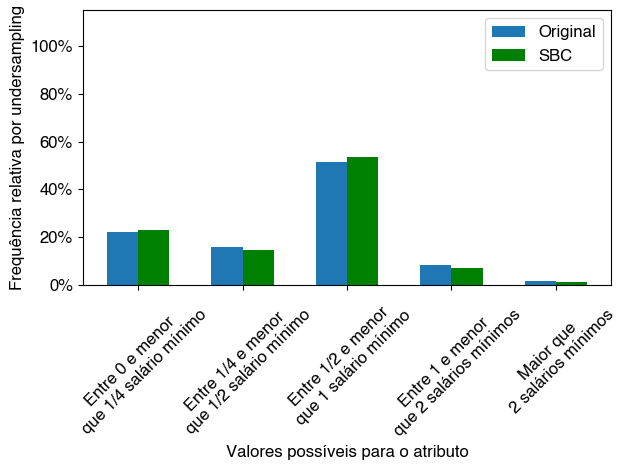

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


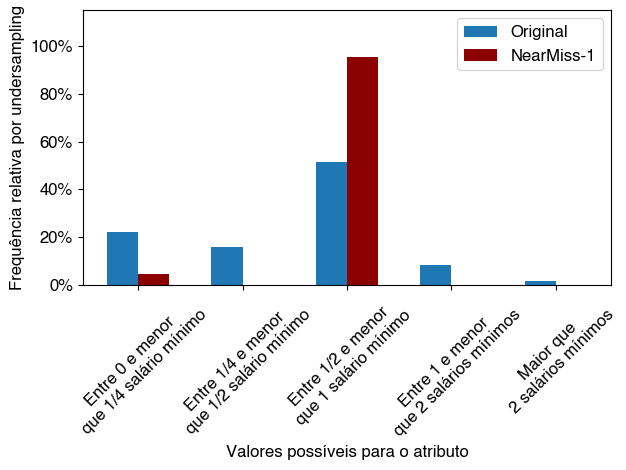

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


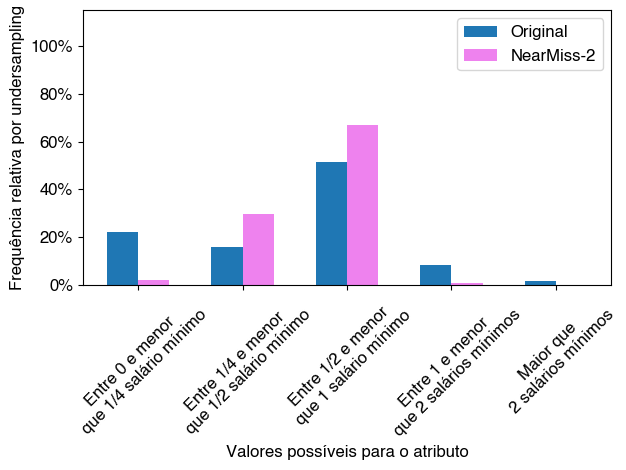

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


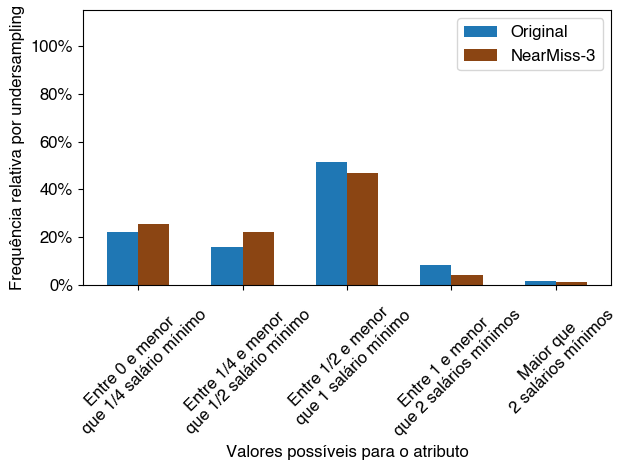

['Mãe \nAdolescente', 'Mãe \nAdulta']


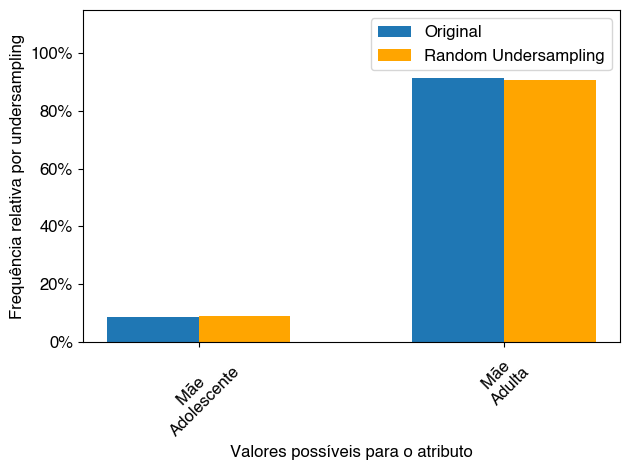

['Mãe \nAdolescente', 'Mãe \nAdulta']


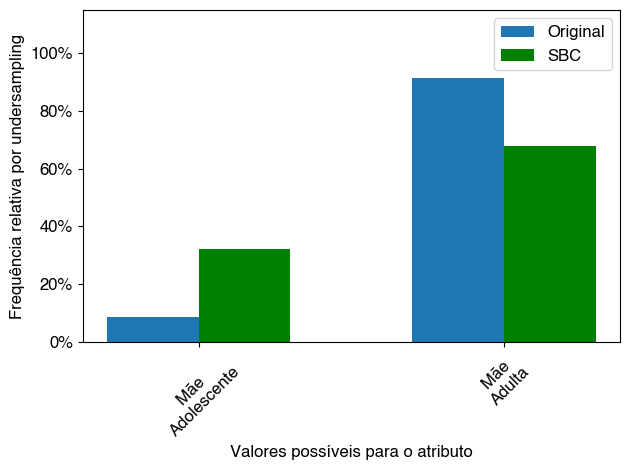

['Mãe \nAdolescente', 'Mãe \nAdulta']


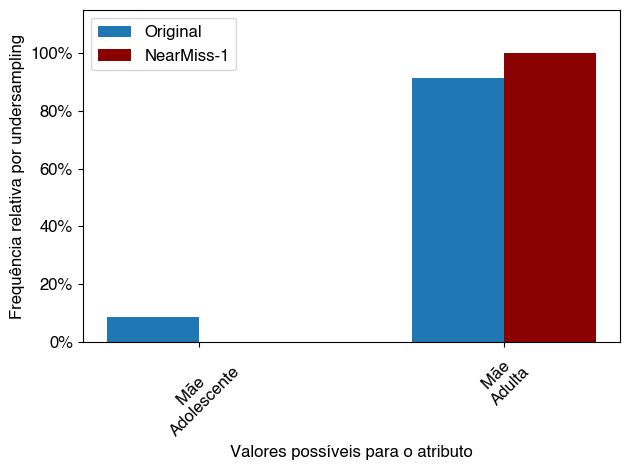

['Mãe \nAdolescente', 'Mãe \nAdulta']


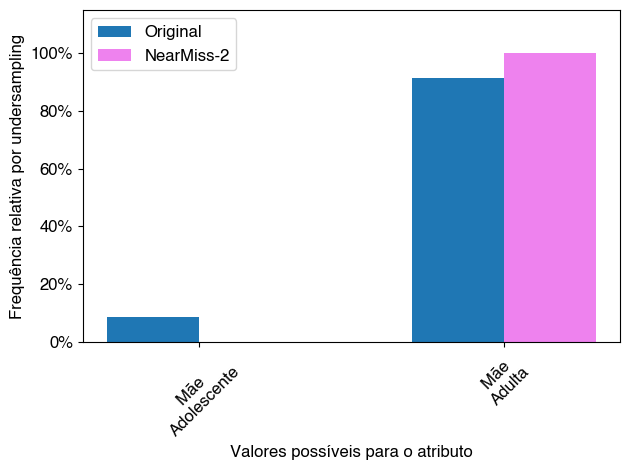

['Mãe \nAdolescente', 'Mãe \nAdulta']


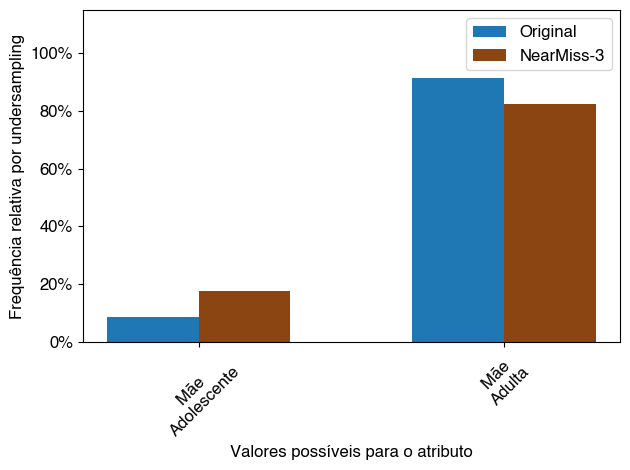

svm
['Negativo']


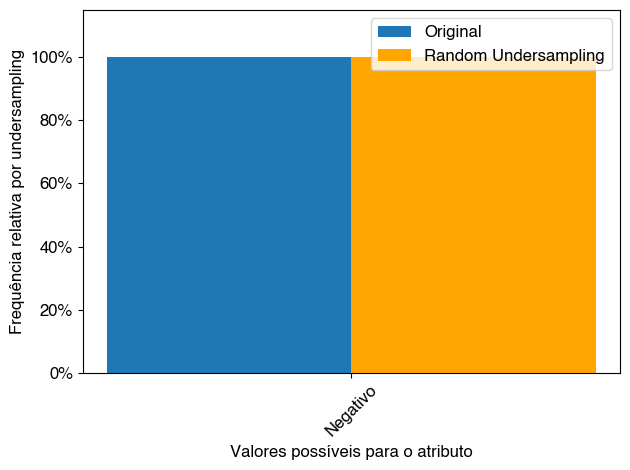

['Negativo']


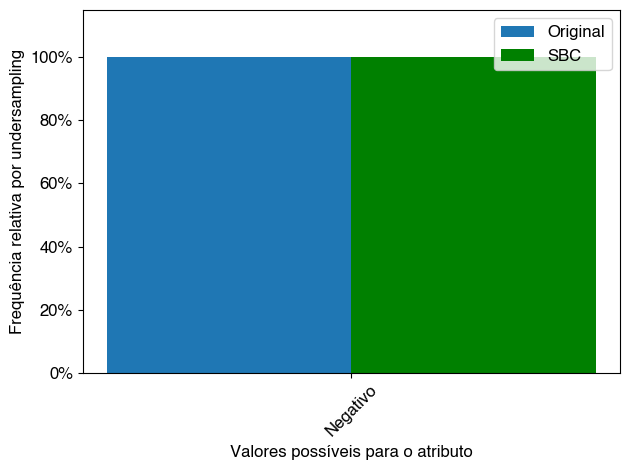

['Negativo']


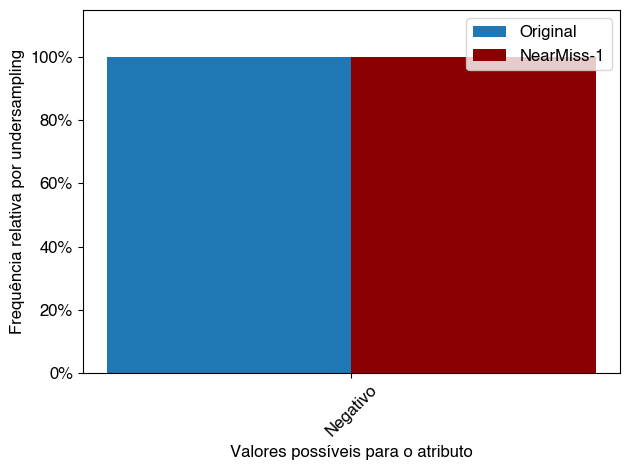

['Negativo']


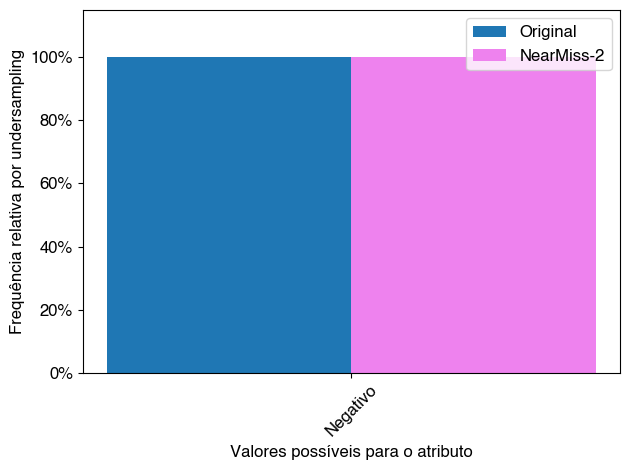

['Negativo']


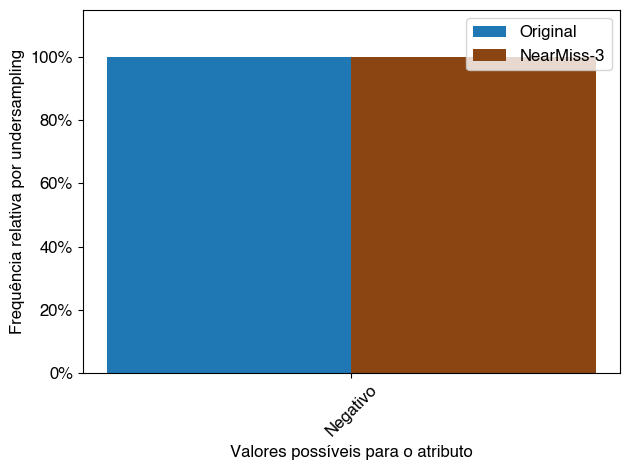

['Não Informado', 'Habitual', 'Alto']


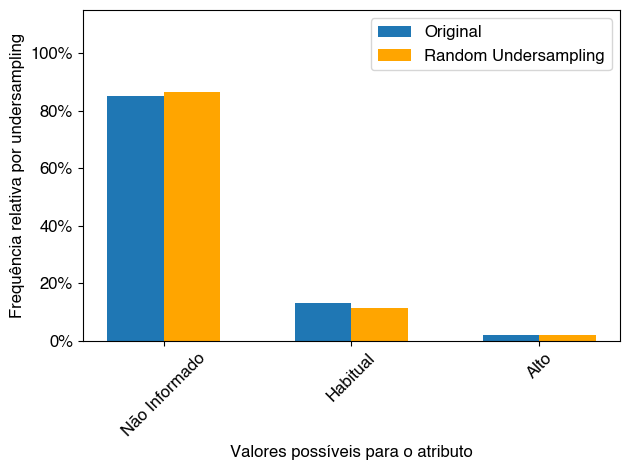

['Não Informado', 'Habitual', 'Alto']


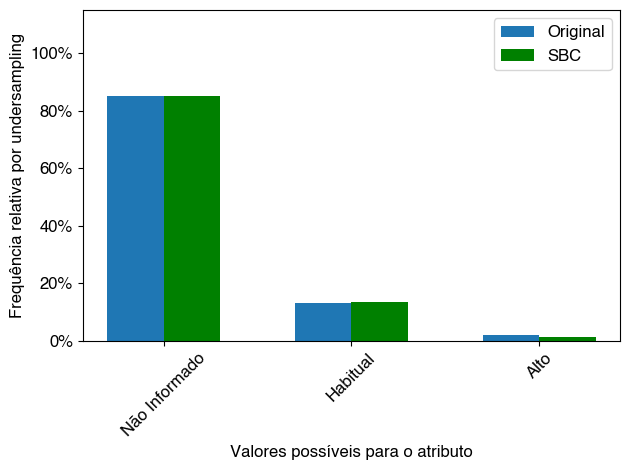

['Não Informado', 'Habitual', 'Alto']


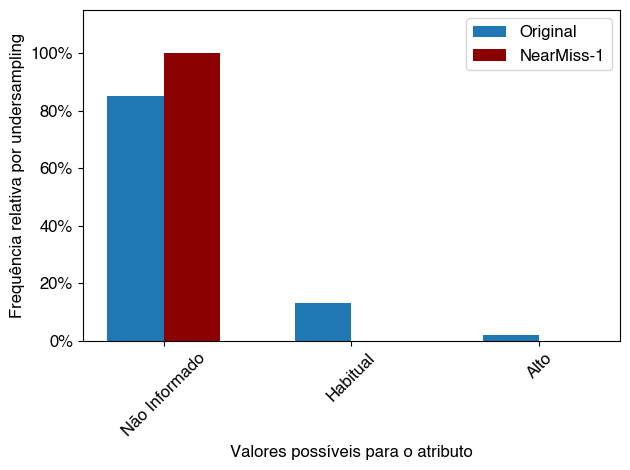

['Não Informado', 'Habitual', 'Alto']


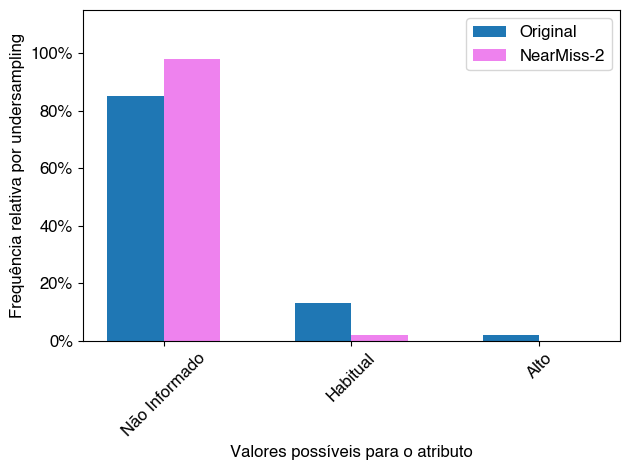

['Não Informado', 'Habitual', 'Alto']


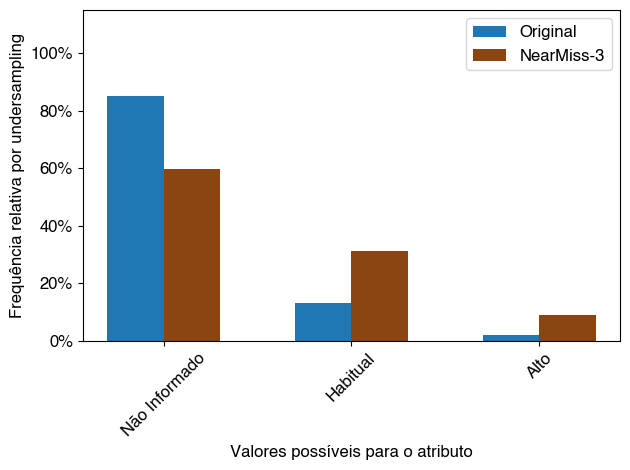

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


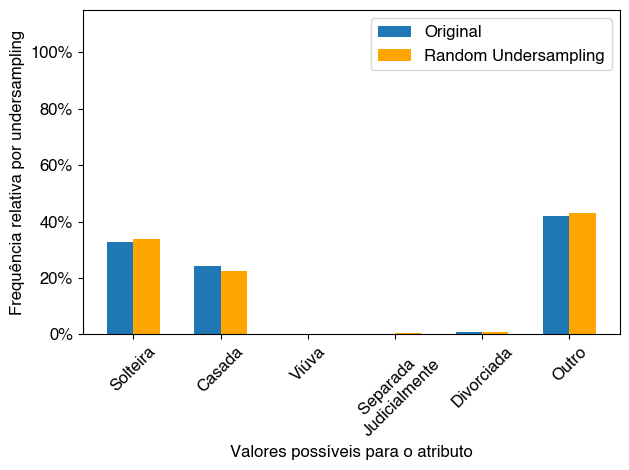

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


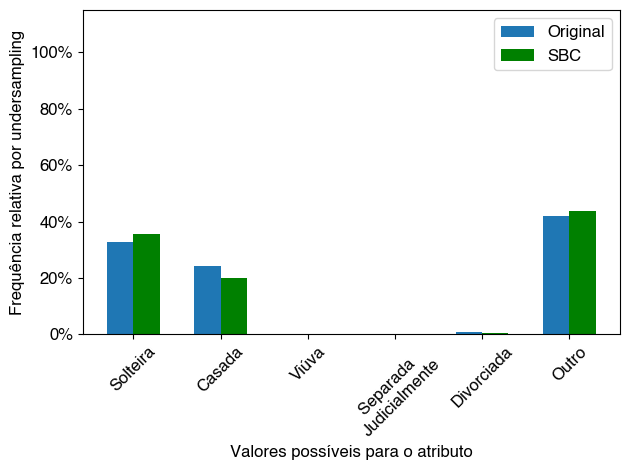

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


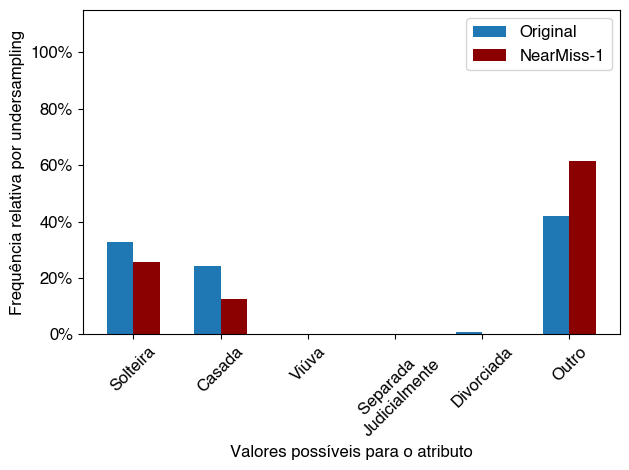

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


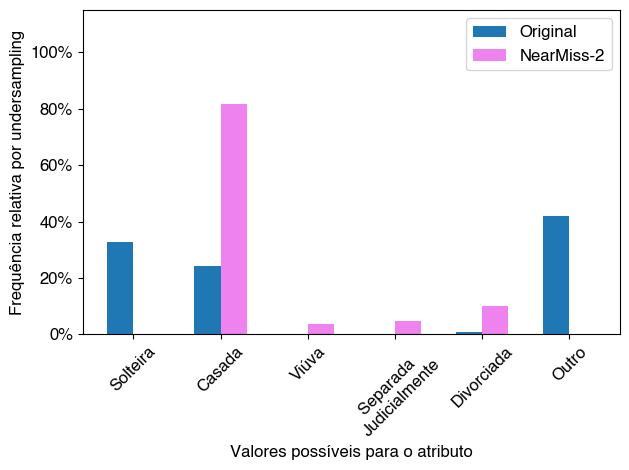

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


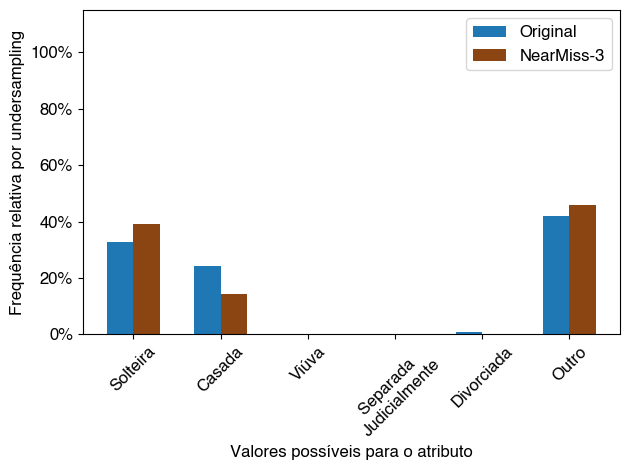

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


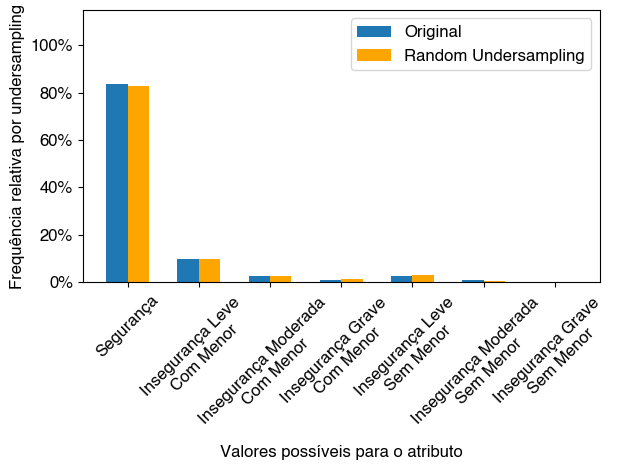

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


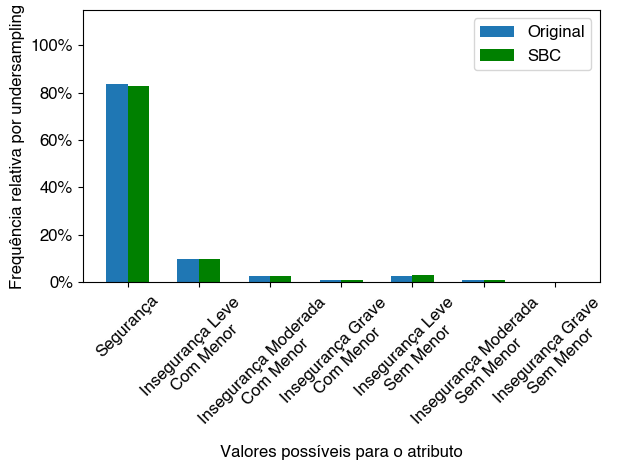

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


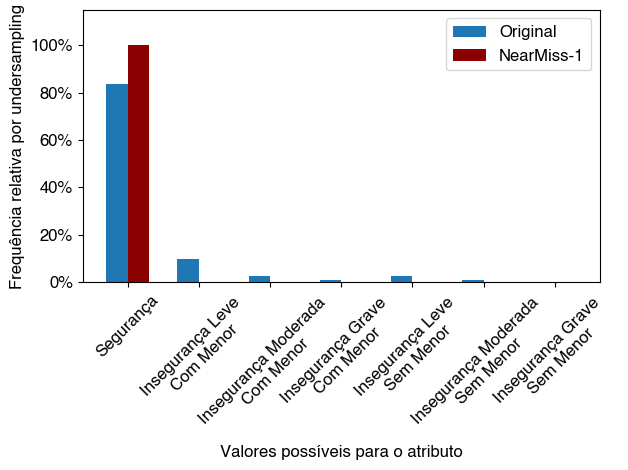

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


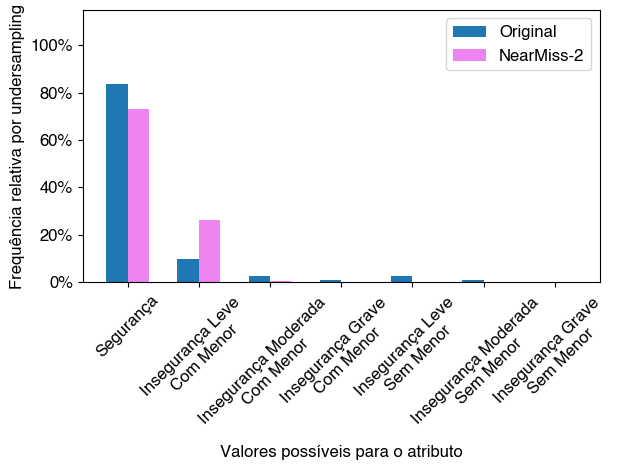

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


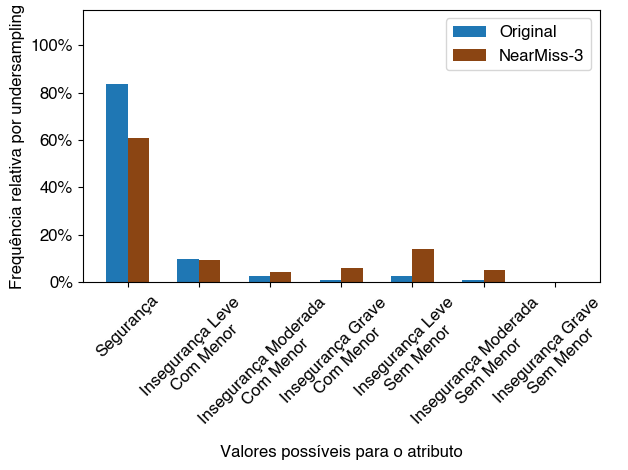

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


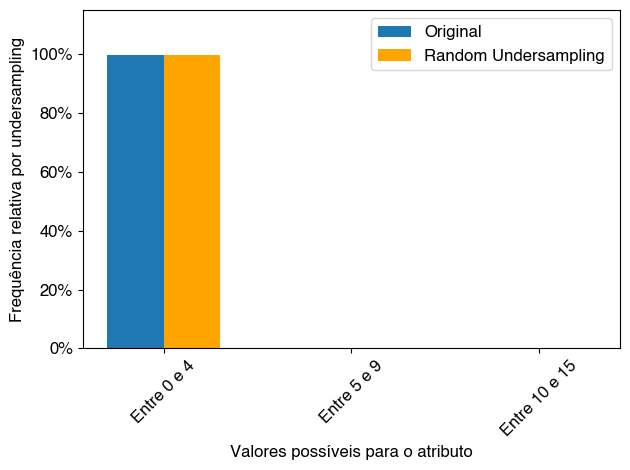

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


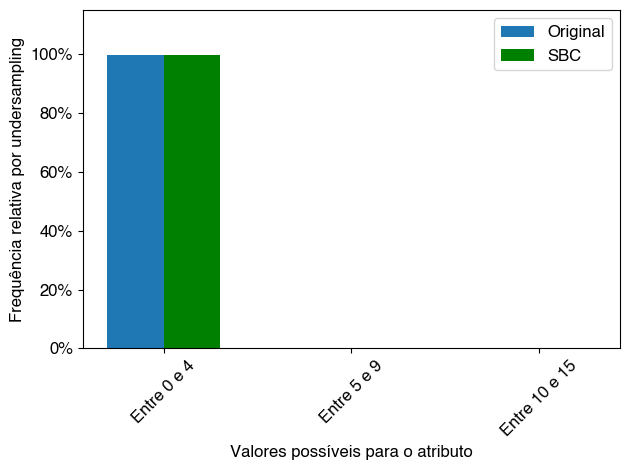

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


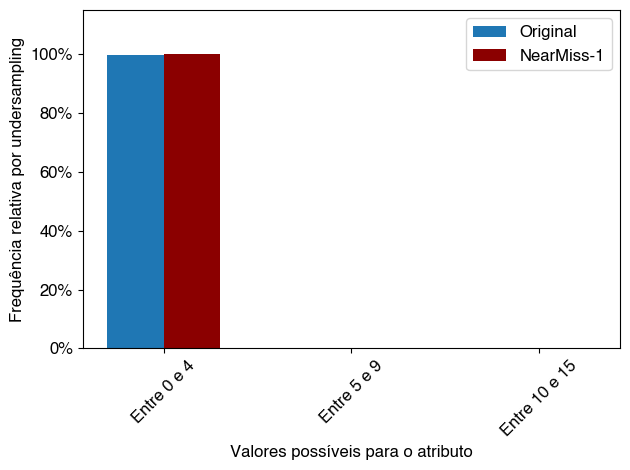

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


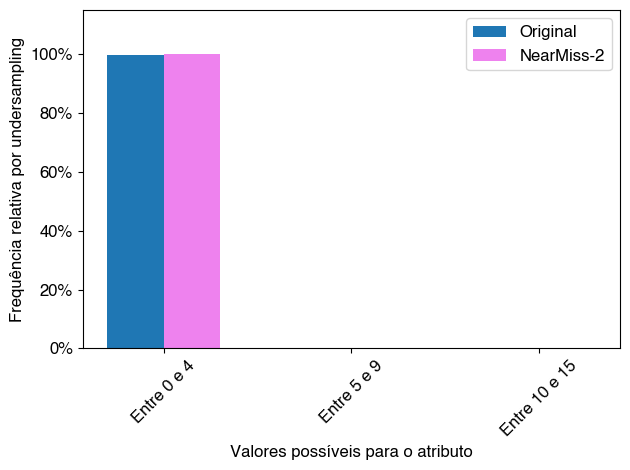

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


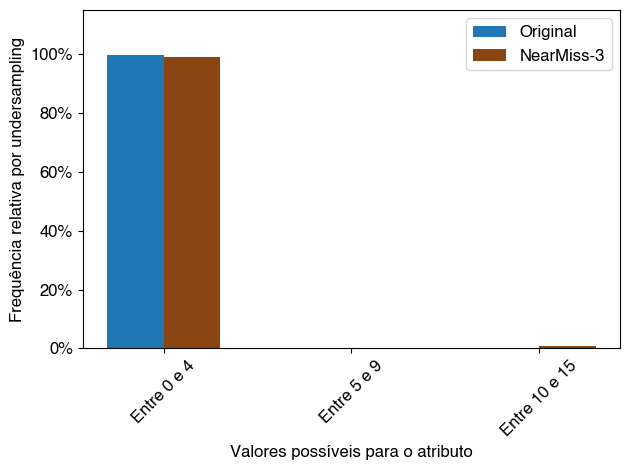

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


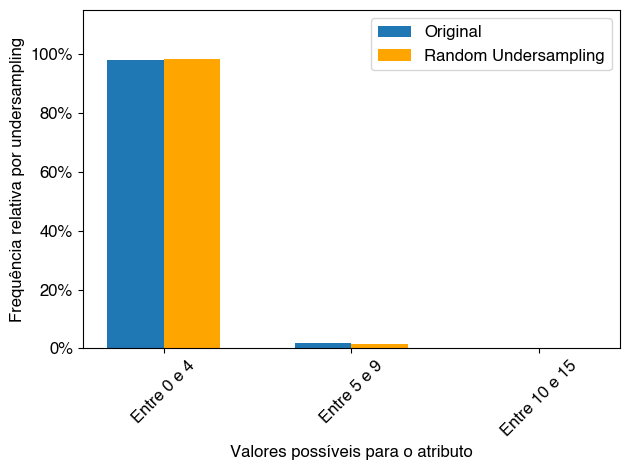

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


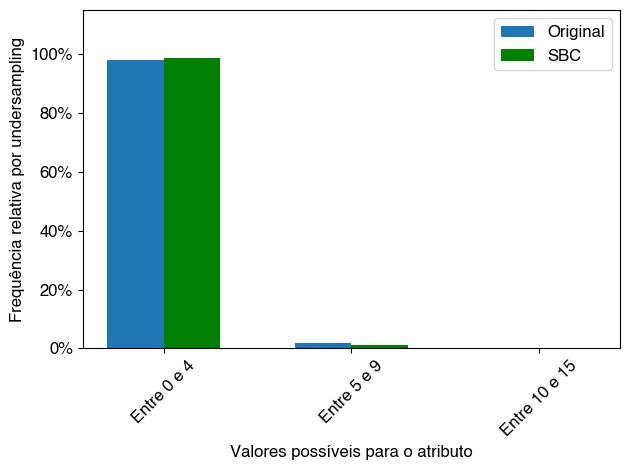

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


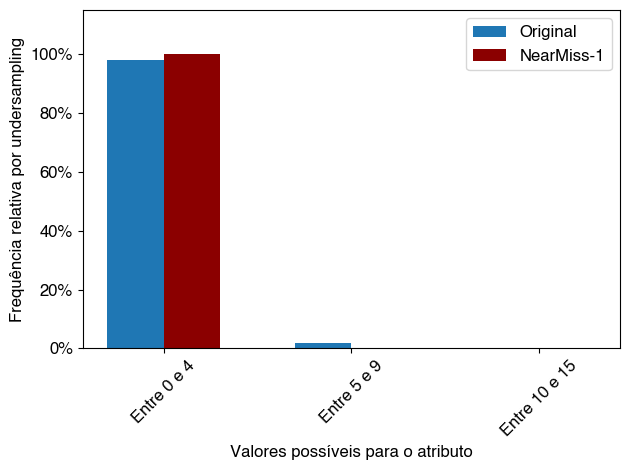

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


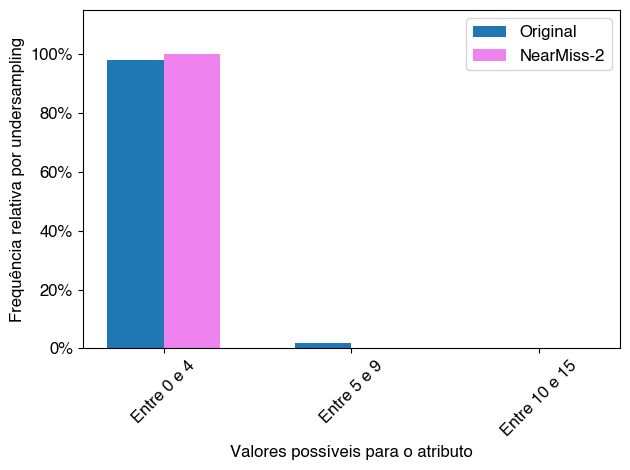

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


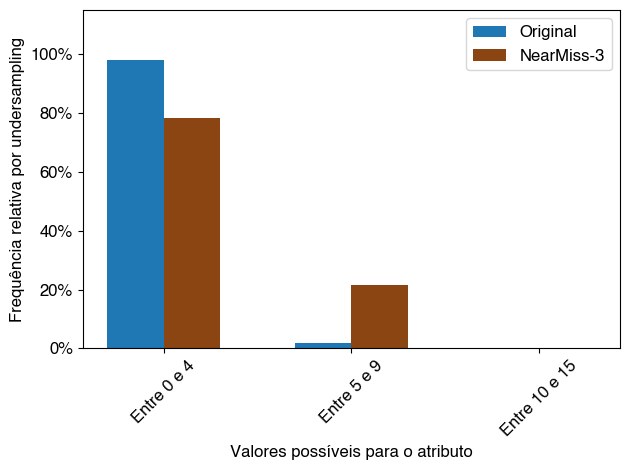

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


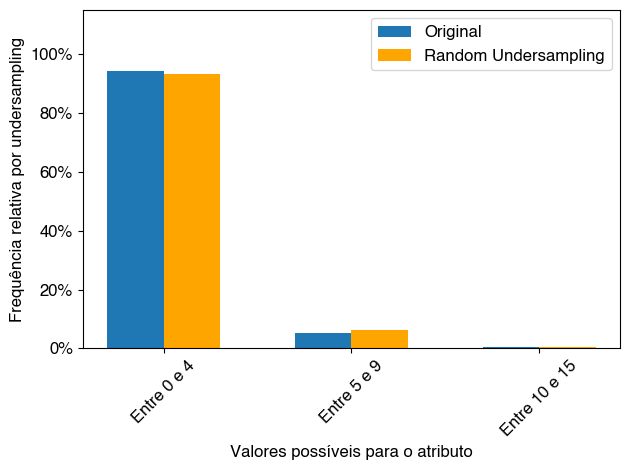

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


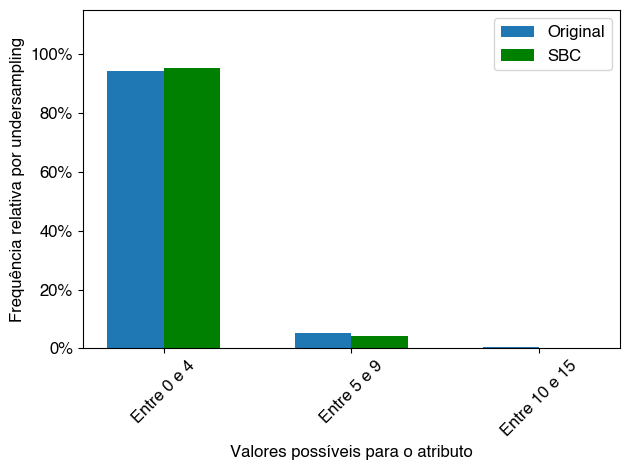

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


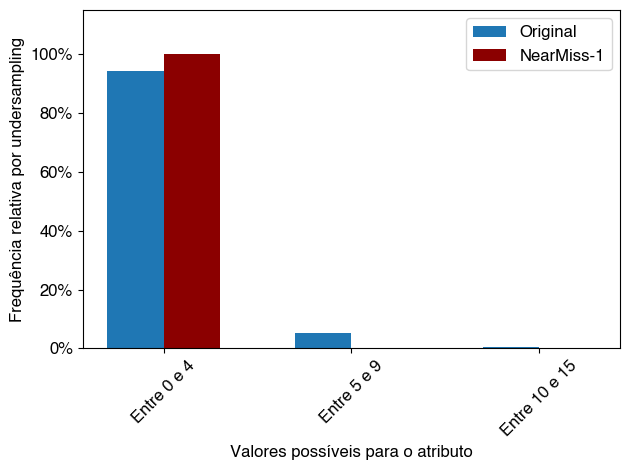

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


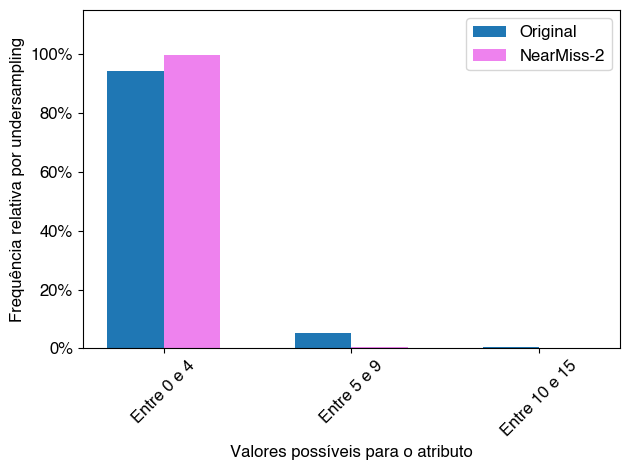

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


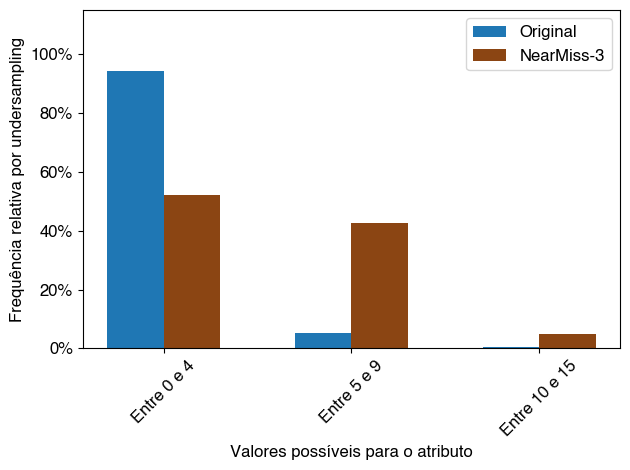

['Não', 'Sim']


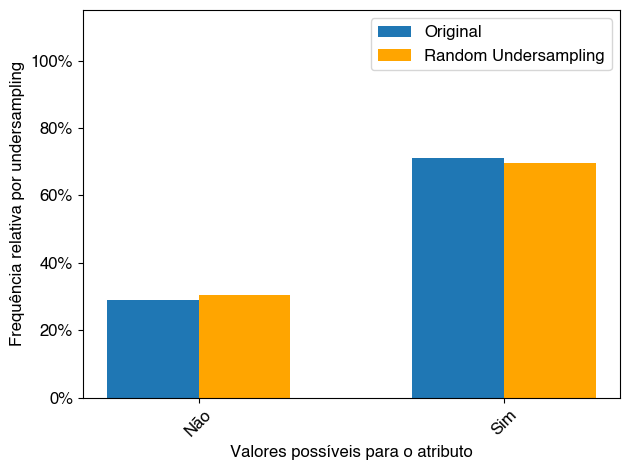

['Não', 'Sim']


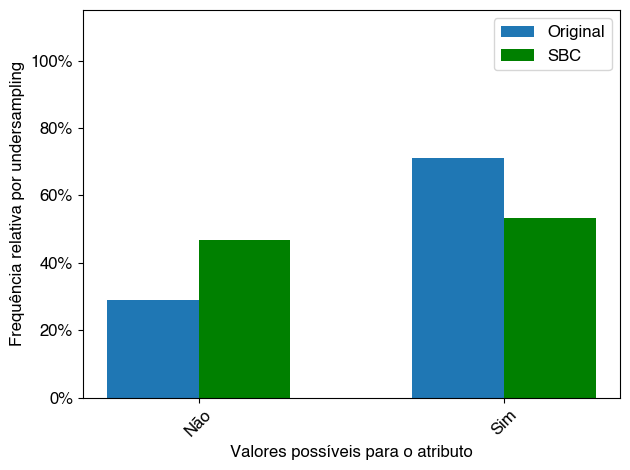

['Não', 'Sim']


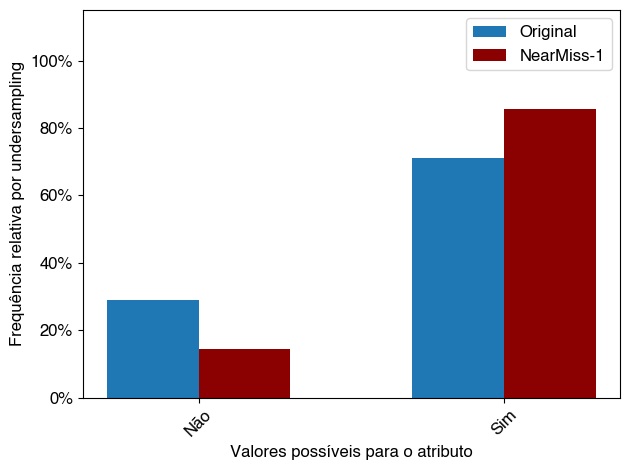

['Não', 'Sim']


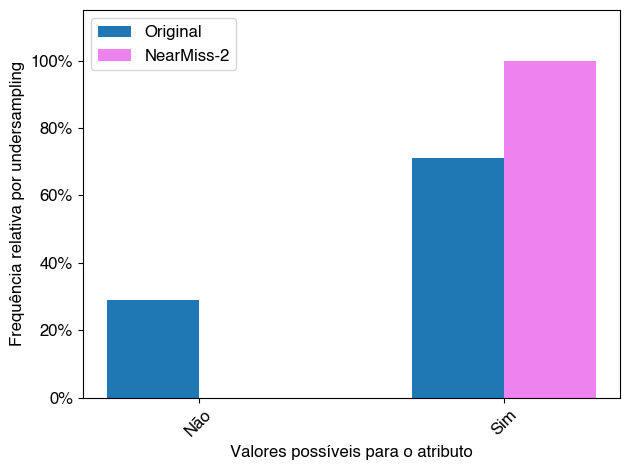

['Não', 'Sim']


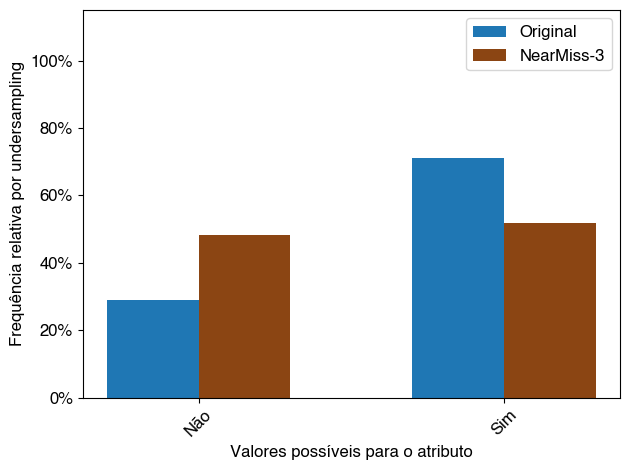

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


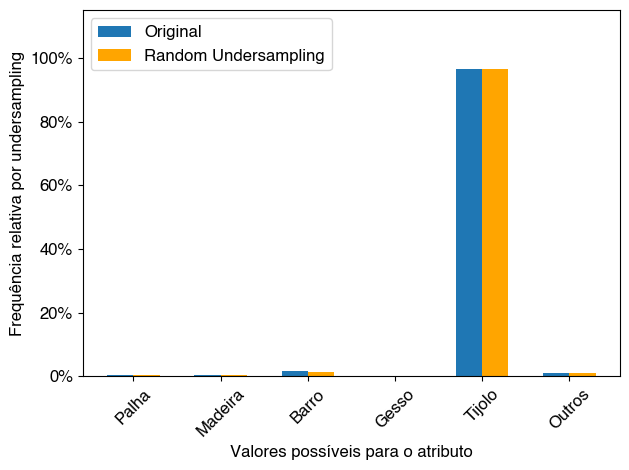

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


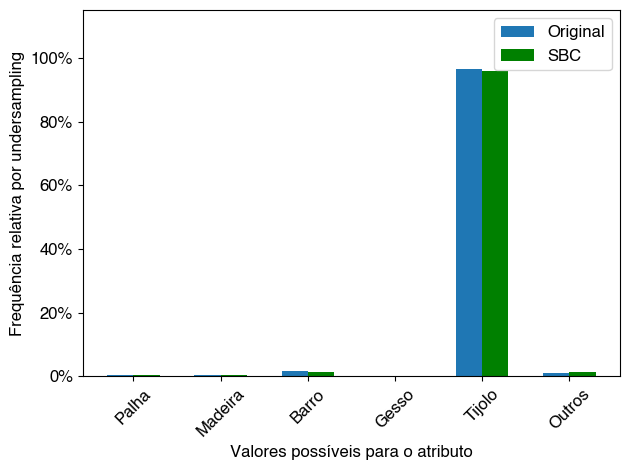

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


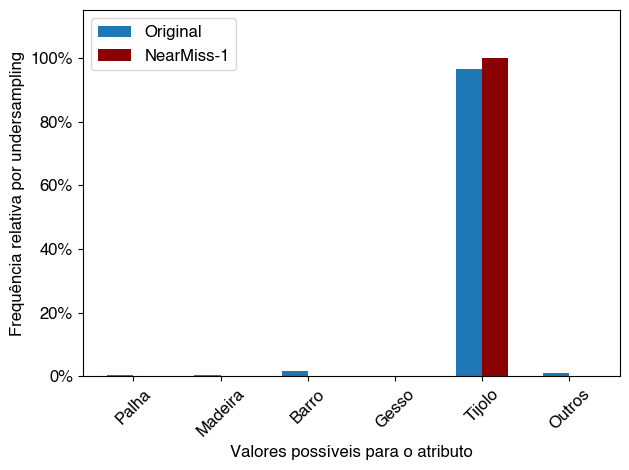

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


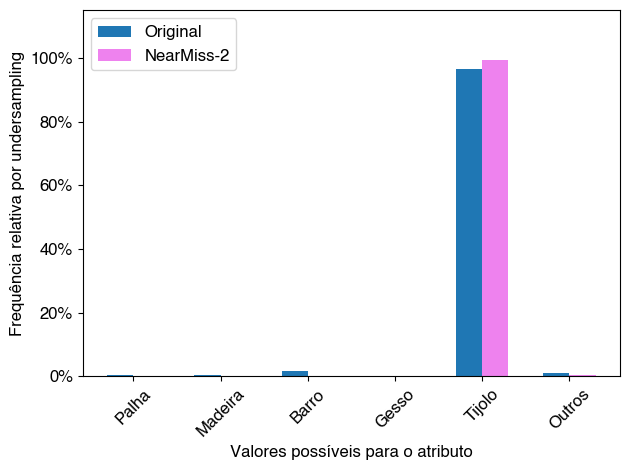

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


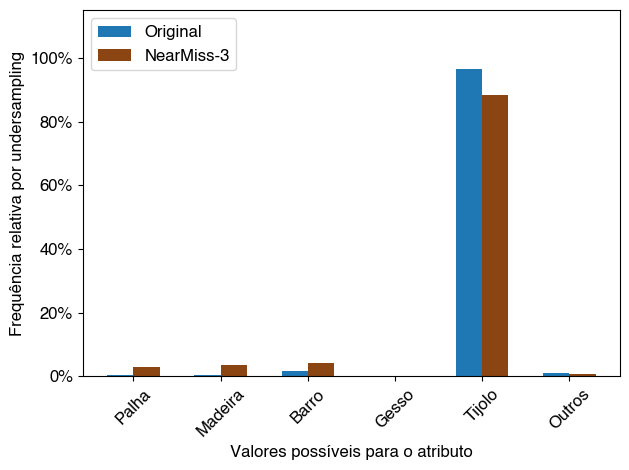

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


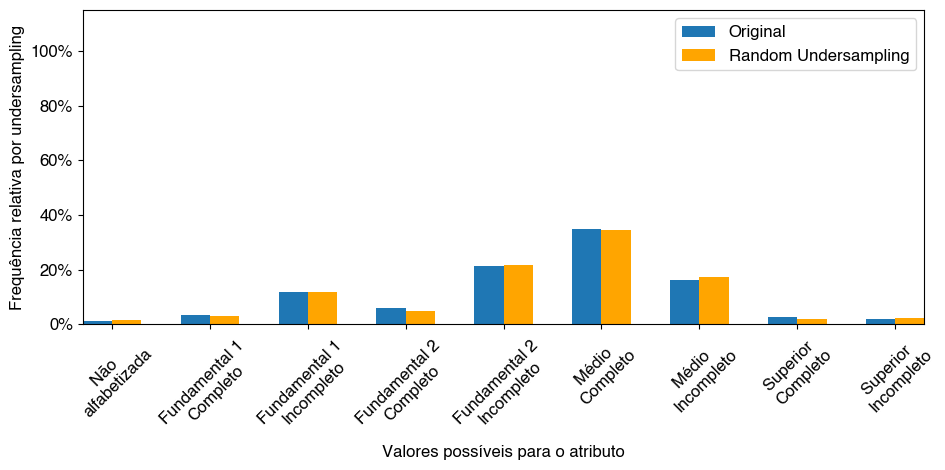

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


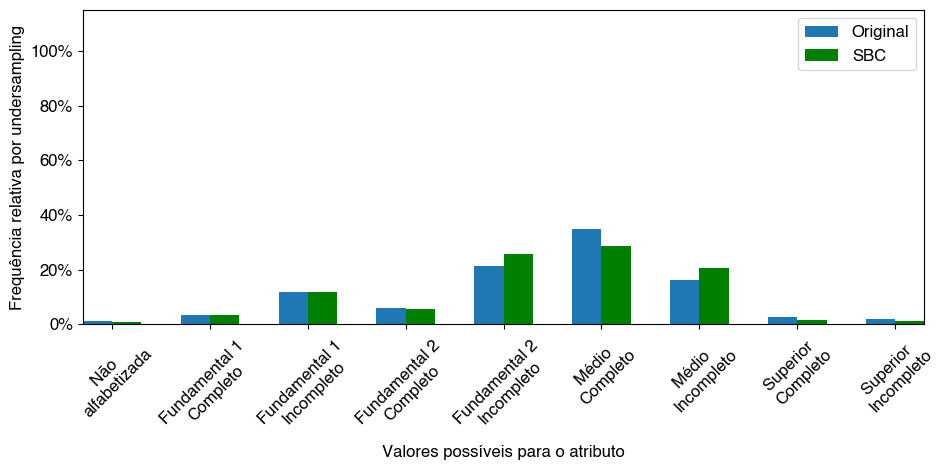

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


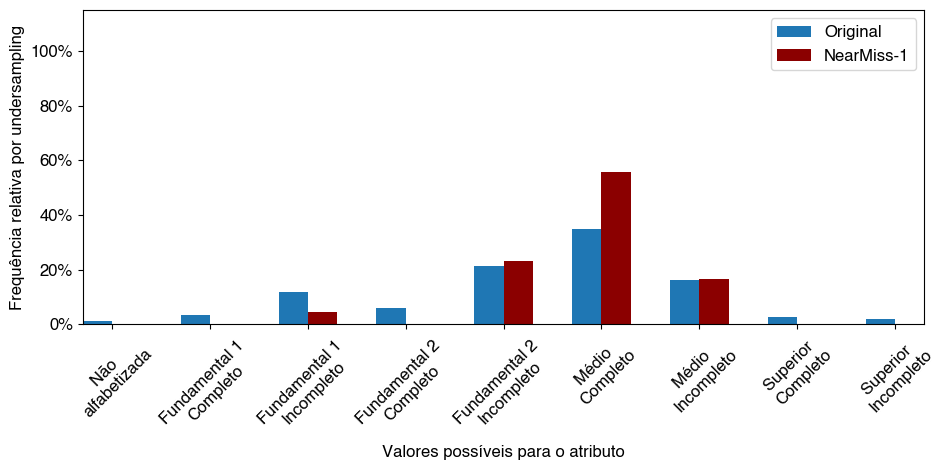

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


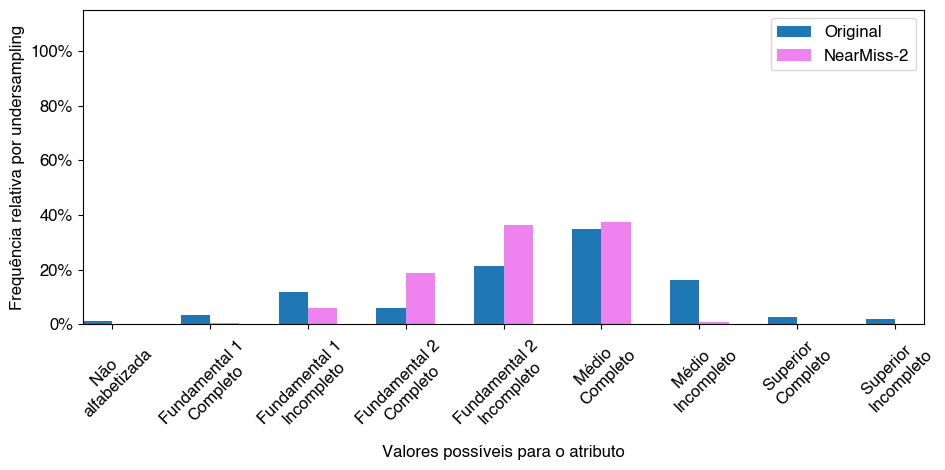

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


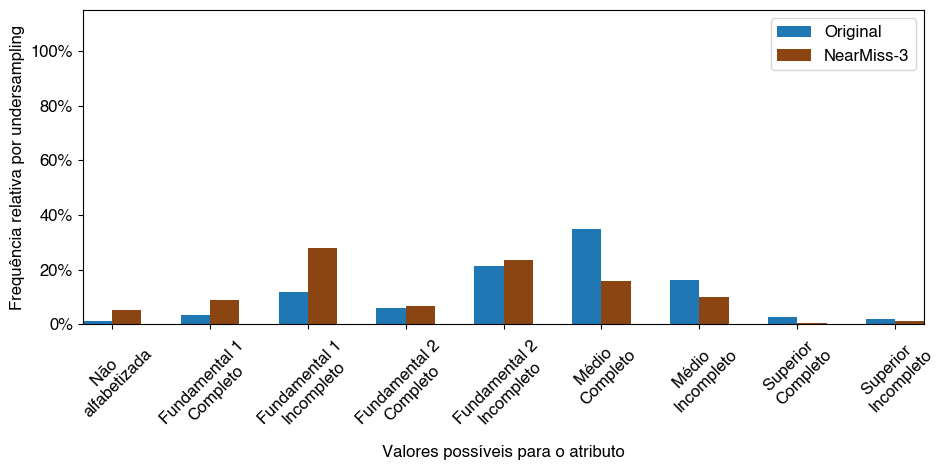

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


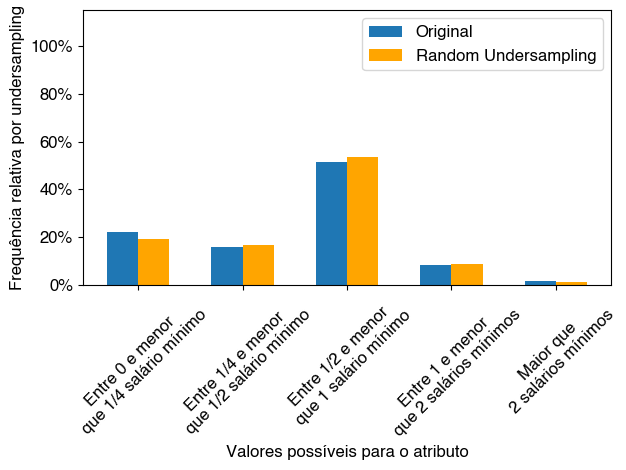

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


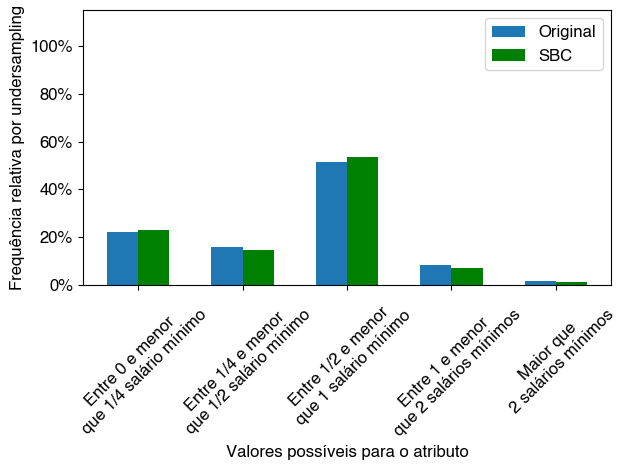

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


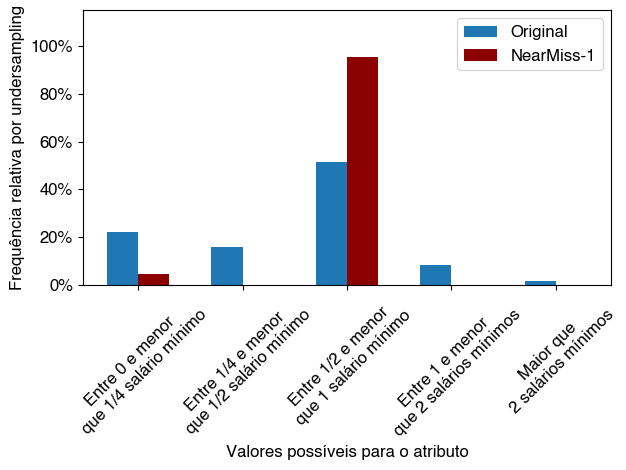

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


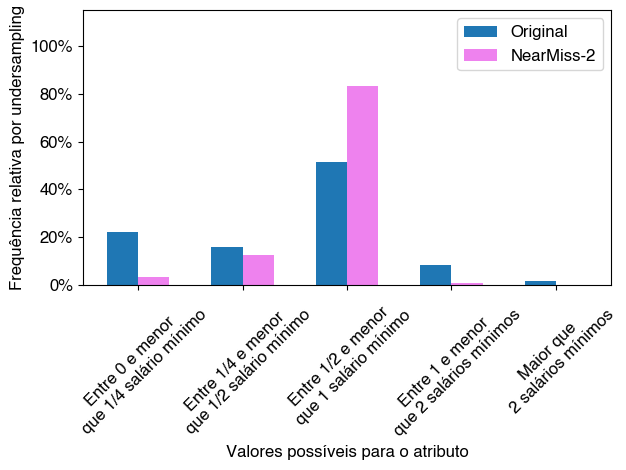

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


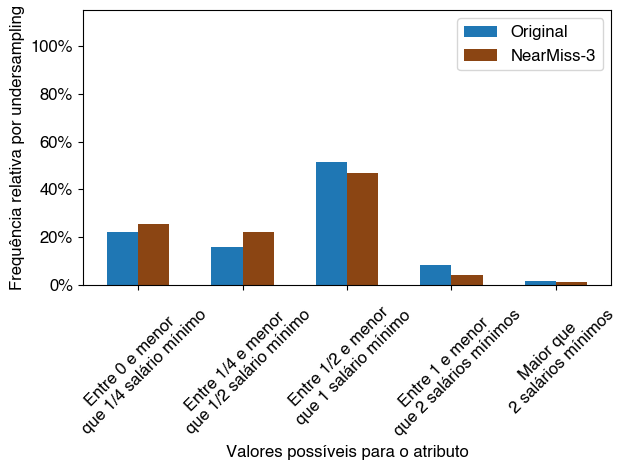

['Mãe \nAdolescente', 'Mãe \nAdulta']


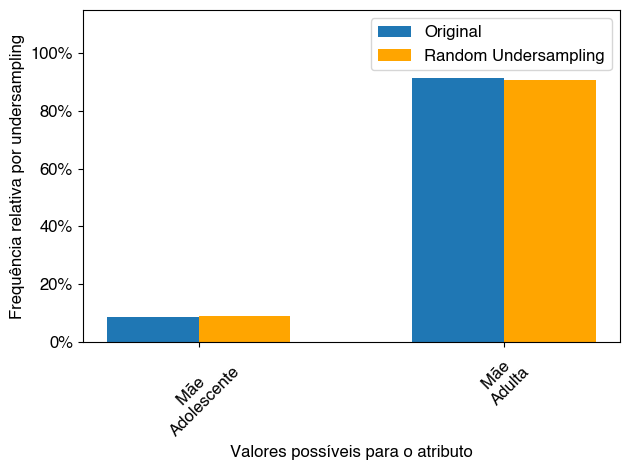

['Mãe \nAdolescente', 'Mãe \nAdulta']


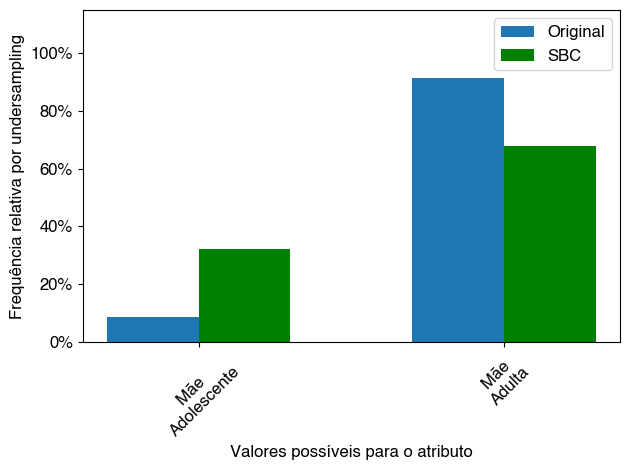

['Mãe \nAdolescente', 'Mãe \nAdulta']


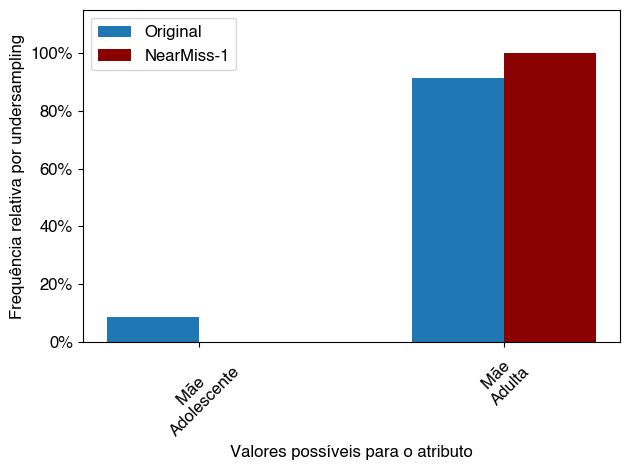

['Mãe \nAdolescente', 'Mãe \nAdulta']


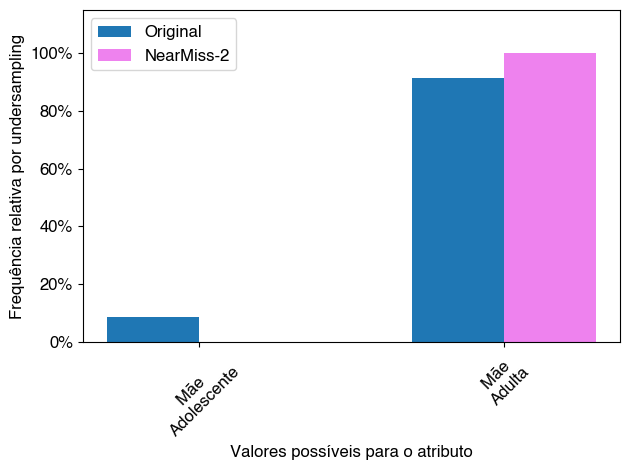

['Mãe \nAdolescente', 'Mãe \nAdulta']


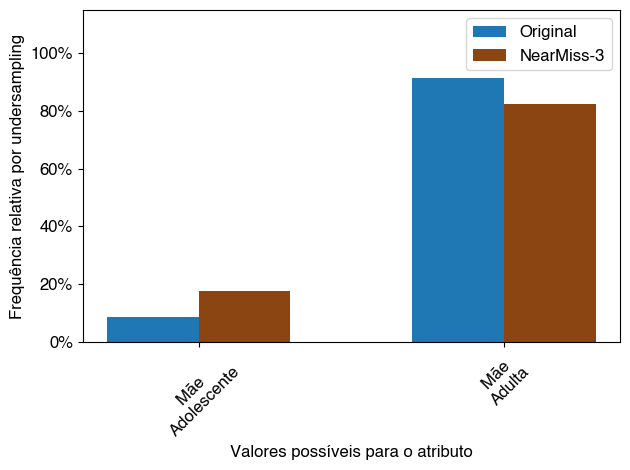

xgboost
['Negativo']


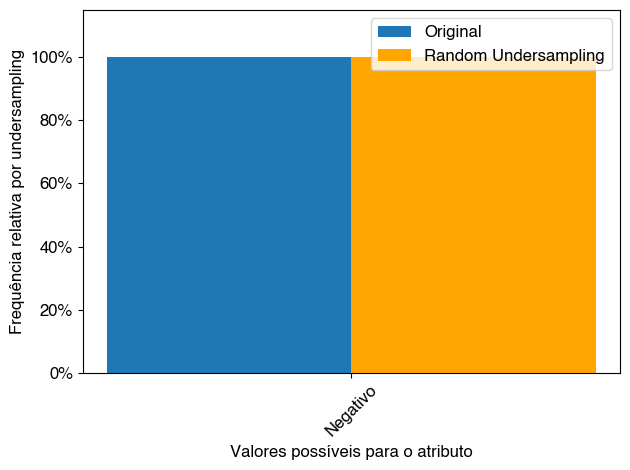

['Negativo']


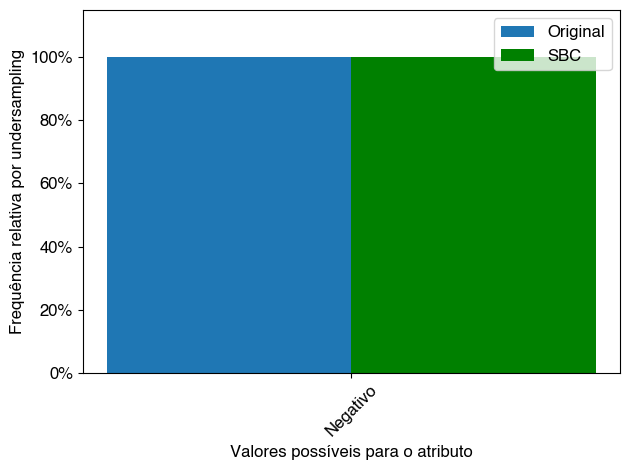

['Negativo']


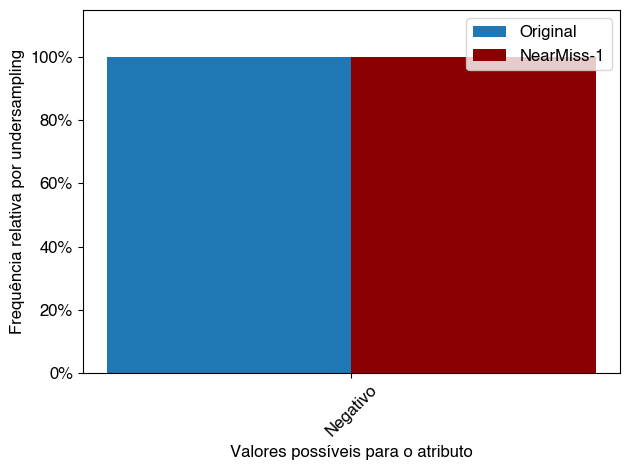

['Negativo']


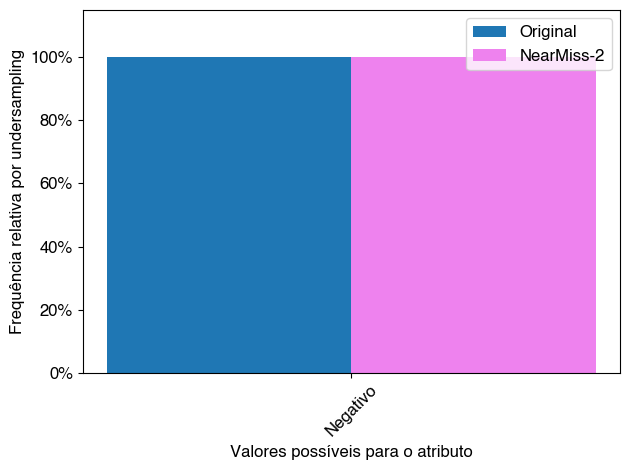

['Negativo']


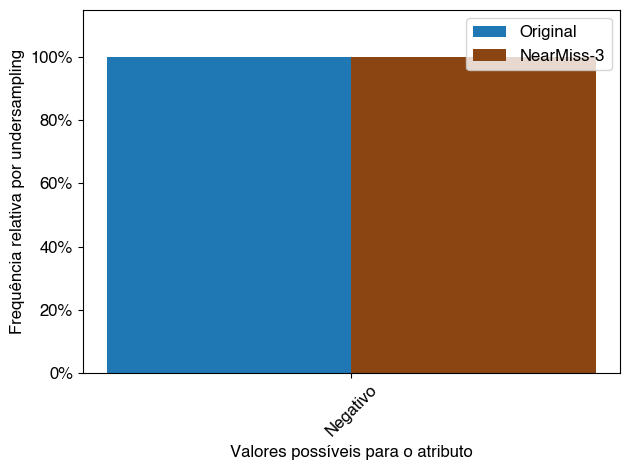

['Não Informado', 'Habitual', 'Alto']


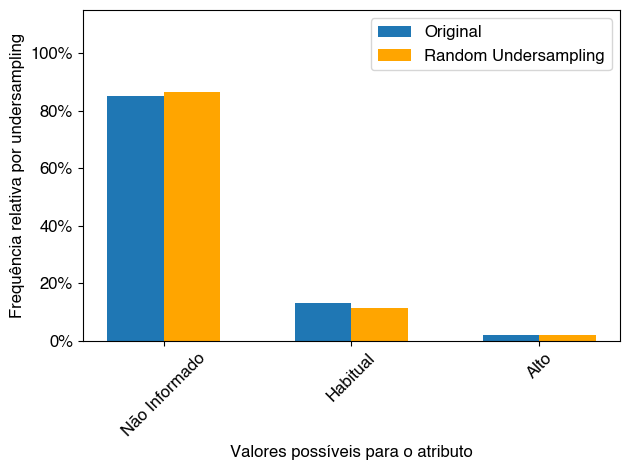

['Não Informado', 'Habitual', 'Alto']


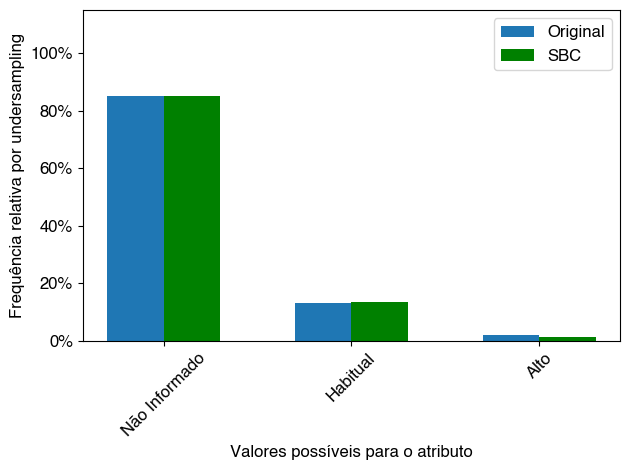

['Não Informado', 'Habitual', 'Alto']


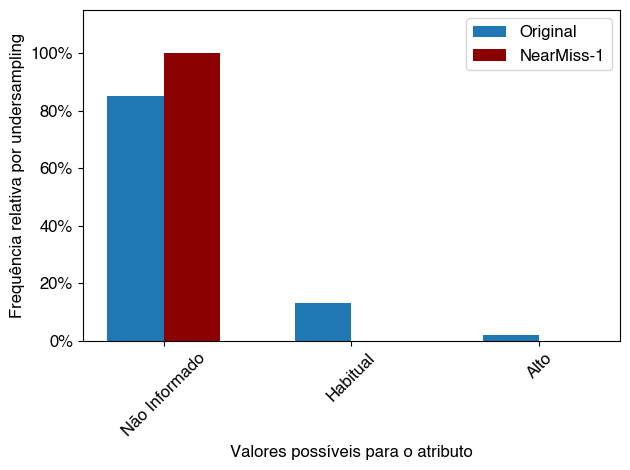

['Não Informado', 'Habitual', 'Alto']


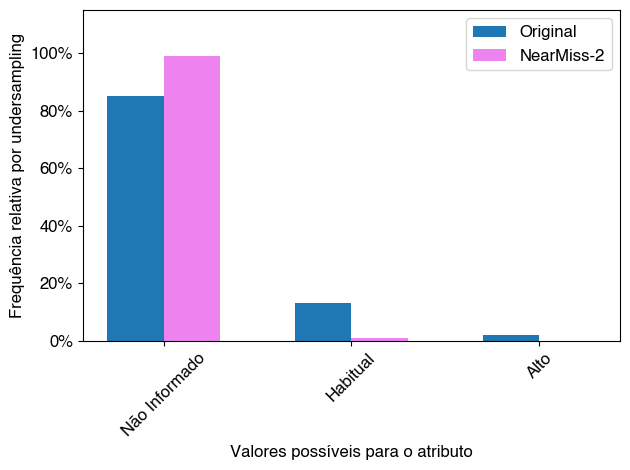

['Não Informado', 'Habitual', 'Alto']


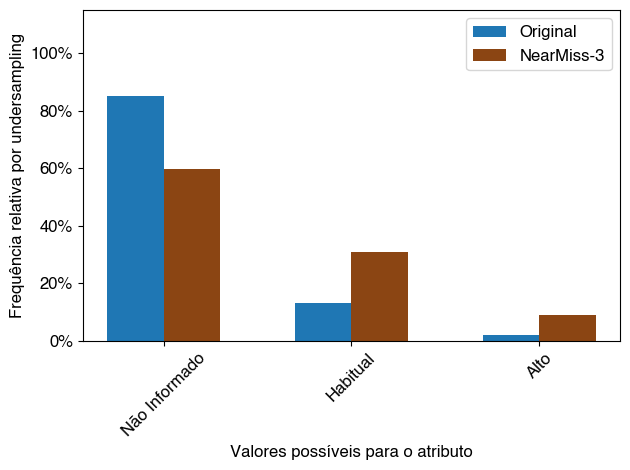

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


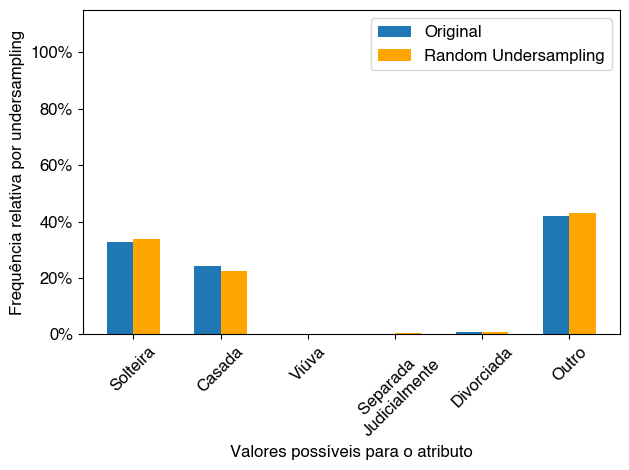

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


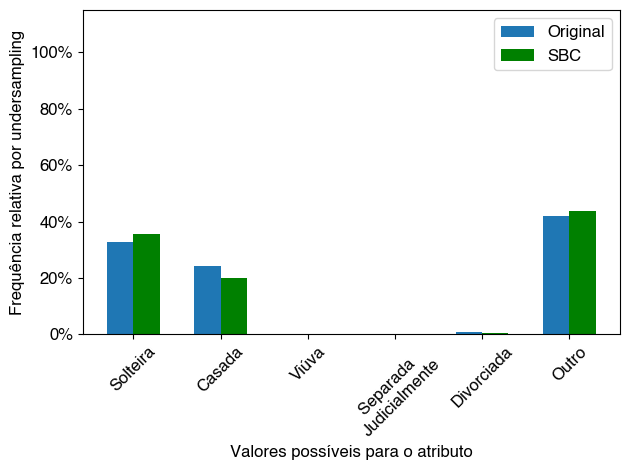

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


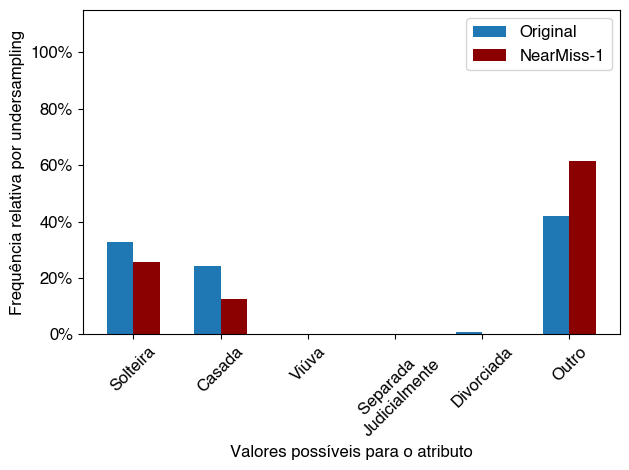

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


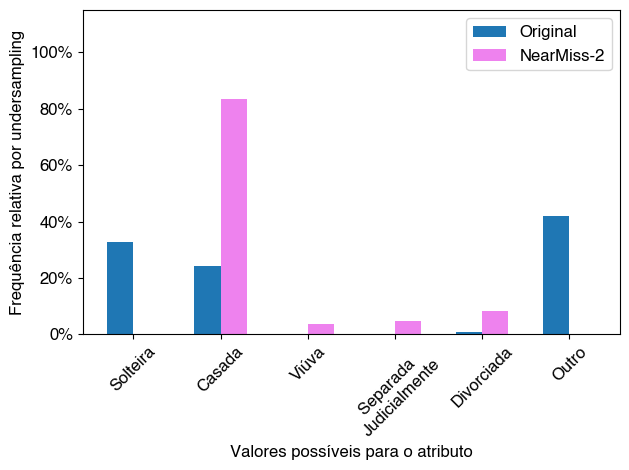

['Solteira', 'Casada', 'Viúva', 'Separada \nJudicialmente', 'Divorciada', 'Outro']


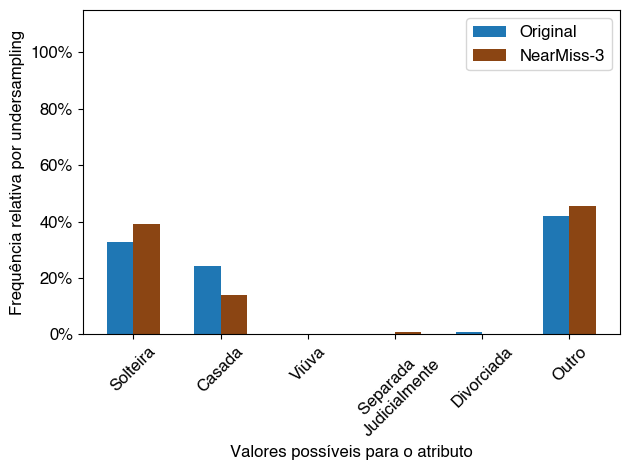

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


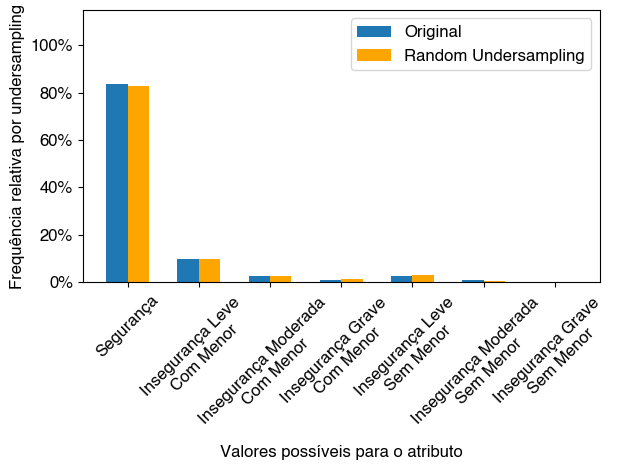

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


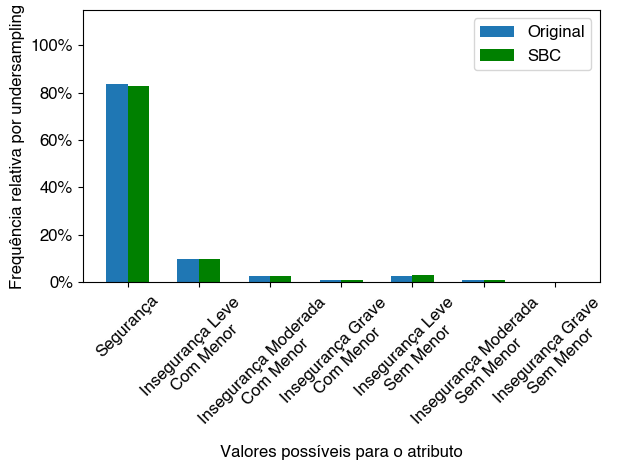

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


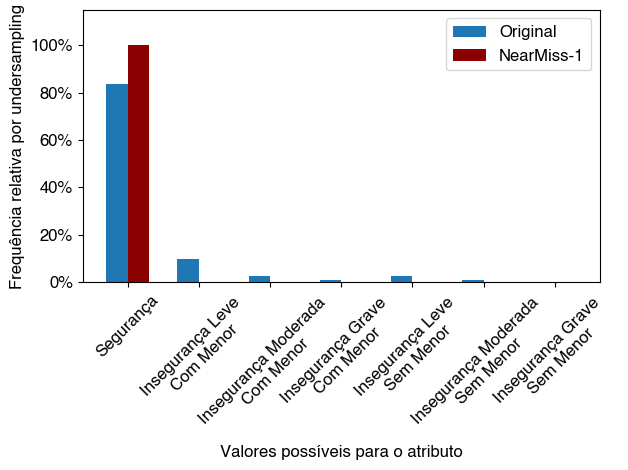

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


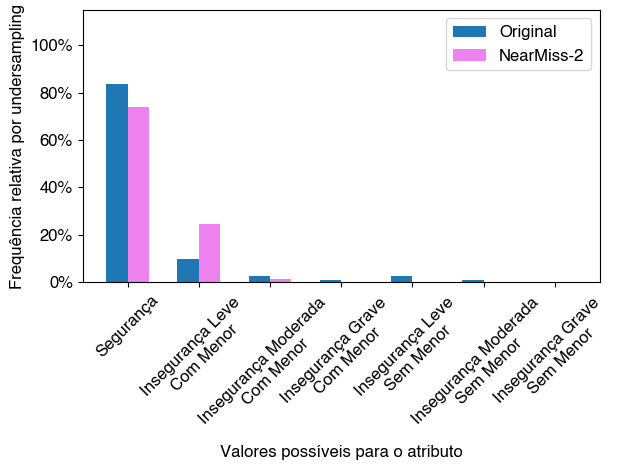

['Segurança', 'Insegurança Leve \nCom Menor', 'Insegurança Moderada \nCom Menor', 'Insegurança Grave \nCom Menor', 'Insegurança Leve \nSem Menor', 'Insegurança Moderada \nSem Menor', 'Insegurança Grave \nSem Menor']


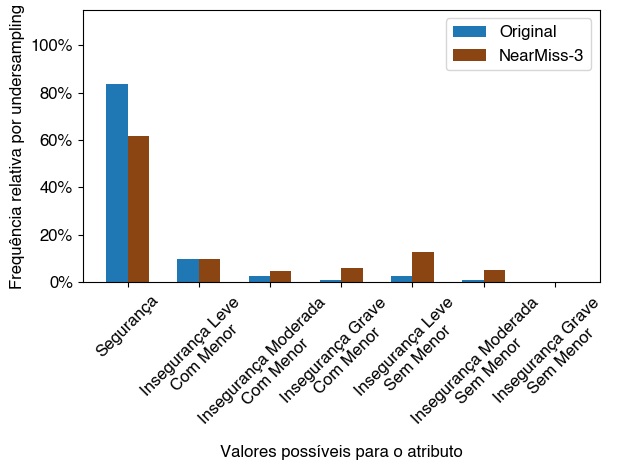

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


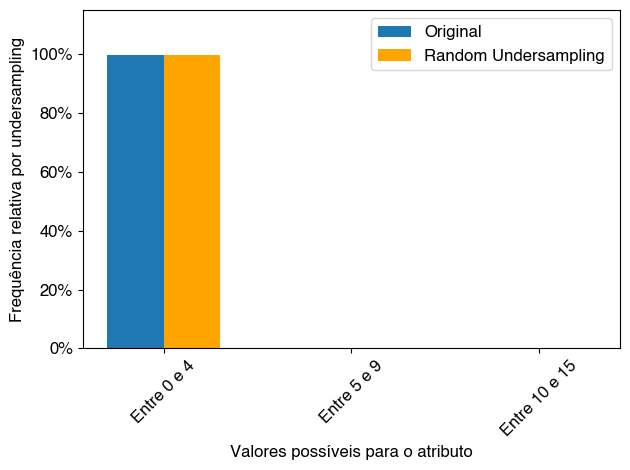

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


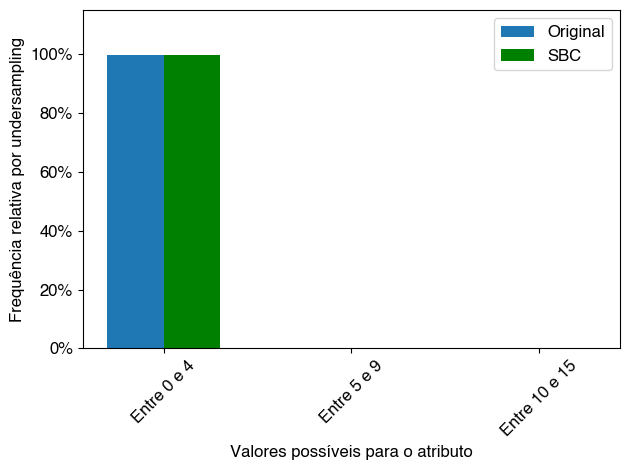

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


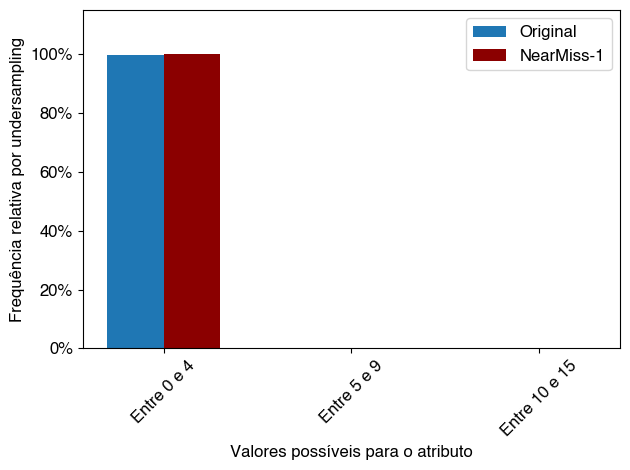

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


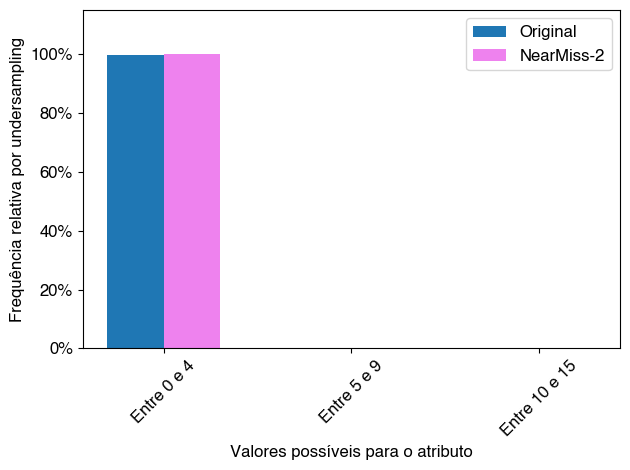

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


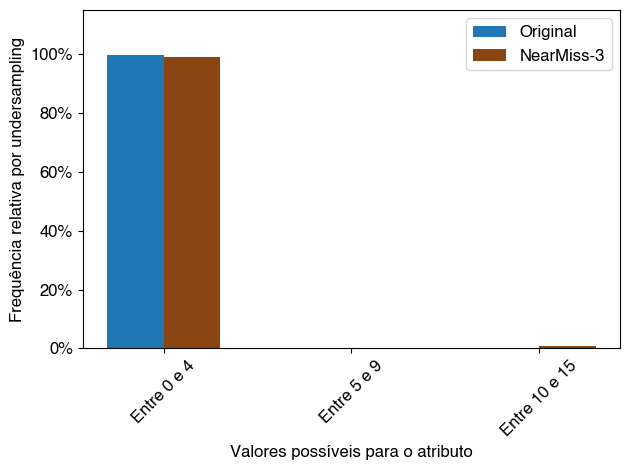

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


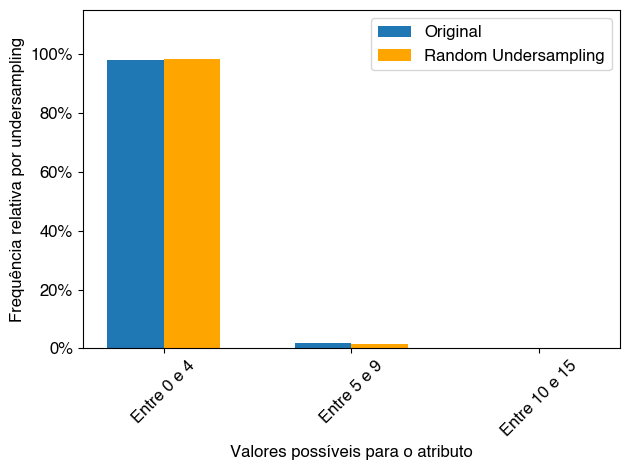

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


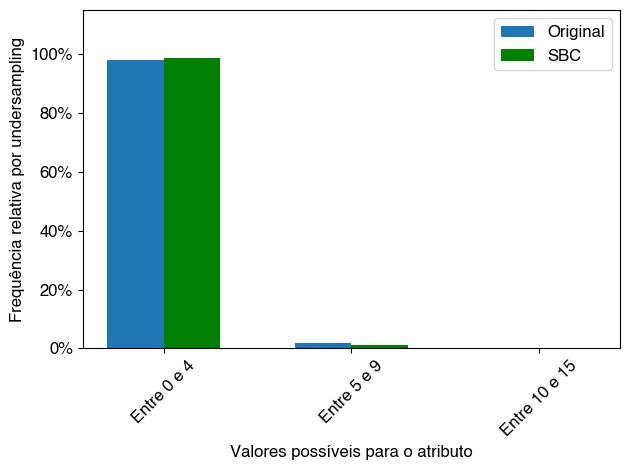

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


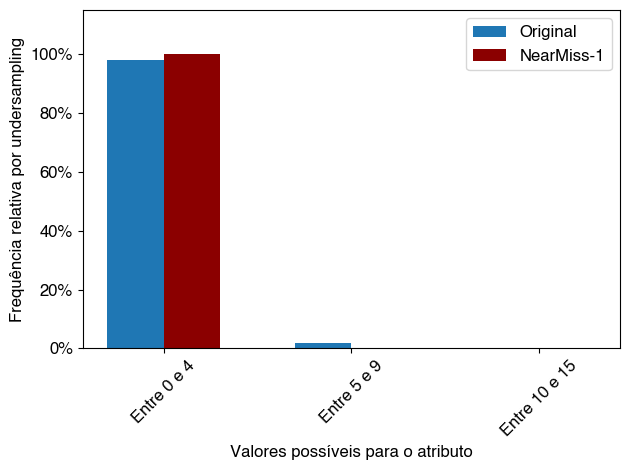

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


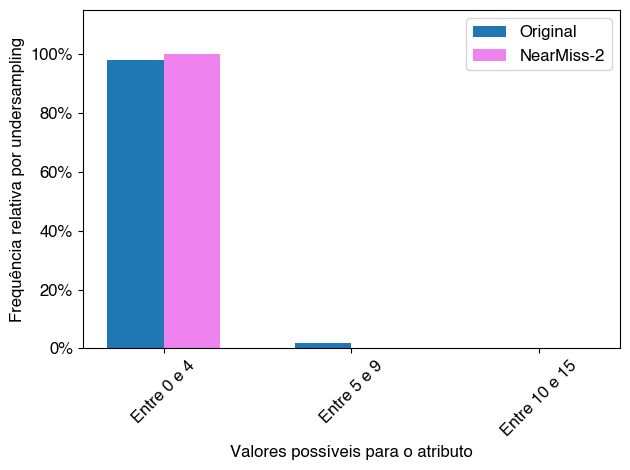

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


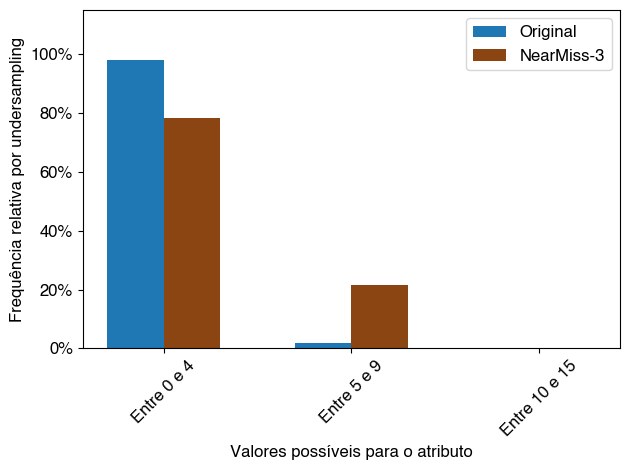

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


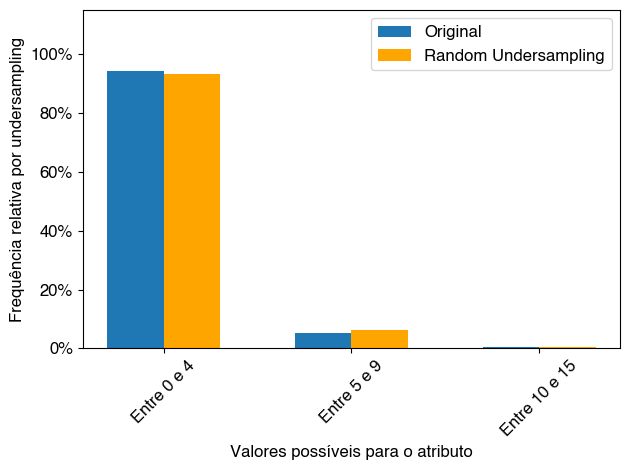

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


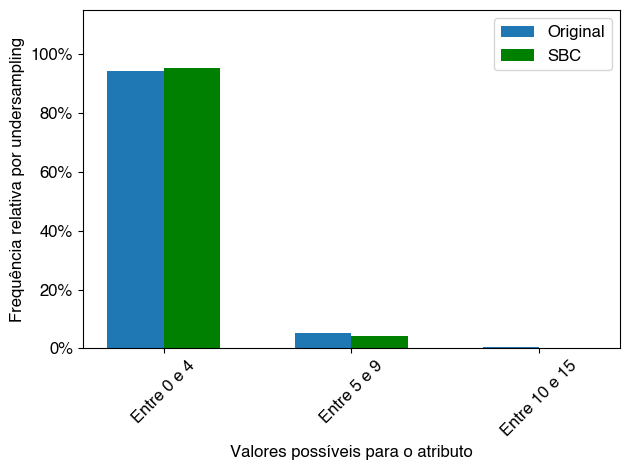

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


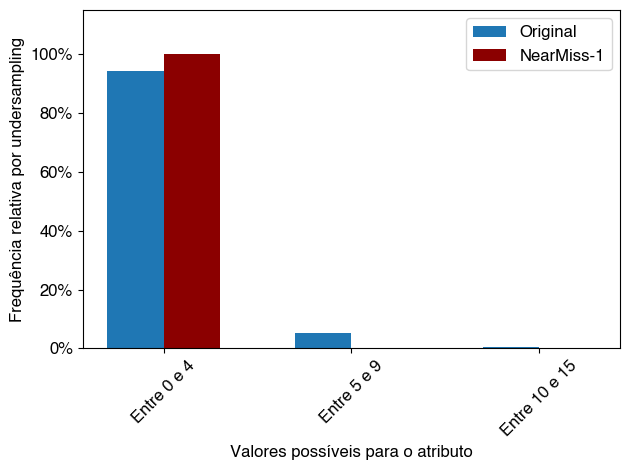

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


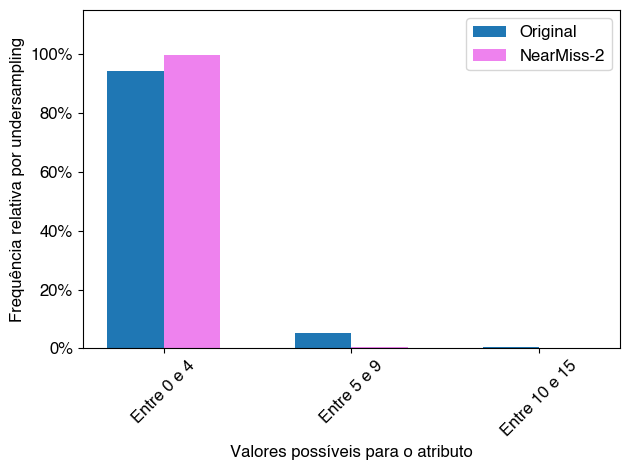

['Entre 0 e 4', 'Entre 5 e 9', 'Entre 10 e 15']


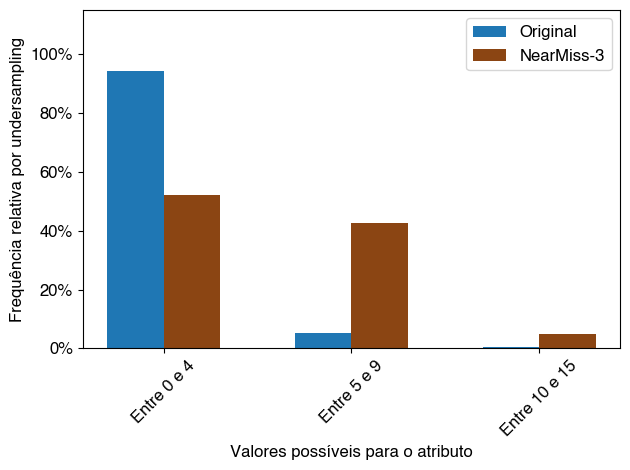

['Não', 'Sim']


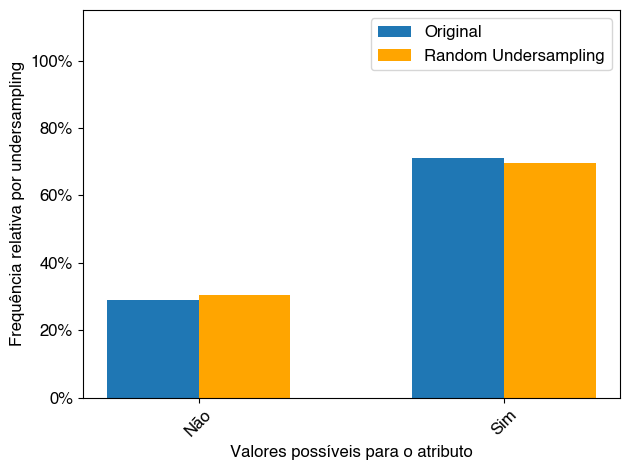

['Não', 'Sim']


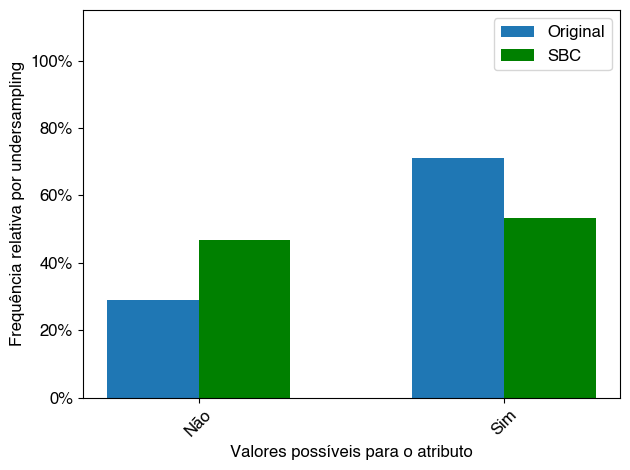

['Não', 'Sim']


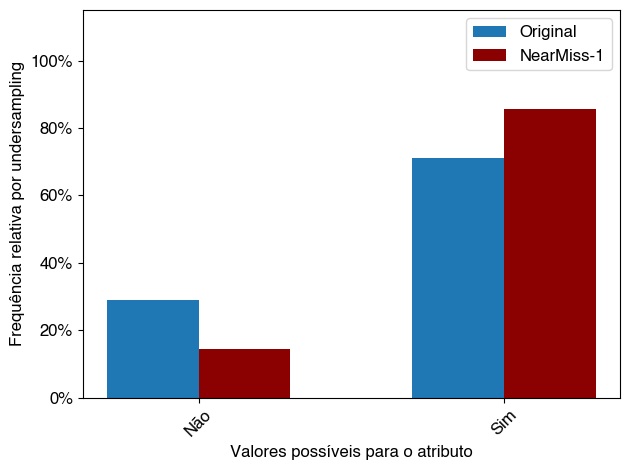

['Não', 'Sim']


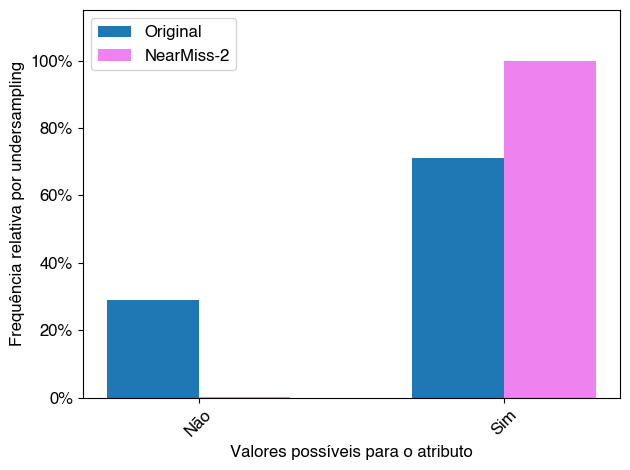

['Não', 'Sim']


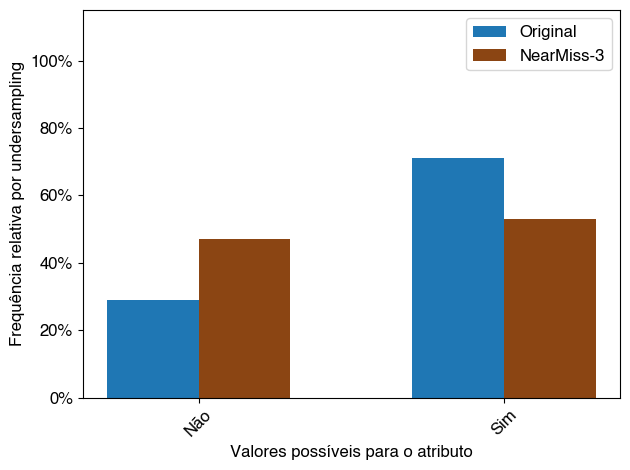

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


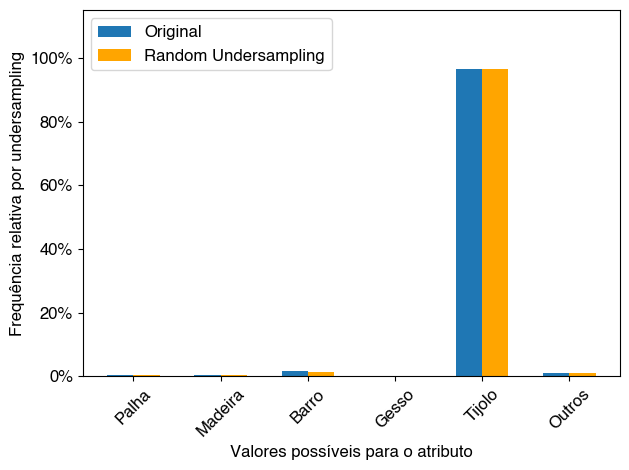

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


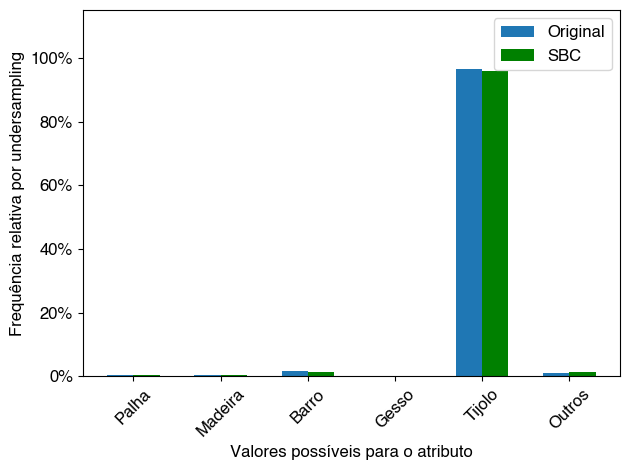

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


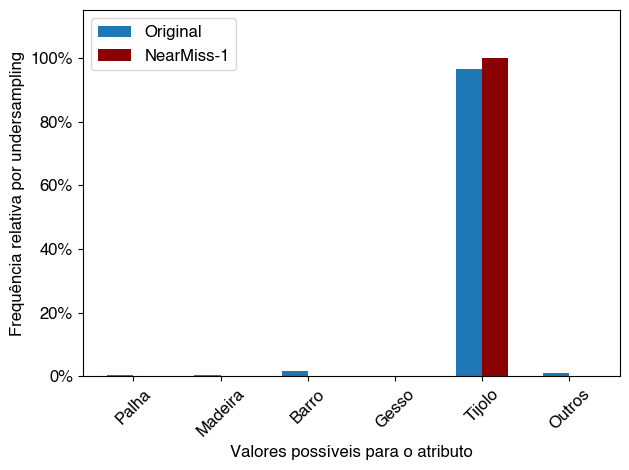

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


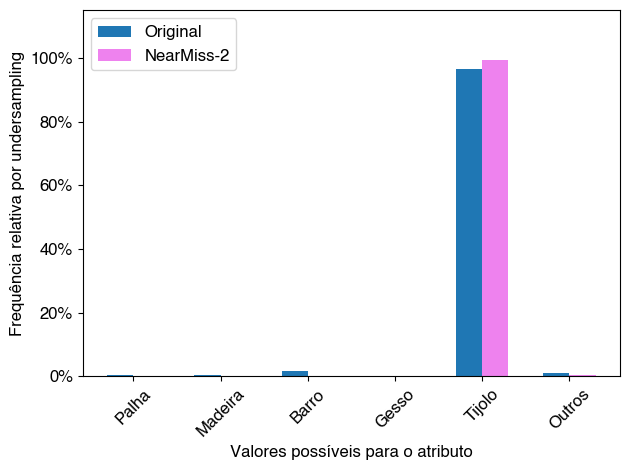

['Palha', 'Madeira', 'Barro', 'Gesso', 'Tijolo', 'Outros']


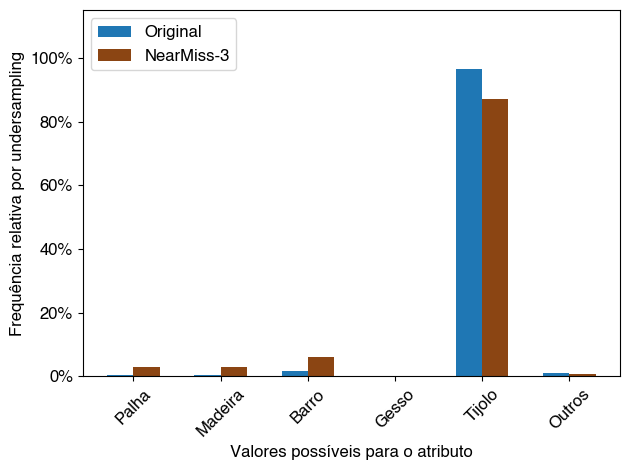

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


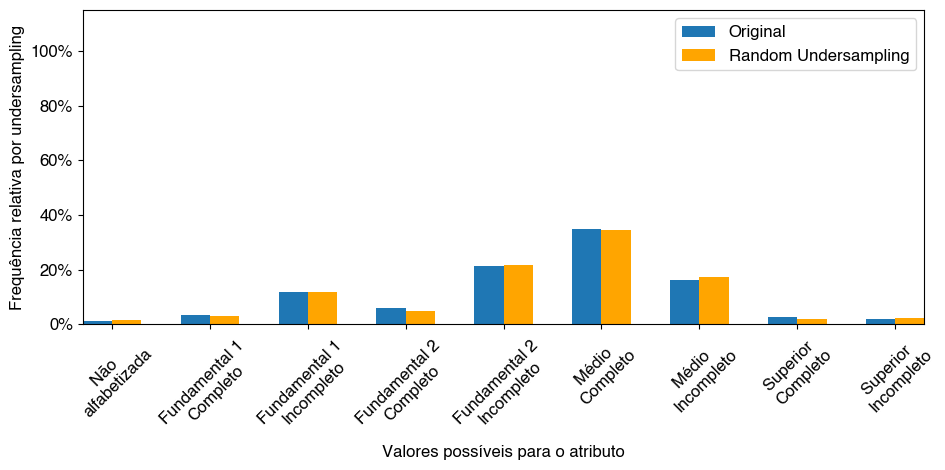

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


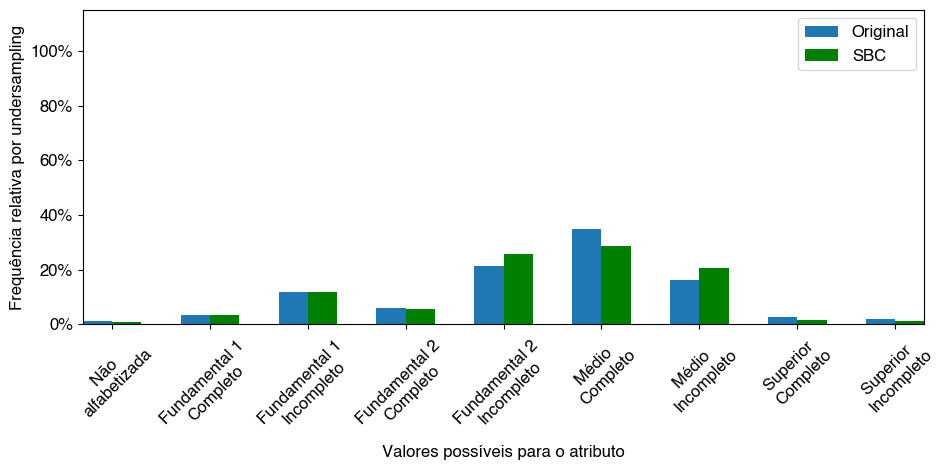

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


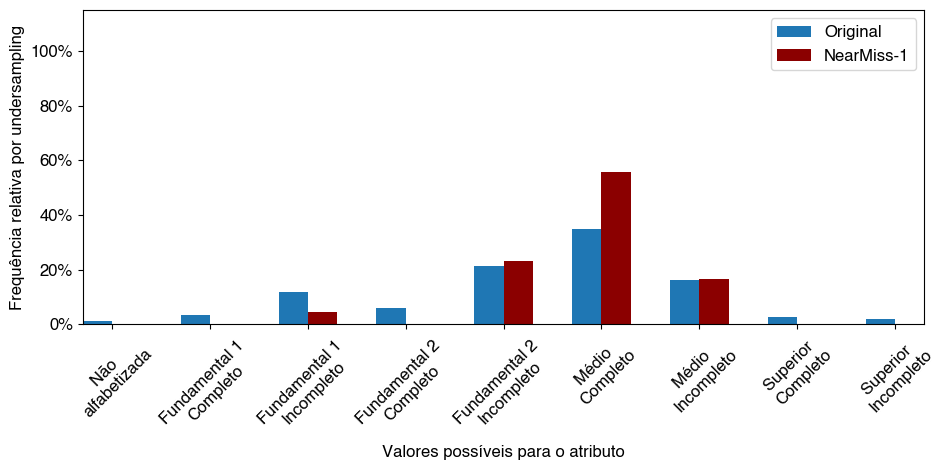

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


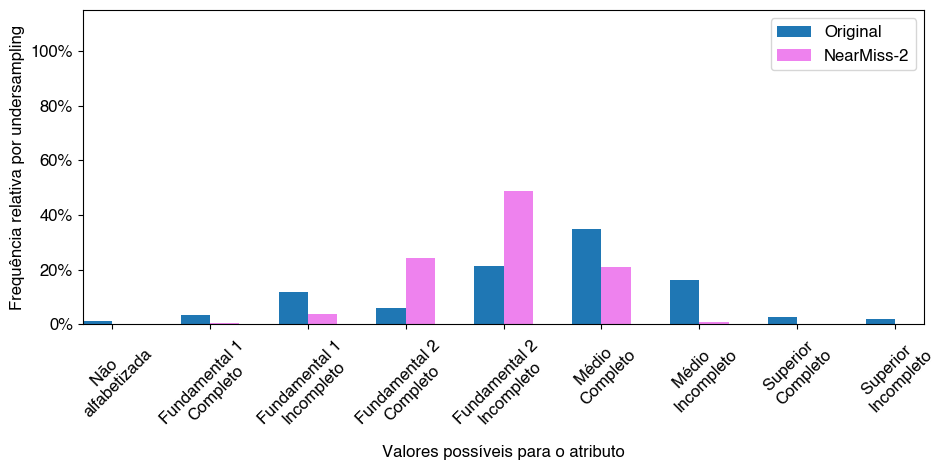

['Não \nalfabetizada', 'Fundamental 1 \nCompleto', 'Fundamental 1 \nIncompleto', 'Fundamental 2 \nCompleto', 'Fundamental 2 \nIncompleto', 'Médio \nCompleto', 'Médio \nIncompleto', 'Superior \nCompleto', 'Superior \nIncompleto']


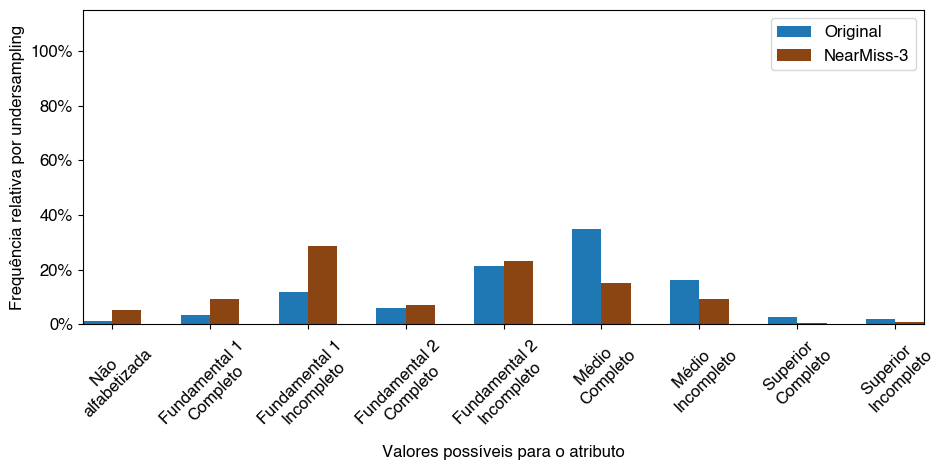

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


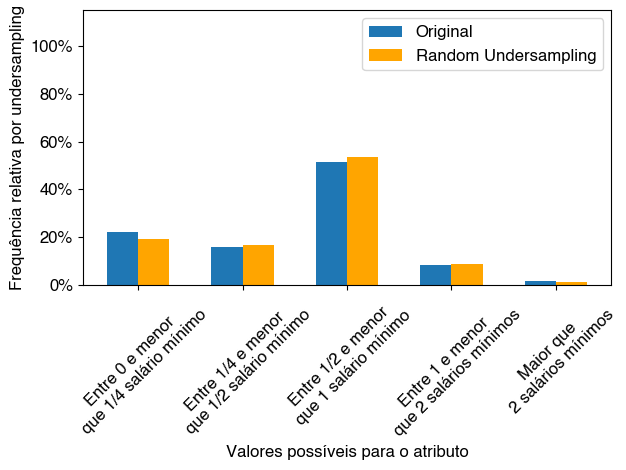

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


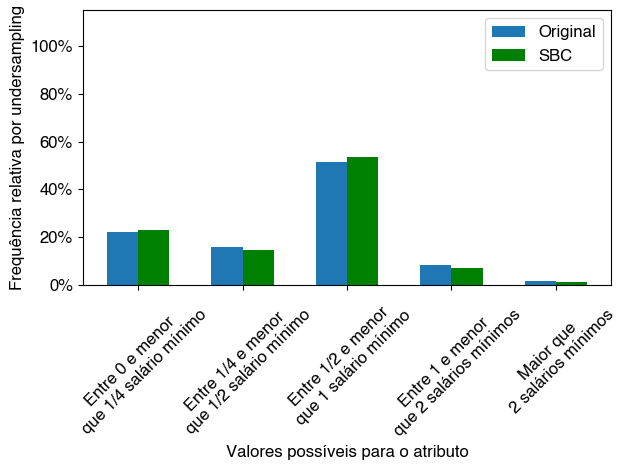

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


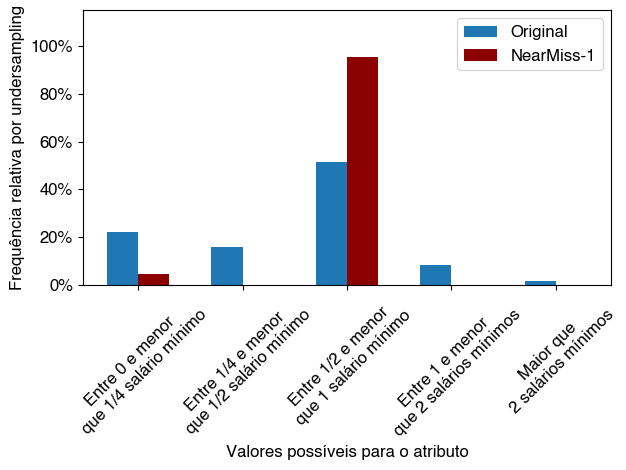

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


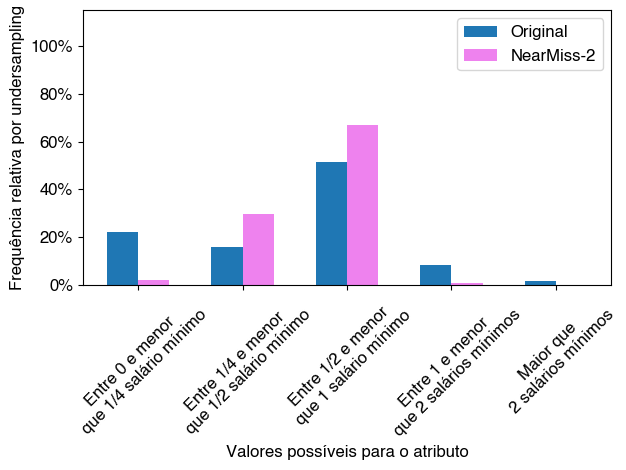

['Entre 0 e menor \nque 1/4 salário mínimo', 'Entre 1/4 e menor \nque 1/2 salário mínimo', 'Entre 1/2 e menor \nque 1 salário mínimo', 'Entre 1 e menor \nque 2 salários mínimos', 'Maior que \n2 salários mínimos']


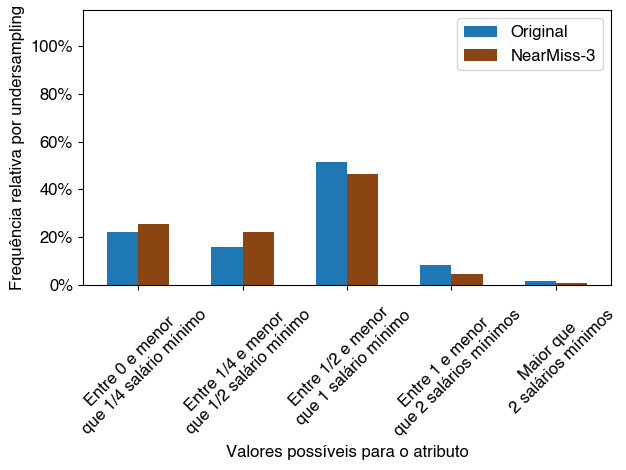

['Mãe \nAdolescente', 'Mãe \nAdulta']


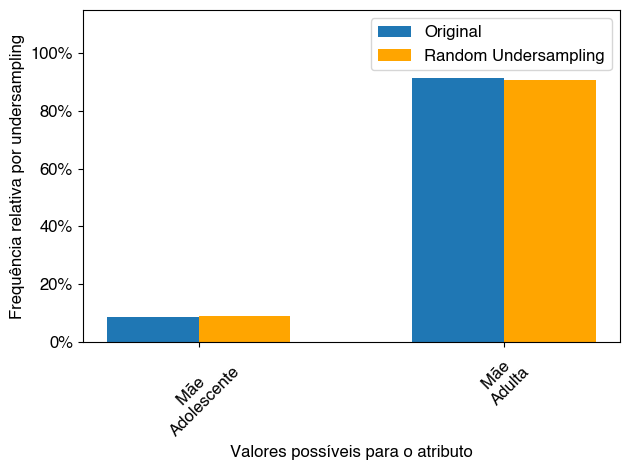

['Mãe \nAdolescente', 'Mãe \nAdulta']


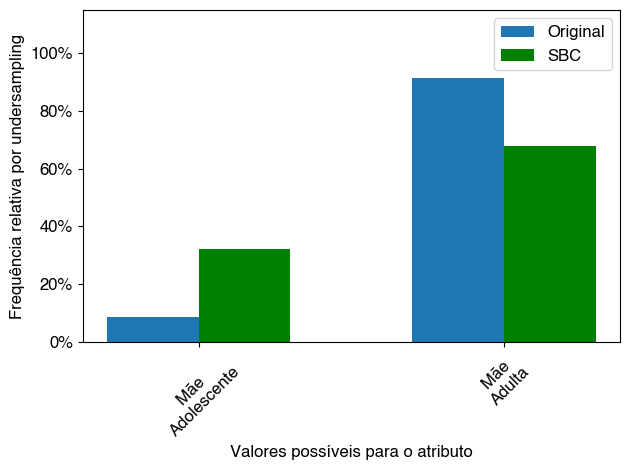

['Mãe \nAdolescente', 'Mãe \nAdulta']


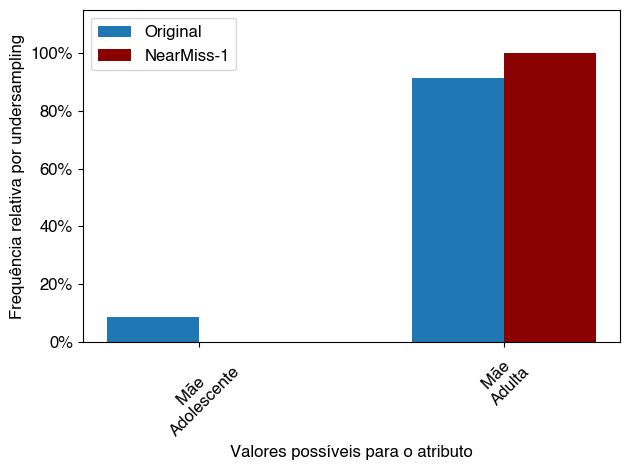

['Mãe \nAdolescente', 'Mãe \nAdulta']


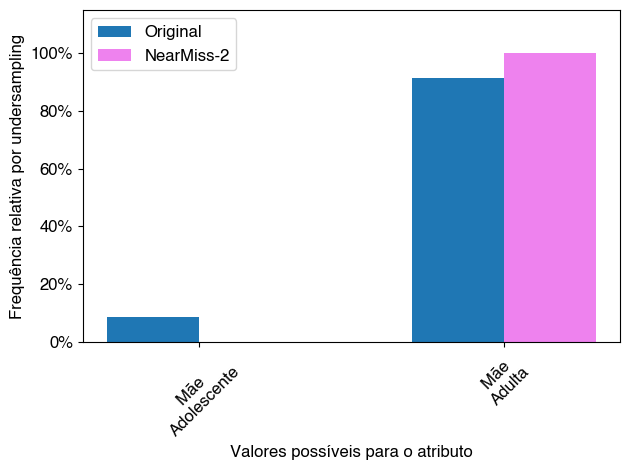

['Mãe \nAdolescente', 'Mãe \nAdulta']


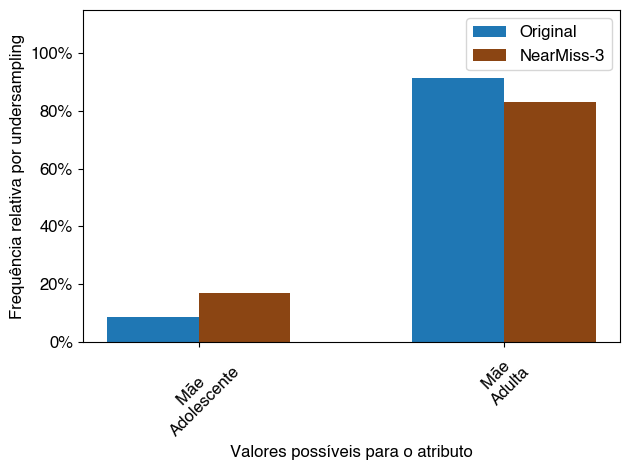

In [ ]:
getting_bases_with_best_results_by_model()